# ML BASED SEARCH ENGINE ON STACKOVERFLOW DATA : 

## Problem : 
<br>
We have Stackoverflow database (https://www.kaggle.com/c/facebook-recruiting-iii-keyword-extraction/data), And we have to built a search engine. <br><br>
A user will take a query related to the programming questions related to JAVA, C, C++ and C# and our search engine will return the similiar queries that are in our database by use of NLP and ML. <br><br>

We here are focus mainly in the Search engine characteristics rather than the UI in which result will be given.

## DATA SET : 
We have mainly 3 fields
1. The title
2. The Tags
3. The Body


What We Want?<br>
We want that after entering a title we get various results related to our query from which we can navigate to our body of title.

We will enter a query example 


## CONSTRAINTS : 
The data we have is in CSV format and has size of 7.2 GB and my machine has only 8GB RAM, So how its gonna work out?<br>
We are gonna use Sqlite3 to access our data.



In [1]:
import warnings
warnings.filterwarnings("ignore")
import pandas as pd
import sqlite3
import csv
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from wordcloud import WordCloud
import re
import os
from sqlalchemy import create_engine # database connection
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem.snowball import SnowballStemmer
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn import metrics
from sklearn.metrics import f1_score,precision_score,recall_score
from datetime import datetime

ModuleNotFoundError: No module named 'pandas'

In [ ]:
if not os.path.isfile('train.db'):
    start = datetime.now()
    disk_engine = create_engine('sqlite:///train.db')
    start = datetime.now()
    chunksize = 180000
    j = 0
    index_start = 1
    for df in pd.read_csv('dataset/Train.csv', names=['Id', 'Title', 'Body', 'Tags'], chunksize=chunksize, iterator=True, encoding='utf-8', ):
        df.index += index_start
        j+=1
        print('{} rows'.format(j*chunksize))
        df.to_sql('data', disk_engine, if_exists='append')
        index_start = df.index[-1] + 1
    print("Time taken to run this cell :", datetime.now() - start)

180000 rows
360000 rows
540000 rows
720000 rows
900000 rows
1080000 rows
1260000 rows
1440000 rows
1620000 rows
1800000 rows
1980000 rows
2160000 rows
2340000 rows
2520000 rows
2700000 rows
2880000 rows
3060000 rows
3240000 rows
3420000 rows
3600000 rows
3780000 rows
3960000 rows
4140000 rows
4320000 rows
4500000 rows
4680000 rows
4860000 rows
5040000 rows
5220000 rows
5400000 rows
5580000 rows
5760000 rows
5940000 rows
6120000 rows
Time taken to run this cell : 0:03:30.837546


In [ ]:
con = sqlite3.connect('train.db')
count = pd.read_sql_query("""SELECT count(*) FROM data""", con)
print("Total number of rows in our database is : ", count["count(*)"])

Total number of rows in our database is :  0    6034196
Name: count(*), dtype: int64


That means we have around 6M Datapoints <br>
Lets first remove the duplicated entries

In [ ]:
con.close()
con = sqlite3.connect('train.db')
df = pd.read_sql_query('SELECT Title, Body, Tags, COUNT(*) as cnt_dup FROM data GROUP BY Title, Body, Tags', con)
con.close()
df.head()

: 

In [ ]:
print("number of duplicate questions :", count['count(*)'].values[0]- df.shape[0],\
      "(",(1-((df.shape[0])/(count['count(*)'].values[0])))*100,"% )")


number of duplicate questions : 1827881 ( 30.292038906260256 % )


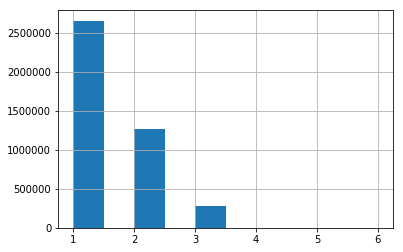

In [ ]:
df.cnt_dup.hist()

In [ ]:
df.cnt_dup.value_counts()

1    2656284
2    1272336
3     277575
4         90
5         25
6          5
Name: cnt_dup, dtype: int64

In [ ]:
# So in real there are around 2.6M Data points which are our concern, Lets save them

In [ ]:
del count

In [ ]:
df = df[df.cnt_dup < 2]

In [ ]:
# Now we want to make a search engine for only JAVA, C, C++, C# questions. 
# So lets first find out the tags we will need
df = df.reset_index(drop=True)


In [ ]:
df.head(10)

,Title,Body,Tags,cnt_dup
0,Implementing Boundary Value Analysis of S...,<pre><code>#include&lt;iostream&gt;\n#include&...,c++ c,1
1,Dynamic Datagrid Binding in Silverlight?,<p>I should do binding for datagrid dynamicall...,c# silverlight data-binding,1
2,Dynamic Datagrid Binding in Silverlight?,<p>I should do binding for datagrid dynamicall...,c# silverlight data-binding columns,1
3,java.lang.NoClassDefFoundError: javax/serv...,"<p>I followed the guide in <a href=""http://sta...",jsp jstl,1
4,Better way to update feed on FB with PHP SDK,<p>I am a novice with the Facebook API. I have...,facebook api facebook-php-sdk,1
5,"""SQL Injection"" issue preventing correct for...",<p>So I've been checking everything I can thin...,php forms,1
6,Undefined symbols for architecture i386: _OB...,<p>I have imported framework for sending email...,iphone email-integration,1
7,java.lang.NoSuchMethodError: javax.servlet.S...,<p>i want to have a servlet to process inputs ...,java servlets jboss,1
8,obtaining updated locations using gps in ser...,<p>I have app in which i have two buttons <str...,android android-widget android-service,1
9,"""Specified initialization vector (IV) does no...",<p>I've had troubles using an CryptoStream for...,c# .net rijndaelmanaged cryptostream,1


In [ ]:
from tqdm import tqdm
import multiprocessing 
def separate(a, l, r):
    tags = ["c#", "java", "asp.net", "c++", "c", "ios"]
    for i in tqdm(range(l ,r)):
        for k in tags:
            if (df.iloc[i].Tags is not None) and k in df.iloc[i].Tags.split():
                a.append(i)
                break
    return a
    
    

start = datetime.now()
# p1 = multiprocessing.Process(target=print_square, args=(10, )) 
# p2 = multiprocessing.Process(target=print_cube, args=(10, ))

print(datetime.now() - start)

0:00:00.001608


In [ ]:
# Now we have only those rows on which we really want to search i.e JAVA, C, C++ and C#, ios
        
from multiprocessing import Pool

manager = multiprocessing.Manager()
shared_list = manager.list()

p = multiprocessing.Process(target=separate, args=[shared_list, 0,885427])
p2 = multiprocessing.Process(target=separate, args=[shared_list, 885427, 1770854])
p3 = multiprocessing.Process(target=separate, args=[shared_list, 1770854, df.shape[0]])

p.start()
p2.start()
p3.start()




  0%|          | 0/885427 [00:00<?, ?it/s]


  0%|          | 0/885427 [00:00<?, ?it/s]


  0%|          | 0/885429 [00:00<?, ?it/s]


  0%|          | 21/885427 [00:00<1:10:41, 208.74it/s]


  0%|          | 17/885427 [00:00<1:27:29, 168.66it/s]


  0%|          | 35/885427 [00:00<1:21:19, 181.43it/s]


  0%|          | 15/885429 [00:00<1:49:12, 135.13it/s]


  0%|          | 36/885427 [00:00<1:26:30, 170.59it/s]


  0%|          | 47/885427 [00:00<1:40:29, 146.84it/s]


  0%|          | 23/885429 [00:00<2:14:47, 109.48it/s]


  0%|          | 45/885427 [00:00<2:00:23, 122.57it/s]


  0%|          | 63/885427 [00:00<1:38:05, 150.42it/s]


  0%|          | 34/885429 [00:00<2:14:55, 109.36it/s]


  0%|          | 61/885427 [00:00<1:52:53, 130.70it/s]


  0%|          | 78/885427 [00:00<1:38:47, 149.37it/s]


  0%|          | 44/885429 [00:00<2:19:51, 105.51it/s]


  0%|          | 72/885427 [00:00<2:01:10, 121.77it/s]


  0%|          | 94/885427 [00:00<1:37:16, 151.68it/s]


  0%|  

  0%|          | 1067/885429 [00:09<1:45:57, 139.11it/s]


  0%|          | 1121/885427 [00:09<1:50:42, 133.13it/s]


  0%|          | 1195/885427 [00:09<2:09:43, 113.61it/s]


  0%|          | 1088/885429 [00:09<1:35:33, 154.24it/s]


  0%|          | 1141/885427 [00:09<1:40:24, 146.78it/s]


  0%|          | 1212/885427 [00:09<2:00:37, 122.17it/s]


  0%|          | 1157/885427 [00:10<1:53:17, 130.09it/s]


  0%|          | 1225/885427 [00:10<2:03:11, 119.63it/s]


  0%|          | 1105/885429 [00:09<1:56:59, 125.99it/s]


  0%|          | 1178/885427 [00:10<1:42:12, 144.19it/s]


  0%|          | 1239/885427 [00:10<1:59:10, 123.65it/s]


  0%|          | 1120/885429 [00:10<2:10:53, 112.60it/s]


  0%|          | 1194/885427 [00:10<1:50:15, 133.67it/s]


  0%|          | 1252/885427 [00:10<2:15:19, 108.89it/s]


  0%|          | 1134/885429 [00:10<2:04:11, 118.67it/s]


  0%|          | 1210/885427 [00:10<1:45:44, 139.36it/s]


  0%|          | 1270/885427 [00:10<2:01:59, 120.79it/s]

  0%|          | 2263/885427 [00:19<2:25:11, 101.37it/s]


  0%|          | 2189/885429 [00:19<2:19:29, 105.54it/s]


  0%|          | 2216/885427 [00:19<2:42:29, 90.59it/s]


  0%|          | 2280/885427 [00:19<2:07:43, 115.25it/s]


  0%|          | 2210/885429 [00:19<2:00:27, 122.20it/s]


  0%|          | 2226/885427 [00:19<3:10:17, 77.36it/s]


  0%|          | 2293/885427 [00:19<2:39:03, 92.53it/s] 


  0%|          | 2224/885429 [00:19<2:37:28, 93.48it/s] 


  0%|          | 2237/885427 [00:19<2:55:02, 84.09it/s]


  0%|          | 2304/885427 [00:19<2:40:46, 91.55it/s]


  0%|          | 2236/885429 [00:19<2:31:58, 96.86it/s]


  0%|          | 2246/885427 [00:20<3:08:30, 78.09it/s]


  0%|          | 2315/885427 [00:20<2:47:45, 87.74it/s]


  0%|          | 2248/885429 [00:20<2:41:34, 91.10it/s]


  0%|          | 2262/885427 [00:20<2:41:51, 90.94it/s]


  0%|          | 2327/885427 [00:20<2:34:40, 95.16it/s]


  0%|          | 2263/885429 [00:20<2:24:51, 101.62it/s]


  0%|  

  1%|          | 4514/885429 [00:28<53:18, 275.41it/s]


  1%|          | 4724/885427 [00:28<47:33, 308.65it/s]


  1%|          | 4782/885427 [00:28<43:23, 338.23it/s]


  1%|          | 4554/885429 [00:28<48:35, 302.13it/s]


  1%|          | 4759/885427 [00:28<46:03, 318.68it/s]


  1%|          | 4817/885427 [00:28<45:01, 326.00it/s]


  1%|          | 4595/885429 [00:28<45:17, 324.18it/s]


  1%|          | 4793/885427 [00:29<45:20, 323.71it/s]


  1%|          | 4851/885427 [00:29<47:36, 308.31it/s]


  1%|          | 4629/885429 [00:29<47:33, 308.68it/s]


  1%|          | 4826/885427 [00:29<47:39, 307.97it/s]


  1%|          | 4883/885427 [00:29<48:01, 305.61it/s]


  1%|          | 4662/885429 [00:29<49:09, 298.57it/s]


  1%|          | 4858/885427 [00:29<47:51, 306.64it/s]


  1%|          | 4925/885427 [00:29<44:09, 332.28it/s]


  1%|          | 4698/885429 [00:29<46:48, 313.64it/s]


  1%|          | 4893/885427 [00:29<46:15, 317.20it/s]


  1%|          | 4972/885427 [0

  1%|          | 7145/885427 [00:38<2:23:12, 102.22it/s]


  1%|          | 6924/885427 [00:38<2:02:35, 119.44it/s]


  1%|          | 6764/885429 [00:38<2:14:12, 109.11it/s]


  1%|          | 7157/885427 [00:38<2:17:17, 106.62it/s]


  1%|          | 6940/885427 [00:38<1:53:41, 128.79it/s]


  1%|          | 6776/885429 [00:38<2:12:54, 110.19it/s]


  1%|          | 7169/885427 [00:38<2:26:27, 99.94it/s] 


  1%|          | 6954/885427 [00:38<2:04:19, 117.77it/s]


  1%|          | 6788/885429 [00:38<2:19:13, 105.18it/s]


  1%|          | 7182/885427 [00:39<2:25:30, 100.60it/s]


  1%|          | 6967/885427 [00:39<2:05:47, 116.39it/s]


  1%|          | 6799/885429 [00:38<2:23:56, 101.73it/s]


  1%|          | 7194/885427 [00:39<2:19:38, 104.82it/s]


  1%|          | 6980/885427 [00:39<2:06:53, 115.38it/s]


  1%|          | 6812/885429 [00:39<2:15:09, 108.34it/s]


  1%|          | 7205/885427 [00:39<2:18:06, 105.99it/s]


  1%|          | 6992/885427 [00:39<2:18:19, 105.84it/s]

  1%|          | 7872/885429 [00:48<1:56:27, 125.59it/s]


  1%|          | 7901/885427 [00:48<2:02:44, 119.16it/s]


  1%|          | 8252/885427 [00:48<2:17:07, 106.61it/s]


  1%|          | 7887/885429 [00:48<1:51:01, 131.74it/s]


  1%|          | 7916/885427 [00:48<1:56:32, 125.49it/s]


  1%|          | 8266/885427 [00:48<2:07:39, 114.52it/s]


  1%|          | 7901/885429 [00:48<1:51:51, 130.76it/s]


  1%|          | 7930/885427 [00:48<2:04:00, 117.93it/s]


  1%|          | 8278/885427 [00:48<2:08:16, 113.96it/s]


  1%|          | 7915/885429 [00:48<1:59:06, 122.80it/s]


  1%|          | 7943/885427 [00:48<2:20:08, 104.36it/s]


  1%|          | 8290/885427 [00:48<2:15:48, 107.64it/s]


  1%|          | 7928/885429 [00:48<2:08:34, 113.74it/s]


  1%|          | 7955/885427 [00:48<2:32:51, 95.67it/s] 


  1%|          | 8302/885427 [00:48<2:31:08, 96.72it/s] 


  1%|          | 7940/885429 [00:48<2:08:43, 113.61it/s]


  1%|          | 7967/885427 [00:48<2:24:47, 101.00it/s]

  1%|          | 8863/885427 [00:58<2:12:48, 110.00it/s]


  1%|          | 9383/885427 [00:58<2:12:04, 110.55it/s]


  1%|          | 8953/885429 [00:57<2:27:59, 98.71it/s] 


  1%|          | 8875/885427 [00:58<2:24:02, 101.42it/s]


  1%|          | 9395/885427 [00:58<2:20:29, 103.92it/s]


  1%|          | 8967/885429 [00:58<2:15:07, 108.10it/s]


  1%|          | 8886/885427 [00:58<2:20:49, 103.74it/s]


  1%|          | 8979/885429 [00:58<2:23:25, 101.84it/s]


  1%|          | 9406/885427 [00:58<2:34:33, 94.47it/s] 


  1%|          | 8905/885427 [00:58<2:14:00, 109.02it/s]


  1%|          | 9427/885427 [00:58<2:09:43, 112.55it/s]


  1%|          | 8992/885429 [00:58<2:19:48, 104.48it/s]


  1%|          | 9449/885427 [00:58<1:51:44, 130.66it/s]


  1%|          | 9008/885429 [00:58<2:06:02, 115.90it/s]


  1%|          | 8917/885427 [00:58<2:51:28, 85.20it/s] 


  1%|          | 9023/885429 [00:58<2:00:56, 120.77it/s]


  1%|          | 8927/885427 [00:58<2:44:01, 89.06it/s]


  1%|          | 9315/885427 [01:02<2:31:58, 96.08it/s]


  1%|          | 9909/885427 [01:02<1:59:15, 122.35it/s]


  1%|          | 9523/885429 [01:02<1:55:28, 126.43it/s]


  1%|          | 9327/885427 [01:02<2:25:30, 100.35it/s]


  1%|          | 9923/885427 [01:03<2:14:52, 108.18it/s]


  1%|          | 9537/885429 [01:02<2:06:48, 115.13it/s]


  1%|          | 9338/885427 [01:03<2:30:04, 97.29it/s] 


  1%|          | 9935/885427 [01:03<2:20:07, 104.13it/s]


  1%|          | 9348/885427 [01:03<2:34:16, 94.64it/s]


  1%|          | 9552/885429 [01:03<2:08:30, 113.59it/s]


  1%|          | 9947/885427 [01:03<2:30:11, 97.15it/s] 


  1%|          | 9564/885429 [01:03<2:08:13, 113.84it/s]


  1%|          | 9358/885427 [01:03<2:40:26, 91.01it/s]


  1%|          | 9965/885427 [01:03<2:10:25, 111.87it/s]


  1%|          | 9368/885427 [01:03<2:44:29, 88.76it/s]


  1%|          | 9576/885429 [01:03<2:35:26, 93.91it/s] 


  1%|          | 9377/885427 [01:03<2:49:59, 85.89it/s]


  

  1%|          | 10386/885427 [01:12<2:01:37, 119.91it/s]


  1%|          | 10952/885427 [01:12<1:59:58, 121.48it/s]


  1%|          | 10602/885429 [01:12<1:35:36, 152.51it/s]


  1%|          | 10399/885427 [01:12<2:10:12, 112.00it/s]


  1%|          | 10966/885427 [01:12<2:09:56, 112.15it/s]


  1%|          | 10618/885429 [01:12<1:56:52, 124.74it/s]


  1%|          | 10414/885427 [01:12<2:00:47, 120.74it/s]


  1%|          | 10979/885427 [01:12<2:15:09, 107.83it/s]


  1%|          | 10632/885429 [01:12<1:55:31, 126.20it/s]


  1%|          | 10427/885427 [01:12<2:01:19, 120.20it/s]


  1%|          | 10993/885427 [01:12<2:06:25, 115.28it/s]


  1%|          | 10440/885427 [01:12<1:59:34, 121.96it/s]


  1%|          | 10649/885429 [01:12<1:52:02, 130.13it/s]


  1%|          | 11006/885427 [01:12<2:10:45, 111.45it/s]


  1%|          | 10453/885427 [01:12<2:06:00, 115.73it/s]


  1%|          | 10663/885429 [01:12<1:56:05, 125.58it/s]


  1%|          | 11019/885427 [01:12<2:0

  1%|▏         | 12042/885427 [01:21<1:36:01, 151.59it/s]


  1%|▏         | 11892/885429 [01:21<1:13:49, 197.21it/s]


  1%|▏         | 11564/885427 [01:21<1:41:16, 143.81it/s]


  1%|▏         | 12070/885427 [01:21<1:23:49, 173.63it/s]


  1%|▏         | 11913/885429 [01:21<1:16:28, 190.38it/s]


  1%|▏         | 11579/885427 [01:21<1:46:26, 136.83it/s]


  1%|▏         | 12089/885427 [01:21<1:36:46, 150.42it/s]


  1%|▏         | 11933/885429 [01:21<1:17:57, 186.73it/s]


  1%|▏         | 11597/885427 [01:22<1:45:00, 138.69it/s]


  1%|▏         | 12106/885427 [01:22<1:40:47, 144.41it/s]


  1%|▏         | 11953/885429 [01:21<1:18:31, 185.38it/s]


  1%|▏         | 11631/885427 [01:22<1:27:43, 166.00it/s]


  1%|▏         | 12125/885427 [01:22<1:34:15, 154.41it/s]


  1%|▏         | 11651/885427 [01:22<1:34:37, 153.90it/s]


  1%|▏         | 11972/885429 [01:22<1:52:54, 128.92it/s]


  1%|▏         | 12142/885427 [01:22<1:50:40, 131.52it/s]


  1%|▏         | 12157/885427 [01:22<1:5

  1%|▏         | 13273/885429 [01:30<1:36:25, 150.75it/s]


  2%|▏         | 13506/885427 [01:31<1:41:06, 143.72it/s]


  1%|▏         | 12844/885427 [01:31<1:50:27, 131.65it/s]


  2%|▏         | 13298/885429 [01:31<1:25:27, 170.10it/s]


  2%|▏         | 13522/885427 [01:31<1:44:14, 139.42it/s]


  1%|▏         | 12859/885427 [01:31<2:11:00, 111.00it/s]


  2%|▏         | 13317/885429 [01:31<1:46:37, 136.32it/s]


  2%|▏         | 13537/885427 [01:31<2:04:36, 116.62it/s]


  1%|▏         | 12882/885427 [01:31<1:51:32, 130.37it/s]


  2%|▏         | 13333/885429 [01:31<1:49:31, 132.70it/s]


  2%|▏         | 13550/885427 [01:31<2:03:16, 117.88it/s]


  1%|▏         | 12898/885427 [01:31<1:58:55, 122.28it/s]


  2%|▏         | 13348/885429 [01:31<1:47:03, 135.77it/s]


  2%|▏         | 13571/885427 [01:31<1:50:42, 131.25it/s]


  2%|▏         | 13369/885429 [01:31<1:36:06, 151.23it/s]


  1%|▏         | 12912/885427 [01:31<2:10:14, 111.66it/s]


  2%|▏         | 13589/885427 [01:31<1:4

  2%|▏         | 14549/885429 [01:40<1:42:12, 142.00it/s]


  2%|▏         | 14797/885427 [01:40<1:40:36, 144.22it/s]


  2%|▏         | 14381/885427 [01:40<1:25:42, 169.39it/s]


  2%|▏         | 14565/885429 [01:40<1:39:50, 145.36it/s]


  2%|▏         | 14813/885427 [01:40<1:39:03, 146.49it/s]


  2%|▏         | 14401/885427 [01:40<1:25:45, 169.29it/s]


  2%|▏         | 14581/885429 [01:40<1:49:30, 132.54it/s]


  2%|▏         | 14436/885427 [01:40<1:12:33, 200.06it/s]


  2%|▏         | 14829/885427 [01:40<1:52:09, 129.38it/s]


  2%|▏         | 14595/885429 [01:40<1:57:09, 123.89it/s]


  2%|▏         | 14843/885427 [01:40<1:54:28, 126.75it/s]


  2%|▏         | 14608/885429 [01:40<2:00:43, 120.22it/s]


  2%|▏         | 14459/885427 [01:41<1:24:34, 171.65it/s]


  2%|▏         | 14857/885427 [01:41<2:02:31, 118.42it/s]


  2%|▏         | 14621/885429 [01:41<2:04:20, 116.72it/s]


  2%|▏         | 14479/885427 [01:41<1:26:44, 167.33it/s]


  2%|▏         | 14870/885427 [01:41<2:0

  2%|▏         | 16017/885427 [01:49<1:44:40, 138.42it/s]


  2%|▏         | 16083/885429 [01:49<1:10:50, 204.52it/s]


  2%|▏         | 16027/885427 [01:49<1:19:29, 182.29it/s]


  2%|▏         | 16033/885427 [01:49<1:40:31, 144.15it/s]


  2%|▏         | 16119/885429 [01:49<1:01:42, 234.78it/s]


  2%|▏         | 16047/885427 [01:50<1:21:58, 176.75it/s]


  2%|▏         | 16050/885427 [01:50<1:36:32, 150.08it/s]


  2%|▏         | 16066/885427 [01:50<1:22:29, 175.65it/s]


  2%|▏         | 16146/885429 [01:50<1:07:40, 214.09it/s]


  2%|▏         | 16066/885427 [01:50<1:50:13, 131.45it/s]


  2%|▏         | 16087/885427 [01:50<1:19:04, 183.22it/s]


  2%|▏         | 16175/885429 [01:50<1:02:52, 230.39it/s]


  2%|▏         | 16106/885427 [01:50<1:19:54, 181.31it/s]


  2%|▏         | 16080/885427 [01:50<1:58:12, 122.57it/s]


  2%|▏         | 16200/885429 [01:50<1:11:04, 203.81it/s]


  2%|▏         | 16096/885427 [01:50<1:50:57, 130.59it/s]


  2%|▏         | 16129/885427 [01:50<1:1

  2%|▏         | 17629/885429 [01:58<1:22:55, 174.41it/s]


  2%|▏         | 17432/885427 [01:58<1:30:35, 159.70it/s]


  2%|▏         | 17495/885427 [01:58<1:23:30, 173.23it/s]


  2%|▏         | 17660/885429 [01:58<1:12:05, 200.62it/s]


  2%|▏         | 17449/885427 [01:59<1:37:36, 148.20it/s]


  2%|▏         | 17690/885429 [01:58<1:05:04, 222.25it/s]


  2%|▏         | 17513/885427 [01:59<1:34:07, 153.69it/s]


  2%|▏         | 17465/885427 [01:59<1:40:06, 144.51it/s]


  2%|▏         | 17531/885427 [01:59<1:30:19, 160.14it/s]


  2%|▏         | 17715/885429 [01:59<1:05:12, 221.80it/s]


  2%|▏         | 17486/885427 [01:59<1:30:53, 159.17it/s]


  2%|▏         | 17548/885427 [01:59<1:31:42, 157.71it/s]


  2%|▏         | 17508/885427 [01:59<1:23:49, 172.55it/s]


  2%|▏         | 17739/885429 [01:59<1:15:20, 191.93it/s]


  2%|▏         | 17565/885427 [01:59<1:32:06, 157.03it/s]


  2%|▏         | 17530/885427 [01:59<1:18:30, 184.25it/s]


  2%|▏         | 17760/885429 [01:59<1:2

  2%|▏         | 19056/885427 [02:08<2:12:47, 108.73it/s]


  2%|▏         | 19362/885429 [02:08<2:05:40, 114.85it/s]


  2%|▏         | 19068/885427 [02:08<2:29:02, 96.88it/s] 


  2%|▏         | 18908/885427 [02:08<1:54:46, 125.83it/s]


  2%|▏         | 19079/885427 [02:08<2:30:36, 95.87it/s]


  2%|▏         | 19375/885429 [02:08<2:11:48, 109.50it/s]


  2%|▏         | 18923/885427 [02:08<2:10:48, 110.41it/s]


  2%|▏         | 19392/885429 [02:08<1:58:21, 121.96it/s]


  2%|▏         | 19090/885427 [02:08<2:42:31, 88.84it/s]


  2%|▏         | 18936/885427 [02:08<2:17:08, 105.31it/s]


  2%|▏         | 19406/885429 [02:08<2:06:29, 114.10it/s]


  2%|▏         | 19104/885427 [02:08<2:29:08, 96.81it/s]


  2%|▏         | 18948/885427 [02:08<2:18:00, 104.64it/s]


  2%|▏         | 19419/885429 [02:08<2:05:23, 115.10it/s]


  2%|▏         | 19115/885427 [02:08<2:25:15, 99.40it/s]


  2%|▏         | 18964/885427 [02:08<2:04:02, 116.42it/s]


  2%|▏         | 19436/885429 [02:08<1:56:42

  2%|▏         | 20287/885427 [02:18<2:16:16, 105.81it/s]


  2%|▏         | 20120/885427 [02:18<2:42:01, 89.01it/s]


  2%|▏         | 20700/885429 [02:18<2:25:46, 98.87it/s]


  2%|▏         | 20301/885427 [02:18<2:06:51, 113.66it/s]


  2%|▏         | 20138/885427 [02:18<2:19:37, 103.28it/s]


  2%|▏         | 20318/885427 [02:18<1:55:07, 125.24it/s]


  2%|▏         | 20717/885429 [02:18<2:09:02, 111.68it/s]


  2%|▏         | 20150/885427 [02:18<2:18:13, 104.33it/s]


  2%|▏         | 20729/885429 [02:18<2:19:21, 103.42it/s]


  2%|▏         | 20332/885427 [02:18<2:16:50, 105.37it/s]


  2%|▏         | 20162/885427 [02:18<2:20:40, 102.51it/s]


  2%|▏         | 20344/885427 [02:18<2:29:10, 96.65it/s] 


  2%|▏         | 20744/885429 [02:18<2:35:12, 92.86it/s] 


  2%|▏         | 20173/885427 [02:18<3:34:59, 67.08it/s] 


  2%|▏         | 20357/885427 [02:18<3:02:00, 79.21it/s]


  2%|▏         | 20754/885429 [02:18<3:40:09, 65.46it/s]


  2%|▏         | 20182/885427 [02:18<4:04:06

  2%|▏         | 21415/885427 [02:28<1:21:16, 177.19it/s]


  2%|▏         | 21848/885429 [02:28<1:26:39, 166.08it/s]


  2%|▏         | 21237/885427 [02:28<1:20:29, 178.93it/s]


  2%|▏         | 21434/885427 [02:28<1:21:00, 177.76it/s]


  2%|▏         | 21866/885429 [02:28<1:25:03, 169.21it/s]


  2%|▏         | 21256/885427 [02:28<1:20:06, 179.80it/s]


  2%|▏         | 21453/885427 [02:28<1:20:41, 178.44it/s]


  2%|▏         | 21884/885429 [02:28<1:30:22, 159.26it/s]


  2%|▏         | 21275/885427 [02:28<1:31:47, 156.89it/s]


  2%|▏         | 21472/885427 [02:28<1:20:53, 178.02it/s]


  2%|▏         | 21901/885429 [02:28<1:34:36, 152.11it/s]


  2%|▏         | 21294/885427 [02:28<1:27:51, 163.92it/s]


  2%|▏         | 21490/885427 [02:28<1:31:24, 157.54it/s]


  2%|▏         | 21917/885429 [02:28<1:43:09, 139.51it/s]


  2%|▏         | 21312/885427 [02:28<1:29:54, 160.18it/s]


  2%|▏         | 21507/885427 [02:28<1:31:17, 157.72it/s]


  2%|▏         | 21932/885429 [02:28<1:4

  3%|▎         | 23272/885429 [02:37<1:25:04, 168.90it/s]


  3%|▎         | 22668/885427 [02:37<1:31:23, 157.32it/s]


  3%|▎         | 23002/885427 [02:37<1:06:38, 215.71it/s]


  3%|▎         | 23297/885429 [02:37<1:21:05, 177.20it/s]


  3%|▎         | 22684/885427 [02:37<1:36:24, 149.16it/s]


  3%|▎         | 23026/885427 [02:37<1:11:38, 200.61it/s]


  3%|▎         | 23316/885429 [02:37<1:22:50, 173.46it/s]


  3%|▎         | 22703/885427 [02:37<1:30:38, 158.62it/s]


  3%|▎         | 23049/885427 [02:37<1:11:37, 200.68it/s]


  3%|▎         | 23334/885429 [02:37<1:22:22, 174.41it/s]


  3%|▎         | 22720/885427 [02:37<1:40:13, 143.47it/s]


  3%|▎         | 23071/885427 [02:37<1:17:38, 185.13it/s]


  3%|▎         | 23352/885429 [02:37<1:27:41, 163.84it/s]


  3%|▎         | 22744/885427 [02:37<1:29:05, 161.39it/s]


  3%|▎         | 23091/885427 [02:37<1:24:46, 169.52it/s]


  3%|▎         | 22762/885427 [02:37<1:30:01, 159.69it/s]


  3%|▎         | 23369/885429 [02:37<1:4

  3%|▎         | 24056/885427 [02:46<1:30:55, 157.89it/s]


  3%|▎         | 24817/885429 [02:46<1:15:47, 189.23it/s]


  3%|▎         | 24074/885427 [02:46<1:27:53, 163.32it/s]


  3%|▎         | 24707/885427 [02:46<1:09:37, 206.02it/s]


  3%|▎         | 24841/885429 [02:46<1:11:01, 201.92it/s]


  3%|▎         | 24097/885427 [02:46<1:20:43, 177.85it/s]


  3%|▎         | 24734/885427 [02:46<1:05:12, 219.96it/s]


  3%|▎         | 24119/885427 [02:46<1:16:21, 187.99it/s]


  3%|▎         | 24760/885427 [02:46<1:02:24, 229.87it/s]


  3%|▎         | 24862/885429 [02:46<1:19:56, 179.40it/s]


  3%|▎         | 24140/885427 [02:46<1:15:21, 190.49it/s]


  3%|▎         | 24784/885427 [02:46<1:11:33, 200.45it/s]


  3%|▎         | 24881/885429 [02:46<1:27:30, 163.89it/s]


  3%|▎         | 24160/885427 [02:46<1:18:31, 182.79it/s]


  3%|▎         | 24899/885429 [02:46<1:27:40, 163.58it/s]


  3%|▎         | 24806/885427 [02:46<1:14:51, 191.62it/s]


  3%|▎         | 24179/885427 [02:46<1:2

  3%|▎         | 26266/885427 [02:55<1:35:30, 149.94it/s]


  3%|▎         | 25491/885427 [02:55<1:44:47, 136.78it/s]


  3%|▎         | 26330/885429 [02:55<1:35:30, 149.92it/s]


  3%|▎         | 25510/885427 [02:55<1:36:34, 148.39it/s]


  3%|▎         | 26348/885429 [02:55<1:33:33, 153.05it/s]


  3%|▎         | 26282/885427 [02:55<2:03:27, 115.98it/s]


  3%|▎         | 25526/885427 [02:55<1:42:17, 140.11it/s]


  3%|▎         | 26301/885427 [02:55<1:49:16, 131.04it/s]


  3%|▎         | 26364/885429 [02:55<1:45:29, 135.72it/s]


  3%|▎         | 25541/885427 [02:55<1:49:42, 130.62it/s]


  3%|▎         | 26316/885427 [02:55<1:51:03, 128.93it/s]


  3%|▎         | 26383/885429 [02:55<1:48:27, 132.00it/s]


  3%|▎         | 25556/885427 [02:55<1:46:11, 134.96it/s]


  3%|▎         | 26330/885427 [02:55<2:03:23, 116.04it/s]


  3%|▎         | 26397/885429 [02:55<1:57:44, 121.59it/s]


  3%|▎         | 26343/885427 [02:55<2:08:30, 111.42it/s]


  3%|▎         | 25570/885427 [02:55<2:1

  3%|▎         | 26739/885427 [03:04<1:35:31, 149.82it/s]


  3%|▎         | 27456/885427 [03:04<1:41:56, 140.27it/s]


  3%|▎         | 27506/885429 [03:04<1:47:03, 133.55it/s]


  3%|▎         | 26756/885427 [03:04<1:37:16, 147.11it/s]


  3%|▎         | 27472/885427 [03:04<1:38:33, 145.09it/s]


  3%|▎         | 27527/885429 [03:04<1:35:45, 149.30it/s]


  3%|▎         | 26774/885427 [03:04<1:32:59, 153.90it/s]


  3%|▎         | 27487/885427 [03:04<1:44:26, 136.92it/s]


  3%|▎         | 27544/885429 [03:04<1:41:05, 141.44it/s]


  3%|▎         | 26791/885427 [03:04<1:40:47, 141.98it/s]


  3%|▎         | 27502/885427 [03:04<1:46:59, 133.64it/s]


  3%|▎         | 27559/885429 [03:04<1:46:38, 134.07it/s]


  3%|▎         | 26807/885427 [03:04<1:45:30, 135.63it/s]


  3%|▎         | 27516/885427 [03:04<1:54:30, 124.86it/s]


  3%|▎         | 27573/885429 [03:04<1:45:54, 134.99it/s]


  3%|▎         | 26822/885427 [03:05<1:45:26, 135.72it/s]


  3%|▎         | 27532/885427 [03:05<1:4

  3%|▎         | 28115/885427 [03:13<1:38:36, 144.89it/s]


  3%|▎         | 28859/885429 [03:13<1:38:50, 144.43it/s]


  3%|▎         | 28850/885427 [03:13<1:27:58, 162.29it/s]


  3%|▎         | 28131/885427 [03:13<1:39:33, 143.51it/s]


  3%|▎         | 28874/885429 [03:13<1:45:01, 135.94it/s]


  3%|▎         | 28867/885427 [03:13<1:34:54, 150.42it/s]


  3%|▎         | 28146/885427 [03:13<2:00:00, 119.06it/s]


  3%|▎         | 28888/885429 [03:13<1:59:00, 119.96it/s]


  3%|▎         | 28883/885427 [03:13<1:53:34, 125.70it/s]


  3%|▎         | 28159/885427 [03:13<1:59:19, 119.73it/s]


  3%|▎         | 28901/885429 [03:13<2:04:16, 114.87it/s]


  3%|▎         | 28175/885427 [03:14<1:50:31, 129.28it/s]


  3%|▎         | 28897/885427 [03:14<1:56:50, 122.18it/s]


  3%|▎         | 28913/885429 [03:14<2:05:14, 113.99it/s]


  3%|▎         | 28918/885427 [03:14<1:42:23, 139.42it/s]


  3%|▎         | 28189/885427 [03:14<2:00:19, 118.74it/s]


  3%|▎         | 28925/885429 [03:14<2:0

  3%|▎         | 30176/885427 [03:22<1:25:47, 166.15it/s]


  3%|▎         | 29434/885427 [03:22<1:29:28, 159.44it/s]


  3%|▎         | 30076/885429 [03:22<1:16:59, 185.17it/s]


  3%|▎         | 30195/885427 [03:22<1:22:39, 172.44it/s]


  3%|▎         | 29458/885427 [03:22<1:21:15, 175.58it/s]


  3%|▎         | 30217/885427 [03:22<1:17:32, 183.81it/s]


  3%|▎         | 29484/885427 [03:22<1:18:02, 182.82it/s]


  3%|▎         | 30096/885429 [03:22<1:42:52, 138.56it/s]


  3%|▎         | 30236/885427 [03:23<1:23:10, 171.37it/s]


  3%|▎         | 29507/885427 [03:23<1:13:41, 193.59it/s]


  3%|▎         | 30121/885429 [03:22<1:29:30, 159.25it/s]


  3%|▎         | 29531/885427 [03:23<1:10:19, 202.85it/s]


  3%|▎         | 30254/885427 [03:23<1:29:11, 159.80it/s]


  3%|▎         | 30140/885429 [03:23<1:47:03, 133.15it/s]


  3%|▎         | 29552/885427 [03:23<1:12:05, 197.85it/s]


  3%|▎         | 30271/885427 [03:23<1:32:58, 153.30it/s]


  3%|▎         | 30165/885429 [03:23<1:3

  3%|▎         | 30748/885427 [03:31<1:43:08, 138.10it/s]


  3%|▎         | 30762/885427 [03:32<1:44:38, 136.12it/s]


  4%|▎         | 31417/885429 [03:31<1:25:29, 166.51it/s]


  4%|▎         | 31541/885427 [03:32<1:33:38, 151.98it/s]


  3%|▎         | 30782/885427 [03:32<1:35:01, 149.90it/s]


  4%|▎         | 31435/885429 [03:32<1:31:22, 155.76it/s]


  4%|▎         | 31557/885427 [03:32<1:34:01, 151.34it/s]


  3%|▎         | 30798/885427 [03:32<1:38:10, 145.09it/s]


  4%|▎         | 31453/885429 [03:32<1:28:35, 160.66it/s]


  4%|▎         | 31574/885427 [03:32<1:31:50, 154.95it/s]


  3%|▎         | 30813/885427 [03:32<1:42:36, 138.83it/s]


  4%|▎         | 31470/885429 [03:32<1:43:52, 137.02it/s]


  4%|▎         | 31590/885427 [03:32<1:51:57, 127.11it/s]


  3%|▎         | 30828/885427 [03:32<1:55:57, 122.82it/s]


  4%|▎         | 31485/885429 [03:32<1:41:29, 140.22it/s]


  4%|▎         | 31604/885427 [03:32<1:51:29, 127.63it/s]


  3%|▎         | 30841/885427 [03:32<1:5

  4%|▎         | 32096/885427 [03:41<1:34:20, 150.76it/s]


  4%|▎         | 32683/885429 [03:41<1:48:52, 130.53it/s]


  4%|▎         | 33017/885427 [03:41<1:31:04, 155.99it/s]


  4%|▎         | 32114/885427 [03:41<1:29:47, 158.38it/s]


  4%|▎         | 32697/885429 [03:41<1:52:18, 126.55it/s]


  4%|▎         | 33044/885427 [03:41<1:19:43, 178.19it/s]


  4%|▎         | 32135/885427 [03:41<1:24:17, 168.73it/s]


  4%|▎         | 32710/885429 [03:41<1:53:38, 125.07it/s]


  4%|▎         | 32153/885427 [03:41<1:32:30, 153.72it/s]


  4%|▎         | 33064/885427 [03:41<1:30:04, 157.71it/s]


  4%|▎         | 32723/885429 [03:41<1:54:54, 123.68it/s]


  4%|▎         | 32174/885427 [03:41<1:25:18, 166.70it/s]


  4%|▎         | 33082/885427 [03:41<1:29:53, 158.03it/s]


  4%|▎         | 32741/885429 [03:41<1:45:25, 134.81it/s]


  4%|▎         | 32192/885427 [03:41<1:42:25, 138.84it/s]


  4%|▎         | 32755/885429 [03:41<1:56:11, 122.31it/s]


  4%|▎         | 33099/885427 [03:41<1:4

  4%|▍         | 34000/885429 [03:50<1:26:00, 164.97it/s]


  4%|▍         | 34472/885427 [03:50<1:16:27, 185.48it/s]


  4%|▍         | 33572/885427 [03:50<1:17:12, 183.90it/s]


  4%|▍         | 34017/885429 [03:50<1:26:17, 164.44it/s]


  4%|▍         | 34491/885427 [03:50<1:16:13, 186.07it/s]


  4%|▍         | 33591/885427 [03:50<1:27:28, 162.31it/s]


  4%|▍         | 34040/885429 [03:50<1:19:03, 179.50it/s]


  4%|▍         | 34515/885427 [03:50<1:18:17, 181.13it/s]


  4%|▍         | 33608/885427 [03:50<1:26:31, 164.07it/s]


  4%|▍         | 34059/885429 [03:50<1:19:36, 178.23it/s]


  4%|▍         | 33625/885427 [03:50<1:27:39, 161.95it/s]


  4%|▍         | 34534/885427 [03:50<1:28:38, 160.00it/s]


  4%|▍         | 34078/885429 [03:50<1:27:14, 162.63it/s]


  4%|▍         | 33642/885427 [03:50<1:34:50, 149.67it/s]


  4%|▍         | 34551/885427 [03:50<1:36:11, 147.43it/s]


  4%|▍         | 34095/885429 [03:50<1:29:16, 158.95it/s]


  4%|▍         | 33658/885427 [03:50<1:3

  4%|▍         | 34992/885427 [03:59<1:35:13, 148.85it/s]


  4%|▍         | 35417/885429 [03:59<1:35:30, 148.32it/s]


  4%|▍         | 36046/885427 [03:59<1:31:01, 155.51it/s]


  4%|▍         | 35008/885427 [03:59<1:38:46, 143.48it/s]


  4%|▍         | 35433/885429 [03:59<1:39:20, 142.61it/s]


  4%|▍         | 36062/885427 [03:59<1:31:01, 155.51it/s]


  4%|▍         | 35023/885427 [03:59<1:41:00, 140.32it/s]


  4%|▍         | 35455/885429 [03:59<1:29:16, 158.69it/s]


  4%|▍         | 36078/885427 [03:59<1:47:09, 132.10it/s]


  4%|▍         | 35472/885429 [03:59<1:34:51, 149.33it/s]


  4%|▍         | 35038/885427 [03:59<1:55:31, 122.68it/s]


  4%|▍         | 36093/885427 [03:59<1:47:49, 131.29it/s]


  4%|▍         | 35488/885429 [03:59<1:39:43, 142.05it/s]


  4%|▍         | 35051/885427 [03:59<2:06:17, 112.22it/s]


  4%|▍         | 36107/885427 [03:59<1:53:54, 124.28it/s]


  4%|▍         | 35503/885429 [03:59<1:40:25, 141.06it/s]


  4%|▍         | 35065/885427 [03:59<2:0

  4%|▍         | 37204/885427 [04:08<1:40:26, 140.74it/s]


  4%|▍         | 36166/885427 [04:08<1:37:32, 145.11it/s]


  4%|▍         | 37229/885427 [04:08<1:27:34, 161.42it/s]


  4%|▍         | 36185/885427 [04:08<1:30:44, 155.99it/s]


  4%|▍         | 36609/885429 [04:08<2:39:20, 88.78it/s] 


  4%|▍         | 37247/885427 [04:08<1:31:28, 154.54it/s]


  4%|▍         | 36621/885429 [04:08<2:27:13, 96.09it/s]


  4%|▍         | 36202/885427 [04:08<1:32:48, 152.51it/s]


  4%|▍         | 37264/885427 [04:08<1:36:26, 146.58it/s]


  4%|▍         | 36633/885429 [04:08<2:22:01, 99.60it/s]


  4%|▍         | 36218/885427 [04:09<2:00:03, 117.88it/s]


  4%|▍         | 36645/885429 [04:08<2:24:28, 97.92it/s]


  4%|▍         | 37280/885427 [04:09<1:50:00, 128.49it/s]


  4%|▍         | 36232/885427 [04:09<1:57:27, 120.50it/s]


  4%|▍         | 36656/885429 [04:09<2:35:13, 91.13it/s]


  4%|▍         | 37294/885427 [04:09<2:24:34, 97.77it/s] 


  4%|▍         | 36246/885427 [04:09<2:12:10

  4%|▍         | 37740/885429 [04:17<1:38:04, 144.05it/s]


  4%|▍         | 37243/885427 [04:17<1:46:04, 133.27it/s]


  4%|▍         | 38504/885427 [04:17<1:25:40, 164.77it/s]


  4%|▍         | 37757/885429 [04:17<1:34:04, 150.17it/s]


  4%|▍         | 37257/885427 [04:18<1:45:36, 133.86it/s]


  4%|▍         | 38522/885427 [04:18<1:25:34, 164.95it/s]


  4%|▍         | 37773/885429 [04:18<1:35:43, 147.60it/s]


  4%|▍         | 37271/885427 [04:18<2:09:50, 108.87it/s]


  4%|▍         | 37789/885429 [04:18<1:46:17, 132.91it/s]


  4%|▍         | 37284/885427 [04:18<2:03:36, 114.36it/s]


  4%|▍         | 38539/885427 [04:18<1:50:54, 127.26it/s]


  4%|▍         | 37803/885429 [04:18<1:50:35, 127.75it/s]


  4%|▍         | 38554/885427 [04:18<1:57:39, 119.96it/s]


  4%|▍         | 37297/885427 [04:18<2:19:50, 101.09it/s]


  4%|▍         | 37817/885429 [04:18<1:56:48, 120.94it/s]


  4%|▍         | 38568/885427 [04:18<1:58:09, 119.46it/s]


  4%|▍         | 37309/885427 [04:18<2:1

  4%|▍         | 39024/885429 [04:27<1:29:58, 156.80it/s]


  4%|▍         | 38362/885427 [04:27<1:21:46, 172.62it/s]


  4%|▍         | 39736/885427 [04:27<1:21:54, 172.08it/s]


  4%|▍         | 39040/885429 [04:27<1:36:25, 146.29it/s]


  4%|▍         | 39756/885427 [04:27<1:18:46, 178.90it/s]


  4%|▍         | 38381/885427 [04:27<1:30:32, 155.93it/s]


  4%|▍         | 39059/885429 [04:27<1:32:32, 152.43it/s]


  4%|▍         | 39776/885427 [04:27<1:17:55, 180.87it/s]


  4%|▍         | 38399/885427 [04:27<1:37:32, 144.74it/s]


  4%|▍         | 39079/885429 [04:27<1:27:00, 162.11it/s]


  4%|▍         | 39795/885427 [04:27<1:32:46, 151.92it/s]


  4%|▍         | 38415/885427 [04:27<1:36:48, 145.82it/s]


  4%|▍         | 39096/885429 [04:27<1:52:01, 125.92it/s]


  4%|▍         | 39812/885427 [04:27<1:44:34, 134.78it/s]


  4%|▍         | 38431/885427 [04:27<1:55:54, 121.79it/s]


  4%|▍         | 39111/885429 [04:27<1:52:59, 124.83it/s]


  4%|▍         | 39827/885427 [04:27<1:4

  5%|▍         | 40906/885429 [04:36<42:39, 329.96it/s]


  5%|▍         | 40903/885427 [04:36<24:34, 572.93it/s]


  5%|▍         | 41655/885427 [04:36<41:32, 338.57it/s]


  5%|▍         | 40942/885429 [04:36<41:35, 338.34it/s]


  5%|▍         | 40961/885427 [04:36<25:15, 557.37it/s]


  5%|▍         | 41690/885427 [04:36<42:50, 328.25it/s]


  5%|▍         | 40976/885429 [04:36<43:21, 324.65it/s]


  5%|▍         | 41017/885427 [04:36<27:43, 507.71it/s]


  5%|▍         | 41724/885427 [04:36<46:37, 301.56it/s]


  5%|▍         | 41009/885429 [04:36<45:39, 308.18it/s]


  5%|▍         | 41069/885427 [04:36<30:15, 465.09it/s]


  5%|▍         | 41755/885427 [04:37<51:01, 275.56it/s]


  5%|▍         | 41041/885429 [04:36<49:36, 283.70it/s]


  5%|▍         | 41117/885427 [04:37<35:52, 392.17it/s]


  5%|▍         | 41784/885427 [04:37<51:29, 273.09it/s]


  5%|▍         | 41070/885429 [04:37<53:21, 263.70it/s]


  5%|▍         | 41812/885427 [04:37<52:02, 270.21it/s]


  5%|▍        

  5%|▍         | 43452/885429 [04:45<57:35, 243.70it/s]


  5%|▍         | 44182/885427 [04:45<50:52, 275.57it/s]


  5%|▍         | 43479/885429 [04:45<56:41, 247.51it/s]


  5%|▍         | 43745/885427 [04:45<48:21, 290.13it/s]


  5%|▍         | 44212/885427 [04:45<56:20, 248.84it/s]


  5%|▍         | 43505/885429 [04:45<59:27, 236.01it/s]


  5%|▍         | 43776/885427 [04:45<50:18, 278.84it/s]


  5%|▍         | 44242/885427 [04:45<53:35, 261.64it/s]


  5%|▍         | 43534/885429 [04:45<56:18, 249.16it/s]


  5%|▍         | 43806/885427 [04:46<49:33, 283.08it/s]


  5%|▌         | 44272/885427 [04:46<51:55, 269.95it/s]


  5%|▍         | 43561/885429 [04:45<55:18, 253.66it/s]


  5%|▍         | 43845/885427 [04:46<45:35, 307.64it/s]


  5%|▌         | 44302/885427 [04:46<50:37, 276.91it/s]


  5%|▍         | 43593/885429 [04:46<52:00, 269.78it/s]


  5%|▍         | 43893/885427 [04:46<40:47, 343.87it/s]


  5%|▌         | 44335/885427 [04:46<48:16, 290.39it/s]


  5%|▍        

  5%|▌         | 46299/885427 [04:55<49:28, 282.67it/s]


  5%|▌         | 45444/885429 [04:55<52:54, 264.63it/s]


  5%|▌         | 47021/885427 [04:55<44:15, 315.74it/s]


  5%|▌         | 46328/885427 [04:55<50:57, 274.42it/s]


  5%|▌         | 45472/885429 [04:55<54:06, 258.76it/s]


  5%|▌         | 47054/885427 [04:55<44:45, 312.14it/s]


  5%|▌         | 46356/885427 [04:55<56:48, 246.15it/s]


  5%|▌         | 45499/885429 [04:55<1:00:49, 230.15it/s]


  5%|▌         | 45523/885429 [04:55<1:09:01, 202.82it/s]


  5%|▌         | 47087/885427 [04:56<1:05:38, 212.87it/s]


  5%|▌         | 46382/885427 [04:56<1:14:38, 187.34it/s]


  5%|▌         | 45545/885429 [04:56<1:18:25, 178.50it/s]


  5%|▌         | 47114/885427 [04:56<1:09:25, 201.25it/s]


  5%|▌         | 46404/885427 [04:56<1:21:23, 171.81it/s]


  5%|▌         | 45565/885429 [04:56<1:22:47, 169.07it/s]


  5%|▌         | 46424/885427 [04:56<1:28:09, 158.61it/s]


  5%|▌         | 47138/885427 [04:56<1:23:43, 166.88it

  6%|▌         | 49658/885427 [05:05<45:06, 308.79it/s]


  5%|▌         | 48476/885427 [05:05<42:36, 327.35it/s]


  5%|▌         | 47635/885429 [05:05<43:48, 318.79it/s]


  6%|▌         | 49690/885427 [05:05<49:39, 280.51it/s]


  5%|▌         | 48510/885427 [05:05<45:11, 308.65it/s]


  6%|▌         | 49729/885427 [05:05<45:36, 305.41it/s]


  5%|▌         | 47668/885429 [05:05<47:49, 292.00it/s]


  5%|▌         | 48543/885427 [05:06<44:27, 313.72it/s]


  6%|▌         | 49763/885427 [05:06<44:14, 314.80it/s]


  5%|▌         | 47699/885429 [05:05<48:17, 289.08it/s]


  5%|▌         | 48578/885427 [05:06<43:09, 323.23it/s]


  6%|▌         | 49797/885427 [05:06<43:34, 319.65it/s]


  5%|▌         | 47730/885429 [05:06<47:25, 294.42it/s]


  5%|▌         | 48614/885427 [05:06<41:50, 333.31it/s]


  6%|▌         | 49832/885427 [05:06<42:27, 327.95it/s]


  5%|▌         | 47762/885429 [05:06<46:44, 298.69it/s]


  5%|▌         | 48648/885427 [05:06<42:10, 330.62it/s]


  6%|▌        

  6%|▌         | 51453/885427 [05:16<1:30:00, 154.42it/s]


  6%|▌         | 49443/885429 [05:16<1:34:59, 146.69it/s]


  6%|▌         | 50223/885427 [05:16<1:40:59, 137.84it/s]


  6%|▌         | 51472/885427 [05:16<1:25:50, 161.91it/s]


  6%|▌         | 49464/885429 [05:16<1:26:46, 160.55it/s]


  6%|▌         | 50240/885427 [05:16<1:36:41, 143.95it/s]


  6%|▌         | 51495/885427 [05:16<1:19:09, 175.60it/s]


  6%|▌         | 49485/885429 [05:16<1:21:27, 171.03it/s]


  6%|▌         | 50266/885427 [05:16<1:23:45, 166.19it/s]


  6%|▌         | 51519/885427 [05:16<1:12:56, 190.53it/s]


  6%|▌         | 49505/885429 [05:16<1:18:01, 178.54it/s]


  6%|▌         | 50288/885427 [05:16<1:17:39, 179.24it/s]


  6%|▌         | 51544/885427 [05:16<1:08:20, 203.35it/s]


  6%|▌         | 49524/885429 [05:16<1:20:22, 173.33it/s]


  6%|▌         | 50308/885427 [05:17<1:17:32, 179.49it/s]


  6%|▌         | 51566/885427 [05:17<1:07:29, 205.93it/s]


  6%|▌         | 49542/885429 [05:16<1:2

  6%|▌         | 53691/885427 [05:25<40:28, 342.44it/s]


  6%|▌         | 52395/885427 [05:25<48:04, 288.83it/s]


  6%|▌         | 51636/885429 [05:25<45:41, 304.09it/s]


  6%|▌         | 53726/885427 [05:25<46:21, 298.96it/s]


  6%|▌         | 52424/885427 [05:25<52:34, 264.08it/s]


  6%|▌         | 51667/885429 [05:25<50:57, 272.72it/s]


  6%|▌         | 53758/885427 [05:25<47:10, 293.84it/s]


  6%|▌         | 52451/885427 [05:25<52:22, 265.06it/s]


  6%|▌         | 51700/885429 [05:25<48:26, 286.81it/s]


  6%|▌         | 53789/885427 [05:25<49:23, 280.60it/s]


  6%|▌         | 52478/885427 [05:25<54:05, 256.62it/s]


  6%|▌         | 51730/885429 [05:25<51:43, 268.64it/s]


  6%|▌         | 53818/885427 [05:25<49:48, 278.23it/s]


  6%|▌         | 52504/885427 [05:25<55:52, 248.45it/s]


  6%|▌         | 51758/885429 [05:25<56:01, 247.98it/s]


  6%|▌         | 53847/885427 [05:25<51:26, 269.42it/s]


  6%|▌         | 52530/885427 [05:25<56:07, 247.35it/s]


  6%|▌        

  6%|▋         | 56438/885427 [05:34<1:01:52, 223.30it/s]


  6%|▌         | 54340/885429 [05:34<1:04:37, 214.31it/s]


  6%|▌         | 55008/885427 [05:34<1:00:11, 229.96it/s]


  6%|▋         | 56464/885427 [05:34<59:38, 231.66it/s]  


  6%|▌         | 54367/885429 [05:34<1:00:37, 228.44it/s]


  6%|▌         | 55032/885427 [05:34<1:00:16, 229.60it/s]


  6%|▋         | 56489/885427 [05:34<1:01:14, 225.58it/s]


  6%|▌         | 54391/885429 [05:34<1:02:45, 220.71it/s]


  6%|▋         | 56513/885427 [05:34<1:01:11, 225.80it/s]


  6%|▌         | 55056/885427 [05:34<1:09:41, 198.57it/s]


  6%|▌         | 54414/885429 [05:34<1:07:16, 205.88it/s]


  6%|▋         | 56537/885427 [05:34<1:00:48, 227.19it/s]


  6%|▌         | 55077/885427 [05:34<1:13:00, 189.56it/s]


  6%|▌         | 54436/885429 [05:34<1:06:03, 209.68it/s]


  6%|▋         | 56561/885427 [05:34<1:00:41, 227.64it/s]


  6%|▌         | 55097/885427 [05:34<1:12:42, 190.32it/s]


  6%|▌         | 54458/885429 [05:34<1:1

  7%|▋         | 58803/885427 [05:43<39:22, 349.91it/s]


  6%|▋         | 57211/885427 [05:43<46:24, 297.41it/s]


  6%|▋         | 56528/885429 [05:43<40:28, 341.33it/s]


  7%|▋         | 58839/885427 [05:43<39:35, 348.00it/s]


  6%|▋         | 57246/885427 [05:43<44:36, 309.43it/s]


  6%|▋         | 56563/885429 [05:43<41:29, 332.98it/s]


  7%|▋         | 58882/885427 [05:43<37:27, 367.69it/s]


  6%|▋         | 57278/885427 [05:43<44:58, 306.87it/s]


  6%|▋         | 56599/885429 [05:43<40:38, 339.83it/s]


  7%|▋         | 58920/885427 [05:43<38:25, 358.44it/s]


  6%|▋         | 57311/885427 [05:43<44:05, 313.08it/s]


  6%|▋         | 56634/885429 [05:43<40:53, 337.83it/s]


  6%|▋         | 57343/885427 [05:43<43:52, 314.57it/s]


  7%|▋         | 58957/885427 [05:43<40:36, 339.14it/s]


  6%|▋         | 56669/885429 [05:43<44:04, 313.34it/s]


  6%|▋         | 57375/885427 [05:43<48:28, 284.68it/s]


  7%|▋         | 58992/885427 [05:43<45:02, 305.81it/s]


  6%|▋        

  7%|▋         | 61261/885427 [05:52<1:22:23, 166.72it/s]


  7%|▋         | 59706/885427 [05:52<1:09:34, 197.79it/s]


  7%|▋         | 58972/885429 [05:52<1:18:10, 176.19it/s]


  7%|▋         | 61282/885427 [05:52<1:17:45, 176.65it/s]


  7%|▋         | 59730/885427 [05:52<1:06:17, 207.57it/s]


  7%|▋         | 58994/885429 [05:52<1:14:38, 184.55it/s]


  7%|▋         | 61301/885427 [05:52<1:16:20, 179.92it/s]


  7%|▋         | 59752/885427 [05:52<1:05:31, 210.00it/s]


  7%|▋         | 59017/885429 [05:52<1:11:39, 192.21it/s]


  7%|▋         | 61322/885427 [05:52<1:13:26, 187.04it/s]


  7%|▋         | 59774/885427 [05:52<1:06:32, 206.79it/s]


  7%|▋         | 59037/885429 [05:52<1:12:18, 190.48it/s]


  7%|▋         | 61342/885427 [05:52<1:12:47, 188.70it/s]


  7%|▋         | 59795/885427 [05:52<1:09:15, 198.70it/s]


  7%|▋         | 59057/885429 [05:52<1:14:12, 185.62it/s]


  7%|▋         | 61362/885427 [05:53<1:16:44, 178.99it/s]


  7%|▋         | 59816/885427 [05:53<1:1

  7%|▋         | 61847/885427 [06:01<52:08, 263.22it/s]


  7%|▋         | 61022/885429 [06:01<52:37, 261.10it/s]


  7%|▋         | 63312/885427 [06:01<47:07, 290.77it/s]


  7%|▋         | 61878/885427 [06:01<50:01, 274.34it/s]


  7%|▋         | 61049/885429 [06:01<54:47, 250.74it/s]


  7%|▋         | 63347/885427 [06:01<44:55, 305.01it/s]


  7%|▋         | 61906/885427 [06:01<50:43, 270.61it/s]


  7%|▋         | 61075/885429 [06:01<54:22, 252.69it/s]


  7%|▋         | 63379/885427 [06:01<46:55, 291.94it/s]


  7%|▋         | 61939/885427 [06:01<48:01, 285.81it/s]


  7%|▋         | 61106/885429 [06:01<51:37, 266.10it/s]


  7%|▋         | 63409/885427 [06:01<48:07, 284.69it/s]


  7%|▋         | 61968/885427 [06:01<48:22, 283.75it/s]


  7%|▋         | 61134/885429 [06:01<52:05, 263.73it/s]


  7%|▋         | 63439/885427 [06:02<51:17, 267.10it/s]


  7%|▋         | 61997/885427 [06:02<50:44, 270.46it/s]


  7%|▋         | 61161/885429 [06:02<57:59, 236.90it/s]


  7%|▋        

  7%|▋         | 64162/885427 [06:10<1:26:16, 158.65it/s]


  7%|▋         | 63225/885429 [06:10<1:36:32, 141.95it/s]


  7%|▋         | 65470/885427 [06:10<1:43:26, 132.12it/s]


  7%|▋         | 64179/885427 [06:10<1:29:35, 152.78it/s]


  7%|▋         | 63240/885429 [06:10<1:35:45, 143.11it/s]


  7%|▋         | 65490/885427 [06:10<1:33:20, 146.40it/s]


  7%|▋         | 64198/885427 [06:10<1:24:44, 161.52it/s]


  7%|▋         | 63255/885429 [06:10<1:36:34, 141.88it/s]


  7%|▋         | 65506/885427 [06:11<1:35:12, 143.52it/s]


  7%|▋         | 64215/885427 [06:11<1:30:36, 151.05it/s]


  7%|▋         | 63271/885429 [06:10<1:33:49, 146.05it/s]


  7%|▋         | 65523/885427 [06:11<1:33:23, 146.31it/s]


  7%|▋         | 64236/885427 [06:11<1:23:21, 164.20it/s]


  7%|▋         | 63286/885429 [06:11<1:34:50, 144.47it/s]


  7%|▋         | 65544/885427 [06:11<1:25:03, 160.65it/s]


  7%|▋         | 64262/885427 [06:11<1:14:27, 183.81it/s]


  7%|▋         | 63308/885429 [06:11<1:2

  7%|▋         | 65467/885429 [06:19<42:01, 325.24it/s]


  8%|▊         | 66432/885427 [06:19<40:28, 337.27it/s]


  8%|▊         | 67842/885427 [06:19<38:09, 357.08it/s]


  7%|▋         | 65500/885429 [06:19<42:08, 324.31it/s]


  8%|▊         | 66473/885427 [06:19<38:25, 355.17it/s]


  8%|▊         | 67878/885427 [06:19<38:32, 353.54it/s]


  7%|▋         | 65536/885429 [06:19<41:07, 332.32it/s]


  8%|▊         | 66510/885427 [06:19<38:00, 359.05it/s]


  8%|▊         | 67917/885427 [06:19<37:32, 362.97it/s]


  7%|▋         | 65570/885429 [06:19<41:20, 330.56it/s]


  8%|▊         | 66548/885427 [06:19<37:31, 363.71it/s]


  8%|▊         | 67954/885427 [06:20<38:57, 349.75it/s]


  7%|▋         | 65604/885429 [06:19<42:36, 320.67it/s]


  8%|▊         | 66585/885427 [06:20<38:06, 358.16it/s]


  8%|▊         | 67990/885427 [06:20<39:37, 343.82it/s]


  7%|▋         | 65637/885429 [06:20<43:50, 311.63it/s]


  8%|▊         | 66621/885427 [06:20<39:09, 348.49it/s]


  7%|▋        

  8%|▊         | 69356/885427 [06:28<38:46, 350.84it/s]


  8%|▊         | 68290/885429 [06:28<38:47, 351.13it/s]


  8%|▊         | 70795/885427 [06:28<37:55, 358.02it/s]


  8%|▊         | 69393/885427 [06:28<39:15, 346.45it/s]


  8%|▊         | 68330/885429 [06:28<37:43, 361.02it/s]


  8%|▊         | 70831/885427 [06:28<38:50, 349.59it/s]


  8%|▊         | 69433/885427 [06:28<37:57, 358.21it/s]


  8%|▊         | 68367/885429 [06:28<38:14, 356.03it/s]


  8%|▊         | 70867/885427 [06:28<39:03, 347.52it/s]


  8%|▊         | 69470/885427 [06:28<38:07, 356.74it/s]


  8%|▊         | 68404/885429 [06:28<37:53, 359.36it/s]


  8%|▊         | 70902/885427 [06:28<39:10, 346.46it/s]


  8%|▊         | 69507/885427 [06:28<37:47, 359.76it/s]


  8%|▊         | 68441/885429 [06:28<38:25, 354.38it/s]


  8%|▊         | 70937/885427 [06:28<39:07, 347.03it/s]


  8%|▊         | 69549/885427 [06:28<36:18, 374.49it/s]


  8%|▊         | 68478/885429 [06:28<38:04, 357.65it/s]


  8%|▊        

  8%|▊         | 71090/885429 [06:37<44:51, 302.53it/s]


  8%|▊         | 73609/885427 [06:37<42:28, 318.51it/s]


  8%|▊         | 72271/885427 [06:37<43:45, 309.77it/s]


  8%|▊         | 71122/885429 [06:37<44:17, 306.36it/s]


  8%|▊         | 73642/885427 [06:37<42:57, 314.91it/s]


  8%|▊         | 72318/885427 [06:37<39:17, 344.88it/s]


  8%|▊         | 71162/885429 [06:37<41:16, 328.73it/s]


  8%|▊         | 73681/885427 [06:37<40:40, 332.55it/s]


  8%|▊         | 72355/885427 [06:37<39:03, 346.88it/s]


  8%|▊         | 71196/885429 [06:37<42:05, 322.36it/s]


  8%|▊         | 73718/885427 [06:37<39:41, 340.86it/s]


  8%|▊         | 72392/885427 [06:37<38:50, 348.85it/s]


  8%|▊         | 71230/885429 [06:37<41:52, 324.06it/s]


  8%|▊         | 73753/885427 [06:37<40:59, 330.02it/s]


  8%|▊         | 72429/885427 [06:37<38:35, 351.13it/s]


  8%|▊         | 71271/885429 [06:37<39:28, 343.79it/s]


  8%|▊         | 73796/885427 [06:37<38:09, 354.49it/s]


  8%|▊        

  8%|▊         | 73884/885429 [06:45<48:36, 278.28it/s]


  8%|▊         | 75249/885427 [06:46<50:56, 265.05it/s]


  9%|▊         | 76553/885427 [06:46<52:02, 259.06it/s]


  8%|▊         | 73913/885429 [06:46<51:32, 262.42it/s]


  9%|▊         | 75277/885427 [06:46<50:41, 266.36it/s]


  9%|▊         | 76580/885427 [06:46<51:53, 259.81it/s]


  8%|▊         | 73940/885429 [06:46<52:30, 257.56it/s]


  9%|▊         | 75305/885427 [06:46<52:07, 259.07it/s]


  9%|▊         | 76607/885427 [06:46<52:11, 258.25it/s]


  8%|▊         | 73973/885429 [06:46<49:07, 275.32it/s]


  9%|▊         | 75336/885427 [06:46<49:35, 272.24it/s]


  9%|▊         | 76637/885427 [06:46<50:07, 268.88it/s]


  8%|▊         | 74002/885429 [06:46<48:36, 278.24it/s]


  9%|▊         | 75370/885427 [06:46<46:42, 289.03it/s]


  9%|▊         | 76673/885427 [06:46<46:34, 289.44it/s]


  8%|▊         | 74035/885429 [06:46<46:27, 291.11it/s]


  9%|▊         | 75406/885427 [06:46<44:10, 305.61it/s]


  9%|▊        

  9%|▊         | 76463/885429 [06:55<1:44:20, 129.21it/s]


  9%|▉         | 79178/885427 [06:55<1:28:05, 152.54it/s]


  9%|▉         | 77903/885427 [06:55<1:36:25, 139.57it/s]


  9%|▊         | 76478/885429 [06:55<1:54:06, 118.16it/s]


  9%|▉         | 79196/885427 [06:55<1:41:39, 132.17it/s]


  9%|▊         | 76493/885429 [06:55<1:46:52, 126.15it/s]


  9%|▉         | 77919/885427 [06:55<1:42:19, 131.53it/s]


  9%|▉         | 79213/885427 [06:55<1:35:37, 140.52it/s]


  9%|▊         | 76507/885429 [06:55<1:44:08, 129.45it/s]


  9%|▉         | 77943/885427 [06:55<1:28:38, 151.82it/s]


  9%|▊         | 76521/885429 [06:55<1:47:27, 125.47it/s]


  9%|▉         | 79229/885427 [06:55<1:42:39, 130.90it/s]


  9%|▉         | 77961/885427 [06:55<1:58:40, 113.41it/s]


  9%|▊         | 76535/885429 [06:55<2:12:52, 101.46it/s]


  9%|▉         | 79244/885427 [06:56<2:17:38, 97.62it/s] 


  9%|▉         | 77976/885427 [06:56<2:05:32, 107.19it/s]


  9%|▊         | 76547/885429 [06:56<2:2

  9%|▉         | 79141/885427 [07:04<1:30:17, 148.83it/s]


  9%|▉         | 77722/885429 [07:04<1:30:04, 149.45it/s]


  9%|▉         | 80443/885427 [07:04<1:31:28, 146.66it/s]


  9%|▉         | 79157/885427 [07:04<1:31:35, 146.72it/s]


  9%|▉         | 77739/885429 [07:04<1:28:33, 152.01it/s]


  9%|▉         | 80459/885427 [07:04<1:34:37, 141.77it/s]


  9%|▉         | 79172/885427 [07:04<1:32:24, 145.42it/s]


  9%|▉         | 77757/885429 [07:04<1:35:00, 141.68it/s]


  9%|▉         | 80474/885427 [07:05<1:45:59, 126.58it/s]


  9%|▉         | 79187/885427 [07:05<1:43:13, 130.17it/s]


  9%|▉         | 77772/885429 [07:05<1:33:35, 143.83it/s]


  9%|▉         | 80490/885427 [07:05<1:39:30, 134.81it/s]


  9%|▉         | 79201/885427 [07:05<1:44:21, 128.76it/s]


  9%|▉         | 77787/885429 [07:05<1:42:42, 131.07it/s]


  9%|▉         | 80504/885427 [07:05<1:49:38, 122.36it/s]


  9%|▉         | 79215/885427 [07:05<1:57:30, 114.35it/s]


  9%|▉         | 77806/885429 [07:05<1:3

  9%|▉         | 80339/885427 [07:14<1:33:16, 143.84it/s]


  9%|▉         | 81541/885427 [07:14<1:42:49, 130.29it/s]


  9%|▉         | 78960/885429 [07:14<1:19:40, 168.72it/s]


  9%|▉         | 81556/885427 [07:14<1:47:01, 125.19it/s]


  9%|▉         | 80355/885427 [07:14<1:51:37, 120.21it/s]


  9%|▉         | 78978/885429 [07:14<1:27:17, 153.97it/s]


  9%|▉         | 81571/885427 [07:14<1:43:04, 129.98it/s]


  9%|▉         | 79000/885429 [07:14<1:21:58, 163.95it/s]


  9%|▉         | 80370/885427 [07:14<1:50:03, 121.92it/s]


  9%|▉         | 79024/885429 [07:14<1:14:14, 181.05it/s]


  9%|▉         | 81585/885427 [07:14<1:53:07, 118.44it/s]


  9%|▉         | 80387/885427 [07:14<1:41:15, 132.51it/s]


  9%|▉         | 81598/885427 [07:14<1:52:47, 118.78it/s]


  9%|▉         | 80402/885427 [07:14<1:40:32, 133.46it/s]


  9%|▉         | 79044/885429 [07:14<1:15:04, 179.03it/s]


  9%|▉         | 81611/885427 [07:14<1:53:42, 117.82it/s]


  9%|▉         | 80417/885427 [07:14<1:4

  9%|▉         | 80507/885429 [07:23<1:10:05, 191.38it/s]


  9%|▉         | 82767/885427 [07:23<1:23:36, 160.01it/s]


  9%|▉         | 81658/885427 [07:23<1:17:25, 173.03it/s]


  9%|▉         | 80527/885429 [07:23<1:11:40, 187.18it/s]


  9%|▉         | 82784/885427 [07:23<1:23:26, 160.33it/s]


  9%|▉         | 81676/885427 [07:23<1:17:51, 172.05it/s]


  9%|▉         | 80547/885429 [07:23<1:18:11, 171.56it/s]


  9%|▉         | 82803/885427 [07:23<1:19:32, 168.18it/s]


  9%|▉         | 81694/885427 [07:23<1:17:44, 172.30it/s]


  9%|▉         | 80573/885429 [07:23<1:10:45, 189.56it/s]


  9%|▉         | 82821/885427 [07:23<1:20:52, 165.40it/s]


  9%|▉         | 81714/885427 [07:23<1:20:19, 166.77it/s]


  9%|▉         | 80593/885429 [07:23<1:14:25, 180.23it/s]


  9%|▉         | 82838/885427 [07:23<1:27:54, 152.18it/s]


  9%|▉         | 81737/885427 [07:23<1:18:58, 169.59it/s]


  9%|▉         | 82854/885427 [07:24<1:28:49, 150.59it/s]


  9%|▉         | 80612/885429 [07:23<1:2

  9%|▉         | 81901/885429 [07:33<2:27:33, 90.76it/s]


  9%|▉         | 83966/885427 [07:33<2:31:57, 87.90it/s]


  9%|▉         | 82870/885427 [07:33<2:41:48, 82.66it/s]


  9%|▉         | 81912/885429 [07:33<2:32:11, 88.00it/s]


  9%|▉         | 83976/885427 [07:33<2:38:51, 84.09it/s]


  9%|▉         | 82880/885427 [07:33<2:39:43, 83.74it/s]


  9%|▉         | 83994/885427 [07:33<2:14:04, 99.63it/s]


  9%|▉         | 81922/885429 [07:33<2:40:55, 83.21it/s]


  9%|▉         | 82892/885427 [07:33<2:28:25, 90.11it/s]


  9%|▉         | 81937/885429 [07:33<2:19:39, 95.89it/s]


  9%|▉         | 82902/885427 [07:33<2:25:21, 92.02it/s]


  9%|▉         | 84006/885427 [07:33<2:35:31, 85.88it/s]


  9%|▉         | 81952/885429 [07:33<2:05:02, 107.09it/s]


  9%|▉         | 82915/885427 [07:33<2:14:10, 99.69it/s]


  9%|▉         | 84022/885427 [07:33<2:21:13, 94.58it/s]


  9%|▉         | 81964/885429 [07:33<2:05:03, 107.08it/s]


  9%|▉         | 82930/885427 [07:33<2:09:07, 103.59it

  9%|▉         | 83467/885427 [07:37<1:38:41, 135.44it/s]


  9%|▉         | 82589/885429 [07:37<1:34:49, 141.11it/s]


  9%|▉         | 83485/885427 [07:37<1:31:48, 145.58it/s]


 10%|▉         | 84551/885427 [07:37<1:40:11, 133.23it/s]


  9%|▉         | 82616/885429 [07:37<1:24:05, 159.12it/s]


  9%|▉         | 83504/885427 [07:38<1:26:12, 155.05it/s]


 10%|▉         | 84567/885427 [07:38<1:37:13, 137.28it/s]


  9%|▉         | 82633/885429 [07:37<1:25:00, 157.39it/s]


  9%|▉         | 83521/885427 [07:38<1:27:44, 152.31it/s]


  9%|▉         | 82651/885429 [07:38<1:21:55, 163.30it/s]


 10%|▉         | 84583/885427 [07:38<1:50:58, 120.27it/s]


  9%|▉         | 83537/885427 [07:38<1:29:44, 148.94it/s]


  9%|▉         | 82669/885429 [07:38<1:20:02, 167.16it/s]


 10%|▉         | 84600/885427 [07:38<1:41:43, 131.21it/s]


  9%|▉         | 83553/885427 [07:38<1:32:21, 144.70it/s]


  9%|▉         | 82687/885429 [07:38<1:29:56, 148.75it/s]


 10%|▉         | 84619/885427 [07:38<1:3

 10%|▉         | 85865/885427 [07:46<1:26:22, 154.27it/s]


  9%|▉         | 83966/885429 [07:46<57:32, 232.14it/s]  


 10%|▉         | 84907/885427 [07:46<1:19:33, 167.69it/s]


 10%|▉         | 85881/885427 [07:47<1:30:44, 146.87it/s]


  9%|▉         | 83993/885429 [07:46<1:00:19, 221.41it/s]


 10%|▉         | 84926/885427 [07:47<1:18:14, 170.54it/s]


 10%|▉         | 85896/885427 [07:47<1:32:44, 143.68it/s]


  9%|▉         | 84019/885429 [07:47<59:03, 226.14it/s]  


 10%|▉         | 84944/885427 [07:47<1:21:35, 163.50it/s]


 10%|▉         | 85911/885427 [07:47<1:35:03, 140.18it/s]


  9%|▉         | 84052/885429 [07:47<53:44, 248.52it/s]


 10%|▉         | 85927/885427 [07:47<1:33:54, 141.89it/s]


 10%|▉         | 84964/885427 [07:47<1:27:20, 152.76it/s]


  9%|▉         | 84079/885429 [07:47<53:26, 249.91it/s]


 10%|▉         | 85942/885427 [07:47<1:39:39, 133.70it/s]


 10%|▉         | 84120/885429 [07:47<47:21, 282.00it/s]


 10%|▉         | 84980/885427 [07:47<1:29:16, 

 10%|▉         | 87220/885427 [07:56<1:24:08, 158.10it/s]


 10%|▉         | 86360/885427 [07:56<1:36:48, 137.56it/s]


 10%|▉         | 85515/885429 [07:56<1:14:07, 179.87it/s]


 10%|▉         | 87237/885427 [07:56<1:27:06, 152.72it/s]


 10%|▉         | 86375/885427 [07:56<1:48:17, 122.97it/s]


 10%|▉         | 87257/885427 [07:56<1:21:09, 163.91it/s]


 10%|▉         | 85537/885429 [07:56<1:19:56, 166.78it/s]


 10%|▉         | 86400/885427 [07:56<1:32:16, 144.31it/s]


 10%|▉         | 87274/885427 [07:56<1:23:39, 159.02it/s]


 10%|▉         | 85557/885429 [07:56<1:18:20, 170.18it/s]


 10%|▉         | 86417/885427 [07:56<1:38:07, 135.71it/s]


 10%|▉         | 85576/885429 [07:56<1:23:21, 159.93it/s]


 10%|▉         | 87291/885427 [07:56<1:38:28, 135.09it/s]


 10%|▉         | 86435/885427 [07:56<1:31:11, 146.02it/s]


 10%|▉         | 85594/885429 [07:56<1:25:35, 155.74it/s]


 10%|▉         | 86456/885427 [07:56<1:22:54, 160.60it/s]


 10%|▉         | 87315/885427 [07:56<1:2

 10%|▉         | 86897/885429 [08:05<1:14:05, 179.62it/s]


 10%|█         | 88578/885427 [08:05<1:23:48, 158.45it/s]


 10%|▉         | 87817/885427 [08:05<1:13:05, 181.87it/s]


 10%|▉         | 87848/885427 [08:05<1:04:16, 206.83it/s]


 10%|█         | 88604/885427 [08:05<1:16:03, 174.61it/s]


 10%|▉         | 86916/885429 [08:05<1:32:42, 143.56it/s]


 10%|█         | 88624/885427 [08:05<1:13:35, 180.47it/s]


 10%|▉         | 87871/885427 [08:05<1:06:55, 198.61it/s]


 10%|▉         | 86938/885429 [08:05<1:25:36, 155.46it/s]


 10%|█         | 88643/885427 [08:05<1:15:04, 176.87it/s]


 10%|▉         | 87893/885427 [08:05<1:12:47, 182.59it/s]


 10%|▉         | 86956/885429 [08:05<1:35:18, 139.63it/s]


 10%|█         | 88662/885427 [08:05<1:22:34, 160.82it/s]


 10%|▉         | 86972/885429 [08:05<1:33:06, 142.93it/s]


 10%|▉         | 87913/885427 [08:05<1:18:43, 168.83it/s]


 10%|█         | 88679/885427 [08:06<1:22:48, 160.37it/s]


 10%|▉         | 87933/885427 [08:06<1:1

 10%|█         | 89103/885427 [08:14<1:33:10, 142.44it/s]


 10%|▉         | 88216/885429 [08:14<1:14:17, 178.86it/s]


 10%|█         | 89806/885427 [08:14<1:41:42, 130.38it/s]


 10%|█         | 89118/885427 [08:14<1:46:25, 124.71it/s]


 10%|█         | 89822/885427 [08:14<1:36:43, 137.09it/s]


 10%|▉         | 88235/885429 [08:14<1:17:50, 170.68it/s]


 10%|█         | 89136/885427 [08:14<1:37:33, 136.03it/s]


 10%|█         | 89838/885427 [08:14<1:34:53, 139.75it/s]


 10%|▉         | 88253/885429 [08:14<1:25:45, 154.94it/s]


 10%|█         | 89853/885427 [08:15<1:36:37, 137.22it/s]


 10%|█         | 89151/885427 [08:15<1:46:53, 124.15it/s]


 10%|▉         | 88270/885429 [08:15<1:27:25, 151.96it/s]


 10%|█         | 89867/885427 [08:15<1:40:29, 131.94it/s]


 10%|█         | 89165/885427 [08:15<1:48:22, 122.45it/s]


 10%|▉         | 88293/885429 [08:15<1:19:34, 166.96it/s]


 10%|█         | 89881/885427 [08:15<1:43:35, 127.99it/s]


 10%|█         | 89178/885427 [08:15<1:4

 10%|█         | 91040/885427 [08:23<2:10:43, 101.28it/s]


 10%|█         | 89614/885429 [08:23<1:22:17, 161.17it/s]


 10%|█         | 90458/885427 [08:23<1:42:04, 129.80it/s]


 10%|█         | 91052/885427 [08:24<2:07:31, 103.82it/s]


 10%|█         | 89634/885429 [08:23<1:18:25, 169.13it/s]


 10%|█         | 90473/885427 [08:24<1:44:48, 126.40it/s]


 10%|█         | 91065/885427 [08:24<2:04:48, 106.08it/s]


 10%|█         | 89652/885429 [08:24<1:24:25, 157.09it/s]


 10%|█         | 90488/885427 [08:24<1:40:03, 132.40it/s]


 10%|█         | 91083/885427 [08:24<1:49:40, 120.71it/s]


 10%|█         | 90503/885427 [08:24<1:38:07, 135.03it/s]


 10%|█         | 89669/885429 [08:24<1:31:30, 144.92it/s]


 10%|█         | 91104/885427 [08:24<1:35:57, 137.97it/s]


 10%|█         | 90518/885427 [08:24<1:43:31, 127.97it/s]


 10%|█         | 89685/885429 [08:24<1:43:07, 128.61it/s]


 10%|█         | 91120/885427 [08:24<1:40:55, 131.18it/s]


 10%|█         | 90533/885427 [08:24<1:3

 10%|█         | 92318/885427 [08:33<1:24:13, 156.95it/s]


 10%|█         | 91792/885427 [08:33<1:23:04, 159.22it/s]


 10%|█         | 90853/885429 [08:33<1:33:40, 141.38it/s]


 10%|█         | 92334/885427 [08:33<1:34:56, 139.23it/s]


 10%|█         | 90868/885429 [08:33<1:40:18, 132.01it/s]


 10%|█         | 91809/885427 [08:33<1:33:27, 141.52it/s]


 10%|█         | 92350/885427 [08:33<1:33:19, 141.63it/s]


 10%|█         | 90884/885429 [08:33<1:35:25, 138.76it/s]


 10%|█         | 91825/885427 [08:33<1:36:40, 136.81it/s]


 10%|█         | 92365/885427 [08:33<1:39:52, 132.35it/s]


 10%|█         | 90901/885429 [08:33<1:30:52, 145.73it/s]


 10%|█         | 91840/885427 [08:33<1:36:20, 137.29it/s]


 10%|█         | 92379/885427 [08:33<1:48:13, 122.13it/s]


 10%|█         | 90916/885429 [08:33<1:38:14, 134.80it/s]


 10%|█         | 91855/885427 [08:33<1:40:21, 131.79it/s]


 10%|█         | 92396/885427 [08:33<1:39:39, 132.63it/s]


 10%|█         | 90930/885429 [08:33<1:3

 11%|█         | 93267/885427 [08:42<43:07, 306.12it/s]


 11%|█         | 93858/885427 [08:42<39:06, 337.28it/s]


 10%|█         | 92415/885429 [08:42<45:25, 291.00it/s]


 11%|█         | 93299/885427 [08:42<43:41, 302.17it/s]


 11%|█         | 93893/885427 [08:42<40:34, 325.19it/s]


 10%|█         | 92454/885429 [08:42<42:04, 314.17it/s]


 11%|█         | 93340/885427 [08:42<40:22, 326.92it/s]


 11%|█         | 93935/885427 [08:42<37:59, 347.19it/s]


 10%|█         | 92487/885429 [08:42<43:34, 303.32it/s]


 11%|█         | 93379/885427 [08:42<38:36, 341.95it/s]


 11%|█         | 93971/885427 [08:42<37:37, 350.60it/s]


 10%|█         | 92521/885429 [08:42<42:16, 312.61it/s]


 11%|█         | 93414/885427 [08:42<38:20, 344.26it/s]


 11%|█         | 94007/885427 [08:42<38:35, 341.79it/s]


 10%|█         | 92572/885429 [08:42<37:26, 352.95it/s]


 11%|█         | 93449/885427 [08:42<38:50, 339.80it/s]


 11%|█         | 94046/885427 [08:42<37:26, 352.26it/s]


 10%|█        

 11%|█         | 95692/885427 [08:51<1:08:27, 192.28it/s]


 11%|█         | 94804/885429 [08:51<1:05:57, 199.78it/s]


 11%|█         | 96238/885427 [08:51<1:03:02, 208.64it/s]


 11%|█         | 95726/885427 [08:51<59:38, 220.68it/s]  


 11%|█         | 94839/885429 [08:51<57:37, 228.69it/s]  


 11%|█         | 96271/885427 [08:51<56:06, 234.39it/s]  


 11%|█         | 95759/885427 [08:51<53:52, 244.31it/s]


 11%|█         | 94865/885429 [08:51<55:32, 237.23it/s]


 11%|█         | 96297/885427 [08:51<56:53, 231.21it/s]


 11%|█         | 94891/885429 [08:51<55:43, 236.44it/s]


 11%|█         | 95786/885427 [08:51<1:10:25, 186.86it/s]


 11%|█         | 96322/885427 [08:52<1:01:34, 213.59it/s]


 11%|█         | 94916/885429 [08:51<1:04:33, 204.07it/s]


 11%|█         | 96345/885427 [08:52<1:07:09, 195.82it/s]


 11%|█         | 95809/885427 [08:52<1:16:03, 173.04it/s]


 11%|█         | 94943/885429 [08:52<1:00:07, 219.14it/s]


 11%|█         | 96368/885427 [08:52<1:04:16, 20

 11%|█         | 97196/885429 [09:00<52:43, 249.18it/s]


 11%|█         | 98134/885427 [09:00<54:28, 240.90it/s]


 11%|█         | 98584/885427 [09:00<1:04:04, 204.65it/s]


 11%|█         | 97222/885429 [09:00<1:05:43, 199.87it/s]


 11%|█         | 98160/885427 [09:00<1:10:16, 186.69it/s]


 11%|█         | 98608/885427 [09:00<1:12:05, 181.90it/s]


 11%|█         | 97245/885429 [09:00<1:08:23, 192.06it/s]


 11%|█         | 98182/885427 [09:00<1:08:22, 191.90it/s]


 11%|█         | 98629/885427 [09:01<1:11:05, 184.45it/s]


 11%|█         | 97269/885429 [09:00<1:04:31, 203.57it/s]


 11%|█         | 98206/885427 [09:01<1:04:36, 203.08it/s]


 11%|█         | 98652/885427 [09:01<1:07:09, 195.26it/s]


 11%|█         | 97295/885429 [09:01<1:00:39, 216.55it/s]


 11%|█         | 98233/885427 [09:01<1:00:19, 217.50it/s]


 11%|█         | 98682/885427 [09:01<1:00:27, 216.88it/s]


 11%|█         | 97318/885429 [09:01<59:40, 220.11it/s]  


 11%|█         | 98262/885427 [09:01<56:38, 

 11%|█▏        | 100029/885427 [09:10<1:00:49, 215.22it/s]


 11%|█▏        | 100342/885427 [09:10<1:03:57, 204.60it/s]


 11%|█         | 99171/885429 [09:10<47:34, 275.45it/s]


 11%|█▏        | 100054/885427 [09:10<58:46, 222.68it/s]  


 11%|█▏        | 100365/885427 [09:10<1:02:15, 210.19it/s]


 11%|█         | 99211/885429 [09:10<43:24, 301.91it/s]


 11%|█▏        | 100085/885427 [09:10<54:12, 241.48it/s]


 11%|█▏        | 100389/885427 [09:10<1:00:01, 217.98it/s]


 11%|█         | 99247/885429 [09:10<41:37, 314.80it/s]


 11%|█▏        | 100110/885427 [09:10<54:05, 241.94it/s]


 11%|█▏        | 100413/885427 [09:10<58:48, 222.49it/s]  


 11%|█         | 99280/885429 [09:10<41:40, 314.41it/s]


 11%|█▏        | 100135/885427 [09:10<53:34, 244.28it/s]


 11%|█▏        | 100436/885427 [09:10<1:03:12, 206.97it/s]


 11%|█         | 99313/885429 [09:10<42:14, 310.14it/s]


 11%|█▏        | 100160/885427 [09:10<58:16, 224.61it/s]


 11%|█▏        | 100459/885427 [09:10<1:01:34, 

 12%|█▏        | 102198/885427 [09:19<55:44, 234.19it/s]  


 11%|█▏        | 101486/885429 [09:19<44:53, 291.02it/s]


 12%|█▏        | 101992/885427 [09:19<52:38, 248.03it/s]


 12%|█▏        | 102232/885427 [09:19<51:00, 255.86it/s]


 11%|█▏        | 101517/885429 [09:19<44:22, 294.43it/s]


 12%|█▏        | 102021/885427 [09:19<50:38, 257.81it/s]


 12%|█▏        | 102261/885427 [09:19<51:20, 254.21it/s]


 12%|█▏        | 102049/885427 [09:19<52:59, 246.40it/s]


 11%|█▏        | 101548/885429 [09:19<49:52, 261.96it/s]


 12%|█▏        | 102288/885427 [09:19<52:21, 249.29it/s]


 12%|█▏        | 102075/885427 [09:19<55:22, 235.77it/s]


 12%|█▏        | 102314/885427 [09:19<52:05, 250.53it/s]


 11%|█▏        | 101576/885429 [09:19<50:35, 258.20it/s]


 12%|█▏        | 102340/885427 [09:19<58:47, 221.98it/s]


 11%|█▏        | 101603/885429 [09:19<57:01, 229.06it/s]


 12%|█▏        | 102100/885427 [09:19<1:03:54, 204.31it/s]


 11%|█▏        | 101630/885429 [09:19<54:29, 239.74i

 12%|█▏        | 103603/885429 [09:28<59:02, 220.68it/s]  


 12%|█▏        | 104231/885427 [09:28<1:01:34, 211.43it/s]


 12%|█▏        | 104112/885427 [09:28<54:43, 237.93it/s]


 12%|█▏        | 103628/885429 [09:28<1:05:22, 199.29it/s]


 12%|█▏        | 104254/885427 [09:28<1:05:25, 199.02it/s]


 12%|█▏        | 104137/885427 [09:28<1:00:34, 214.99it/s]


 12%|█▏        | 103650/885429 [09:28<1:10:28, 184.87it/s]


 12%|█▏        | 104275/885427 [09:28<1:09:17, 187.90it/s]


 12%|█▏        | 104160/885427 [09:28<1:00:08, 216.54it/s]


 12%|█▏        | 103674/885429 [09:28<1:05:48, 198.00it/s]


 12%|█▏        | 104298/885427 [09:28<1:06:44, 195.05it/s]


 12%|█▏        | 104183/885427 [09:28<59:24, 219.18it/s]  


 12%|█▏        | 103696/885429 [09:28<1:04:41, 201.41it/s]


 12%|█▏        | 104331/885427 [09:29<58:36, 222.10it/s]  


 12%|█▏        | 104215/885427 [09:29<53:51, 241.74it/s]


 12%|█▏        | 103724/885429 [09:28<59:31, 218.84it/s]  


 12%|█▏        | 104356/8854

 12%|█▏        | 105663/885429 [09:37<1:02:38, 207.46it/s]


 12%|█▏        | 106247/885427 [09:37<1:00:57, 213.03it/s]


 12%|█▏        | 106293/885427 [09:37<1:05:35, 198.00it/s]


 12%|█▏        | 105697/885429 [09:37<55:31, 234.08it/s]  


 12%|█▏        | 106285/885427 [09:37<52:58, 245.15it/s]  


 12%|█▏        | 106327/885427 [09:37<57:36, 225.39it/s]  


 12%|█▏        | 105736/885429 [09:37<49:01, 265.06it/s]


 12%|█▏        | 106321/885427 [09:37<47:55, 270.99it/s]


 12%|█▏        | 106355/885427 [09:37<54:18, 239.11it/s]


 12%|█▏        | 105766/885429 [09:37<47:55, 271.15it/s]


 12%|█▏        | 106355/885427 [09:37<45:19, 286.49it/s]


 12%|█▏        | 106384/885427 [09:38<51:42, 251.13it/s]


 12%|█▏        | 106386/885427 [09:38<45:31, 285.21it/s]


 12%|█▏        | 105795/885429 [09:38<50:26, 257.62it/s]


 12%|█▏        | 106411/885427 [09:38<53:45, 241.54it/s]


 12%|█▏        | 106417/885427 [09:38<49:12, 263.89it/s]


 12%|█▏        | 105823/885429 [09:38<54:13,

 12%|█▏        | 108639/885427 [09:46<47:03, 275.13it/s]


 12%|█▏        | 108651/885427 [09:46<45:08, 286.79it/s]


 12%|█▏        | 108054/885429 [09:46<45:12, 286.60it/s]


 12%|█▏        | 108669/885427 [09:46<46:09, 280.49it/s]


 12%|█▏        | 108681/885427 [09:46<44:41, 289.69it/s]


 12%|█▏        | 108088/885429 [09:46<43:10, 300.03it/s]


 12%|█▏        | 108700/885427 [09:46<45:10, 286.56it/s]


 12%|█▏        | 108717/885427 [09:46<42:12, 306.72it/s]


 12%|█▏        | 108123/885429 [09:46<41:36, 311.41it/s]


 12%|█▏        | 108730/885427 [09:46<44:39, 289.90it/s]


 12%|█▏        | 108751/885427 [09:46<40:58, 315.93it/s]


 12%|█▏        | 108162/885429 [09:46<39:07, 331.11it/s]


 12%|█▏        | 108764/885427 [09:46<42:43, 302.99it/s]


 12%|█▏        | 108784/885427 [09:46<41:06, 314.83it/s]


 12%|█▏        | 108200/885429 [09:46<37:45, 343.02it/s]


 12%|█▏        | 108795/885427 [09:47<43:43, 295.98it/s]


 12%|█▏        | 108816/885427 [09:47<41:58, 308.38it/s]

 12%|█▏        | 110536/885427 [09:55<1:50:58, 116.38it/s]


 13%|█▎        | 110700/885427 [09:55<1:34:10, 137.11it/s]


 12%|█▏        | 109988/885429 [09:55<1:37:47, 132.15it/s]


 12%|█▏        | 110548/885427 [09:55<1:57:54, 109.53it/s]


 13%|█▎        | 110715/885427 [09:55<1:50:52, 116.46it/s]


 12%|█▏        | 110002/885429 [09:55<1:43:58, 124.30it/s]


 12%|█▏        | 110560/885427 [09:55<2:01:14, 106.51it/s]


 13%|█▎        | 110735/885427 [09:55<1:38:13, 131.44it/s]


 12%|█▏        | 110016/885429 [09:55<1:41:27, 127.37it/s]


 12%|█▏        | 110571/885427 [09:56<2:04:46, 103.50it/s]


 13%|█▎        | 110750/885427 [09:56<1:36:48, 133.38it/s]


 12%|█▏        | 110029/885429 [09:55<1:40:57, 128.00it/s]


 12%|█▏        | 110587/885427 [09:56<1:55:18, 112.00it/s]


 12%|█▏        | 110042/885429 [09:56<1:44:33, 123.59it/s]


 13%|█▎        | 110765/885427 [09:56<1:45:41, 122.16it/s]


 12%|█▏        | 110600/885427 [09:56<1:50:35, 116.78it/s]


 13%|█▎        | 110780/

 13%|█▎        | 111692/885427 [10:04<1:38:45, 130.59it/s]


 13%|█▎        | 111155/885429 [10:04<1:32:41, 139.21it/s]


 13%|█▎        | 111942/885427 [10:04<1:36:31, 133.55it/s]


 13%|█▎        | 111708/885427 [10:04<1:36:59, 132.96it/s]


 13%|█▎        | 111170/885429 [10:04<1:34:02, 137.23it/s]


 13%|█▎        | 111957/885427 [10:04<1:35:56, 134.37it/s]


 13%|█▎        | 111722/885427 [10:04<1:39:31, 129.56it/s]


 13%|█▎        | 111185/885429 [10:04<1:44:35, 123.38it/s]


 13%|█▎        | 111971/885427 [10:05<1:45:36, 122.07it/s]


 13%|█▎        | 111736/885427 [10:05<1:47:09, 120.34it/s]


 13%|█▎        | 111201/885429 [10:04<1:44:11, 123.84it/s]


 13%|█▎        | 111984/885427 [10:05<1:49:10, 118.08it/s]


 13%|█▎        | 111749/885427 [10:05<1:48:30, 118.84it/s]


 13%|█▎        | 111214/885429 [10:05<1:42:57, 125.33it/s]


 13%|█▎        | 111997/885427 [10:05<1:50:53, 116.24it/s]


 13%|█▎        | 111762/885427 [10:05<1:56:36, 110.58it/s]


 13%|█▎        | 111227/

 13%|█▎        | 112608/885429 [10:13<1:19:49, 161.37it/s]


 13%|█▎        | 113246/885427 [10:13<1:14:55, 171.77it/s]


 13%|█▎        | 112885/885427 [10:13<1:41:25, 126.94it/s]


 13%|█▎        | 112625/885429 [10:13<1:29:48, 143.43it/s]


 13%|█▎        | 113264/885427 [10:13<1:17:46, 165.48it/s]


 13%|█▎        | 112902/885427 [10:14<1:38:19, 130.96it/s]


 13%|█▎        | 112640/885429 [10:14<1:30:16, 142.68it/s]


 13%|█▎        | 113281/885427 [10:14<1:22:23, 156.21it/s]


 13%|█▎        | 112917/885427 [10:14<1:34:38, 136.03it/s]


 13%|█▎        | 112655/885429 [10:14<1:36:13, 133.84it/s]


 13%|█▎        | 113297/885427 [10:14<1:24:12, 152.82it/s]


 13%|█▎        | 112931/885427 [10:14<1:35:03, 135.45it/s]


 13%|█▎        | 112671/885429 [10:14<1:32:04, 139.87it/s]


 13%|█▎        | 113318/885427 [10:14<1:20:40, 159.51it/s]


 13%|█▎        | 112945/885427 [10:14<1:36:01, 134.07it/s]


 13%|█▎        | 112686/885429 [10:14<1:32:53, 138.65it/s]


 13%|█▎        | 113337/

 13%|█▎        | 113915/885429 [10:22<1:35:11, 135.08it/s]


 13%|█▎        | 114673/885427 [10:22<1:01:01, 210.48it/s]


 13%|█▎        | 113929/885429 [10:22<1:35:12, 135.05it/s]


 13%|█▎        | 114186/885427 [10:23<1:41:42, 126.38it/s]


 13%|█▎        | 114695/885427 [10:23<1:06:25, 193.39it/s]


 13%|█▎        | 113945/885429 [10:22<1:30:51, 141.52it/s]


 13%|█▎        | 114201/885427 [10:23<1:37:49, 131.39it/s]


 13%|█▎        | 114716/885427 [10:23<1:08:16, 188.13it/s]


 13%|█▎        | 113964/885429 [10:23<1:25:34, 150.25it/s]


 13%|█▎        | 114218/885427 [10:23<1:33:07, 138.02it/s]


 13%|█▎        | 113980/885429 [10:23<1:24:32, 152.09it/s]


 13%|█▎        | 114736/885427 [10:23<1:10:30, 182.17it/s]


 13%|█▎        | 114236/885427 [10:23<1:28:51, 144.65it/s]


 13%|█▎        | 113996/885429 [10:23<1:24:00, 153.05it/s]


 13%|█▎        | 114755/885427 [10:23<1:11:06, 180.65it/s]


 13%|█▎        | 114256/885427 [10:23<1:21:50, 157.04it/s]


 13%|█▎        | 114012/

 13%|█▎        | 115193/885429 [10:31<1:24:45, 151.45it/s]


 13%|█▎        | 115500/885427 [10:32<1:30:44, 141.40it/s]


 13%|█▎        | 116097/885427 [10:32<1:24:44, 151.30it/s]


 13%|█▎        | 115209/885429 [10:31<1:26:11, 148.93it/s]


 13%|█▎        | 115516/885427 [10:32<1:27:52, 146.03it/s]


 13%|█▎        | 116113/885427 [10:32<1:27:13, 146.99it/s]


 13%|█▎        | 115226/885429 [10:32<1:23:26, 153.83it/s]


 13%|█▎        | 115536/885427 [10:32<1:21:01, 158.36it/s]


 13%|█▎        | 116133/885427 [10:32<1:22:28, 155.47it/s]


 13%|█▎        | 115558/885427 [10:32<1:14:16, 172.75it/s]


 13%|█▎        | 115242/885429 [10:32<1:34:36, 135.69it/s]


 13%|█▎        | 115577/885427 [10:32<1:13:56, 173.52it/s]


 13%|█▎        | 116149/885427 [10:32<1:40:43, 127.29it/s]


 13%|█▎        | 115258/885429 [10:32<1:31:59, 139.54it/s]


 13%|█▎        | 115596/885427 [10:32<1:13:12, 175.26it/s]


 13%|█▎        | 116169/885427 [10:32<1:29:49, 142.73it/s]


 13%|█▎        | 115273/

 13%|█▎        | 116336/885429 [10:40<1:21:57, 156.41it/s]


 13%|█▎        | 116773/885427 [10:41<1:23:37, 153.20it/s]


 13%|█▎        | 117363/885427 [10:41<1:27:02, 147.07it/s]


 13%|█▎        | 116352/885429 [10:41<1:27:00, 147.32it/s]


 13%|█▎        | 116791/885427 [10:41<1:24:29, 151.61it/s]


 13%|█▎        | 117379/885427 [10:41<1:26:24, 148.15it/s]


 13%|█▎        | 116367/885429 [10:41<1:31:30, 140.08it/s]


 13%|█▎        | 116808/885427 [10:41<1:22:13, 155.78it/s]


 13%|█▎        | 117395/885427 [10:41<1:25:38, 149.47it/s]


 13%|█▎        | 116382/885429 [10:41<1:32:14, 138.96it/s]


 13%|█▎        | 116828/885427 [10:41<1:17:41, 164.89it/s]


 13%|█▎        | 117412/885427 [10:41<1:22:42, 154.78it/s]


 13%|█▎        | 116398/885429 [10:41<1:28:37, 144.62it/s]


 13%|█▎        | 117428/885427 [10:41<1:24:12, 151.99it/s]


 13%|█▎        | 116845/885427 [10:41<1:29:08, 143.70it/s]


 13%|█▎        | 116413/885429 [10:41<1:34:49, 135.16it/s]


 13%|█▎        | 117444/

 13%|█▎        | 117776/885429 [10:49<1:27:02, 147.00it/s]


 13%|█▎        | 118760/885427 [10:49<1:23:38, 152.77it/s]


 13%|█▎        | 118157/885427 [10:49<1:17:01, 166.02it/s]


 13%|█▎        | 117792/885429 [10:49<1:28:56, 143.84it/s]


 13%|█▎        | 118776/885427 [10:49<1:26:21, 147.95it/s]


 13%|█▎        | 118175/885427 [10:50<1:15:19, 169.75it/s]


 13%|█▎        | 117812/885429 [10:49<1:21:28, 157.02it/s]


 13%|█▎        | 118792/885427 [10:50<1:25:20, 149.71it/s]


 13%|█▎        | 118193/885427 [10:50<1:17:26, 165.12it/s]


 13%|█▎        | 117829/885429 [10:50<1:27:59, 145.40it/s]


 13%|█▎        | 118808/885427 [10:50<1:30:20, 141.42it/s]


 13%|█▎        | 118210/885427 [10:50<1:21:20, 157.21it/s]


 13%|█▎        | 117848/885429 [10:50<1:24:40, 151.09it/s]


 13%|█▎        | 118825/885427 [10:50<1:26:16, 148.10it/s]


 13%|█▎        | 118227/885427 [10:50<1:24:02, 152.14it/s]


 13%|█▎        | 117878/885429 [10:50<1:12:35, 176.23it/s]


 13%|█▎        | 118841/

 13%|█▎        | 119144/885429 [10:58<1:02:14, 205.17it/s]


 13%|█▎        | 119399/885427 [10:58<1:25:09, 149.93it/s]


 14%|█▎        | 120065/885427 [10:58<1:19:01, 161.41it/s]


 13%|█▎        | 119172/885429 [10:58<57:30, 222.05it/s]  


 13%|█▎        | 119416/885427 [10:59<1:22:11, 155.34it/s]


 14%|█▎        | 120084/885427 [10:59<1:15:30, 168.93it/s]


 13%|█▎        | 119212/885429 [10:59<50:15, 254.13it/s]


 13%|█▎        | 119432/885427 [10:59<1:23:55, 152.13it/s]


 14%|█▎        | 120102/885427 [10:59<1:21:01, 157.42it/s]


 13%|█▎        | 119240/885429 [10:59<53:52, 237.02it/s]


 13%|█▎        | 119448/885427 [10:59<1:29:43, 142.28it/s]


 13%|█▎        | 119266/885429 [10:59<53:50, 237.16it/s]


 13%|█▎        | 119463/885427 [10:59<1:32:23, 138.18it/s]


 14%|█▎        | 120119/885427 [10:59<1:33:08, 136.94it/s]


 13%|█▎        | 119295/885429 [10:59<51:04, 250.03it/s]


 14%|█▎        | 120138/885427 [10:59<1:26:06, 148.12it/s]


 13%|█▎        | 119478/885427 [

 14%|█▎        | 121022/885427 [11:08<42:42, 298.27it/s]


 14%|█▎        | 121183/885429 [11:08<39:45, 320.35it/s]


 14%|█▍        | 121913/885427 [11:08<38:47, 328.04it/s]


 14%|█▎        | 121055/885427 [11:08<41:40, 305.70it/s]


 14%|█▎        | 121220/885429 [11:08<38:13, 333.14it/s]


 14%|█▍        | 121948/885427 [11:08<38:19, 332.06it/s]


 14%|█▎        | 121087/885427 [11:08<41:10, 309.38it/s]


 14%|█▎        | 121259/885429 [11:08<36:40, 347.27it/s]


 14%|█▍        | 121982/885427 [11:08<38:08, 333.66it/s]


 14%|█▎        | 121121/885427 [11:08<40:03, 317.96it/s]


 14%|█▎        | 121295/885429 [11:08<37:51, 336.47it/s]


 14%|█▍        | 122024/885427 [11:08<35:53, 354.48it/s]


 14%|█▎        | 121154/885427 [11:08<40:30, 314.44it/s]


 14%|█▎        | 121333/885429 [11:08<36:34, 348.21it/s]


 14%|█▍        | 122060/885427 [11:08<38:49, 327.65it/s]


 14%|█▎        | 121189/885427 [11:08<39:24, 323.24it/s]


 14%|█▎        | 121369/885429 [11:08<37:02, 343.77it/s]

 14%|█▍        | 124604/885427 [11:16<48:05, 263.63it/s]


 14%|█▍        | 123605/885427 [11:17<45:02, 281.87it/s]


 14%|█▍        | 123700/885429 [11:16<51:55, 244.53it/s]


 14%|█▍        | 124643/885427 [11:17<43:26, 291.91it/s]


 14%|█▍        | 123637/885427 [11:17<43:35, 291.26it/s]


 14%|█▍        | 123733/885429 [11:17<47:57, 264.73it/s]


 14%|█▍        | 124676/885427 [11:17<42:40, 297.09it/s]


 14%|█▍        | 123764/885429 [11:17<45:58, 276.14it/s]


 14%|█▍        | 123667/885427 [11:17<47:16, 268.54it/s]


 14%|█▍        | 124714/885427 [11:17<40:01, 316.75it/s]


 14%|█▍        | 123802/885429 [11:17<42:21, 299.73it/s]


 14%|█▍        | 123701/885427 [11:17<44:38, 284.40it/s]


 14%|█▍        | 124750/885427 [11:17<39:00, 325.06it/s]


 14%|█▍        | 123836/885429 [11:17<41:10, 308.25it/s]


 14%|█▍        | 123732/885427 [11:17<43:40, 290.70it/s]


 14%|█▍        | 124786/885427 [11:17<38:15, 331.37it/s]


 14%|█▍        | 123868/885429 [11:17<41:48, 303.60it/s]

 14%|█▍        | 126540/885427 [11:26<1:06:17, 190.79it/s]


 14%|█▍        | 125531/885429 [11:26<1:12:04, 175.72it/s]


 14%|█▍        | 125452/885427 [11:26<1:08:58, 183.63it/s]


 14%|█▍        | 126560/885427 [11:26<1:06:59, 188.80it/s]


 14%|█▍        | 125549/885429 [11:26<1:13:40, 171.91it/s]


 14%|█▍        | 125471/885427 [11:26<1:08:58, 183.63it/s]


 14%|█▍        | 126583/885427 [11:26<1:03:30, 199.15it/s]


 14%|█▍        | 125567/885429 [11:26<1:13:07, 173.21it/s]


 14%|█▍        | 125490/885427 [11:26<1:10:05, 180.69it/s]


 14%|█▍        | 126610/885427 [11:26<58:46, 215.20it/s]  


 14%|█▍        | 125596/885429 [11:26<1:04:33, 196.18it/s]


 14%|█▍        | 125510/885427 [11:26<1:08:08, 185.88it/s]


 14%|█▍        | 126638/885427 [11:26<55:02, 229.74it/s]


 14%|█▍        | 125620/885429 [11:26<1:01:18, 206.58it/s]


 14%|█▍        | 125529/885427 [11:26<1:09:57, 181.05it/s]


 14%|█▍        | 126662/885427 [11:26<1:00:23, 209.42it/s]


 14%|█▍        | 125642/88

 14%|█▍        | 127519/885429 [11:35<41:15, 306.18it/s]


 14%|█▍        | 127294/885427 [11:35<42:51, 294.79it/s]


 15%|█▍        | 128651/885427 [11:35<36:54, 341.79it/s]


 14%|█▍        | 127570/885429 [11:35<36:21, 347.40it/s]


 14%|█▍        | 127330/885427 [11:35<40:44, 310.13it/s]


 15%|█▍        | 128686/885427 [11:35<36:39, 344.12it/s]


 14%|█▍        | 127608/885429 [11:35<35:27, 356.28it/s]


 14%|█▍        | 127362/885427 [11:35<40:35, 311.20it/s]


 15%|█▍        | 128729/885427 [11:35<34:35, 364.57it/s]


 14%|█▍        | 127647/885429 [11:35<34:35, 365.18it/s]


 14%|█▍        | 127394/885427 [11:35<40:32, 311.60it/s]


 15%|█▍        | 128769/885427 [11:35<33:42, 374.05it/s]


 14%|█▍        | 127685/885429 [11:35<34:32, 365.57it/s]


 14%|█▍        | 127427/885427 [11:35<39:58, 316.08it/s]


 15%|█▍        | 128807/885427 [11:35<33:34, 375.64it/s]


 14%|█▍        | 127736/885429 [11:35<31:45, 397.64it/s]


 14%|█▍        | 127461/885427 [11:35<39:09, 322.61it/s]

 15%|█▍        | 130492/885429 [11:43<44:55, 280.07it/s]


 15%|█▍        | 130247/885427 [11:43<43:31, 289.15it/s]


 15%|█▍        | 131771/885427 [11:43<43:42, 287.36it/s]


 15%|█▍        | 130524/885429 [11:43<43:25, 289.77it/s]


 15%|█▍        | 130282/885427 [11:44<41:20, 304.40it/s]


 15%|█▍        | 131816/885427 [11:44<39:03, 321.56it/s]


 15%|█▍        | 130556/885429 [11:44<43:04, 292.07it/s]


 15%|█▍        | 130315/885427 [11:44<40:28, 310.95it/s]


 15%|█▍        | 131857/885427 [11:44<36:40, 342.49it/s]


 15%|█▍        | 130595/885429 [11:44<40:02, 314.23it/s]


 15%|█▍        | 130348/885427 [11:44<41:20, 304.41it/s]


 15%|█▍        | 131898/885427 [11:44<34:57, 359.20it/s]


 15%|█▍        | 130628/885429 [11:44<40:05, 313.83it/s]


 15%|█▍        | 130380/885427 [11:44<41:35, 302.56it/s]


 15%|█▍        | 131936/885427 [11:44<34:40, 362.24it/s]


 15%|█▍        | 130665/885429 [11:44<38:19, 328.21it/s]


 15%|█▍        | 130416/885427 [11:44<39:39, 317.36it/s]

 15%|█▍        | 132796/885429 [11:52<1:26:05, 145.71it/s]


 15%|█▍        | 132686/885427 [11:53<1:25:46, 146.26it/s]


 15%|█▍        | 132814/885429 [11:53<1:21:37, 153.68it/s]


 15%|█▌        | 134180/885427 [11:53<1:30:06, 138.96it/s]


 15%|█▍        | 132702/885427 [11:53<1:25:08, 147.35it/s]


 15%|█▌        | 134195/885427 [11:53<1:34:37, 132.32it/s]


 15%|█▌        | 132830/885429 [11:53<1:31:25, 137.20it/s]


 15%|█▍        | 132718/885427 [11:53<1:29:15, 140.55it/s]


 15%|█▌        | 134214/885427 [11:53<1:27:00, 143.91it/s]


 15%|█▌        | 132847/885429 [11:53<1:26:19, 145.31it/s]


 15%|█▍        | 132733/885427 [11:53<1:33:19, 134.41it/s]


 15%|█▌        | 132863/885429 [11:53<1:24:01, 149.29it/s]


 15%|█▌        | 134229/885427 [11:53<1:32:54, 134.77it/s]


 15%|█▍        | 132747/885427 [11:53<1:35:59, 130.69it/s]


 15%|█▌        | 134243/885427 [11:53<1:37:18, 128.65it/s]


 15%|█▌        | 132879/885429 [11:53<1:33:34, 134.02it/s]


 15%|█▍        | 132761/

 15%|█▌        | 135446/885427 [12:01<1:20:51, 154.60it/s]


 15%|█▌        | 134072/885429 [12:01<1:36:37, 129.61it/s]


 15%|█▌        | 135462/885427 [12:02<1:20:33, 155.16it/s]


 15%|█▌        | 134091/885429 [12:02<1:27:50, 142.55it/s]


 15%|█▌        | 133929/885427 [12:02<1:46:01, 118.14it/s]


 15%|█▌        | 134109/885429 [12:02<1:23:25, 150.10it/s]


 15%|█▌        | 135478/885427 [12:02<1:22:31, 151.46it/s]


 15%|█▌        | 133950/885427 [12:02<1:38:44, 126.83it/s]


 15%|█▌        | 135495/885427 [12:02<1:23:26, 149.80it/s]


 15%|█▌        | 134125/885429 [12:02<1:32:08, 135.90it/s]


 15%|█▌        | 133964/885427 [12:02<1:52:07, 111.70it/s]


 15%|█▌        | 135518/885427 [12:02<1:22:31, 151.45it/s]


 15%|█▌        | 134140/885429 [12:02<1:37:29, 128.43it/s]


 15%|█▌        | 133977/885427 [12:02<1:48:10, 115.78it/s]


 15%|█▌        | 134155/885429 [12:02<1:34:04, 133.10it/s]


 15%|█▌        | 135534/885427 [12:02<1:24:31, 147.87it/s]


 15%|█▌        | 133990/

 15%|█▌        | 135237/885427 [12:11<1:28:39, 141.03it/s]


 15%|█▌        | 136758/885427 [12:11<1:22:42, 150.86it/s]


 15%|█▌        | 135259/885427 [12:11<1:19:36, 157.07it/s]


 15%|█▌        | 135440/885429 [12:11<1:12:12, 173.12it/s]


 15%|█▌        | 136775/885427 [12:11<1:25:41, 145.60it/s]


 15%|█▌        | 135276/885427 [12:11<1:26:10, 145.07it/s]


 15%|█▌        | 135460/885429 [12:11<1:20:31, 155.23it/s]


 15%|█▌        | 136791/885427 [12:11<1:30:56, 137.19it/s]


 15%|█▌        | 135292/885427 [12:11<1:25:52, 145.58it/s]


 15%|█▌        | 135478/885429 [12:11<1:22:47, 150.97it/s]


 15%|█▌        | 135308/885427 [12:11<1:26:02, 145.31it/s]


 15%|█▌        | 136806/885427 [12:11<1:37:28, 128.01it/s]


 15%|█▌        | 135323/885427 [12:11<1:28:06, 141.90it/s]


 15%|█▌        | 136820/885427 [12:11<1:43:45, 120.26it/s]


 15%|█▌        | 135495/885429 [12:11<1:34:55, 131.67it/s]


 15%|█▌        | 135338/885427 [12:12<1:30:56, 137.46it/s]


 15%|█▌        | 136836/

 15%|█▌        | 136840/885429 [12:20<1:07:12, 185.63it/s]


 15%|█▌        | 136528/885427 [12:20<1:11:27, 174.69it/s]


 16%|█▌        | 138130/885427 [12:20<1:15:58, 163.94it/s]


 15%|█▌        | 136859/885429 [12:20<1:10:34, 176.76it/s]


 15%|█▌        | 136546/885427 [12:20<1:15:35, 165.12it/s]


 16%|█▌        | 138153/885427 [12:20<1:09:55, 178.09it/s]


 15%|█▌        | 136877/885429 [12:20<1:14:15, 168.01it/s]


 15%|█▌        | 136564/885427 [12:20<1:14:58, 166.47it/s]


 16%|█▌        | 138172/885427 [12:20<1:13:39, 169.08it/s]


 15%|█▌        | 136895/885429 [12:20<1:13:52, 168.88it/s]


 15%|█▌        | 136582/885427 [12:20<1:13:29, 169.81it/s]


 16%|█▌        | 138190/885427 [12:20<1:14:26, 167.29it/s]


 15%|█▌        | 136913/885429 [12:20<1:14:11, 168.16it/s]


 15%|█▌        | 136600/885427 [12:20<1:13:08, 170.65it/s]


 16%|█▌        | 138208/885427 [12:20<1:13:27, 169.52it/s]


 15%|█▌        | 136930/885429 [12:20<1:15:54, 164.34it/s]


 15%|█▌        | 136618/

 16%|█▌        | 138415/885429 [12:29<1:02:20, 199.72it/s]


 16%|█▌        | 139676/885427 [12:29<1:06:03, 188.16it/s]


 16%|█▌        | 138437/885429 [12:29<1:00:43, 205.05it/s]


 16%|█▌        | 137968/885427 [12:29<1:16:11, 163.50it/s]


 16%|█▌        | 139697/885427 [12:29<1:04:36, 192.39it/s]


 16%|█▌        | 137985/885427 [12:29<1:15:50, 164.25it/s]


 16%|█▌        | 138459/885429 [12:29<1:04:36, 192.71it/s]


 16%|█▌        | 139717/885427 [12:29<1:04:07, 193.80it/s]


 16%|█▌        | 138003/885427 [12:29<1:14:46, 166.59it/s]


 16%|█▌        | 138482/885429 [12:29<1:01:41, 201.81it/s]


 16%|█▌        | 139737/885427 [12:29<1:06:36, 186.61it/s]


 16%|█▌        | 138020/885427 [12:29<1:19:44, 156.22it/s]


 16%|█▌        | 138503/885429 [12:29<1:02:03, 200.58it/s]


 16%|█▌        | 139759/885427 [12:29<1:03:59, 194.21it/s]


 16%|█▌        | 138524/885429 [12:29<1:04:51, 191.95it/s]


 16%|█▌        | 138036/885427 [12:29<1:25:26, 145.78it/s]


 16%|█▌        | 139779/

 16%|█▌        | 141313/885427 [12:38<1:07:52, 182.71it/s]


 16%|█▌        | 140066/885429 [12:38<53:19, 232.94it/s]  


 16%|█▌        | 139512/885427 [12:38<1:09:31, 178.80it/s]


 16%|█▌        | 141332/885427 [12:38<1:13:10, 169.49it/s]


 16%|█▌        | 140093/885429 [12:38<56:20, 220.49it/s]


 16%|█▌        | 139530/885427 [12:38<1:12:28, 171.55it/s]


 16%|█▌        | 141356/885427 [12:38<1:06:47, 185.69it/s]


 16%|█▌        | 140118/885429 [12:38<1:01:08, 203.19it/s]


 16%|█▌        | 139548/885427 [12:38<1:15:22, 164.92it/s]


 16%|█▌        | 141376/885427 [12:38<1:14:18, 166.90it/s]


 16%|█▌        | 139565/885427 [12:38<1:15:59, 163.58it/s]


 16%|█▌        | 140141/885429 [12:38<1:05:53, 188.52it/s]


 16%|█▌        | 141394/885427 [12:38<1:16:03, 163.05it/s]


 16%|█▌        | 139582/885427 [12:38<1:15:08, 165.44it/s]


 16%|█▌        | 140162/885429 [12:38<1:08:47, 180.57it/s]


 16%|█▌        | 141411/885427 [12:38<1:15:35, 164.04it/s]


 16%|█▌        | 139604/88

 16%|█▌        | 141735/885429 [12:46<51:06, 242.56it/s]


 16%|█▌        | 142820/885427 [12:46<1:09:49, 177.26it/s]


 16%|█▌        | 141033/885427 [12:47<55:53, 221.99it/s]  


 16%|█▌        | 141772/885429 [12:46<45:59, 269.53it/s]


 16%|█▌        | 142841/885427 [12:47<1:07:07, 184.38it/s]


 16%|█▌        | 141061/885427 [12:47<56:17, 220.39it/s]


 16%|█▌        | 141803/885429 [12:47<44:18, 279.77it/s]


 16%|█▌        | 142860/885427 [12:47<1:15:15, 164.46it/s]


 16%|█▌        | 141102/885427 [12:47<48:40, 254.83it/s]


 16%|█▌        | 141833/885429 [12:47<48:03, 257.86it/s]


 16%|█▌        | 142879/885427 [12:47<1:12:20, 171.06it/s]


 16%|█▌        | 141133/885427 [12:47<54:32, 227.46it/s]


 16%|█▌        | 142901/885427 [12:47<1:07:36, 183.06it/s]


 16%|█▌        | 141860/885429 [12:47<58:48, 210.75it/s]


 16%|█▌        | 142927/885427 [12:47<1:02:59, 196.46it/s]


 16%|█▌        | 141160/885427 [12:47<54:55, 225.83it/s]


 16%|█▌        | 142948/885427 [12:47<1:05

 16%|█▌        | 143298/885429 [12:55<1:02:10, 198.95it/s]


 16%|█▋        | 144382/885427 [12:55<1:11:35, 172.50it/s]


 16%|█▋        | 144409/885427 [12:55<1:04:14, 192.27it/s]


 16%|█▌        | 142743/885427 [12:55<1:02:41, 197.44it/s]


 16%|█▌        | 143319/885429 [12:55<1:05:36, 188.54it/s]


 16%|█▋        | 144435/885427 [12:55<59:37, 207.12it/s]  


 16%|█▌        | 143339/885429 [12:55<1:07:41, 182.71it/s]


 16%|█▌        | 142764/885427 [12:56<1:11:28, 173.18it/s]


 16%|█▌        | 143359/885429 [12:56<1:06:27, 186.09it/s]


 16%|█▋        | 144457/885427 [12:56<1:05:54, 187.39it/s]


 16%|█▌        | 142783/885427 [12:56<1:13:13, 169.05it/s]


 16%|█▋        | 144477/885427 [12:56<1:05:58, 187.16it/s]


 16%|█▌        | 143378/885429 [12:56<1:14:01, 167.07it/s]


 16%|█▌        | 142801/885427 [12:56<1:15:20, 164.29it/s]


 16%|█▋        | 144497/885427 [12:56<1:04:44, 190.75it/s]


 16%|█▌        | 143400/885429 [12:56<1:08:40, 180.07it/s]


 16%|█▌        | 142822/

 17%|█▋        | 146240/885427 [13:04<1:08:32, 179.73it/s]


 16%|█▋        | 144343/885427 [13:05<1:14:54, 164.88it/s]


 16%|█▋        | 145276/885429 [13:04<1:19:44, 154.69it/s]


 17%|█▋        | 146267/885427 [13:05<1:02:06, 198.33it/s]


 16%|█▋        | 144360/885427 [13:05<1:14:59, 164.72it/s]


 16%|█▋        | 145296/885429 [13:05<1:15:18, 163.79it/s]


 17%|█▋        | 146288/885427 [13:05<1:03:53, 192.79it/s]


 16%|█▋        | 144379/885427 [13:05<1:12:37, 170.06it/s]


 16%|█▋        | 145314/885429 [13:05<1:14:48, 164.91it/s]


 17%|█▋        | 146308/885427 [13:05<1:06:27, 185.36it/s]


 16%|█▋        | 144397/885427 [13:05<1:11:39, 172.36it/s]


 16%|█▋        | 145336/885429 [13:05<1:12:19, 170.55it/s]


 17%|█▋        | 146328/885427 [13:05<1:05:20, 188.54it/s]


 16%|█▋        | 144415/885427 [13:05<1:19:07, 156.08it/s]


 16%|█▋        | 145355/885429 [13:05<1:13:20, 168.17it/s]


 17%|█▋        | 146348/885427 [13:05<1:06:10, 186.15it/s]


 16%|█▋        | 144432/

 16%|█▋        | 145840/885427 [13:13<1:01:32, 200.31it/s]


 17%|█▋        | 147758/885427 [13:13<1:13:24, 167.48it/s]


 17%|█▋        | 146822/885429 [13:13<1:02:49, 195.93it/s]


 16%|█▋        | 145861/885427 [13:13<1:02:13, 198.08it/s]


 17%|█▋        | 147776/885427 [13:13<1:14:48, 164.34it/s]


 17%|█▋        | 146843/885429 [13:13<1:02:00, 198.53it/s]


 16%|█▋        | 145882/885427 [13:14<1:03:49, 193.09it/s]


 17%|█▋        | 147797/885427 [13:14<1:12:11, 170.29it/s]


 17%|█▋        | 146864/885429 [13:14<1:03:03, 195.20it/s]


 16%|█▋        | 145902/885427 [13:14<1:05:34, 187.95it/s]


 17%|█▋        | 147815/885427 [13:14<1:11:21, 172.26it/s]


 17%|█▋        | 146884/885429 [13:14<1:03:13, 194.69it/s]


 16%|█▋        | 145923/885427 [13:14<1:03:45, 193.33it/s]


 17%|█▋        | 146910/885429 [13:14<58:47, 209.38it/s]  


 17%|█▋        | 147837/885427 [13:14<1:08:25, 179.65it/s]


 17%|█▋        | 146932/885429 [13:14<59:19, 207.46it/s]


 16%|█▋        | 145943/88

 17%|█▋        | 149357/885427 [13:22<1:04:04, 191.45it/s]


 17%|█▋        | 147364/885427 [13:22<1:10:03, 175.57it/s]


 17%|█▋        | 148469/885429 [13:22<1:16:15, 161.08it/s]


 17%|█▋        | 149378/885427 [13:22<1:03:34, 192.98it/s]


 17%|█▋        | 147384/885427 [13:22<1:07:36, 181.96it/s]


 17%|█▋        | 148490/885429 [13:22<1:11:37, 171.50it/s]


 17%|█▋        | 149398/885427 [13:22<1:06:44, 183.82it/s]


 17%|█▋        | 147403/885427 [13:22<1:08:32, 179.47it/s]


 17%|█▋        | 148508/885429 [13:22<1:11:50, 170.98it/s]


 17%|█▋        | 149418/885427 [13:22<1:06:28, 184.51it/s]


 17%|█▋        | 147422/885427 [13:23<1:11:38, 171.70it/s]


 17%|█▋        | 149439/885427 [13:23<1:04:12, 191.04it/s]


 17%|█▋        | 148526/885429 [13:22<1:18:33, 156.32it/s]


 17%|█▋        | 147441/885427 [13:23<1:10:16, 175.03it/s]


 17%|█▋        | 148547/885429 [13:23<1:12:50, 168.62it/s]


 17%|█▋        | 149459/885427 [13:23<1:09:14, 177.16it/s]


 17%|█▋        | 147459/

 17%|█▋        | 150905/885427 [13:31<1:04:45, 189.03it/s]


 17%|█▋        | 148939/885427 [13:31<1:09:51, 175.72it/s]


 17%|█▋        | 149982/885429 [13:31<1:08:47, 178.17it/s]


 17%|█▋        | 150925/885427 [13:31<1:03:52, 191.66it/s]


 17%|█▋        | 148957/885427 [13:31<1:10:37, 173.80it/s]


 17%|█▋        | 150003/885429 [13:31<1:05:53, 186.00it/s]


 17%|█▋        | 150945/885427 [13:31<1:07:39, 180.91it/s]


 17%|█▋        | 148975/885427 [13:31<1:17:04, 159.26it/s]


 17%|█▋        | 150022/885429 [13:31<1:06:11, 185.18it/s]


 17%|█▋        | 150964/885427 [13:31<1:07:08, 182.32it/s]


 17%|█▋        | 150045/885429 [13:31<1:02:46, 195.27it/s]


 17%|█▋        | 148997/885427 [13:31<1:15:17, 163.03it/s]


 17%|█▋        | 150983/885427 [13:31<1:10:00, 174.85it/s]


 17%|█▋        | 149018/885427 [13:31<1:10:54, 173.08it/s]


 17%|█▋        | 150065/885429 [13:31<1:09:42, 175.81it/s]


 17%|█▋        | 149036/885427 [13:32<1:12:15, 169.87it/s]


 17%|█▋        | 151001/

 17%|█▋        | 152420/885427 [13:40<1:08:12, 179.12it/s]


 17%|█▋        | 151522/885429 [13:40<1:05:30, 186.74it/s]


 17%|█▋        | 150465/885427 [13:40<1:18:08, 156.76it/s]


 17%|█▋        | 151542/885429 [13:40<1:06:17, 184.51it/s]


 17%|█▋        | 150482/885427 [13:40<1:16:36, 159.90it/s]


 17%|█▋        | 152439/885427 [13:40<1:34:05, 129.83it/s]


 17%|█▋        | 151565/885429 [13:40<1:03:59, 191.16it/s]


 17%|█▋        | 150500/885427 [13:40<1:15:05, 163.13it/s]


 17%|█▋        | 152462/885427 [13:40<1:22:13, 148.58it/s]


 17%|█▋        | 150517/885427 [13:40<1:18:33, 155.93it/s]


 17%|█▋        | 151585/885429 [13:40<1:08:41, 178.07it/s]


 17%|█▋        | 152484/885427 [13:40<1:14:21, 164.27it/s]


 17%|█▋        | 150534/885427 [13:40<1:17:10, 158.69it/s]


 17%|█▋        | 151604/885429 [13:40<1:11:44, 170.46it/s]


 17%|█▋        | 152503/885427 [13:40<1:12:56, 167.48it/s]


 17%|█▋        | 150551/885427 [13:40<1:16:33, 159.97it/s]


 17%|█▋        | 151625/

 17%|█▋        | 152006/885427 [13:48<1:11:48, 170.24it/s]


 17%|█▋        | 153163/885429 [13:48<1:14:34, 163.66it/s]


 17%|█▋        | 153996/885427 [13:49<1:08:07, 178.94it/s]


 17%|█▋        | 152024/885427 [13:49<1:12:16, 169.13it/s]


 17%|█▋        | 153180/885429 [13:49<1:14:16, 164.32it/s]


 17%|█▋        | 154016/885427 [13:49<1:06:00, 184.65it/s]


 17%|█▋        | 152042/885427 [13:49<1:15:52, 161.10it/s]


 17%|█▋        | 153222/885429 [13:49<1:00:43, 200.94it/s]


 17%|█▋        | 154038/885427 [13:49<1:04:31, 188.92it/s]


 17%|█▋        | 152059/885427 [13:49<1:17:57, 156.80it/s]


 17%|█▋        | 153247/885429 [13:49<1:00:05, 203.08it/s]


 17%|█▋        | 154058/885427 [13:49<1:06:25, 183.52it/s]


 17%|█▋        | 152076/885427 [13:49<1:17:03, 158.63it/s]


 17%|█▋        | 154077/885427 [13:49<1:09:14, 176.04it/s]


 17%|█▋        | 153271/885429 [13:49<1:06:07, 184.53it/s]


 17%|█▋        | 152093/885427 [13:49<1:17:09, 158.39it/s]


 17%|█▋        | 154095/

 17%|█▋        | 153812/885427 [13:57<1:03:36, 191.71it/s]


 18%|█▊        | 155532/885427 [13:57<1:10:03, 173.63it/s]


 17%|█▋        | 154663/885429 [13:57<1:08:24, 178.05it/s]


 17%|█▋        | 153834/885427 [13:57<1:04:59, 187.63it/s]


 18%|█▊        | 155554/885427 [13:57<1:06:27, 183.04it/s]


 17%|█▋        | 154682/885429 [13:57<1:09:13, 175.92it/s]


 17%|█▋        | 153861/885427 [13:58<59:10, 206.06it/s]  


 18%|█▊        | 155574/885427 [13:58<1:07:59, 178.90it/s]


 17%|█▋        | 154700/885429 [13:58<1:11:31, 170.26it/s]


 18%|█▊        | 155600/885427 [13:58<1:04:14, 189.33it/s]


 17%|█▋        | 154718/885429 [13:58<1:11:36, 170.08it/s]


 17%|█▋        | 153884/885427 [13:58<1:08:02, 179.20it/s]


 17%|█▋        | 154736/885429 [13:58<1:11:27, 170.41it/s]


 18%|█▊        | 155620/885427 [13:58<1:07:45, 179.51it/s]


 17%|█▋        | 153904/885427 [13:58<1:08:31, 177.94it/s]


 18%|█▊        | 155639/885427 [13:58<1:07:10, 181.06it/s]


 17%|█▋        | 154754/

 18%|█▊        | 155658/885427 [14:07<47:51, 254.14it/s]


 18%|█▊        | 156135/885429 [14:07<1:04:03, 189.72it/s]


 18%|█▊        | 157080/885427 [14:07<1:01:24, 197.67it/s]


 18%|█▊        | 156155/885429 [14:07<1:03:38, 190.96it/s]


 18%|█▊        | 155690/885427 [14:07<46:50, 259.63it/s]


 18%|█▊        | 157104/885427 [14:07<58:15, 208.35it/s]  


 18%|█▊        | 156175/885429 [14:07<1:04:04, 189.69it/s]


 18%|█▊        | 155718/885427 [14:07<51:57, 234.05it/s]


 18%|█▊        | 157126/885427 [14:07<59:28, 204.10it/s]


 18%|█▊        | 156195/885429 [14:07<1:07:29, 180.07it/s]


 18%|█▊        | 155743/885427 [14:07<54:18, 223.94it/s]


 18%|█▊        | 157147/885427 [14:07<1:05:59, 183.91it/s]


 18%|█▊        | 156214/885429 [14:07<1:14:18, 163.55it/s]


 18%|█▊        | 155781/885427 [14:08<48:47, 249.24it/s]


 18%|█▊        | 157168/885427 [14:08<1:06:20, 182.97it/s]


 18%|█▊        | 156234/885429 [14:08<1:12:39, 167.26it/s]


 18%|█▊        | 155810/885427 [14:0

 18%|█▊        | 157433/885427 [14:16<1:01:36, 196.96it/s]


 18%|█▊        | 157769/885429 [14:16<1:03:43, 190.29it/s]


 18%|█▊        | 158789/885427 [14:16<1:03:16, 191.38it/s]


 18%|█▊        | 157790/885429 [14:16<1:03:35, 190.72it/s]


 18%|█▊        | 157458/885427 [14:16<59:28, 204.01it/s]  


 18%|█▊        | 158811/885427 [14:16<1:04:34, 187.54it/s]


 18%|█▊        | 157810/885429 [14:16<1:05:25, 185.38it/s]


 18%|█▊        | 157483/885427 [14:16<58:26, 207.58it/s]


 18%|█▊        | 158832/885427 [14:16<1:05:31, 184.83it/s]


 18%|█▊        | 157505/885427 [14:16<1:01:15, 198.06it/s]


 18%|█▊        | 157829/885429 [14:16<1:12:11, 167.98it/s]


 18%|█▊        | 158852/885427 [14:16<1:10:46, 171.10it/s]


 18%|█▊        | 157529/885427 [14:16<58:21, 207.90it/s]  


 18%|█▊        | 157849/885429 [14:16<1:09:32, 174.38it/s]


 18%|█▊        | 158871/885427 [14:17<1:13:45, 164.17it/s]


 18%|█▊        | 157867/885429 [14:16<1:13:10, 165.69it/s]


 18%|█▊        | 157551/88

 18%|█▊        | 160380/885427 [14:25<1:09:16, 174.45it/s]


 18%|█▊        | 159348/885429 [14:25<1:03:28, 190.65it/s]


 18%|█▊        | 159090/885427 [14:25<1:24:06, 143.92it/s]


 18%|█▊        | 160404/885427 [14:25<1:03:42, 189.68it/s]


 18%|█▊        | 159369/885429 [14:25<1:02:25, 193.83it/s]


 18%|█▊        | 159124/885427 [14:25<1:09:36, 173.89it/s]


 18%|█▊        | 159391/885429 [14:25<1:00:44, 199.22it/s]


 18%|█▊        | 160424/885427 [14:25<1:13:51, 163.61it/s]


 18%|█▊        | 159153/885427 [14:25<1:01:28, 196.88it/s]


 18%|█▊        | 160444/885427 [14:25<1:10:18, 171.86it/s]


 18%|█▊        | 159412/885429 [14:25<1:04:12, 188.48it/s]


 18%|█▊        | 159177/885427 [14:25<1:01:52, 195.60it/s]


 18%|█▊        | 160462/885427 [14:25<1:09:43, 173.29it/s]


 18%|█▊        | 159432/885429 [14:25<1:09:40, 173.68it/s]


 18%|█▊        | 159200/885427 [14:25<1:00:49, 199.00it/s]


 18%|█▊        | 160480/885427 [14:25<1:10:23, 171.63it/s]


 18%|█▊        | 159450/

 18%|█▊        | 160766/885429 [14:34<1:14:53, 161.28it/s]


 18%|█▊        | 160578/885427 [14:34<1:09:54, 172.81it/s]


 18%|█▊        | 161779/885427 [14:34<1:12:37, 166.07it/s]


 18%|█▊        | 160783/885429 [14:34<1:13:45, 163.75it/s]


 18%|█▊        | 160598/885427 [14:34<1:07:12, 179.73it/s]


 18%|█▊        | 161797/885427 [14:34<1:11:24, 168.88it/s]


 18%|█▊        | 160802/885429 [14:34<1:10:42, 170.80it/s]


 18%|█▊        | 160617/885427 [14:34<1:12:37, 166.34it/s]


 18%|█▊        | 161819/885427 [14:34<1:06:49, 180.46it/s]


 18%|█▊        | 160820/885429 [14:34<1:15:01, 160.97it/s]


 18%|█▊        | 160637/885427 [14:34<1:10:02, 172.48it/s]


 18%|█▊        | 161838/885427 [14:34<1:13:34, 163.93it/s]


 18%|█▊        | 160837/885429 [14:34<1:24:15, 143.32it/s]


 18%|█▊        | 160655/885427 [14:34<1:15:46, 159.40it/s]


 18%|█▊        | 161860/885427 [14:34<1:11:30, 168.63it/s]


 18%|█▊        | 160852/885429 [14:34<1:25:36, 141.06it/s]


 18%|█▊        | 160679/

 18%|█▊        | 162142/885427 [14:43<1:07:56, 177.41it/s]


 18%|█▊        | 162284/885429 [14:42<1:02:50, 191.80it/s]


 18%|█▊        | 163434/885427 [14:43<1:02:39, 192.02it/s]


 18%|█▊        | 162161/885427 [14:43<1:08:51, 175.07it/s]


 18%|█▊        | 162304/885429 [14:43<1:04:02, 188.18it/s]


 18%|█▊        | 163454/885427 [14:43<1:05:07, 184.77it/s]


 18%|█▊        | 162179/885427 [14:43<1:11:38, 168.26it/s]


 18%|█▊        | 162323/885429 [14:43<1:07:03, 179.70it/s]


 18%|█▊        | 163473/885427 [14:43<1:07:50, 177.37it/s]


 18%|█▊        | 162197/885427 [14:43<1:14:59, 160.75it/s]


 18%|█▊        | 162342/885429 [14:43<1:11:56, 167.53it/s]


 18%|█▊        | 163491/885427 [14:43<1:12:47, 165.28it/s]


 18%|█▊        | 162215/885427 [14:43<1:12:37, 165.96it/s]


 18%|█▊        | 162362/885429 [14:43<1:08:35, 175.71it/s]


 18%|█▊        | 163508/885427 [14:43<1:14:24, 161.71it/s]


 18%|█▊        | 162232/885427 [14:43<1:13:54, 163.07it/s]


 18%|█▊        | 162381/

 19%|█▊        | 164883/885427 [14:51<1:07:21, 178.28it/s]


 19%|█▊        | 163877/885429 [14:51<1:03:28, 189.44it/s]


 18%|█▊        | 163722/885427 [14:51<1:04:36, 186.17it/s]


 19%|█▊        | 164904/885427 [14:51<1:04:24, 186.45it/s]


 18%|█▊        | 163741/885427 [14:51<1:08:40, 175.13it/s]


 19%|█▊        | 163897/885429 [14:51<1:07:39, 177.74it/s]


 19%|█▊        | 164923/885427 [14:51<1:07:33, 177.76it/s]


 19%|█▊        | 163916/885429 [14:51<1:08:44, 174.95it/s]


 18%|█▊        | 163759/885427 [14:52<1:12:56, 164.90it/s]


 19%|█▊        | 164942/885427 [14:52<1:08:55, 174.20it/s]


 19%|█▊        | 163934/885429 [14:52<1:08:42, 175.02it/s]


 18%|█▊        | 163777/885427 [14:52<1:12:18, 166.34it/s]


 19%|█▊        | 164960/885427 [14:52<1:09:27, 172.88it/s]


 19%|█▊        | 163953/885429 [14:52<1:07:07, 179.15it/s]


 18%|█▊        | 163798/885427 [14:52<1:08:14, 176.25it/s]


 19%|█▊        | 164983/885427 [14:52<1:05:47, 182.52it/s]


 19%|█▊        | 163972/

 19%|█▊        | 165465/885429 [15:00<1:05:51, 182.18it/s]


 19%|█▊        | 165298/885427 [15:00<1:02:27, 192.17it/s]


 19%|█▉        | 166431/885427 [15:00<1:03:31, 188.64it/s]


 19%|█▊        | 165484/885429 [15:00<1:05:34, 183.00it/s]


 19%|█▊        | 165318/885427 [15:00<1:04:34, 185.87it/s]


 19%|█▉        | 166457/885427 [15:00<58:32, 204.69it/s]  


 19%|█▊        | 165506/885429 [15:00<1:03:22, 189.35it/s]


 19%|█▊        | 165338/885427 [15:00<1:05:57, 181.97it/s]


 19%|█▉        | 166479/885427 [15:00<1:02:34, 191.49it/s]


 19%|█▊        | 165526/885429 [15:00<1:07:12, 178.51it/s]


 19%|█▊        | 165357/885427 [15:00<1:07:30, 177.76it/s]


 19%|█▉        | 166499/885427 [15:00<1:03:33, 188.53it/s]


 19%|█▊        | 165546/885429 [15:00<1:05:15, 183.86it/s]


 19%|█▊        | 165376/885427 [15:01<1:06:53, 179.43it/s]


 19%|█▉        | 166520/885427 [15:01<1:02:59, 190.22it/s]


 19%|█▊        | 165565/885429 [15:01<1:12:09, 166.26it/s]


 19%|█▉        | 166542/

 19%|█▉        | 168139/885427 [15:09<58:06, 205.72it/s]


 19%|█▉        | 167094/885429 [15:09<1:07:44, 176.76it/s]


 19%|█▉        | 166909/885427 [15:09<1:06:45, 179.40it/s]


 19%|█▉        | 168161/885427 [15:09<57:57, 206.25it/s]


 19%|█▉        | 167112/885429 [15:09<1:08:05, 175.82it/s]


 19%|█▉        | 166928/885427 [15:09<1:10:47, 169.15it/s]


 19%|█▉        | 168187/885427 [15:09<54:27, 219.49it/s]


 19%|█▉        | 167133/885429 [15:09<1:06:50, 179.09it/s]


 19%|█▉        | 166946/885427 [15:09<1:12:15, 165.70it/s]


 19%|█▉        | 168218/885427 [15:09<49:46, 240.12it/s]


 19%|█▉        | 167152/885429 [15:09<1:07:11, 178.17it/s]


 19%|█▉        | 166964/885427 [15:10<1:10:35, 169.61it/s]


 19%|█▉        | 167170/885429 [15:09<1:11:11, 168.16it/s]


 19%|█▉        | 168244/885427 [15:10<57:07, 209.23it/s]


 19%|█▉        | 166982/885427 [15:10<1:22:25, 145.26it/s]


 19%|█▉        | 167192/885429 [15:10<1:07:29, 177.38it/s]


 19%|█▉        | 168283/885427 [15

 19%|█▉        | 168415/885427 [15:18<1:08:49, 173.64it/s]


 19%|█▉        | 168639/885429 [15:18<1:03:43, 187.48it/s]


 19%|█▉        | 169792/885427 [15:18<1:05:14, 182.81it/s]


 19%|█▉        | 168437/885427 [15:18<1:04:45, 184.52it/s]


 19%|█▉        | 168661/885429 [15:18<1:01:40, 193.72it/s]


 19%|█▉        | 169812/885427 [15:18<1:05:23, 182.37it/s]


 19%|█▉        | 168457/885427 [15:18<1:04:27, 185.39it/s]


 19%|█▉        | 168681/885429 [15:18<1:04:44, 184.51it/s]


 19%|█▉        | 169831/885427 [15:18<1:07:34, 176.48it/s]


 19%|█▉        | 168477/885427 [15:18<1:03:59, 186.74it/s]


 19%|█▉        | 168704/885429 [15:18<1:01:28, 194.33it/s]


 19%|█▉        | 169850/885427 [15:18<1:06:32, 179.21it/s]


 19%|█▉        | 168496/885427 [15:18<1:05:09, 183.36it/s]


 19%|█▉        | 168724/885429 [15:18<1:05:20, 182.80it/s]


 19%|█▉        | 169869/885427 [15:18<1:06:58, 178.09it/s]


 19%|█▉        | 168515/885427 [15:18<1:05:10, 183.31it/s]


 19%|█▉        | 168743/

 19%|█▉        | 171376/885427 [15:27<1:05:58, 180.39it/s]


 19%|█▉        | 169922/885427 [15:27<1:10:40, 168.74it/s]


 19%|█▉        | 171395/885427 [15:27<1:06:07, 179.95it/s]


 19%|█▉        | 170180/885429 [15:27<1:09:15, 172.10it/s]


 19%|█▉        | 169948/885427 [15:27<1:03:26, 187.95it/s]


 19%|█▉        | 170199/885429 [15:27<1:07:52, 175.63it/s]


 19%|█▉        | 171414/885427 [15:27<1:08:57, 172.56it/s]


 19%|█▉        | 169968/885427 [15:27<1:03:10, 188.74it/s]


 19%|█▉        | 171435/885427 [15:27<1:05:17, 182.24it/s]


 19%|█▉        | 170217/885429 [15:27<1:09:24, 171.76it/s]


 19%|█▉        | 169988/885427 [15:27<1:07:23, 176.93it/s]


 19%|█▉        | 171454/885427 [15:27<1:05:16, 182.32it/s]


 19%|█▉        | 170235/885429 [15:27<1:14:18, 160.43it/s]


 19%|█▉        | 170011/885427 [15:27<1:04:51, 183.84it/s]


 19%|█▉        | 170252/885429 [15:27<1:13:38, 161.85it/s]


 19%|█▉        | 171473/885427 [15:27<1:11:35, 166.23it/s]


 19%|█▉        | 170030/

 20%|█▉        | 172996/885427 [15:35<56:44, 209.26it/s]  


 19%|█▉        | 171598/885429 [15:35<1:06:31, 178.86it/s]


 19%|█▉        | 171537/885427 [15:35<57:30, 206.92it/s]


 20%|█▉        | 173018/885427 [15:35<1:01:26, 193.24it/s]


 19%|█▉        | 171559/885427 [15:36<1:00:37, 196.27it/s]


 19%|█▉        | 171617/885429 [15:35<1:11:46, 165.75it/s]


 20%|█▉        | 173038/885427 [15:36<1:02:59, 188.50it/s]


 19%|█▉        | 171634/885429 [15:36<1:12:46, 163.49it/s]


 19%|█▉        | 171580/885427 [15:36<1:03:47, 186.49it/s]


 20%|█▉        | 173058/885427 [15:36<1:03:33, 186.79it/s]


 19%|█▉        | 171651/885429 [15:36<1:15:37, 157.32it/s]


 19%|█▉        | 171602/885427 [15:36<1:01:51, 192.34it/s]


 20%|█▉        | 173077/885427 [15:36<1:08:48, 172.56it/s]


 19%|█▉        | 171667/885429 [15:36<1:15:28, 157.62it/s]


 19%|█▉        | 171622/885427 [15:36<1:10:45, 168.15it/s]


 20%|█▉        | 173096/885427 [15:36<1:07:14, 176.54it/s]


 19%|█▉        | 171683/88

 20%|█▉        | 174573/885427 [15:44<1:05:34, 180.69it/s]


 20%|█▉        | 173121/885429 [15:44<1:05:50, 180.31it/s]


 20%|█▉        | 173094/885427 [15:44<1:05:22, 181.62it/s]


 20%|█▉        | 174592/885427 [15:44<1:07:54, 174.48it/s]


 20%|█▉        | 173143/885429 [15:44<1:02:45, 189.16it/s]


 20%|█▉        | 173114/885427 [15:44<1:05:49, 180.34it/s]


 20%|█▉        | 174610/885427 [15:44<1:08:37, 172.63it/s]


 20%|█▉        | 173163/885429 [15:44<1:09:15, 171.41it/s]


 20%|█▉        | 173140/885427 [15:45<1:01:55, 191.73it/s]


 20%|█▉        | 174628/885427 [15:45<1:11:01, 166.79it/s]


 20%|█▉        | 173181/885429 [15:44<1:12:47, 163.06it/s]


 20%|█▉        | 173160/885427 [15:45<1:10:01, 169.54it/s]


 20%|█▉        | 174645/885427 [15:45<1:15:26, 157.02it/s]


 20%|█▉        | 173198/885429 [15:45<1:17:06, 153.94it/s]


 20%|█▉        | 173181/885427 [15:45<1:06:07, 179.52it/s]


 20%|█▉        | 174663/885427 [15:45<1:12:49, 162.68it/s]


 20%|█▉        | 173217/

 20%|█▉        | 174753/885429 [15:53<1:10:10, 168.80it/s]


 20%|█▉        | 176076/885427 [15:53<1:11:56, 164.35it/s]


 20%|█▉        | 174498/885427 [15:53<1:24:48, 139.72it/s]


 20%|█▉        | 174772/885429 [15:53<1:10:38, 167.67it/s]


 20%|█▉        | 176097/885427 [15:53<1:07:47, 174.39it/s]


 20%|█▉        | 174518/885427 [15:53<1:17:29, 152.89it/s]


 20%|█▉        | 174791/885429 [15:53<1:09:30, 170.39it/s]


 20%|█▉        | 176117/885427 [15:53<1:05:46, 179.74it/s]


 20%|█▉        | 174535/885427 [15:53<1:15:53, 156.13it/s]


 20%|█▉        | 174810/885429 [15:53<1:13:52, 160.33it/s]


 20%|█▉        | 176145/885427 [15:53<1:00:02, 196.90it/s]


 20%|█▉        | 174552/885427 [15:53<1:15:16, 157.41it/s]


 20%|█▉        | 174836/885429 [15:53<1:05:48, 179.97it/s]


 20%|█▉        | 174576/885427 [15:53<1:07:37, 175.21it/s]


 20%|█▉        | 176166/885427 [15:53<1:16:02, 155.45it/s]


 20%|█▉        | 174856/885429 [15:53<1:04:51, 182.59it/s]


 20%|█▉        | 174597/

 20%|█▉        | 176364/885429 [16:02<1:08:49, 171.71it/s]


 20%|██        | 177627/885427 [16:02<1:08:25, 172.41it/s]


 20%|█▉        | 176080/885427 [16:02<1:14:22, 158.96it/s]


 20%|█▉        | 176382/885429 [16:02<1:10:12, 168.33it/s]


 20%|██        | 177645/885427 [16:02<1:07:53, 173.75it/s]


 20%|█▉        | 176102/885427 [16:02<1:08:40, 172.13it/s]


 20%|██        | 177663/885427 [16:02<1:08:29, 172.23it/s]


 20%|█▉        | 176400/885429 [16:02<1:14:09, 159.36it/s]


 20%|█▉        | 176120/885427 [16:02<1:10:50, 166.87it/s]


 20%|██        | 177681/885427 [16:02<1:10:53, 166.39it/s]


 20%|█▉        | 176417/885429 [16:02<1:14:53, 157.79it/s]


 20%|█▉        | 176138/885427 [16:02<1:09:48, 169.34it/s]


 20%|█▉        | 176434/885429 [16:02<1:13:20, 161.13it/s]


 20%|██        | 177698/885427 [16:02<1:15:08, 156.98it/s]


 20%|█▉        | 176156/885427 [16:02<1:09:37, 169.80it/s]


 20%|█▉        | 176452/885429 [16:02<1:11:15, 165.84it/s]


 20%|██        | 177718/

 20%|██        | 179123/885427 [16:11<1:26:46, 135.66it/s]


 20%|██        | 177713/885429 [16:11<1:39:15, 118.83it/s]


 20%|██        | 177607/885427 [16:11<1:34:04, 125.41it/s]


 20%|██        | 179143/885427 [16:11<1:18:29, 149.96it/s]


 20%|██        | 177733/885429 [16:11<1:27:30, 134.78it/s]


 20%|██        | 177630/885427 [16:11<1:21:25, 144.89it/s]


 20%|██        | 179166/885427 [16:11<1:13:11, 160.81it/s]


 20%|██        | 177754/885429 [16:11<1:18:24, 150.41it/s]


 20%|██        | 177649/885427 [16:11<1:15:58, 155.28it/s]


 20%|██        | 179185/885427 [16:11<1:09:49, 168.57it/s]


 20%|██        | 177666/885427 [16:11<1:20:59, 145.65it/s]


 20%|██        | 177771/885429 [16:11<1:26:20, 136.60it/s]


 20%|██        | 179203/885427 [16:11<1:15:06, 156.72it/s]


 20%|██        | 177786/885429 [16:11<1:24:45, 139.15it/s]


 20%|██        | 177682/885427 [16:11<1:24:27, 139.68it/s]


 20%|██        | 179220/885427 [16:11<1:15:44, 155.39it/s]


 20%|██        | 177697/

 20%|██        | 178975/885427 [16:20<1:04:37, 182.17it/s]


 20%|██        | 180654/885427 [16:20<1:06:16, 177.23it/s]


 20%|██        | 179032/885429 [16:20<1:12:26, 162.53it/s]


 20%|██        | 178995/885427 [16:20<1:04:37, 182.17it/s]


 20%|██        | 180673/885427 [16:20<1:08:00, 172.72it/s]


 20%|██        | 179049/885429 [16:20<1:14:32, 157.94it/s]


 20%|██        | 179014/885427 [16:20<1:06:17, 177.59it/s]


 20%|██        | 180691/885427 [16:20<1:11:50, 163.50it/s]


 20%|██        | 179066/885429 [16:20<1:16:40, 153.52it/s]


 20%|██        | 179033/885427 [16:20<1:07:19, 174.88it/s]


 20%|██        | 180710/885427 [16:20<1:09:23, 169.28it/s]


 20%|██        | 179084/885429 [16:20<1:13:50, 159.44it/s]


 20%|██        | 179051/885427 [16:20<1:07:48, 173.64it/s]


 20%|██        | 180729/885427 [16:20<1:07:21, 174.37it/s]


 20%|██        | 179101/885429 [16:20<1:14:34, 157.86it/s]


 20%|██        | 179069/885427 [16:20<1:08:47, 171.14it/s]


 20%|██        | 180750/

 20%|██        | 180406/885427 [16:29<1:10:17, 167.16it/s]


 21%|██        | 182237/885427 [16:28<1:00:57, 192.24it/s]


 20%|██        | 180371/885429 [16:28<1:10:06, 167.62it/s]


 20%|██        | 180425/885427 [16:29<1:07:52, 173.10it/s]


 21%|██        | 182258/885427 [16:29<59:32, 196.83it/s]  


 20%|██        | 180389/885429 [16:29<1:09:53, 168.12it/s]


 20%|██        | 180443/885427 [16:29<1:08:15, 172.12it/s]


 21%|██        | 182278/885427 [16:29<1:01:24, 190.84it/s]


 20%|██        | 180407/885429 [16:29<1:10:48, 165.95it/s]


 20%|██        | 180461/885427 [16:29<1:10:46, 166.01it/s]


 21%|██        | 182298/885427 [16:29<1:02:12, 188.39it/s]


 20%|██        | 180425/885429 [16:29<1:09:43, 168.53it/s]


 20%|██        | 180478/885427 [16:29<1:12:01, 163.11it/s]


 21%|██        | 182318/885427 [16:29<1:01:08, 191.68it/s]


 20%|██        | 180442/885429 [16:29<1:14:43, 157.26it/s]


 20%|██        | 180495/885427 [16:29<1:12:18, 162.47it/s]


 21%|██        | 182338/

 21%|██        | 181710/885429 [16:37<1:11:24, 164.25it/s]


 21%|██        | 181963/885427 [16:37<57:26, 204.12it/s]


 21%|██        | 183798/885427 [16:37<1:00:57, 191.83it/s]


 21%|██        | 181988/885427 [16:37<54:24, 215.45it/s]


 21%|██        | 181727/885429 [16:37<1:24:13, 139.24it/s]


 21%|██        | 183821/885427 [16:38<57:59, 201.61it/s]  


 21%|██        | 182010/885427 [16:38<58:04, 201.85it/s]


 21%|██        | 181742/885429 [16:38<1:26:49, 135.08it/s]


 21%|██        | 183842/885427 [16:38<1:03:38, 183.73it/s]


 21%|██        | 182031/885427 [16:38<59:21, 197.49it/s]


 21%|██        | 181758/885429 [16:38<1:23:36, 140.28it/s]


 21%|██        | 183870/885427 [16:38<57:20, 203.90it/s]  


 21%|██        | 182052/885427 [16:38<59:00, 198.65it/s]


 21%|██        | 181776/885429 [16:38<1:22:56, 141.40it/s]


 21%|██        | 183892/885427 [16:38<57:22, 203.78it/s]


 21%|██        | 182073/885427 [16:38<58:45, 199.50it/s]


 21%|██        | 181793/885429 [16:38<

 21%|██        | 183618/885427 [16:46<1:10:29, 165.94it/s]


 21%|██        | 185430/885427 [16:46<1:07:21, 173.22it/s]


 21%|██        | 183079/885429 [16:46<1:16:28, 153.06it/s]


 21%|██        | 183644/885427 [16:46<1:04:11, 182.22it/s]


 21%|██        | 185454/885427 [16:46<1:02:14, 187.41it/s]


 21%|██        | 183097/885429 [16:46<1:13:38, 158.94it/s]


 21%|██        | 183663/885427 [16:46<1:04:49, 180.43it/s]


 21%|██        | 185474/885427 [16:46<1:07:57, 171.64it/s]


 21%|██        | 183114/885429 [16:46<1:13:41, 158.83it/s]


 21%|██        | 183684/885427 [16:47<1:04:42, 180.74it/s]


 21%|██        | 185492/885427 [16:47<1:09:47, 167.14it/s]


 21%|██        | 183131/885429 [16:46<1:19:54, 146.47it/s]


 21%|██        | 183706/885427 [16:47<1:01:18, 190.74it/s]


 21%|██        | 185515/885427 [16:47<1:04:04, 182.04it/s]


 21%|██        | 183147/885429 [16:47<1:22:14, 142.32it/s]


 21%|██        | 185534/885427 [16:47<1:03:29, 183.73it/s]


 21%|██        | 183726/

 21%|██        | 186924/885427 [16:55<1:11:27, 162.92it/s]


 21%|██        | 184479/885429 [16:55<1:07:59, 171.84it/s]


 21%|██        | 185181/885427 [16:55<1:00:29, 192.92it/s]


 21%|██        | 186944/885427 [16:55<1:07:58, 171.26it/s]


 21%|██        | 184497/885429 [16:55<1:07:05, 174.13it/s]


 21%|██        | 185201/885427 [16:55<1:04:08, 181.94it/s]


 21%|██        | 186962/885427 [16:55<1:16:04, 153.03it/s]


 21%|██        | 184515/885429 [16:55<1:12:31, 161.06it/s]


 21%|██        | 185220/885427 [16:55<1:06:05, 176.57it/s]


 21%|██        | 186978/885427 [16:55<1:18:08, 148.99it/s]


 21%|██        | 184532/885429 [16:55<1:15:04, 155.60it/s]


 21%|██        | 185251/885427 [16:55<1:02:00, 188.20it/s]


 21%|██        | 186994/885427 [16:55<1:17:47, 149.62it/s]


 21%|██        | 184548/885429 [16:55<1:15:47, 154.14it/s]


 21%|██        | 185271/885427 [16:55<1:01:19, 190.30it/s]


 21%|██        | 187010/885427 [16:55<1:17:22, 150.44it/s]


 21%|██        | 184564/

 21%|██        | 186816/885427 [17:04<1:10:27, 165.26it/s]


 21%|██        | 186026/885429 [17:04<1:15:02, 155.34it/s]


 21%|██▏       | 188476/885427 [17:04<1:06:52, 173.71it/s]


 21%|██        | 186834/885427 [17:04<1:09:09, 168.38it/s]


 21%|██        | 186043/885429 [17:04<1:13:18, 159.00it/s]


 21%|██▏       | 188495/885427 [17:04<1:08:55, 168.54it/s]


 21%|██        | 186855/885427 [17:04<1:05:34, 177.53it/s]


 21%|██        | 186060/885429 [17:04<1:13:24, 158.78it/s]


 21%|██▏       | 188514/885427 [17:04<1:08:02, 170.71it/s]


 21%|██        | 186874/885427 [17:04<1:07:12, 173.22it/s]


 21%|██        | 186078/885429 [17:04<1:14:34, 156.28it/s]


 21%|██▏       | 188532/885427 [17:04<1:12:15, 160.74it/s]


 21%|██        | 186895/885427 [17:04<1:05:41, 177.21it/s]


 21%|██        | 186094/885429 [17:04<1:15:39, 154.06it/s]


 21%|██▏       | 188549/885427 [17:04<1:11:11, 163.13it/s]


 21%|██        | 186915/885427 [17:04<1:03:39, 182.88it/s]


 21%|██        | 186110/

 21%|██▏       | 189956/885427 [17:13<1:11:42, 161.63it/s]


 21%|██▏       | 188422/885427 [17:13<54:40, 212.49it/s]


 21%|██        | 187394/885429 [17:13<1:06:51, 174.02it/s]


 21%|██▏       | 189977/885427 [17:13<1:07:42, 171.19it/s]


 21%|██▏       | 188447/885427 [17:13<52:15, 222.26it/s]


 21%|██        | 187412/885429 [17:13<1:08:18, 170.30it/s]


 21%|██▏       | 189996/885427 [17:13<1:06:13, 175.03it/s]


 21%|██▏       | 188470/885427 [17:13<56:10, 206.76it/s]


 21%|██        | 187430/885429 [17:13<1:13:03, 159.23it/s]


 21%|██▏       | 190015/885427 [17:13<1:07:39, 171.30it/s]


 21%|██▏       | 188492/885427 [17:13<57:47, 200.99it/s]


 21%|██        | 187449/885429 [17:13<1:10:07, 165.88it/s]


 21%|██▏       | 190033/885427 [17:14<1:09:49, 165.97it/s]


 21%|██▏       | 188513/885427 [17:14<57:32, 201.83it/s]


 21%|██        | 187466/885429 [17:13<1:14:53, 155.34it/s]


 21%|██▏       | 190051/885427 [17:14<1:11:21, 162.41it/s]


 21%|██▏       | 188534/885427 [17

 21%|██▏       | 188961/885429 [17:22<55:31, 209.05it/s]  


 22%|██▏       | 191545/885427 [17:22<1:02:37, 184.66it/s]


 21%|██▏       | 190048/885427 [17:22<57:46, 200.62it/s]


 21%|██▏       | 188985/885429 [17:22<58:09, 199.56it/s]


 22%|██▏       | 191564/885427 [17:22<1:03:57, 180.81it/s]


 21%|██▏       | 190070/885427 [17:22<57:04, 203.04it/s]


 21%|██▏       | 189007/885429 [17:22<1:00:40, 191.27it/s]


 22%|██▏       | 191583/885427 [17:22<1:06:21, 174.28it/s]


 21%|██▏       | 190091/885427 [17:22<59:06, 196.05it/s]


 21%|██▏       | 189028/885429 [17:22<59:46, 194.19it/s]  


 22%|██▏       | 191603/885427 [17:22<1:04:13, 180.05it/s]


 21%|██▏       | 190111/885427 [17:22<59:14, 195.64it/s]


 21%|██▏       | 189049/885429 [17:22<1:01:02, 190.14it/s]


 21%|██▏       | 190135/885427 [17:22<56:38, 204.59it/s]


 22%|██▏       | 191622/885427 [17:22<1:09:19, 166.79it/s]


 21%|██▏       | 189072/885429 [17:22<58:15, 199.21it/s]  


 21%|██▏       | 190156/885427 [17:2

 22%|██▏       | 191633/885427 [17:31<1:00:42, 190.46it/s]


 22%|██▏       | 193096/885427 [17:31<1:05:02, 177.43it/s]


 22%|██▏       | 190649/885429 [17:30<1:07:42, 171.01it/s]


 22%|██▏       | 191654/885427 [17:31<1:00:57, 189.68it/s]


 22%|██▏       | 193115/885427 [17:31<1:06:07, 174.47it/s]


 22%|██▏       | 190675/885429 [17:31<1:01:03, 189.67it/s]


 22%|██▏       | 191674/885427 [17:31<1:00:25, 191.34it/s]


 22%|██▏       | 193133/885427 [17:31<1:06:37, 173.17it/s]


 22%|██▏       | 190699/885429 [17:31<57:26, 201.58it/s]  


 22%|██▏       | 191694/885427 [17:31<1:01:05, 189.26it/s]


 22%|██▏       | 193151/885427 [17:31<1:05:56, 174.98it/s]


 22%|██▏       | 190720/885429 [17:31<1:02:37, 184.89it/s]


 22%|██▏       | 191713/885427 [17:31<1:04:43, 178.64it/s]


 22%|██▏       | 193170/885427 [17:31<1:04:34, 178.65it/s]


 22%|██▏       | 190741/885429 [17:31<1:00:24, 191.68it/s]


 22%|██▏       | 193189/885427 [17:31<1:04:53, 177.79it/s]


 22%|██▏       | 191732/

 22%|██▏       | 192288/885429 [17:39<56:23, 204.88it/s]  


 22%|██▏       | 194661/885427 [17:39<1:00:50, 189.23it/s]


 22%|██▏       | 193570/885427 [17:40<51:35, 223.51it/s]


 22%|██▏       | 194681/885427 [17:40<1:02:39, 183.73it/s]


 22%|██▏       | 192310/885429 [17:39<1:00:41, 190.35it/s]


 22%|██▏       | 193594/885427 [17:40<51:03, 225.82it/s]


 22%|██▏       | 192331/885429 [17:40<59:04, 195.54it/s]  


 22%|██▏       | 194701/885427 [17:40<1:09:05, 166.62it/s]


 22%|██▏       | 193618/885427 [17:40<53:09, 216.92it/s]


 22%|██▏       | 192352/885429 [17:40<58:01, 199.08it/s]


 22%|██▏       | 194719/885427 [17:40<1:10:57, 162.25it/s]


 22%|██▏       | 193641/885427 [17:40<53:35, 215.12it/s]


 22%|██▏       | 192373/885429 [17:40<1:06:36, 173.40it/s]


 22%|██▏       | 194736/885427 [17:40<1:12:04, 159.72it/s]


 22%|██▏       | 193663/885427 [17:40<53:16, 216.41it/s]


 22%|██▏       | 194758/885427 [17:40<1:06:14, 173.78it/s]


 22%|██▏       | 192393/885429 [17:4

 22%|██▏       | 195424/885427 [17:49<1:15:26, 152.45it/s]


 22%|██▏       | 196434/885427 [17:49<46:21, 247.70it/s]


 22%|██▏       | 193944/885429 [17:49<1:05:01, 177.25it/s]


 22%|██▏       | 195446/885427 [17:49<1:09:13, 166.12it/s]


 22%|██▏       | 196461/885427 [17:49<50:55, 225.51it/s]


 22%|██▏       | 193972/885429 [17:49<57:59, 198.75it/s]  


 22%|██▏       | 195472/885427 [17:49<1:03:27, 181.21it/s]


 22%|██▏       | 193994/885429 [17:49<59:33, 193.50it/s]


 22%|██▏       | 196485/885427 [17:49<55:29, 206.91it/s]


 22%|██▏       | 195498/885427 [17:49<59:47, 192.29it/s]  


 22%|██▏       | 194015/885429 [17:49<1:00:19, 191.04it/s]


 22%|██▏       | 196509/885427 [17:49<53:37, 214.13it/s]


 22%|██▏       | 195519/885427 [17:49<1:01:22, 187.35it/s]


 22%|██▏       | 194035/885429 [17:49<1:05:26, 176.10it/s]


 22%|██▏       | 195539/885427 [17:49<1:01:02, 188.39it/s]


 22%|██▏       | 196532/885427 [17:49<1:04:35, 177.74it/s]


 22%|██▏       | 194054/885429 [17

 22%|██▏       | 195529/885429 [17:57<1:10:03, 164.12it/s]


 22%|██▏       | 198189/885427 [17:58<1:01:02, 187.62it/s]


 22%|██▏       | 197024/885427 [17:58<1:12:25, 158.41it/s]


 22%|██▏       | 195548/885429 [17:57<1:07:53, 169.37it/s]


 22%|██▏       | 198210/885427 [17:58<1:04:14, 178.29it/s]


 22%|██▏       | 197042/885427 [17:58<1:10:46, 162.12it/s]


 22%|██▏       | 195566/885429 [17:58<1:08:54, 166.87it/s]


 22%|██▏       | 197063/885427 [17:58<1:06:26, 172.69it/s]


 22%|██▏       | 198230/885427 [17:58<1:04:15, 178.23it/s]


 22%|██▏       | 195586/885429 [17:58<1:05:53, 174.48it/s]


 22%|██▏       | 197086/885427 [17:58<1:01:57, 185.17it/s]


 22%|██▏       | 198254/885427 [17:58<1:00:04, 190.62it/s]


 22%|██▏       | 195607/885429 [17:58<1:02:53, 182.81it/s]


 22%|██▏       | 198278/885427 [17:58<56:33, 202.51it/s]  


 22%|██▏       | 197106/885427 [17:58<1:04:53, 176.78it/s]


 22%|██▏       | 195626/885429 [17:58<1:06:29, 172.88it/s]


 22%|██▏       | 198300/

 23%|██▎       | 199933/885427 [18:06<55:44, 204.99it/s]


 22%|██▏       | 198585/885427 [18:06<56:49, 201.44it/s]  


 22%|██▏       | 197151/885429 [18:06<54:48, 209.32it/s]  


 23%|██▎       | 199956/885427 [18:06<53:55, 211.84it/s]


 22%|██▏       | 198606/885427 [18:06<59:52, 191.16it/s]


 22%|██▏       | 197173/885429 [18:06<59:36, 192.45it/s]


 23%|██▎       | 199978/885427 [18:06<53:38, 212.97it/s]


 22%|██▏       | 198626/885427 [18:07<1:02:33, 182.99it/s]


 22%|██▏       | 197194/885429 [18:06<59:41, 192.16it/s]


 23%|██▎       | 200000/885427 [18:07<56:21, 202.67it/s]


 22%|██▏       | 198647/885427 [18:07<1:00:15, 189.95it/s]


 22%|██▏       | 197214/885429 [18:07<59:54, 191.45it/s]


 23%|██▎       | 200021/885427 [18:07<58:14, 196.13it/s]


 22%|██▏       | 197236/885429 [18:07<57:37, 199.04it/s]


 22%|██▏       | 198667/885427 [18:07<1:06:49, 171.27it/s]


 23%|██▎       | 200041/885427 [18:07<59:51, 190.84it/s]


 22%|██▏       | 197257/885429 [18:07<1:00:35,

 22%|██▏       | 198764/885429 [18:15<57:11, 200.09it/s]


 23%|██▎       | 201595/885427 [18:15<57:32, 198.04it/s]


 23%|██▎       | 200147/885427 [18:15<59:07, 193.15it/s]  


 22%|██▏       | 198788/885429 [18:15<55:27, 206.33it/s]


 23%|██▎       | 201616/885427 [18:15<57:23, 198.59it/s]


 23%|██▎       | 200169/885427 [18:15<58:28, 195.32it/s]


 22%|██▏       | 198810/885429 [18:15<54:27, 210.14it/s]


 23%|██▎       | 201637/885427 [18:15<1:03:45, 178.76it/s]


 23%|██▎       | 200190/885427 [18:15<57:40, 197.99it/s]


 22%|██▏       | 198832/885429 [18:15<56:19, 203.16it/s]


 23%|██▎       | 201656/885427 [18:15<1:06:47, 170.63it/s]


 23%|██▎       | 200215/885427 [18:16<55:01, 207.53it/s]


 22%|██▏       | 198853/885429 [18:15<57:57, 197.43it/s]


 23%|██▎       | 200236/885427 [18:16<55:08, 207.12it/s]


 23%|██▎       | 201674/885427 [18:16<1:08:33, 166.24it/s]


 22%|██▏       | 198874/885429 [18:16<1:02:53, 181.95it/s]


 23%|██▎       | 201697/885427 [18:16<1:02:52,

 23%|██▎       | 203168/885427 [18:24<1:04:51, 175.34it/s]


 23%|██▎       | 200388/885429 [18:24<1:08:26, 166.81it/s]


 23%|██▎       | 201784/885427 [18:24<1:12:02, 158.16it/s]


 23%|██▎       | 203193/885427 [18:24<59:15, 191.88it/s]  


 23%|██▎       | 200405/885429 [18:24<1:16:41, 148.86it/s]


 23%|██▎       | 201801/885427 [18:24<1:13:56, 154.10it/s]


 23%|██▎       | 200428/885429 [18:24<1:08:36, 166.42it/s]


 23%|██▎       | 201829/885427 [18:24<1:04:06, 177.70it/s]


 23%|██▎       | 200449/885429 [18:24<1:04:22, 177.35it/s]


 23%|██▎       | 203213/885427 [18:24<1:24:27, 134.62it/s]


 23%|██▎       | 201856/885427 [18:24<57:49, 197.03it/s]  


 23%|██▎       | 200477/885429 [18:24<57:25, 198.78it/s]  


 23%|██▎       | 201878/885427 [18:24<1:03:03, 180.66it/s]


 23%|██▎       | 200501/885429 [18:24<54:28, 209.58it/s]


 23%|██▎       | 203230/885427 [18:24<1:51:33, 101.92it/s]


 23%|██▎       | 201899/885427 [18:25<1:04:23, 176.92it/s]


 23%|██▎       | 200524/88

 23%|██▎       | 202167/885429 [18:33<54:14, 209.95it/s]


 23%|██▎       | 203391/885427 [18:33<1:01:21, 185.28it/s]


 23%|██▎       | 204738/885427 [18:33<1:01:08, 185.55it/s]


 23%|██▎       | 202196/885429 [18:33<52:51, 215.41it/s]


 23%|██▎       | 203416/885427 [18:33<1:00:32, 187.77it/s]


 23%|██▎       | 204757/885427 [18:33<1:02:05, 182.72it/s]


 23%|██▎       | 202228/885429 [18:33<48:00, 237.20it/s]


 23%|██▎       | 203436/885427 [18:33<1:02:50, 180.87it/s]


 23%|██▎       | 204776/885427 [18:33<1:04:23, 176.17it/s]


 23%|██▎       | 202258/885429 [18:33<45:10, 252.01it/s]


 23%|██▎       | 203462/885427 [18:33<57:16, 198.43it/s]  


 23%|██▎       | 204794/885427 [18:33<1:06:46, 169.86it/s]


 23%|██▎       | 202285/885429 [18:33<48:50, 233.15it/s]


 23%|██▎       | 203483/885427 [18:33<58:27, 194.42it/s]


 23%|██▎       | 204812/885427 [18:33<1:09:56, 162.20it/s]


 23%|██▎       | 202318/885429 [18:33<45:17, 251.38it/s]


 23%|██▎       | 203503/885427 [18:33<

 23%|██▎       | 204903/885427 [18:42<1:06:15, 171.20it/s]


 23%|██▎       | 206404/885427 [18:42<49:48, 227.21it/s]


 23%|██▎       | 203835/885429 [18:42<57:02, 199.16it/s]


 23%|██▎       | 204921/885427 [18:42<1:09:50, 162.38it/s]


 23%|██▎       | 203856/885429 [18:42<56:50, 199.83it/s]


 23%|██▎       | 206428/885427 [18:42<51:51, 218.23it/s]


 23%|██▎       | 204941/885427 [18:42<1:06:03, 171.70it/s]


 23%|██▎       | 203878/885429 [18:42<56:10, 202.22it/s]


 23%|██▎       | 206451/885427 [18:42<53:22, 211.99it/s]


 23%|██▎       | 204961/885427 [18:42<1:03:43, 177.98it/s]


 23%|██▎       | 203899/885429 [18:42<1:00:12, 188.65it/s]


 23%|██▎       | 204980/885427 [18:42<1:04:54, 174.72it/s]


 23%|██▎       | 206473/885427 [18:42<1:00:08, 188.16it/s]


 23%|██▎       | 203919/885429 [18:42<1:02:49, 180.78it/s]


 23%|██▎       | 206493/885427 [18:42<1:02:53, 179.93it/s]


 23%|██▎       | 204998/885427 [18:42<1:11:46, 157.99it/s]


 23%|██▎       | 206518/885427 [18:4

 23%|██▎       | 206653/885427 [18:51<1:03:39, 177.72it/s]


 23%|██▎       | 205561/885429 [18:50<55:21, 204.68it/s]


 24%|██▎       | 208090/885427 [18:51<57:22, 196.77it/s]  


 23%|██▎       | 206673/885427 [18:51<1:02:17, 181.60it/s]


 23%|██▎       | 205582/885429 [18:51<56:59, 198.83it/s]


 24%|██▎       | 208113/885427 [18:51<55:01, 205.15it/s]


 23%|██▎       | 206692/885427 [18:51<1:03:56, 176.92it/s]


 23%|██▎       | 205604/885429 [18:51<55:22, 204.63it/s]


 24%|██▎       | 208135/885427 [18:51<56:01, 201.51it/s]


 23%|██▎       | 206710/885427 [18:51<1:08:04, 166.16it/s]


 23%|██▎       | 205626/885429 [18:51<56:38, 200.01it/s]


 24%|██▎       | 208156/885427 [18:51<57:24, 196.61it/s]


 23%|██▎       | 206728/885427 [18:51<1:07:24, 167.81it/s]


 23%|██▎       | 205647/885429 [18:51<59:40, 189.85it/s]


 24%|██▎       | 208177/885427 [18:51<57:01, 197.93it/s]


 23%|██▎       | 206745/885427 [18:51<1:07:24, 167.82it/s]


 23%|██▎       | 205667/885429 [18:51<59:1

 24%|██▎       | 208283/885427 [18:59<1:02:51, 179.56it/s]


 23%|██▎       | 207309/885429 [18:59<1:02:22, 181.18it/s]


 24%|██▎       | 209803/885427 [18:59<57:50, 194.66it/s]


 24%|██▎       | 208302/885427 [19:00<1:05:43, 171.72it/s]


 23%|██▎       | 207328/885429 [18:59<1:05:15, 173.18it/s]


 24%|██▎       | 209834/885427 [19:00<52:17, 215.30it/s]


 24%|██▎       | 208323/885427 [19:00<1:02:11, 181.46it/s]


 23%|██▎       | 207346/885429 [19:00<1:05:32, 172.44it/s]


 24%|██▎       | 209857/885427 [19:00<55:15, 203.75it/s]


 24%|██▎       | 208342/885427 [19:00<1:01:52, 182.40it/s]


 23%|██▎       | 207364/885429 [19:00<1:06:02, 171.13it/s]


 24%|██▎       | 209879/885427 [19:00<1:00:28, 186.20it/s]


 24%|██▎       | 208361/885427 [19:00<1:05:38, 171.93it/s]


 23%|██▎       | 207382/885429 [19:00<1:12:18, 156.28it/s]


 24%|██▎       | 209902/885427 [19:00<57:40, 195.22it/s]  


 24%|██▎       | 208379/885427 [19:00<1:05:23, 172.54it/s]


 23%|██▎       | 207398/885429

 24%|██▎       | 209069/885429 [19:08<57:22, 196.45it/s]


 24%|██▍       | 211537/885427 [19:09<59:06, 190.01it/s]


 24%|██▎       | 209996/885427 [19:09<51:02, 220.52it/s]


 24%|██▎       | 209089/885429 [19:09<59:23, 189.81it/s]


 24%|██▍       | 211557/885427 [19:09<1:02:05, 180.89it/s]


 24%|██▎       | 209109/885429 [19:09<59:06, 190.72it/s]


 24%|██▍       | 211580/885427 [19:09<58:44, 191.17it/s]  


 24%|██▎       | 210020/885427 [19:09<1:10:50, 158.91it/s]


 24%|██▍       | 211600/885427 [19:09<58:45, 191.11it/s]


 24%|██▎       | 209129/885429 [19:09<1:08:20, 164.92it/s]


 24%|██▎       | 210042/885427 [19:09<1:05:07, 172.85it/s]


 24%|██▎       | 209155/885429 [19:09<1:00:59, 184.80it/s]


 24%|██▎       | 210067/885427 [19:09<59:35, 188.91it/s]  


 24%|██▍       | 211620/885427 [19:09<1:03:07, 177.89it/s]


 24%|██▎       | 209175/885429 [19:09<1:00:13, 187.17it/s]


 24%|██▍       | 211639/885427 [19:09<1:04:39, 173.67it/s]


 24%|██▎       | 210089/885427 [19:0

 24%|██▍       | 213154/885427 [19:17<58:30, 191.51it/s]  


 24%|██▍       | 210697/885429 [19:17<1:00:23, 186.23it/s]


 24%|██▍       | 211760/885427 [19:18<51:46, 216.87it/s]


 24%|██▍       | 210716/885429 [19:17<1:01:36, 182.52it/s]


 24%|██▍       | 213175/885427 [19:18<1:01:48, 181.27it/s]


 24%|██▍       | 211785/885427 [19:18<49:54, 224.98it/s]


 24%|██▍       | 210735/885429 [19:18<1:00:56, 184.53it/s]


 24%|██▍       | 213195/885427 [19:18<1:05:17, 171.61it/s]


 24%|██▍       | 211808/885427 [19:18<51:22, 218.51it/s]


 24%|██▍       | 210754/885429 [19:18<1:02:43, 179.28it/s]


 24%|██▍       | 213213/885427 [19:18<1:04:31, 173.61it/s]


 24%|██▍       | 211831/885427 [19:18<55:24, 202.62it/s]


 24%|██▍       | 210773/885429 [19:18<1:06:40, 168.64it/s]


 24%|██▍       | 213231/885427 [19:18<1:04:23, 173.99it/s]


 24%|██▍       | 211852/885427 [19:18<56:14, 199.63it/s]


 24%|██▍       | 210794/885429 [19:18<1:02:52, 178.83it/s]


 24%|██▍       | 213249/885427 [19

 24%|██▍       | 214743/885427 [19:26<1:06:58, 166.90it/s]


 24%|██▍       | 214533/885427 [19:27<29:08, 383.67it/s]


 24%|██▍       | 212205/885429 [19:26<1:14:08, 151.34it/s]


 24%|██▍       | 214576/885427 [19:27<29:54, 373.74it/s]


 24%|██▍       | 212234/885429 [19:27<1:03:31, 176.63it/s]


 24%|██▍       | 214762/885427 [19:27<1:28:17, 126.60it/s]


 24%|██▍       | 214654/885427 [19:27<25:15, 442.61it/s]


 24%|██▍       | 212254/885429 [19:27<1:13:52, 151.87it/s]


 24%|██▍       | 214706/885427 [19:27<26:14, 425.89it/s]


 24%|██▍       | 214778/885427 [19:27<1:45:13, 106.22it/s]


 24%|██▍       | 214754/885427 [19:27<26:21, 424.04it/s]


 24%|██▍       | 212273/885429 [19:27<1:16:15, 147.13it/s]


 24%|██▍       | 214799/885427 [19:27<1:32:04, 121.40it/s]


 24%|██▍       | 214804/885427 [19:27<25:22, 440.54it/s]


 24%|██▍       | 212290/885429 [19:27<1:22:12, 136.46it/s]


 24%|██▍       | 214816/885427 [19:27<1:24:25, 132.39it/s]


 24%|██▍       | 214858/885427 [19:2

 24%|██▍       | 216244/885427 [19:36<50:34, 220.50it/s]


 24%|██▍       | 213595/885429 [19:36<1:05:51, 170.04it/s]


 25%|██▍       | 219476/885427 [19:36<21:55, 506.20it/s]


 24%|██▍       | 216283/885427 [19:36<44:12, 252.26it/s]


 24%|██▍       | 213613/885429 [19:36<1:07:22, 166.20it/s]


 25%|██▍       | 219534/885427 [19:36<21:05, 526.24it/s]


 24%|██▍       | 213631/885429 [19:36<1:06:32, 168.27it/s]


 25%|██▍       | 219592/885427 [19:36<20:32, 540.15it/s]


 24%|██▍       | 216313/885427 [19:36<50:35, 220.45it/s]


 24%|██▍       | 213649/885429 [19:36<1:08:12, 164.16it/s]


 24%|██▍       | 216340/885427 [19:36<48:09, 231.59it/s]


 25%|██▍       | 219655/885427 [19:36<20:33, 539.92it/s]


 24%|██▍       | 213666/885429 [19:36<1:12:41, 154.03it/s]


 24%|██▍       | 216366/885427 [19:36<52:26, 212.66it/s]


 25%|██▍       | 219712/885427 [19:36<22:13, 499.28it/s]


 24%|██▍       | 216399/885427 [19:36<47:35, 234.27it/s]


 24%|██▍       | 213682/885429 [19:36<1:23:27,

 24%|██▍       | 215065/885429 [19:45<59:45, 186.94it/s]


 25%|██▌       | 224694/885427 [19:45<16:14, 678.01it/s]


 25%|██▍       | 217929/885427 [19:45<1:04:43, 171.88it/s]


 25%|██▌       | 224782/885427 [19:45<15:08, 727.12it/s]


 24%|██▍       | 215085/885429 [19:45<1:01:24, 181.93it/s]


 25%|██▍       | 217947/885427 [19:45<1:05:24, 170.08it/s]


 25%|██▌       | 224858/885427 [19:45<15:00, 733.64it/s]


 24%|██▍       | 215104/885429 [19:45<1:01:43, 181.00it/s]


 25%|██▍       | 217965/885427 [19:45<1:06:04, 168.35it/s]


 24%|██▍       | 215123/885429 [19:45<1:03:23, 176.23it/s]


 25%|██▌       | 224934/885427 [19:45<16:05, 684.35it/s]


 25%|██▍       | 217982/885427 [19:45<1:08:01, 163.54it/s]


 24%|██▍       | 215143/885429 [19:45<1:01:24, 181.92it/s]


 25%|██▌       | 225007/885427 [19:45<15:47, 696.76it/s]


 25%|██▍       | 217999/885427 [19:45<1:08:41, 161.92it/s]


 24%|██▍       | 215167/885429 [19:45<57:01, 195.92it/s]  


 25%|██▌       | 225079/885427 [19:4

 24%|██▍       | 216717/885429 [19:54<1:02:11, 179.20it/s]


 26%|██▌       | 227259/885427 [19:54<44:25, 246.93it/s]


 25%|██▍       | 219523/885427 [19:54<1:06:20, 167.28it/s]


 24%|██▍       | 216736/885429 [19:54<1:07:59, 163.92it/s]


 26%|██▌       | 227285/885427 [19:54<45:47, 239.52it/s]


 25%|██▍       | 219546/885427 [19:54<1:00:59, 181.94it/s]


 24%|██▍       | 216753/885429 [19:54<1:07:32, 164.99it/s]


 26%|██▌       | 227311/885427 [19:54<45:09, 242.92it/s]


 25%|██▍       | 219565/885427 [19:54<1:11:37, 154.94it/s]


 24%|██▍       | 216773/885429 [19:54<1:06:34, 167.37it/s]


 26%|██▌       | 227336/885427 [19:54<47:58, 228.64it/s]


 25%|██▍       | 219582/885427 [19:54<1:10:44, 156.87it/s]


 24%|██▍       | 216790/885429 [19:54<1:08:49, 161.92it/s]


 26%|██▌       | 227360/885427 [19:54<48:09, 227.73it/s]


 25%|██▍       | 219599/885427 [19:54<1:10:18, 157.82it/s]


 24%|██▍       | 216807/885429 [19:54<1:11:47, 155.22it/s]


 26%|██▌       | 227384/885427 [19

 25%|██▍       | 221044/885427 [20:03<1:08:28, 161.72it/s]


 26%|██▌       | 229438/885427 [20:03<39:28, 276.93it/s]


 25%|██▍       | 218279/885429 [20:03<1:10:52, 156.88it/s]


 25%|██▍       | 221067/885427 [20:03<1:04:02, 172.90it/s]


 26%|██▌       | 229468/885427 [20:03<41:11, 265.38it/s]


 25%|██▍       | 218298/885429 [20:03<1:07:34, 164.56it/s]


 25%|██▍       | 221086/885427 [20:03<1:05:30, 169.04it/s]


 26%|██▌       | 229496/885427 [20:03<45:03, 242.62it/s]


 25%|██▍       | 218318/885429 [20:03<1:04:10, 173.26it/s]


 25%|██▍       | 221111/885427 [20:03<59:28, 186.14it/s]  


 26%|██▌       | 229528/885427 [20:03<41:47, 261.57it/s]


 25%|██▍       | 218336/885429 [20:03<1:03:43, 174.49it/s]


 25%|██▍       | 221131/885427 [20:03<1:00:00, 184.51it/s]


 26%|██▌       | 229556/885427 [20:03<43:30, 251.29it/s]


 25%|██▍       | 218354/885429 [20:03<1:05:59, 168.48it/s]


 25%|██▍       | 221151/885427 [20:03<1:01:58, 178.64it/s]


 26%|██▌       | 229583/885427 [20

 25%|██▌       | 222688/885427 [20:12<1:02:53, 175.64it/s]


 26%|██▌       | 231630/885427 [20:12<45:42, 238.40it/s]


 25%|██▍       | 219847/885429 [20:12<1:12:39, 152.67it/s]


 25%|██▌       | 222708/885427 [20:12<1:03:37, 173.60it/s]


 26%|██▌       | 231656/885427 [20:12<45:17, 240.55it/s]


 25%|██▍       | 219869/885429 [20:12<1:07:21, 164.67it/s]


 25%|██▌       | 222727/885427 [20:12<1:02:56, 175.47it/s]


 26%|██▌       | 231682/885427 [20:12<46:22, 234.92it/s]


 25%|██▍       | 219887/885429 [20:12<1:07:05, 165.31it/s]


 25%|██▌       | 222746/885427 [20:12<1:04:23, 171.52it/s]


 25%|██▍       | 219909/885429 [20:12<1:02:13, 178.25it/s]


 26%|██▌       | 231709/885427 [20:12<45:33, 239.13it/s]


 25%|██▌       | 222765/885427 [20:12<1:02:47, 175.89it/s]


 25%|██▍       | 219928/885429 [20:12<1:02:34, 177.23it/s]


 26%|██▌       | 231734/885427 [20:12<48:25, 224.95it/s]


 25%|██▌       | 222784/885427 [20:12<1:03:39, 173.51it/s]


 25%|██▍       | 219947/885429 [20

 26%|██▋       | 233712/885427 [20:21<49:38, 218.82it/s]


 25%|██▌       | 224336/885427 [20:21<55:02, 200.16it/s]


 25%|██▌       | 221482/885429 [20:21<1:03:35, 174.00it/s]


 26%|██▋       | 233735/885427 [20:21<52:49, 205.64it/s]


 25%|██▌       | 221507/885429 [20:21<58:24, 189.45it/s]  


 25%|██▌       | 224357/885427 [20:21<59:08, 186.28it/s]


 26%|██▋       | 233759/885427 [20:21<50:33, 214.81it/s]


 25%|██▌       | 224377/885427 [20:21<58:57, 186.84it/s]


 25%|██▌       | 221527/885429 [20:21<1:04:03, 172.72it/s]


 26%|██▋       | 233782/885427 [20:21<53:47, 201.90it/s]


 25%|██▌       | 224397/885427 [20:21<58:21, 188.78it/s]


 25%|██▌       | 221546/885429 [20:21<1:04:00, 172.87it/s]


 26%|██▋       | 233807/885427 [20:21<51:02, 212.80it/s]


 25%|██▌       | 221564/885429 [20:21<1:06:19, 166.80it/s]


 25%|██▌       | 224417/885427 [20:21<1:05:38, 167.84it/s]


 26%|██▋       | 233829/885427 [20:21<53:31, 202.92it/s]


 25%|██▌       | 221582/885429 [20:21<1:05:2

 26%|██▌       | 225970/885427 [20:30<56:58, 192.89it/s]


 25%|██▌       | 223156/885429 [20:30<55:25, 199.13it/s]  


 27%|██▋       | 235272/885427 [20:30<1:05:19, 165.87it/s]


 26%|██▌       | 225990/885427 [20:30<1:00:48, 180.73it/s]


 25%|██▌       | 223177/885429 [20:30<57:35, 191.64it/s]


 27%|██▋       | 235291/885427 [20:30<1:04:09, 168.90it/s]


 26%|██▌       | 226011/885427 [20:30<58:18, 188.46it/s]  


 25%|██▌       | 223199/885429 [20:30<56:17, 196.07it/s]


 27%|██▋       | 235312/885427 [20:30<1:00:37, 178.74it/s]


 26%|██▌       | 226031/885427 [20:30<1:00:42, 181.01it/s]


 25%|██▌       | 223220/885429 [20:30<59:33, 185.30it/s]


 27%|██▋       | 235331/885427 [20:30<1:00:58, 177.69it/s]


 26%|██▌       | 226050/885427 [20:30<1:00:43, 180.97it/s]


 25%|██▌       | 223243/885429 [20:30<56:32, 195.19it/s]


 26%|██▌       | 226075/885427 [20:30<55:47, 196.94it/s]  


 27%|██▋       | 235349/885427 [20:30<1:10:04, 154.60it/s]


 25%|██▌       | 223263/885429 [20

 27%|██▋       | 236756/885427 [20:39<1:00:01, 180.14it/s]


 25%|██▌       | 224983/885429 [20:39<52:32, 209.51it/s]


 26%|██▌       | 227640/885427 [20:39<53:50, 203.59it/s]


 27%|██▋       | 236776/885427 [20:39<59:13, 182.53it/s]  


 25%|██▌       | 225005/885429 [20:39<53:12, 206.86it/s]


 27%|██▋       | 236795/885427 [20:39<1:00:18, 179.27it/s]


 26%|██▌       | 227661/885427 [20:39<59:32, 184.13it/s]


 25%|██▌       | 225027/885429 [20:39<55:52, 196.96it/s]


 27%|██▋       | 236814/885427 [20:39<1:00:58, 177.28it/s]


 26%|██▌       | 227680/885427 [20:39<1:06:02, 165.98it/s]


 25%|██▌       | 225048/885429 [20:39<59:12, 185.91it/s]


 27%|██▋       | 236833/885427 [20:39<1:07:03, 161.18it/s]


 26%|██▌       | 227699/885427 [20:39<1:03:42, 172.08it/s]


 25%|██▌       | 225069/885429 [20:39<58:07, 189.36it/s]


 27%|██▋       | 236851/885427 [20:39<1:05:15, 165.65it/s]


 26%|██▌       | 227719/885427 [20:39<1:01:20, 178.72it/s]


 25%|██▌       | 225093/885429 [20:39<

 27%|██▋       | 238396/885427 [20:48<1:08:35, 157.21it/s]


 26%|██▌       | 229291/885427 [20:48<1:01:54, 176.64it/s]


 26%|██▌       | 226689/885429 [20:48<1:14:49, 146.72it/s]


 26%|██▌       | 229310/885427 [20:48<1:00:53, 179.57it/s]


 27%|██▋       | 238413/885427 [20:48<1:14:18, 145.12it/s]


 26%|██▌       | 226710/885429 [20:48<1:10:08, 156.53it/s]


 26%|██▌       | 229340/885427 [20:48<53:38, 203.87it/s]  


 27%|██▋       | 238431/885427 [20:48<1:10:11, 153.63it/s]


 26%|██▌       | 226735/885429 [20:48<1:03:18, 173.42it/s]


 26%|██▌       | 229362/885427 [20:48<57:32, 190.01it/s]


 27%|██▋       | 238447/885427 [20:48<1:13:10, 147.35it/s]


 26%|██▌       | 226754/885429 [20:48<1:04:00, 171.50it/s]


 26%|██▌       | 229383/885427 [20:48<58:46, 186.05it/s]


 27%|██▋       | 238463/885427 [20:48<1:13:41, 146.33it/s]


 26%|██▌       | 226778/885429 [20:48<59:11, 185.47it/s]  


 27%|██▋       | 238478/885427 [20:48<1:14:09, 145.39it/s]


 26%|██▌       | 229403/8854

 27%|██▋       | 239635/885427 [20:57<1:24:21, 127.59it/s]


 26%|██▌       | 230625/885427 [20:57<1:31:37, 119.12it/s]


 26%|██▌       | 228224/885429 [20:57<1:07:12, 162.96it/s]


 27%|██▋       | 239649/885427 [20:57<1:32:25, 116.45it/s]


 26%|██▌       | 230638/885427 [20:57<1:38:17, 111.03it/s]


 26%|██▌       | 228247/885429 [20:57<1:03:49, 171.59it/s]


 27%|██▋       | 239662/885427 [20:57<1:32:53, 115.85it/s]


 26%|██▌       | 230650/885427 [20:57<1:51:23, 97.96it/s] 


 26%|██▌       | 228265/885429 [20:57<1:16:18, 143.52it/s]


 27%|██▋       | 239674/885427 [20:57<1:58:37, 90.73it/s] 


 26%|██▌       | 228289/885429 [20:57<1:07:20, 162.63it/s]


 26%|██▌       | 230661/885427 [20:57<2:06:28, 86.29it/s]


 27%|██▋       | 239685/885427 [20:57<2:11:49, 81.65it/s]


 26%|██▌       | 230671/885427 [20:57<2:11:45, 82.82it/s]


 26%|██▌       | 228329/885429 [20:57<1:10:32, 155.26it/s]


 27%|██▋       | 239695/885427 [20:57<2:50:31, 63.11it/s]


 26%|██▌       | 228346/8854

 27%|██▋       | 240993/885427 [21:07<54:33, 196.89it/s]


 26%|██▌       | 232031/885427 [21:07<52:58, 205.59it/s]


 26%|██▌       | 229994/885429 [21:07<42:22, 257.84it/s]


 27%|██▋       | 241020/885427 [21:07<50:25, 212.96it/s]


 26%|██▌       | 232087/885427 [21:07<42:56, 253.59it/s]


 26%|██▌       | 230024/885429 [21:07<40:47, 267.79it/s]


 27%|██▋       | 241048/885427 [21:07<47:09, 227.76it/s]


 26%|██▌       | 232148/885427 [21:07<35:26, 307.19it/s]


 26%|██▌       | 230056/885429 [21:07<38:54, 280.73it/s]


 27%|██▋       | 241075/885427 [21:07<45:14, 237.41it/s]


 26%|██▌       | 232190/885427 [21:07<34:35, 314.69it/s]


 26%|██▌       | 230087/885429 [21:07<38:37, 282.75it/s]


 27%|██▋       | 241101/885427 [21:07<44:04, 243.67it/s]


 26%|██▌       | 232230/885427 [21:07<34:30, 315.46it/s]


 26%|██▌       | 230119/885429 [21:07<37:28, 291.46it/s]


 27%|██▋       | 241130/885427 [21:07<42:05, 255.11it/s]


 26%|██▌       | 232267/885427 [21:07<35:36, 305.67it/s]

 26%|██▋       | 233897/885427 [21:17<51:28, 210.94it/s]


 26%|██▌       | 231739/885429 [21:17<52:48, 206.30it/s]


 27%|██▋       | 242636/885427 [21:17<54:22, 197.04it/s]  


 26%|██▋       | 233932/885427 [21:17<45:36, 238.05it/s]


 26%|██▌       | 231771/885429 [21:17<47:20, 230.09it/s]


 27%|██▋       | 242664/885427 [21:17<49:42, 215.52it/s]


 26%|██▋       | 233967/885427 [21:17<41:14, 263.29it/s]


 26%|██▌       | 231799/885429 [21:17<45:09, 241.27it/s]


 27%|██▋       | 242697/885427 [21:17<44:43, 239.51it/s]


 26%|██▋       | 234001/885427 [21:17<38:32, 281.75it/s]


 26%|██▌       | 231833/885429 [21:17<41:32, 262.22it/s]


 27%|██▋       | 242726/885427 [21:18<42:23, 252.70it/s]


 26%|██▋       | 234034/885427 [21:18<36:58, 293.61it/s]


 26%|██▌       | 231871/885429 [21:17<37:44, 288.62it/s]


 27%|██▋       | 242755/885427 [21:18<40:54, 261.81it/s]


 26%|██▋       | 234072/885427 [21:18<34:28, 314.86it/s]


 26%|██▌       | 231910/885429 [21:18<35:14, 309.11it/

 27%|██▋       | 235723/885427 [21:27<51:15, 211.22it/s]


 28%|██▊       | 244235/885427 [21:27<51:26, 207.73it/s]


 26%|██▋       | 233741/885429 [21:27<44:53, 241.92it/s]


 28%|██▊       | 244259/885427 [21:27<55:34, 192.31it/s]


 27%|██▋       | 235746/885427 [21:27<1:04:10, 168.72it/s]


 26%|██▋       | 233770/885429 [21:27<51:54, 209.22it/s]


 28%|██▊       | 244281/885427 [21:27<1:03:08, 169.22it/s]


 27%|██▋       | 235766/885427 [21:27<1:12:18, 149.73it/s]


 26%|██▋       | 233795/885429 [21:27<1:05:43, 165.25it/s]


 27%|██▋       | 235783/885427 [21:28<1:29:58, 120.34it/s]


 28%|██▊       | 244300/885427 [21:28<1:32:49, 115.10it/s]


 26%|██▋       | 233816/885429 [21:28<1:27:40, 123.86it/s]


 27%|██▋       | 235798/885427 [21:28<1:47:47, 100.44it/s]


 28%|██▊       | 244316/885427 [21:28<1:52:03, 95.35it/s] 


 26%|██▋       | 233833/885429 [21:28<1:35:06, 114.19it/s]


 27%|██▋       | 235811/885427 [21:28<1:55:30, 93.73it/s] 


 28%|██▊       | 244329/885427 [21

 27%|██▋       | 237270/885427 [21:37<57:42, 187.21it/s]  


 28%|██▊       | 245781/885427 [21:37<1:01:25, 173.57it/s]


 27%|██▋       | 235345/885429 [21:37<1:20:54, 133.92it/s]


 27%|██▋       | 237291/885427 [21:38<56:38, 190.69it/s]


 27%|██▋       | 235367/885429 [21:37<1:12:33, 149.31it/s]


 28%|██▊       | 245800/885427 [21:38<1:04:53, 164.29it/s]


 27%|██▋       | 237312/885427 [21:38<55:24, 194.96it/s]


 27%|██▋       | 235383/885429 [21:38<1:12:29, 149.45it/s]


 28%|██▊       | 245822/885427 [21:38<1:00:31, 176.11it/s]


 27%|██▋       | 237333/885427 [21:38<54:53, 196.76it/s]


 27%|██▋       | 235402/885429 [21:38<1:08:18, 158.59it/s]


 28%|██▊       | 245841/885427 [21:38<1:07:59, 156.79it/s]


 27%|██▋       | 237354/885427 [21:38<1:02:43, 172.19it/s]


 27%|██▋       | 235419/885429 [21:38<1:09:55, 154.94it/s]


 28%|██▊       | 245858/885427 [21:38<1:07:05, 158.90it/s]


 27%|██▋       | 237374/885427 [21:38<1:00:38, 178.13it/s]


 27%|██▋       | 235435/885429

 27%|██▋       | 238850/885427 [21:46<1:00:38, 177.73it/s]


 28%|██▊       | 247257/885427 [21:46<1:04:26, 165.03it/s]


 27%|██▋       | 238875/885427 [21:46<55:24, 194.50it/s]  


 27%|██▋       | 237020/885429 [21:46<1:02:33, 172.76it/s]


 28%|██▊       | 247276/885427 [21:46<1:03:06, 168.53it/s]


 27%|██▋       | 237042/885429 [21:46<59:39, 181.13it/s]  


 27%|██▋       | 238896/885427 [21:46<58:28, 184.25it/s]


 28%|██▊       | 247294/885427 [21:47<1:03:24, 167.71it/s]


 27%|██▋       | 237062/885429 [21:46<58:18, 185.34it/s]


 27%|██▋       | 238916/885427 [21:47<1:03:04, 170.84it/s]


 28%|██▊       | 247312/885427 [21:47<1:10:36, 150.62it/s]


 27%|██▋       | 237094/885429 [21:47<52:51, 204.43it/s]


 27%|██▋       | 238935/885427 [21:47<1:01:24, 175.46it/s]


 28%|██▊       | 247334/885427 [21:47<1:04:24, 165.10it/s]


 27%|██▋       | 237116/885429 [21:47<53:40, 201.33it/s]


 27%|██▋       | 238954/885427 [21:47<1:00:34, 177.89it/s]


 28%|██▊       | 247353/885427 [

 27%|██▋       | 238729/885429 [21:55<59:19, 181.69it/s]


 28%|██▊       | 248737/885427 [21:55<1:00:27, 175.53it/s]


 27%|██▋       | 240439/885427 [21:55<57:13, 187.87it/s]  


 27%|██▋       | 238750/885429 [21:55<56:58, 189.16it/s]


 28%|██▊       | 248755/885427 [21:55<1:02:23, 170.06it/s]


 27%|██▋       | 240459/885427 [21:55<58:22, 184.15it/s]


 27%|██▋       | 238771/885429 [21:55<55:34, 193.92it/s]


 28%|██▊       | 248773/885427 [21:55<1:02:00, 171.13it/s]


 27%|██▋       | 240478/885427 [21:55<1:00:42, 177.05it/s]


 28%|██▊       | 248792/885427 [21:55<1:00:10, 176.32it/s]


 27%|██▋       | 238791/885429 [21:55<59:20, 181.62it/s]


 27%|██▋       | 240499/885427 [21:55<57:54, 185.63it/s]  


 27%|██▋       | 238812/885429 [21:55<57:24, 187.73it/s]


 28%|██▊       | 248810/885427 [21:56<1:01:18, 173.07it/s]


 27%|██▋       | 240518/885427 [21:55<58:52, 182.59it/s]


 27%|██▋       | 238832/885429 [21:55<57:26, 187.60it/s]


 28%|██▊       | 248828/885427 [21:56<1:

 28%|██▊       | 250311/885427 [22:04<52:42, 200.84it/s]


 27%|██▋       | 241994/885427 [22:04<1:02:29, 171.59it/s]


 27%|██▋       | 240324/885429 [22:04<56:24, 190.59it/s]


 28%|██▊       | 250332/885427 [22:04<55:26, 190.92it/s]


 27%|██▋       | 242013/885427 [22:04<1:01:02, 175.69it/s]


 27%|██▋       | 240344/885429 [22:04<58:49, 182.79it/s]


 28%|██▊       | 250360/885427 [22:04<50:26, 209.87it/s]


 27%|██▋       | 242031/885427 [22:04<1:02:26, 171.72it/s]


 27%|██▋       | 240363/885429 [22:04<59:13, 181.51it/s]


 27%|██▋       | 242050/885427 [22:04<1:01:12, 175.21it/s]


 28%|██▊       | 250382/885427 [22:04<55:37, 190.30it/s]


 27%|██▋       | 240382/885429 [22:04<58:38, 183.32it/s]


 27%|██▋       | 242072/885427 [22:04<57:44, 185.71it/s]  


 28%|██▊       | 250402/885427 [22:04<56:02, 188.85it/s]


 27%|██▋       | 240404/885429 [22:04<55:51, 192.43it/s]


 28%|██▊       | 250423/885427 [22:04<54:37, 193.72it/s]


 27%|██▋       | 242091/885427 [22:04<1:02:09,

 27%|██▋       | 241774/885429 [22:13<1:19:48, 134.41it/s]


 28%|██▊       | 243541/885427 [22:13<1:09:15, 154.46it/s]


 28%|██▊       | 251902/885427 [22:13<58:32, 180.37it/s]  


 27%|██▋       | 241792/885429 [22:13<1:13:45, 145.44it/s]


 28%|██▊       | 243561/885427 [22:13<1:04:46, 165.15it/s]


 27%|██▋       | 241809/885429 [22:13<1:10:37, 151.90it/s]


 28%|██▊       | 251922/885427 [22:13<59:52, 176.36it/s]


 28%|██▊       | 243581/885427 [22:13<1:01:44, 173.25it/s]


 27%|██▋       | 241826/885429 [22:13<1:08:29, 156.63it/s]


 28%|██▊       | 251960/885427 [22:13<50:29, 209.12it/s]


 28%|██▊       | 243600/885427 [22:13<1:05:08, 164.19it/s]


 27%|██▋       | 241844/885429 [22:13<1:06:00, 162.50it/s]


 28%|██▊       | 251985/885427 [22:14<53:08, 198.63it/s]


 28%|██▊       | 243619/885427 [22:14<1:02:41, 170.62it/s]


 28%|██▊       | 252008/885427 [22:14<52:57, 199.35it/s]


 27%|██▋       | 241861/885429 [22:14<1:17:50, 137.79it/s]


 28%|██▊       | 243637/885427 [

 28%|██▊       | 245066/885427 [22:22<1:12:31, 147.17it/s]


 27%|██▋       | 243326/885429 [22:22<1:07:36, 158.28it/s]


 29%|██▊       | 253638/885427 [22:22<1:00:51, 173.02it/s]


 28%|██▊       | 245082/885427 [22:22<1:14:43, 142.84it/s]


 27%|██▋       | 243343/885429 [22:22<1:08:22, 156.53it/s]


 29%|██▊       | 253656/885427 [22:23<1:02:53, 167.43it/s]


 28%|██▊       | 245106/885427 [22:23<1:06:03, 161.55it/s]


 27%|██▋       | 243360/885429 [22:22<1:08:11, 156.91it/s]


 29%|██▊       | 253674/885427 [22:23<1:06:28, 158.40it/s]


 27%|██▋       | 243378/885429 [22:23<1:05:35, 163.14it/s]


 28%|██▊       | 245124/885427 [22:23<1:07:07, 158.99it/s]


 29%|██▊       | 253693/885427 [22:23<1:03:17, 166.36it/s]


 27%|██▋       | 243395/885429 [22:23<1:06:55, 159.88it/s]


 28%|██▊       | 245141/885427 [22:23<1:09:26, 153.67it/s]


 29%|██▊       | 253710/885427 [22:23<1:09:34, 151.34it/s]


 27%|██▋       | 243412/885429 [22:23<1:08:09, 157.00it/s]


 28%|██▊       | 245157/

 29%|██▉       | 255155/885427 [22:32<50:51, 206.51it/s]


 28%|██▊       | 244651/885429 [22:32<1:03:13, 168.92it/s]


 28%|██▊       | 246396/885427 [22:32<1:06:04, 161.21it/s]


 29%|██▉       | 255202/885427 [22:32<42:35, 246.62it/s]


 28%|██▊       | 244669/885429 [22:32<1:04:05, 166.63it/s]


 28%|██▊       | 246413/885427 [22:32<1:06:02, 161.28it/s]


 28%|██▊       | 244687/885429 [22:32<1:02:47, 170.06it/s]


 28%|██▊       | 246430/885427 [22:32<1:10:39, 150.74it/s]


 28%|██▊       | 244705/885429 [22:32<1:05:58, 161.86it/s]


 29%|██▉       | 255231/885427 [22:32<1:01:26, 170.95it/s]


 28%|██▊       | 246446/885427 [22:32<1:15:49, 140.45it/s]


 29%|██▉       | 255255/885427 [22:32<57:59, 181.10it/s]  


 28%|██▊       | 246462/885427 [22:32<1:13:15, 145.36it/s]


 28%|██▊       | 244722/885429 [22:32<1:16:31, 139.54it/s]


 29%|██▉       | 255278/885427 [22:32<56:14, 186.72it/s]


 28%|██▊       | 246477/885427 [22:32<1:14:50, 142.29it/s]


 28%|██▊       | 244740/885429

 28%|██▊       | 246351/885429 [22:41<57:05, 186.54it/s]


 28%|██▊       | 248181/885427 [22:41<49:39, 213.88it/s]


 29%|██▉       | 256980/885427 [22:41<57:18, 182.78it/s]


 28%|██▊       | 246371/885429 [22:41<1:03:35, 167.50it/s]


 28%|██▊       | 248204/885427 [22:41<58:22, 181.92it/s]


 29%|██▉       | 257000/885427 [22:41<57:49, 181.13it/s]


 28%|██▊       | 246389/885429 [22:41<1:05:32, 162.49it/s]


 28%|██▊       | 248228/885427 [22:41<54:09, 196.07it/s]


 29%|██▉       | 257021/885427 [22:41<55:36, 188.33it/s]


 28%|██▊       | 246406/885429 [22:41<1:07:48, 157.05it/s]


 28%|██▊       | 248258/885427 [22:41<50:53, 208.64it/s]


 29%|██▉       | 257041/885427 [22:41<1:01:01, 171.63it/s]


 28%|██▊       | 246423/885429 [22:41<1:08:34, 155.30it/s]


 28%|██▊       | 248281/885427 [22:41<53:12, 199.55it/s]


 29%|██▉       | 257059/885427 [22:41<1:03:51, 163.99it/s]


 28%|██▊       | 246439/885429 [22:41<1:09:29, 153.25it/s]


 28%|██▊       | 248308/885427 [22:41<49:2

 28%|██▊       | 250055/885427 [22:50<53:51, 196.63it/s]


 29%|██▉       | 258703/885427 [22:50<59:45, 174.81it/s]


 28%|██▊       | 248047/885429 [22:50<57:41, 184.12it/s]


 28%|██▊       | 250083/885427 [22:50<50:06, 211.36it/s]


 29%|██▉       | 258722/885427 [22:50<59:58, 174.15it/s]


 28%|██▊       | 248066/885429 [22:50<59:41, 177.97it/s]


 28%|██▊       | 250105/885427 [22:50<50:51, 208.23it/s]


 28%|██▊       | 248087/885429 [22:50<57:11, 185.74it/s]


 29%|██▉       | 258740/885427 [22:50<1:02:20, 167.56it/s]


 28%|██▊       | 250127/885427 [22:50<52:43, 200.83it/s]


 29%|██▉       | 258758/885427 [22:50<1:01:31, 169.77it/s]


 28%|██▊       | 248106/885429 [22:50<1:01:46, 171.96it/s]


 29%|██▉       | 258782/885427 [22:50<56:29, 184.88it/s]  


 28%|██▊       | 250148/885427 [22:50<53:11, 199.06it/s]


 28%|██▊       | 248124/885429 [22:50<1:03:13, 168.01it/s]


 29%|██▉       | 258802/885427 [22:50<56:16, 185.57it/s]


 28%|██▊       | 250169/885427 [22:50<57:26, 1

 29%|██▉       | 260388/885427 [22:59<47:24, 219.70it/s]


 28%|██▊       | 249710/885429 [22:59<55:54, 189.49it/s]


 28%|██▊       | 251784/885427 [22:59<53:11, 198.55it/s]


 29%|██▉       | 260411/885427 [22:59<50:37, 205.75it/s]


 28%|██▊       | 249730/885429 [22:59<56:58, 185.95it/s]


 28%|██▊       | 251805/885427 [22:59<58:13, 181.39it/s]


 29%|██▉       | 260442/885427 [22:59<46:37, 223.41it/s]


 28%|██▊       | 249749/885429 [22:59<59:50, 177.05it/s]


 28%|██▊       | 251825/885427 [22:59<56:48, 185.90it/s]


 29%|██▉       | 260466/885427 [22:59<51:19, 202.94it/s]


 28%|██▊       | 249770/885429 [22:59<57:09, 185.34it/s]


 28%|██▊       | 251848/885427 [22:59<53:54, 195.90it/s]


 29%|██▉       | 260488/885427 [22:59<52:40, 197.72it/s]


 28%|██▊       | 249789/885429 [22:59<1:00:58, 173.75it/s]


 28%|██▊       | 251869/885427 [22:59<55:52, 188.97it/s]


 29%|██▉       | 260513/885427 [22:59<49:40, 209.68it/s]


 28%|██▊       | 249812/885429 [22:59<56:53, 186.23it/

 30%|██▉       | 262102/885427 [23:08<55:59, 185.53it/s]


 28%|██▊       | 251236/885429 [23:08<1:04:41, 163.37it/s]


 29%|██▊       | 253529/885427 [23:08<43:01, 244.81it/s]


 30%|██▉       | 262126/885427 [23:08<52:16, 198.71it/s]


 28%|██▊       | 251253/885429 [23:08<1:05:03, 162.48it/s]


 29%|██▊       | 253556/885427 [23:08<43:10, 243.91it/s]


 28%|██▊       | 251272/885429 [23:08<1:02:26, 169.27it/s]


 30%|██▉       | 262147/885427 [23:08<1:02:21, 166.57it/s]


 28%|██▊       | 251290/885429 [23:08<1:03:20, 166.84it/s]


 29%|██▊       | 253582/885427 [23:08<48:22, 217.66it/s]


 30%|██▉       | 262168/885427 [23:08<58:58, 176.16it/s]  


 28%|██▊       | 251307/885429 [23:08<1:05:04, 162.41it/s]


 30%|██▉       | 262187/885427 [23:08<57:57, 179.20it/s]


 29%|██▊       | 253606/885427 [23:08<49:53, 211.07it/s]


 28%|██▊       | 251326/885429 [23:08<1:02:22, 169.41it/s]


 29%|██▊       | 253629/885427 [23:08<52:22, 201.05it/s]


 30%|██▉       | 262206/885427 [23:08<1:

 30%|██▉       | 263755/885427 [23:17<1:00:08, 172.29it/s]


 29%|██▉       | 255296/885427 [23:17<1:00:37, 173.21it/s]


 29%|██▊       | 252727/885429 [23:17<1:05:01, 162.19it/s]


 30%|██▉       | 263775/885427 [23:17<57:44, 179.42it/s]  


 29%|██▉       | 255316/885427 [23:17<59:36, 176.16it/s]  


 29%|██▊       | 252744/885429 [23:17<1:05:16, 161.53it/s]


 30%|██▉       | 263794/885427 [23:17<57:19, 180.75it/s]


 29%|██▉       | 255335/885427 [23:17<58:30, 179.51it/s]


 29%|██▊       | 252762/885429 [23:17<1:03:28, 166.12it/s]


 30%|██▉       | 263813/885427 [23:17<58:58, 175.68it/s]


 29%|██▉       | 255354/885427 [23:17<57:39, 182.12it/s]


 29%|██▊       | 252779/885429 [23:17<1:05:45, 160.33it/s]


 30%|██▉       | 263831/885427 [23:17<1:03:00, 164.41it/s]


 29%|██▉       | 255373/885427 [23:17<1:05:26, 160.48it/s]


 29%|██▊       | 252796/885429 [23:17<1:09:49, 151.01it/s]


 30%|██▉       | 263848/885427 [23:17<1:02:54, 164.70it/s]


 29%|██▉       | 255397/885427 [

 29%|██▉       | 257034/885427 [23:26<1:05:31, 159.84it/s]


 30%|██▉       | 265382/885427 [23:26<53:40, 192.51it/s]


 29%|██▊       | 254442/885429 [23:26<52:30, 200.29it/s]


 29%|██▉       | 257053/885427 [23:26<1:02:31, 167.49it/s]


 30%|██▉       | 265402/885427 [23:26<56:14, 183.76it/s]


 29%|██▊       | 254463/885429 [23:26<53:30, 196.54it/s]


 29%|██▉       | 257071/885427 [23:26<1:01:29, 170.30it/s]


 29%|██▊       | 254490/885429 [23:26<49:26, 212.67it/s]


 30%|██▉       | 265421/885427 [23:26<1:01:36, 167.71it/s]


 29%|██▉       | 257089/885427 [23:26<1:08:53, 152.02it/s]


 30%|██▉       | 265439/885427 [23:26<1:00:34, 170.57it/s]


 29%|██▊       | 254512/885429 [23:26<51:39, 203.55it/s]


 29%|██▉       | 257107/885427 [23:26<1:05:47, 159.18it/s]


 30%|██▉       | 265458/885427 [23:26<59:17, 174.27it/s]  


 29%|██▊       | 254544/885429 [23:26<46:03, 228.27it/s]


 29%|██▉       | 257124/885427 [23:26<1:07:23, 155.39it/s]


 30%|██▉       | 265477/885427 [23:26<

 29%|██▉       | 256273/885429 [23:34<51:46, 202.55it/s]


 30%|███       | 267052/885427 [23:35<54:06, 190.45it/s]


 29%|██▉       | 258584/885427 [23:35<50:16, 207.79it/s]


 29%|██▉       | 256294/885429 [23:35<54:22, 192.82it/s]


 30%|███       | 267072/885427 [23:35<54:12, 190.13it/s]


 29%|██▉       | 258606/885427 [23:35<54:30, 191.67it/s]


 30%|███       | 267092/885427 [23:35<56:44, 181.61it/s]


 29%|██▉       | 258635/885427 [23:35<49:14, 212.16it/s]


 29%|██▉       | 256314/885429 [23:35<1:13:30, 142.63it/s]


 30%|███       | 267114/885427 [23:35<53:52, 191.29it/s]


 29%|██▉       | 256343/885429 [23:35<1:02:46, 167.01it/s]


 29%|██▉       | 258658/885427 [23:35<55:17, 188.95it/s]


 30%|███       | 267134/885427 [23:35<57:07, 180.37it/s]


 29%|██▉       | 258681/885427 [23:35<52:23, 199.36it/s]


 29%|██▉       | 256366/885429 [23:35<58:24, 179.51it/s]  


 30%|███       | 267153/885427 [23:35<56:21, 182.83it/s]


 29%|██▉       | 258702/885427 [23:35<54:34, 191.3

 30%|███       | 268727/885427 [23:44<51:46, 198.54it/s]


 29%|██▉       | 260226/885427 [23:44<1:00:10, 173.18it/s]


 29%|██▉       | 258055/885429 [23:44<55:36, 188.06it/s]


 29%|██▉       | 260246/885427 [23:44<58:39, 177.66it/s]  


 30%|███       | 268748/885427 [23:44<55:03, 186.70it/s]


 29%|██▉       | 258076/885429 [23:44<54:44, 191.03it/s]


 29%|██▉       | 260264/885427 [23:44<59:03, 176.42it/s]


 30%|███       | 268771/885427 [23:44<52:24, 196.13it/s]


 29%|██▉       | 258097/885429 [23:44<55:14, 189.27it/s]


 29%|██▉       | 260285/885427 [23:44<56:26, 184.58it/s]


 30%|███       | 268792/885427 [23:44<53:58, 190.43it/s]


 29%|██▉       | 258117/885429 [23:44<57:12, 182.77it/s]


 30%|███       | 268814/885427 [23:44<53:13, 193.11it/s]


 29%|██▉       | 260304/885427 [23:44<1:03:58, 162.84it/s]


 29%|██▉       | 258141/885429 [23:44<53:40, 194.80it/s]


 30%|███       | 268834/885427 [23:44<57:55, 177.40it/s]


 29%|██▉       | 260321/885427 [23:44<1:06:15, 157

 30%|██▉       | 261867/885427 [23:53<56:39, 183.40it/s]


 31%|███       | 270476/885427 [23:53<58:53, 174.05it/s]


 29%|██▉       | 259751/885429 [23:53<52:11, 199.79it/s]


 30%|██▉       | 261895/885427 [23:53<50:56, 204.00it/s]


 31%|███       | 270496/885427 [23:53<56:44, 180.60it/s]


 29%|██▉       | 259773/885429 [23:53<50:50, 205.07it/s]


 30%|██▉       | 261919/885427 [23:53<49:47, 208.72it/s]


 31%|███       | 270515/885427 [23:53<57:04, 179.56it/s]


 29%|██▉       | 259794/885429 [23:53<56:33, 184.37it/s]


 30%|██▉       | 261941/885427 [23:53<53:10, 195.41it/s]


 31%|███       | 270534/885427 [23:53<1:00:24, 169.64it/s]


 29%|██▉       | 259814/885429 [23:53<59:44, 174.54it/s]


 30%|██▉       | 261965/885427 [23:53<50:49, 204.43it/s]


 31%|███       | 270552/885427 [23:53<1:00:38, 168.97it/s]


 29%|██▉       | 259836/885429 [23:53<56:56, 183.09it/s]


 30%|██▉       | 261987/885427 [23:53<52:25, 198.21it/s]


 31%|███       | 270574/885427 [23:53<56:37, 180.98i

 31%|███       | 272136/885427 [24:01<53:33, 190.87it/s]


 30%|██▉       | 263551/885427 [24:01<52:38, 196.88it/s]


 30%|██▉       | 261386/885429 [24:01<55:31, 187.32it/s]


 31%|███       | 272156/885427 [24:02<55:15, 185.00it/s]


 30%|██▉       | 263572/885427 [24:02<53:18, 194.39it/s]


 31%|███       | 272181/885427 [24:02<51:10, 199.74it/s]


 30%|██▉       | 261406/885429 [24:02<59:07, 175.92it/s]


 30%|██▉       | 263593/885427 [24:02<53:37, 193.26it/s]


 30%|██▉       | 261425/885429 [24:02<58:52, 176.67it/s]


 31%|███       | 272202/885427 [24:02<54:19, 188.14it/s]


 30%|██▉       | 263613/885427 [24:02<54:14, 191.07it/s]


 30%|██▉       | 261446/885429 [24:02<56:28, 184.14it/s]


 31%|███       | 272224/885427 [24:02<52:08, 196.02it/s]


 30%|██▉       | 263633/885427 [24:02<55:57, 185.22it/s]


 30%|██▉       | 261466/885429 [24:02<55:33, 187.15it/s]


 31%|███       | 272245/885427 [24:02<52:43, 193.80it/s]


 30%|██▉       | 263663/885427 [24:02<49:33, 209.09it/s]

 30%|██▉       | 265206/885427 [24:10<57:22, 180.19it/s]


 31%|███       | 273862/885427 [24:10<47:46, 213.34it/s]


 30%|██▉       | 263001/885429 [24:10<54:14, 191.22it/s]


 30%|██▉       | 265225/885427 [24:10<1:03:09, 163.65it/s]


 31%|███       | 273885/885427 [24:11<46:46, 217.91it/s]


 30%|██▉       | 263021/885429 [24:10<55:06, 188.25it/s]


 30%|██▉       | 265245/885427 [24:11<1:00:11, 171.70it/s]


 31%|███       | 273907/885427 [24:11<51:49, 196.67it/s]


 30%|██▉       | 263041/885429 [24:11<56:14, 184.44it/s]


 31%|███       | 273934/885427 [24:11<47:52, 212.86it/s]


 30%|██▉       | 265263/885427 [24:11<1:10:34, 146.47it/s]


 30%|██▉       | 263067/885429 [24:11<51:40, 200.76it/s]


 31%|███       | 273957/885427 [24:11<48:24, 210.52it/s]


 30%|██▉       | 265280/885427 [24:11<1:08:24, 151.08it/s]


 30%|██▉       | 263088/885429 [24:11<54:15, 191.17it/s]


 31%|███       | 273979/885427 [24:11<50:32, 201.60it/s]


 30%|██▉       | 265297/885427 [24:11<1:07:06, 1

 30%|███       | 266787/885427 [24:19<1:16:49, 134.21it/s]


 30%|██▉       | 264600/885429 [24:19<1:19:22, 130.35it/s]


 31%|███       | 275489/885427 [24:19<1:08:28, 148.46it/s]


 30%|███       | 266805/885427 [24:19<1:11:28, 144.26it/s]


 30%|██▉       | 264615/885429 [24:19<1:17:25, 133.64it/s]


 31%|███       | 275505/885427 [24:20<1:08:50, 147.66it/s]


 30%|███       | 266820/885427 [24:20<1:14:50, 137.74it/s]


 31%|███       | 275522/885427 [24:20<1:06:38, 152.55it/s]


 30%|██▉       | 264629/885429 [24:20<1:18:50, 131.22it/s]


 30%|███       | 266837/885427 [24:20<1:11:31, 144.15it/s]


 30%|██▉       | 264645/885429 [24:20<1:15:43, 136.63it/s]


 30%|███       | 266853/885427 [24:20<1:10:08, 146.97it/s]


 31%|███       | 275538/885427 [24:20<1:10:40, 143.81it/s]


 30%|██▉       | 264661/885429 [24:20<1:12:34, 142.56it/s]


 30%|███       | 266869/885427 [24:20<1:08:59, 149.43it/s]


 31%|███       | 275553/885427 [24:20<1:13:41, 137.93it/s]


 30%|██▉       | 264677/

 30%|███       | 266076/885429 [24:28<59:58, 172.13it/s]


 31%|███▏      | 277050/885427 [24:28<53:23, 189.93it/s]


 30%|███       | 268268/885427 [24:28<55:30, 185.32it/s]


 30%|███       | 266095/885429 [24:28<1:00:04, 171.83it/s]


 31%|███▏      | 277076/885427 [24:28<49:07, 206.41it/s]


 30%|███       | 268291/885427 [24:28<52:49, 194.71it/s]


 30%|███       | 266113/885429 [24:28<1:01:02, 169.09it/s]


 30%|███       | 268311/885427 [24:28<54:03, 190.29it/s]


 31%|███▏      | 277098/885427 [24:28<52:42, 192.37it/s]


 30%|███       | 266131/885429 [24:28<1:00:55, 169.42it/s]


 31%|███▏      | 277128/885427 [24:29<47:18, 214.28it/s]


 30%|███       | 268331/885427 [24:29<54:19, 189.33it/s]


 30%|███       | 266149/885429 [24:29<1:02:24, 165.40it/s]


 31%|███▏      | 277151/885427 [24:29<48:03, 210.97it/s]


 30%|███       | 268351/885427 [24:29<56:06, 183.31it/s]


 30%|███       | 266170/885429 [24:29<59:41, 172.90it/s]  


 30%|███       | 268372/885427 [24:29<54:01, 1

 31%|███       | 270257/885427 [24:37<48:37, 210.86it/s]


 30%|███       | 267767/885429 [24:37<52:53, 194.64it/s]


 31%|███▏      | 278745/885427 [24:37<51:04, 197.99it/s]


 31%|███       | 270279/885427 [24:37<49:24, 207.54it/s]


 30%|███       | 267788/885429 [24:37<53:13, 193.42it/s]


 31%|███▏      | 278766/885427 [24:37<52:03, 194.21it/s]


 31%|███       | 270300/885427 [24:37<53:20, 192.18it/s]


 30%|███       | 267808/885429 [24:37<54:55, 187.41it/s]


 31%|███▏      | 278789/885427 [24:37<51:58, 194.55it/s]


 31%|███       | 270327/885427 [24:37<48:46, 210.20it/s]


 30%|███       | 267828/885429 [24:37<57:10, 180.05it/s]


 31%|███▏      | 278809/885427 [24:38<53:39, 188.45it/s]


 31%|███       | 270350/885427 [24:38<48:50, 209.89it/s]


 30%|███       | 267848/885429 [24:38<55:34, 185.18it/s]


 31%|███▏      | 278830/885427 [24:38<52:42, 191.79it/s]


 31%|███       | 270372/885427 [24:38<51:05, 200.63it/s]


 30%|███       | 267867/885429 [24:38<55:48, 184.45it/s]

 30%|███       | 269500/885429 [24:46<51:33, 199.11it/s]


 31%|███       | 271975/885427 [24:46<50:13, 203.55it/s]


 32%|███▏      | 280466/885427 [24:46<52:14, 193.00it/s]


 30%|███       | 269527/885429 [24:46<49:12, 208.63it/s]


 31%|███       | 271996/885427 [24:46<50:01, 204.36it/s]


 32%|███▏      | 280493/885427 [24:46<47:54, 210.47it/s]


 30%|███       | 269552/885429 [24:46<47:03, 218.11it/s]


 31%|███       | 272026/885427 [24:46<45:17, 225.74it/s]


 32%|███▏      | 280515/885427 [24:46<52:23, 192.41it/s]


 31%|███       | 272052/885427 [24:46<43:41, 233.94it/s]


 30%|███       | 269575/885429 [24:46<50:35, 202.87it/s]


 32%|███▏      | 280536/885427 [24:47<51:17, 196.55it/s]


 30%|███       | 269598/885429 [24:46<48:54, 209.86it/s]


 31%|███       | 272077/885427 [24:47<45:02, 226.96it/s]


 32%|███▏      | 280557/885427 [24:47<54:24, 185.28it/s]


 31%|███       | 272101/885427 [24:47<44:26, 229.99it/s]


 30%|███       | 269620/885429 [24:47<50:40, 202.57it/s]

 32%|███▏      | 282175/885427 [24:55<51:59, 193.41it/s]


 31%|███       | 273767/885427 [24:55<54:36, 186.70it/s]


 31%|███       | 271280/885429 [24:55<54:29, 187.84it/s]


 32%|███▏      | 282195/885427 [24:55<53:13, 188.89it/s]


 31%|███       | 273788/885427 [24:55<52:49, 192.97it/s]


 31%|███       | 271300/885429 [24:55<54:29, 187.82it/s]


 32%|███▏      | 282215/885427 [24:55<52:46, 190.50it/s]


 31%|███       | 273810/885427 [24:55<51:13, 198.96it/s]


 31%|███       | 271320/885429 [24:55<54:00, 189.50it/s]


 32%|███▏      | 282235/885427 [24:55<56:43, 177.23it/s]


 31%|███       | 273831/885427 [24:55<55:56, 182.20it/s]


 31%|███       | 271343/885429 [24:55<51:38, 198.21it/s]


 32%|███▏      | 282255/885427 [24:56<56:51, 176.82it/s]


 31%|███       | 273850/885427 [24:56<57:42, 176.62it/s]


 31%|███       | 271365/885429 [24:55<52:05, 196.46it/s]


 32%|███▏      | 282273/885427 [24:56<57:15, 175.57it/s]


 31%|███       | 273869/885427 [24:56<57:31, 177.18it/s]

 31%|███       | 275582/885427 [25:04<53:08, 191.25it/s]


 31%|███       | 273088/885429 [25:04<43:37, 233.97it/s]


 32%|███▏      | 283914/885427 [25:04<54:31, 183.85it/s]


 31%|███       | 275602/885427 [25:04<52:57, 191.90it/s]


 31%|███       | 273122/885429 [25:04<39:41, 257.13it/s]


 32%|███▏      | 283937/885427 [25:04<52:40, 190.33it/s]


 31%|███       | 275622/885427 [25:04<1:00:40, 167.50it/s]


 31%|███       | 273149/885429 [25:04<45:43, 223.21it/s]


 32%|███▏      | 283957/885427 [25:04<57:16, 175.04it/s]


 31%|███       | 275645/885427 [25:04<55:52, 181.87it/s]  


 31%|███       | 273173/885429 [25:04<45:54, 222.29it/s]


 32%|███▏      | 283983/885427 [25:05<52:37, 190.49it/s]


 31%|███       | 275665/885427 [25:05<54:48, 185.41it/s]


 31%|███       | 273197/885429 [25:05<47:58, 212.68it/s]


 32%|███▏      | 284003/885427 [25:05<56:45, 176.59it/s]


 31%|███       | 275685/885427 [25:05<57:35, 176.46it/s]


 32%|███▏      | 284027/885427 [25:05<52:22, 191.37i

 31%|███       | 275064/885429 [25:13<47:34, 213.83it/s]


 32%|███▏      | 285597/885427 [25:13<52:12, 191.46it/s]


 31%|███▏      | 277163/885427 [25:13<55:12, 183.65it/s]


 31%|███       | 275086/885429 [25:13<49:40, 204.77it/s]


 32%|███▏      | 285617/885427 [25:13<54:05, 184.82it/s]


 31%|███▏      | 277182/885427 [25:13<54:51, 184.78it/s]


 31%|███       | 275108/885429 [25:13<48:55, 207.93it/s]


 32%|███▏      | 285636/885427 [25:13<54:15, 184.26it/s]


 31%|███▏      | 277205/885427 [25:13<52:06, 194.56it/s]


 31%|███       | 275131/885429 [25:13<47:33, 213.85it/s]


 32%|███▏      | 285655/885427 [25:13<56:02, 178.35it/s]


 31%|███       | 275153/885429 [25:13<47:31, 213.99it/s]


 31%|███▏      | 277225/885427 [25:13<55:05, 183.99it/s]


 32%|███▏      | 285674/885427 [25:14<58:12, 171.73it/s]


 31%|███▏      | 277245/885427 [25:14<53:52, 188.16it/s]


 31%|███       | 275175/885429 [25:13<49:38, 204.87it/s]


 32%|███▏      | 285700/885427 [25:14<52:36, 190.02it/s]

 31%|███▏      | 276754/885429 [25:22<53:43, 188.81it/s]


 32%|███▏      | 287348/885427 [25:22<44:15, 225.24it/s]


 31%|███▏      | 278702/885427 [25:22<1:00:42, 166.55it/s]


 31%|███▏      | 276777/885429 [25:22<51:06, 198.49it/s]


 31%|███▏      | 278719/885427 [25:22<1:02:29, 161.79it/s]


 32%|███▏      | 287372/885427 [25:22<47:02, 211.90it/s]


 31%|███▏      | 276798/885429 [25:22<50:25, 201.18it/s]


 31%|███▏      | 278744/885427 [25:22<56:23, 179.33it/s]  


 32%|███▏      | 287394/885427 [25:22<48:18, 206.29it/s]


 31%|███▏      | 276823/885429 [25:22<48:20, 209.81it/s]


 31%|███▏      | 278763/885427 [25:22<56:41, 178.36it/s]


 31%|███▏      | 276847/885429 [25:22<46:37, 217.55it/s]


 32%|███▏      | 287416/885427 [25:22<54:09, 184.02it/s]


 31%|███▏      | 278783/885427 [25:22<55:20, 182.68it/s]


 31%|███▏      | 276870/885429 [25:22<49:26, 205.12it/s]


 32%|███▏      | 287440/885427 [25:23<50:28, 197.44it/s]


 31%|███▏      | 278802/885427 [25:23<57:50, 174.8

 32%|███▏      | 280434/885427 [25:31<1:00:17, 167.23it/s]


 31%|███▏      | 278736/885429 [25:31<41:29, 243.67it/s]


 33%|███▎      | 288982/885427 [25:31<55:00, 180.69it/s]


 32%|███▏      | 280451/885427 [25:31<1:00:26, 166.84it/s]


 33%|███▎      | 289001/885427 [25:31<54:25, 182.67it/s]


 31%|███▏      | 278762/885429 [25:31<44:15, 228.47it/s]


 32%|███▏      | 280469/885427 [25:31<59:53, 168.37it/s]  


 33%|███▎      | 289020/885427 [25:31<57:29, 172.89it/s]


 31%|███▏      | 278787/885429 [25:31<46:26, 217.69it/s]


 32%|███▏      | 280486/885427 [25:31<1:08:02, 148.16it/s]


 33%|███▎      | 289038/885427 [25:31<58:43, 169.24it/s]


 31%|███▏      | 278810/885429 [25:31<46:27, 217.62it/s]


 32%|███▏      | 280503/885427 [25:31<1:05:37, 153.63it/s]


 33%|███▎      | 289056/885427 [25:32<1:02:08, 159.93it/s]


 31%|███▏      | 278833/885429 [25:31<49:56, 202.46it/s]


 32%|███▏      | 280525/885427 [25:32<1:00:19, 167.15it/s]


 31%|███▏      | 278856/885429 [25:31<48:2

 32%|███▏      | 282074/885427 [25:40<52:44, 190.67it/s]


 33%|███▎      | 290568/885427 [25:40<53:12, 186.32it/s]


 32%|███▏      | 280722/885429 [25:40<43:21, 232.48it/s]


 32%|███▏      | 282094/885427 [25:40<58:33, 171.72it/s]


 33%|███▎      | 290588/885427 [25:40<53:22, 185.75it/s]


 32%|███▏      | 280746/885429 [25:40<45:10, 223.06it/s]


 32%|███▏      | 282121/885427 [25:40<52:24, 191.88it/s]


 33%|███▎      | 290608/885427 [25:40<52:21, 189.33it/s]


 32%|███▏      | 280771/885429 [25:40<44:03, 228.71it/s]


 33%|███▎      | 290628/885427 [25:40<54:11, 182.92it/s]


 32%|███▏      | 282142/885427 [25:40<55:10, 182.26it/s]


 33%|███▎      | 290647/885427 [25:40<54:05, 183.27it/s]


 32%|███▏      | 280795/885429 [25:40<47:07, 213.87it/s]


 32%|███▏      | 282162/885427 [25:40<56:34, 177.70it/s]


 33%|███▎      | 290671/885427 [25:40<50:21, 196.86it/s]


 32%|███▏      | 280825/885429 [25:40<43:11, 233.27it/s]


 32%|███▏      | 282181/885427 [25:40<55:55, 179.76it/s]

 32%|███▏      | 283809/885427 [25:49<53:12, 188.46it/s]


 33%|███▎      | 292310/885427 [25:49<49:42, 198.83it/s]


 32%|███▏      | 282694/885429 [25:49<52:21, 191.85it/s]


 32%|███▏      | 283829/885427 [25:49<53:19, 188.02it/s]


 33%|███▎      | 292331/885427 [25:49<49:06, 201.27it/s]


 32%|███▏      | 283849/885427 [25:49<54:05, 185.38it/s]


 32%|███▏      | 282714/885429 [25:49<55:31, 180.91it/s]


 33%|███▎      | 292353/885427 [25:49<47:58, 206.05it/s]


 32%|███▏      | 283868/885427 [25:49<54:32, 183.80it/s]


 33%|███▎      | 292374/885427 [25:49<48:07, 205.36it/s]


 32%|███▏      | 282733/885429 [25:49<1:00:59, 164.70it/s]


 32%|███▏      | 283891/885427 [25:49<51:27, 194.84it/s]


 32%|███▏      | 282752/885429 [25:49<59:48, 167.96it/s]  


 33%|███▎      | 292395/885427 [25:49<51:03, 193.58it/s]


 32%|███▏      | 283911/885427 [25:49<54:56, 182.49it/s]


 32%|███▏      | 282770/885429 [25:49<59:43, 168.18it/s]


 33%|███▎      | 292415/885427 [25:49<54:39, 180.82i

 33%|███▎      | 294110/885427 [25:58<40:09, 245.45it/s]


 32%|███▏      | 284371/885429 [25:58<56:13, 178.16it/s]


 32%|███▏      | 285550/885427 [25:58<53:48, 185.78it/s]


 33%|███▎      | 294141/885427 [25:58<37:50, 260.45it/s]


 32%|███▏      | 284393/885429 [25:58<53:29, 187.25it/s]


 32%|███▏      | 285569/885427 [25:58<56:43, 176.26it/s]


 32%|███▏      | 284413/885429 [25:58<53:56, 185.72it/s]


 33%|███▎      | 294169/885427 [25:58<42:30, 231.85it/s]


 32%|███▏      | 285587/885427 [25:58<57:56, 172.52it/s]


 32%|███▏      | 284437/885429 [25:58<50:21, 198.94it/s]


 33%|███▎      | 294194/885427 [25:58<42:52, 229.82it/s]


 32%|███▏      | 285608/885427 [25:58<57:55, 172.59it/s]


 32%|███▏      | 284458/885429 [25:58<51:53, 193.04it/s]


 33%|███▎      | 294219/885427 [25:58<42:25, 232.28it/s]


 32%|███▏      | 285626/885427 [25:58<59:09, 168.98it/s]


 32%|███▏      | 284478/885429 [25:58<56:22, 177.69it/s]


 32%|███▏      | 285644/885427 [25:58<58:38, 170.48it/s]

 32%|███▏      | 287267/885427 [26:07<50:48, 196.19it/s]


 33%|███▎      | 295949/885427 [26:07<1:02:52, 156.24it/s]


 32%|███▏      | 286048/885429 [26:07<58:45, 169.99it/s]


 32%|███▏      | 287288/885427 [26:07<52:34, 189.64it/s]


 33%|███▎      | 295973/885427 [26:07<56:24, 174.15it/s]  


 32%|███▏      | 286067/885429 [26:07<1:00:12, 165.90it/s]


 32%|███▏      | 287308/885427 [26:07<58:37, 170.02it/s]


 33%|███▎      | 295999/885427 [26:07<53:28, 183.72it/s]


 32%|███▏      | 286086/885429 [26:07<57:58, 172.28it/s]  


 32%|███▏      | 287338/885427 [26:07<51:01, 195.33it/s]


 33%|███▎      | 296019/885427 [26:07<53:24, 183.96it/s]


 32%|███▏      | 286104/885429 [26:07<1:04:28, 154.91it/s]


 33%|███▎      | 296039/885427 [26:07<57:51, 169.76it/s]


 32%|███▏      | 286122/885429 [26:07<1:04:05, 155.83it/s]


 32%|███▏      | 287360/885427 [26:07<1:02:22, 159.82it/s]


 32%|███▏      | 286139/885429 [26:07<1:02:54, 158.76it/s]


 33%|███▎      | 296057/885427 [26:08<1:

 34%|███▎      | 297665/885427 [26:16<51:38, 189.71it/s]


 33%|███▎      | 287778/885429 [26:16<53:53, 184.85it/s]


 33%|███▎      | 289148/885427 [26:16<44:22, 223.99it/s]


 34%|███▎      | 297685/885427 [26:16<54:02, 181.27it/s]


 33%|███▎      | 287798/885429 [26:16<54:03, 184.25it/s]


 33%|███▎      | 289174/885427 [26:16<42:38, 233.01it/s]


 33%|███▎      | 287820/885429 [26:16<51:42, 192.59it/s]


 34%|███▎      | 297707/885427 [26:16<52:30, 186.55it/s]


 33%|███▎      | 289198/885427 [26:16<45:29, 218.44it/s]


 33%|███▎      | 287840/885429 [26:16<52:41, 189.05it/s]


 34%|███▎      | 297727/885427 [26:17<54:29, 179.74it/s]


 33%|███▎      | 289224/885427 [26:17<43:39, 227.62it/s]


 33%|███▎      | 287860/885429 [26:17<53:38, 185.65it/s]


 34%|███▎      | 297746/885427 [26:17<55:50, 175.38it/s]


 33%|███▎      | 289248/885427 [26:17<45:23, 218.89it/s]


 33%|███▎      | 287879/885429 [26:17<53:23, 186.52it/s]


 34%|███▎      | 297764/885427 [26:17<1:00:36, 161.60it/

 34%|███▍      | 299352/885427 [26:25<54:46, 178.31it/s]


 33%|███▎      | 289657/885429 [26:25<49:14, 201.64it/s]


 33%|███▎      | 290810/885427 [26:25<52:22, 189.21it/s]


 34%|███▍      | 299371/885427 [26:25<55:30, 175.97it/s]


 33%|███▎      | 289680/885429 [26:25<50:01, 198.51it/s]


 33%|███▎      | 290830/885427 [26:25<52:36, 188.38it/s]


 34%|███▍      | 299390/885427 [26:25<54:30, 179.18it/s]


 33%|███▎      | 290858/885427 [26:25<47:40, 207.88it/s]


 33%|███▎      | 289706/885429 [26:25<49:01, 202.53it/s]


 34%|███▍      | 299409/885427 [26:26<56:32, 172.73it/s]


 33%|███▎      | 289730/885429 [26:26<47:11, 210.38it/s]


 33%|███▎      | 290880/885427 [26:26<50:08, 197.64it/s]


 34%|███▍      | 299427/885427 [26:26<56:40, 172.32it/s]


 33%|███▎      | 290901/885427 [26:26<52:55, 187.23it/s]


 33%|███▎      | 289752/885429 [26:26<51:17, 193.56it/s]


 34%|███▍      | 299447/885427 [26:26<54:40, 178.63it/s]


 33%|███▎      | 290921/885427 [26:26<52:00, 190.49it/s]

 34%|███▍      | 301042/885427 [26:34<56:53, 171.18it/s]


 33%|███▎      | 291467/885429 [26:34<53:27, 185.16it/s]


 33%|███▎      | 292513/885427 [26:34<51:04, 193.48it/s]


 34%|███▍      | 301068/885427 [26:34<51:42, 188.33it/s]


 33%|███▎      | 291487/885429 [26:34<55:54, 177.06it/s]


 33%|███▎      | 292534/885427 [26:35<50:06, 197.19it/s]


 34%|███▍      | 301088/885427 [26:35<53:25, 182.30it/s]


 33%|███▎      | 291513/885429 [26:35<50:37, 195.52it/s]


 33%|███▎      | 292554/885427 [26:35<52:12, 189.26it/s]


 34%|███▍      | 301107/885427 [26:35<53:41, 181.38it/s]


 33%|███▎      | 291535/885429 [26:35<49:05, 201.66it/s]


 33%|███▎      | 292575/885427 [26:35<51:06, 193.33it/s]


 34%|███▍      | 301126/885427 [26:35<55:16, 176.17it/s]


 33%|███▎      | 291562/885429 [26:35<45:45, 216.28it/s]


 33%|███▎      | 292595/885427 [26:35<51:33, 191.64it/s]


 34%|███▍      | 301146/885427 [26:35<53:43, 181.25it/s]


 33%|███▎      | 291585/885429 [26:35<45:16, 218.59it/s]

 33%|███▎      | 294233/885427 [26:43<54:32, 180.67it/s]


 34%|███▍      | 303007/885427 [26:44<38:10, 254.25it/s]


 33%|███▎      | 293118/885429 [26:43<55:08, 179.05it/s]


 33%|███▎      | 294252/885427 [26:44<54:36, 180.41it/s]


 33%|███▎      | 294275/885427 [26:44<51:35, 190.95it/s]


 33%|███▎      | 293137/885429 [26:44<55:09, 178.99it/s]


 34%|███▍      | 303034/885427 [26:44<43:30, 223.11it/s]


 33%|███▎      | 293156/885429 [26:44<54:33, 180.93it/s]


 33%|███▎      | 294295/885427 [26:44<56:16, 175.09it/s]


 34%|███▍      | 303058/885427 [26:44<50:51, 190.88it/s]


 33%|███▎      | 293175/885429 [26:44<58:11, 169.65it/s]


 33%|███▎      | 294332/885427 [26:44<47:33, 207.15it/s]


 34%|███▍      | 303079/885427 [26:44<51:16, 189.31it/s]


 33%|███▎      | 293193/885429 [26:44<58:13, 169.55it/s]


 33%|███▎      | 294367/885427 [26:44<43:41, 225.46it/s]


 34%|███▍      | 303103/885427 [26:44<48:22, 200.62it/s]


 33%|███▎      | 293215/885429 [26:44<56:06, 175.92it/s]

 33%|███▎      | 295983/885427 [26:52<48:24, 202.95it/s]


 33%|███▎      | 294796/885429 [26:52<46:58, 209.57it/s]


 34%|███▍      | 304740/885427 [26:52<56:48, 170.35it/s]


 33%|███▎      | 296005/885427 [26:52<47:22, 207.36it/s]


 33%|███▎      | 294826/885429 [26:52<42:52, 229.59it/s]


 34%|███▍      | 304758/885427 [26:53<57:05, 169.50it/s]


 33%|███▎      | 296027/885427 [26:53<50:20, 195.11it/s]


 33%|███▎      | 294854/885429 [26:53<45:09, 217.94it/s]


 34%|███▍      | 304776/885427 [26:53<57:53, 167.19it/s]


 33%|███▎      | 296048/885427 [26:53<49:21, 199.03it/s]


 34%|███▍      | 304800/885427 [26:53<52:55, 182.83it/s]


 33%|███▎      | 296069/885427 [26:53<51:36, 190.33it/s]


 33%|███▎      | 294877/885429 [26:53<56:46, 173.36it/s]


 34%|███▍      | 304819/885427 [26:53<56:22, 171.63it/s]


 33%|███▎      | 296097/885427 [26:53<46:53, 209.48it/s]


 33%|███▎      | 294897/885429 [26:53<54:55, 179.21it/s]


 34%|███▍      | 304839/885427 [26:53<54:20, 178.07it/s]

 35%|███▍      | 306317/885427 [27:02<1:12:41, 132.78it/s]


 33%|███▎      | 296500/885429 [27:01<1:00:46, 161.49it/s]


 34%|███▎      | 297744/885427 [27:02<58:31, 167.34it/s]  


 35%|███▍      | 306354/885427 [27:02<58:53, 163.86it/s]  


 33%|███▎      | 296532/885429 [27:02<51:52, 189.19it/s]  


 34%|███▎      | 297778/885427 [27:02<49:41, 197.09it/s]


 35%|███▍      | 306388/885427 [27:02<49:50, 193.64it/s]


 33%|███▎      | 296562/885429 [27:02<46:23, 211.52it/s]


 34%|███▎      | 297812/885427 [27:02<43:30, 225.09it/s]


 35%|███▍      | 306421/885427 [27:02<43:42, 220.78it/s]


 33%|███▎      | 296592/885429 [27:02<42:36, 230.33it/s]


 34%|███▎      | 297844/885427 [27:02<39:52, 245.60it/s]


 35%|███▍      | 306452/885427 [27:02<40:02, 241.02it/s]


 34%|███▎      | 296622/885429 [27:02<39:51, 246.17it/s]


 34%|███▎      | 297874/885427 [27:02<37:59, 257.80it/s]


 35%|███▍      | 306481/885427 [27:02<38:41, 249.43it/s]


 34%|███▎      | 296653/885429 [27:02<37:34, 2

 34%|███▍      | 299495/885427 [27:11<50:00, 195.28it/s]


 35%|███▍      | 308029/885427 [27:11<52:47, 182.29it/s]


 34%|███▎      | 298148/885429 [27:11<47:03, 207.97it/s]


 34%|███▍      | 299517/885427 [27:11<48:20, 202.00it/s]


 35%|███▍      | 308049/885427 [27:11<51:29, 186.89it/s]


 34%|███▎      | 298170/885429 [27:11<49:03, 199.51it/s]


 34%|███▍      | 299539/885427 [27:11<48:28, 201.47it/s]


 35%|███▍      | 308070/885427 [27:11<51:18, 187.57it/s]


 34%|███▎      | 298191/885429 [27:11<50:40, 193.17it/s]


 34%|███▍      | 299560/885427 [27:11<48:06, 202.97it/s]


 35%|███▍      | 308089/885427 [27:11<53:50, 178.71it/s]


 34%|███▎      | 298211/885429 [27:11<51:24, 190.41it/s]


 35%|███▍      | 308108/885427 [27:11<53:04, 181.28it/s]


 34%|███▍      | 299581/885427 [27:11<53:03, 184.02it/s]


 34%|███▎      | 298231/885429 [27:11<51:05, 191.54it/s]


 35%|███▍      | 308127/885427 [27:11<55:50, 172.28it/s]


 34%|███▍      | 299601/885427 [27:11<56:23, 173.12it/s]

 34%|███▍      | 301209/885427 [27:20<47:15, 206.04it/s]


 34%|███▍      | 299775/885429 [27:20<52:55, 184.41it/s]


 35%|███▍      | 309665/885427 [27:20<52:00, 184.50it/s]


 34%|███▍      | 299800/885429 [27:20<48:46, 200.15it/s]


 34%|███▍      | 301231/885427 [27:20<52:34, 185.22it/s]


 35%|███▍      | 309684/885427 [27:20<54:27, 176.20it/s]


 34%|███▍      | 299821/885429 [27:20<51:14, 190.44it/s]


 34%|███▍      | 301251/885427 [27:20<54:21, 179.09it/s]


 35%|███▍      | 309703/885427 [27:20<54:32, 175.91it/s]


 34%|███▍      | 299841/885429 [27:20<50:50, 191.97it/s]


 34%|███▍      | 301273/885427 [27:20<51:41, 188.36it/s]


 35%|███▍      | 309728/885427 [27:20<50:02, 191.73it/s]


 34%|███▍      | 299861/885429 [27:20<51:11, 190.64it/s]


 34%|███▍      | 301293/885427 [27:20<51:53, 187.60it/s]


 35%|███▍      | 309748/885427 [27:20<51:35, 185.99it/s]


 34%|███▍      | 299882/885429 [27:20<50:16, 194.14it/s]


 34%|███▍      | 301313/885427 [27:20<53:58, 180.35it/s]

 34%|███▍      | 302950/885427 [27:29<48:24, 200.52it/s]


 34%|███▍      | 301447/885429 [27:29<1:03:09, 154.10it/s]


 35%|███▌      | 311333/885427 [27:29<53:49, 177.75it/s]


 34%|███▍      | 302973/885427 [27:29<46:55, 206.89it/s]


 34%|███▍      | 301467/885429 [27:29<59:57, 162.34it/s]  


 35%|███▌      | 311351/885427 [27:29<54:00, 177.15it/s]


 34%|███▍      | 302995/885427 [27:29<46:24, 209.21it/s]


 34%|███▍      | 301487/885429 [27:29<56:49, 171.27it/s]


 35%|███▌      | 311370/885427 [27:29<53:24, 179.16it/s]


 34%|███▍      | 303017/885427 [27:29<49:19, 196.82it/s]


 34%|███▍      | 301505/885429 [27:29<56:09, 173.30it/s]


 35%|███▌      | 311389/885427 [27:29<52:50, 181.07it/s]


 34%|███▍      | 303037/885427 [27:29<50:33, 191.97it/s]


 34%|███▍      | 301523/885429 [27:29<56:01, 173.70it/s]


 35%|███▌      | 311408/885427 [27:29<54:26, 175.73it/s]


 34%|███▍      | 303057/885427 [27:29<50:42, 191.44it/s]


 34%|███▍      | 301550/885429 [27:29<50:27, 192.88i

 35%|███▌      | 312989/885427 [27:38<50:27, 189.10it/s]


 34%|███▍      | 303081/885429 [27:38<52:14, 185.78it/s]


 34%|███▍      | 304629/885427 [27:38<47:41, 203.00it/s]


 35%|███▌      | 313010/885427 [27:38<49:14, 193.76it/s]


 34%|███▍      | 303100/885429 [27:38<54:36, 177.75it/s]


 34%|███▍      | 304650/885427 [27:38<51:41, 187.26it/s]


 35%|███▌      | 313031/885427 [27:38<48:17, 197.53it/s]


 34%|███▍      | 303118/885429 [27:38<59:07, 164.16it/s]


 34%|███▍      | 304670/885427 [27:38<52:24, 184.67it/s]


 35%|███▌      | 313060/885427 [27:38<45:21, 210.32it/s]


 34%|███▍      | 303139/885429 [27:38<55:24, 175.16it/s]


 34%|███▍      | 304698/885427 [27:38<47:12, 205.01it/s]


 35%|███▌      | 313082/885427 [27:38<50:46, 187.87it/s]


 34%|███▍      | 303157/885429 [27:38<55:09, 175.93it/s]


 34%|███▍      | 304720/885427 [27:38<51:36, 187.56it/s]


 34%|███▍      | 303175/885429 [27:38<55:06, 176.08it/s]


 35%|███▌      | 313102/885427 [27:38<51:43, 184.41it/s]

 34%|███▍      | 304800/885429 [27:47<43:21, 223.19it/s]


 35%|███▍      | 306322/885427 [27:47<48:21, 199.62it/s]


 36%|███▌      | 314724/885427 [27:47<49:46, 191.08it/s]


 35%|███▍      | 306346/885427 [27:47<46:20, 208.26it/s]


 34%|███▍      | 304824/885429 [27:47<47:29, 203.78it/s]


 36%|███▌      | 314744/885427 [27:47<50:11, 189.53it/s]


 35%|███▍      | 306368/885427 [27:47<47:15, 204.21it/s]


 34%|███▍      | 304848/885429 [27:47<45:25, 213.00it/s]


 36%|███▌      | 314770/885427 [27:47<46:13, 205.78it/s]


 35%|███▍      | 306389/885427 [27:47<50:09, 192.40it/s]


 34%|███▍      | 304871/885429 [27:47<48:45, 198.42it/s]


 36%|███▌      | 314792/885427 [27:47<50:23, 188.72it/s]


 35%|███▍      | 306410/885427 [27:47<49:44, 194.02it/s]


 34%|███▍      | 304892/885429 [27:47<52:22, 184.74it/s]


 36%|███▌      | 314813/885427 [27:47<49:29, 192.17it/s]


 35%|███▍      | 306430/885427 [27:47<50:28, 191.17it/s]


 34%|███▍      | 304912/885429 [27:47<52:36, 183.94it/s]

 36%|███▌      | 316421/885427 [27:56<49:20, 192.19it/s]


 35%|███▍      | 308033/885427 [27:56<46:55, 205.06it/s]


 35%|███▍      | 306480/885429 [27:55<53:04, 181.83it/s]


 36%|███▌      | 316441/885427 [27:56<53:03, 178.73it/s]


 35%|███▍      | 308055/885427 [27:56<47:39, 201.95it/s]


 35%|███▍      | 306509/885429 [27:56<47:33, 202.87it/s]


 36%|███▌      | 316460/885427 [27:56<55:52, 169.71it/s]


 35%|███▍      | 308077/885427 [27:56<47:15, 203.65it/s]


 35%|███▍      | 306531/885429 [27:56<48:37, 198.44it/s]


 36%|███▌      | 316491/885427 [27:56<48:34, 195.21it/s]


 35%|███▍      | 308101/885427 [27:56<45:48, 210.06it/s]


 35%|███▍      | 306552/885429 [27:56<48:53, 197.32it/s]


 36%|███▌      | 316513/885427 [27:56<47:07, 201.17it/s]


 35%|███▍      | 308123/885427 [27:56<46:47, 205.62it/s]


 35%|███▍      | 306573/885429 [27:56<49:05, 196.52it/s]


 36%|███▌      | 316535/885427 [27:56<47:28, 199.75it/s]


 35%|███▍      | 308144/885427 [27:56<49:27, 194.56it/s]

 36%|███▌      | 318160/885427 [28:05<43:30, 217.32it/s]


 35%|███▍      | 308179/885429 [28:04<50:19, 191.20it/s]


 35%|███▍      | 309770/885427 [28:05<53:49, 178.25it/s]


 36%|███▌      | 318183/885427 [28:05<43:05, 219.43it/s]


 35%|███▍      | 309793/885427 [28:05<50:21, 190.49it/s]


 35%|███▍      | 308199/885429 [28:05<51:12, 187.84it/s]


 36%|███▌      | 318206/885427 [28:05<44:27, 212.63it/s]


 35%|███▍      | 309813/885427 [28:05<52:38, 182.25it/s]


 35%|███▍      | 308219/885429 [28:05<53:58, 178.22it/s]


 36%|███▌      | 318228/885427 [28:05<46:13, 204.54it/s]


 35%|███▍      | 309832/885427 [28:05<52:34, 182.49it/s]


 35%|███▍      | 308238/885429 [28:05<56:18, 170.85it/s]


 36%|███▌      | 318257/885427 [28:05<42:16, 223.57it/s]


 35%|███▍      | 309858/885427 [28:05<48:06, 199.37it/s]


 35%|███▍      | 308266/885429 [28:05<49:51, 192.96it/s]


 35%|███▍      | 309881/885427 [28:05<46:30, 206.23it/s]


 36%|███▌      | 318281/885427 [28:05<44:40, 211.61it/s]

 35%|███▍      | 309884/885429 [28:13<46:30, 206.23it/s]


 36%|███▌      | 319958/885427 [28:14<43:43, 215.53it/s]


 35%|███▌      | 311508/885427 [28:14<47:45, 200.31it/s]


 35%|███▌      | 309906/885429 [28:13<47:27, 202.14it/s]


 36%|███▌      | 319981/885427 [28:14<43:00, 219.16it/s]


 35%|███▌      | 309928/885429 [28:14<46:25, 206.63it/s]


 35%|███▌      | 311531/885427 [28:14<50:21, 189.92it/s]


 36%|███▌      | 320004/885427 [28:14<47:03, 200.29it/s]


 35%|███▌      | 311555/885427 [28:14<47:13, 202.55it/s]


 35%|███▌      | 309949/885429 [28:14<49:56, 192.02it/s]


 36%|███▌      | 320030/885427 [28:14<43:57, 214.39it/s]


 35%|███▌      | 309972/885429 [28:14<48:03, 199.53it/s]


 35%|███▌      | 311576/885427 [28:14<50:41, 188.67it/s]


 36%|███▌      | 320053/885427 [28:14<45:49, 205.66it/s]


 35%|███▌      | 309993/885429 [28:14<49:06, 195.29it/s]


 36%|███▌      | 320077/885427 [28:14<44:00, 214.08it/s]


 35%|███▌      | 311596/885427 [28:14<52:52, 180.90it/s]

 35%|███▌      | 311563/885429 [28:22<54:24, 175.81it/s]


 36%|███▋      | 321765/885427 [28:23<48:43, 192.79it/s]


 35%|███▌      | 313223/885427 [28:23<48:40, 195.92it/s]


 35%|███▌      | 311586/885429 [28:22<50:59, 187.58it/s]


 36%|███▋      | 321789/885427 [28:23<46:24, 202.41it/s]


 35%|███▌      | 313245/885427 [28:23<47:36, 200.31it/s]


 35%|███▌      | 311606/885429 [28:23<51:21, 186.23it/s]


 36%|███▋      | 321810/885427 [28:23<47:34, 197.44it/s]


 35%|███▌      | 313266/885427 [28:23<48:45, 195.60it/s]


 35%|███▌      | 311625/885429 [28:23<54:57, 174.01it/s]


 36%|███▋      | 321831/885427 [28:23<47:12, 199.01it/s]


 35%|███▌      | 313286/885427 [28:23<50:24, 189.17it/s]


 35%|███▌      | 311646/885429 [28:23<52:23, 182.56it/s]


 36%|███▋      | 321852/885427 [28:23<49:30, 189.72it/s]


 35%|███▌      | 313310/885427 [28:23<47:26, 200.96it/s]


 35%|███▌      | 311669/885429 [28:23<49:20, 193.81it/s]


 36%|███▋      | 321873/885427 [28:23<48:22, 194.14it/s]

 35%|███▌      | 313320/885429 [28:31<53:03, 179.70it/s]


 36%|███▌      | 314968/885427 [28:31<51:44, 183.75it/s]


 37%|███▋      | 323620/885427 [28:31<45:13, 207.03it/s]


 35%|███▌      | 313339/885429 [28:31<52:27, 181.75it/s]


 36%|███▌      | 314988/885427 [28:32<50:45, 187.32it/s]


 37%|███▋      | 323646/885427 [28:32<42:41, 219.35it/s]


 35%|███▌      | 313358/885429 [28:32<52:22, 182.06it/s]


 37%|███▋      | 323669/885427 [28:32<46:57, 199.39it/s]


 36%|███▌      | 315008/885427 [28:32<56:02, 169.63it/s]


 35%|███▌      | 313377/885429 [28:32<56:49, 167.76it/s]


 36%|███▌      | 315026/885427 [28:32<55:10, 172.30it/s]


 37%|███▋      | 323690/885427 [28:32<46:37, 200.79it/s]


 35%|███▌      | 313395/885429 [28:32<55:56, 170.40it/s]


 36%|███▌      | 315047/885427 [28:32<52:30, 181.06it/s]


 37%|███▋      | 323711/885427 [28:32<47:19, 197.83it/s]


 36%|███▌      | 315068/885427 [28:32<50:39, 187.67it/s]


 37%|███▋      | 323743/885427 [28:32<42:07, 222.21it/s]

 36%|███▌      | 316705/885427 [28:40<52:07, 181.86it/s]


 37%|███▋      | 325353/885427 [28:41<49:54, 187.06it/s]


 36%|███▌      | 315028/885429 [28:40<48:07, 197.56it/s]


 36%|███▌      | 316728/885427 [28:41<49:28, 191.60it/s]


 37%|███▋      | 325374/885427 [28:41<48:40, 191.76it/s]


 36%|███▌      | 315051/885429 [28:41<46:29, 204.48it/s]


 36%|███▌      | 316751/885427 [28:41<47:01, 201.54it/s]


 37%|███▋      | 325394/885427 [28:41<48:21, 193.04it/s]


 36%|███▌      | 315075/885429 [28:41<45:53, 207.11it/s]


 37%|███▋      | 325414/885427 [28:41<49:09, 189.84it/s]


 36%|███▌      | 316772/885427 [28:41<49:30, 191.44it/s]


 36%|███▌      | 315098/885429 [28:41<44:43, 212.57it/s]


 37%|███▋      | 325436/885427 [28:41<47:14, 197.58it/s]


 36%|███▌      | 316792/885427 [28:41<50:53, 186.23it/s]


 36%|███▌      | 315120/885429 [28:41<45:55, 206.96it/s]


 36%|███▌      | 316811/885427 [28:41<50:53, 186.20it/s]


 37%|███▋      | 325456/885427 [28:41<52:33, 177.60it/s]

 36%|███▌      | 316741/885429 [28:49<49:41, 190.74it/s]


 36%|███▌      | 318477/885427 [28:49<51:59, 181.75it/s]


 37%|███▋      | 326889/885427 [28:50<54:13, 171.65it/s]


 36%|███▌      | 316764/885429 [28:49<47:26, 199.76it/s]


 36%|███▌      | 318498/885427 [28:50<50:01, 188.87it/s]


 37%|███▋      | 326907/885427 [28:50<54:53, 169.59it/s]


 36%|███▌      | 316791/885429 [28:50<44:04, 215.01it/s]


 36%|███▌      | 318518/885427 [28:50<51:06, 184.88it/s]


 37%|███▋      | 326925/885427 [28:50<54:01, 172.30it/s]


 36%|███▌      | 316814/885429 [28:50<46:39, 203.08it/s]


 37%|███▋      | 326946/885427 [28:50<51:12, 181.76it/s]


 36%|███▌      | 318538/885427 [28:50<52:28, 180.07it/s]


 36%|███▌      | 316840/885429 [28:50<43:55, 215.78it/s]


 36%|███▌      | 318558/885427 [28:50<51:13, 184.46it/s]


 37%|███▋      | 326965/885427 [28:50<52:55, 175.85it/s]


 36%|███▌      | 316863/885429 [28:50<46:31, 203.68it/s]


 36%|███▌      | 318582/885427 [28:50<47:46, 197.76it/s]

 37%|███▋      | 328468/885427 [28:58<48:28, 191.51it/s]


 36%|███▌      | 320196/885427 [28:58<49:08, 191.70it/s]


 37%|███▋      | 328496/885427 [28:59<43:59, 211.01it/s]


 36%|███▌      | 318552/885429 [28:58<48:52, 193.31it/s]


 36%|███▌      | 320217/885427 [28:59<51:32, 182.78it/s]


 37%|███▋      | 328518/885427 [28:59<45:11, 205.39it/s]


 36%|███▌      | 318572/885429 [28:59<55:18, 170.83it/s]


 36%|███▌      | 320243/885427 [28:59<46:57, 200.59it/s]


 37%|███▋      | 328544/885427 [28:59<42:45, 217.07it/s]


 36%|███▌      | 320290/885427 [28:59<38:53, 242.21it/s]


 36%|███▌      | 318599/885429 [28:59<49:26, 191.07it/s]


 37%|███▋      | 328567/885427 [28:59<46:13, 200.81it/s]


 36%|███▌      | 320323/885427 [28:59<35:48, 263.07it/s]


 36%|███▌      | 318622/885429 [28:59<47:28, 199.00it/s]


 37%|███▋      | 328588/885427 [28:59<49:15, 188.39it/s]


 36%|███▌      | 318643/885429 [28:59<51:25, 183.67it/s]


 36%|███▌      | 320354/885427 [28:59<41:23, 227.49it/s]

 36%|███▋      | 322023/885427 [29:08<55:38, 168.78it/s]


 36%|███▌      | 320378/885429 [29:08<53:09, 177.13it/s]


 36%|███▋      | 322045/885427 [29:08<52:03, 180.35it/s]


 36%|███▌      | 320401/885429 [29:08<49:59, 188.38it/s]


 37%|███▋      | 330529/885427 [29:08<44:21, 208.46it/s]


 36%|███▋      | 322064/885427 [29:08<51:21, 182.82it/s]


 36%|███▌      | 320425/885429 [29:08<47:11, 199.55it/s]


 37%|███▋      | 330552/885427 [29:08<45:37, 202.69it/s]


 36%|███▋      | 322083/885427 [29:08<54:35, 171.98it/s]


 36%|███▌      | 320446/885429 [29:08<47:44, 197.21it/s]


 37%|███▋      | 330575/885427 [29:08<44:14, 209.03it/s]


 36%|███▋      | 322101/885427 [29:08<55:34, 168.95it/s]


 36%|███▌      | 320467/885429 [29:08<53:30, 175.95it/s]


 37%|███▋      | 330597/885427 [29:08<49:59, 184.96it/s]


 36%|███▋      | 322122/885427 [29:08<54:30, 172.24it/s]


 36%|███▌      | 320486/885429 [29:08<54:33, 172.56it/s]


 37%|███▋      | 330617/885427 [29:08<50:48, 181.99it/s]

 36%|███▋      | 322107/885429 [29:17<50:25, 186.18it/s]


 38%|███▊      | 332168/885427 [29:17<57:47, 159.56it/s]


 37%|███▋      | 323694/885427 [29:17<54:50, 170.72it/s]


 36%|███▋      | 322126/885429 [29:17<52:32, 178.70it/s]


 38%|███▊      | 332186/885427 [29:17<55:53, 164.97it/s]


 36%|███▋      | 322145/885429 [29:17<51:57, 180.71it/s]


 37%|███▋      | 323712/885427 [29:17<57:18, 163.34it/s]


 38%|███▊      | 332203/885427 [29:17<58:20, 158.04it/s]


 37%|███▋      | 323731/885427 [29:17<55:02, 170.09it/s]


 36%|███▋      | 322164/885429 [29:17<52:58, 177.18it/s]


 38%|███▊      | 332221/885427 [29:17<56:43, 162.55it/s]


 36%|███▋      | 322182/885429 [29:17<53:00, 177.12it/s]


 37%|███▋      | 323749/885427 [29:17<59:13, 158.05it/s]


 38%|███▊      | 332249/885427 [29:17<49:43, 185.40it/s]


 36%|███▋      | 322205/885429 [29:17<49:38, 189.07it/s]


 37%|███▋      | 323769/885427 [29:17<55:35, 168.37it/s]


 38%|███▊      | 332269/885427 [29:17<49:21, 186.77it/s]

 38%|███▊      | 333897/885427 [29:26<58:02, 158.38it/s]  


 37%|███▋      | 323919/885429 [29:26<54:01, 173.22it/s]


 37%|███▋      | 325348/885427 [29:26<46:06, 202.45it/s]


 38%|███▊      | 333919/885427 [29:26<53:23, 172.14it/s]


 37%|███▋      | 323938/885429 [29:26<52:47, 177.26it/s]


 37%|███▋      | 325369/885427 [29:26<47:34, 196.20it/s]


 38%|███▊      | 333937/885427 [29:26<55:55, 164.35it/s]


 37%|███▋      | 323964/885429 [29:26<47:52, 195.46it/s]


 37%|███▋      | 325393/885427 [29:26<45:35, 204.71it/s]


 38%|███▊      | 333959/885427 [29:26<51:48, 177.40it/s]


 37%|███▋      | 323985/885429 [29:26<50:48, 184.14it/s]


 37%|███▋      | 325414/885427 [29:26<49:52, 187.16it/s]


 38%|███▊      | 333978/885427 [29:26<54:56, 167.26it/s]


 37%|███▋      | 324009/885429 [29:26<48:32, 192.74it/s]


 37%|███▋      | 325434/885427 [29:26<52:46, 176.86it/s]


 38%|███▊      | 333996/885427 [29:26<54:06, 169.83it/s]


 37%|███▋      | 324031/885429 [29:26<46:51, 199.67it/

 37%|███▋      | 325655/885429 [29:35<47:48, 195.17it/s]


 38%|███▊      | 335674/885427 [29:35<48:12, 190.03it/s]


 37%|███▋      | 327050/885427 [29:35<52:25, 177.53it/s]


 37%|███▋      | 325679/885429 [29:35<46:09, 202.09it/s]


 38%|███▊      | 335696/885427 [29:35<46:54, 195.29it/s]


 37%|███▋      | 327077/885427 [29:35<47:12, 197.13it/s]


 37%|███▋      | 325700/885429 [29:35<48:52, 190.87it/s]


 38%|███▊      | 335716/885427 [29:35<50:25, 181.72it/s]


 37%|███▋      | 327098/885427 [29:35<47:11, 197.22it/s]


 37%|███▋      | 325721/885429 [29:35<48:54, 190.73it/s]


 37%|███▋      | 327119/885427 [29:35<47:22, 196.41it/s]


 38%|███▊      | 335735/885427 [29:35<51:38, 177.38it/s]


 37%|███▋      | 325741/885429 [29:35<50:52, 183.38it/s]


 37%|███▋      | 327142/885427 [29:35<47:03, 197.76it/s]


 38%|███▊      | 335754/885427 [29:35<52:11, 175.53it/s]


 37%|███▋      | 325761/885429 [29:35<49:51, 187.06it/s]


 38%|███▊      | 335776/885427 [29:35<49:01, 186.83it/s]

 37%|███▋      | 328754/885427 [29:44<46:58, 197.47it/s]


 38%|███▊      | 337203/885427 [29:44<47:17, 193.23it/s]


 37%|███▋      | 327402/885429 [29:43<48:31, 191.69it/s]


 37%|███▋      | 328778/885427 [29:44<44:40, 207.64it/s]


 38%|███▊      | 337223/885427 [29:44<51:26, 177.60it/s]


 37%|███▋      | 327423/885429 [29:44<47:35, 195.42it/s]


 37%|███▋      | 328800/885427 [29:44<48:26, 191.49it/s]


 38%|███▊      | 337245/885427 [29:44<49:49, 183.34it/s]


 37%|███▋      | 327444/885429 [29:44<46:38, 199.39it/s]


 37%|███▋      | 327465/885429 [29:44<47:53, 194.18it/s]


 37%|███▋      | 328820/885427 [29:44<53:06, 174.66it/s]


 38%|███▊      | 337264/885427 [29:44<55:13, 165.43it/s]


 37%|███▋      | 328845/885427 [29:44<48:34, 191.00it/s]


 37%|███▋      | 327485/885429 [29:44<49:08, 189.26it/s]


 38%|███▊      | 337294/885427 [29:44<47:55, 190.65it/s]


 37%|███▋      | 328869/885427 [29:44<45:40, 203.08it/s]


 37%|███▋      | 327510/885429 [29:44<45:34, 204.01it/s]

 37%|███▋      | 329152/885429 [29:53<48:30, 191.14it/s]


 38%|███▊      | 339038/885427 [29:53<49:29, 184.01it/s]


 37%|███▋      | 330463/885427 [29:53<50:05, 184.65it/s]


 37%|███▋      | 329173/885429 [29:53<49:43, 186.46it/s]


 38%|███▊      | 339059/885427 [29:53<48:05, 189.36it/s]


 37%|███▋      | 330482/885427 [29:53<53:10, 173.96it/s]


 37%|███▋      | 329193/885429 [29:53<51:27, 180.15it/s]


 38%|███▊      | 339080/885427 [29:53<46:59, 193.76it/s]


 37%|███▋      | 330504/885427 [29:53<51:11, 180.68it/s]


 37%|███▋      | 329213/885429 [29:53<51:21, 180.48it/s]


 38%|███▊      | 339100/885427 [29:53<50:32, 180.13it/s]


 37%|███▋      | 330524/885427 [29:53<50:08, 184.46it/s]


 37%|███▋      | 329232/885429 [29:53<51:20, 180.58it/s]


 38%|███▊      | 339119/885427 [29:53<53:36, 169.85it/s]


 37%|███▋      | 330548/885427 [29:53<48:53, 189.18it/s]


 37%|███▋      | 329253/885429 [29:53<49:54, 185.76it/s]


 38%|███▊      | 339138/885427 [29:53<52:36, 173.06it/s]

 37%|███▋      | 330894/885429 [30:01<45:36, 202.64it/s]


 38%|███▊      | 332197/885427 [30:02<46:30, 198.23it/s]


 38%|███▊      | 340642/885427 [30:02<52:50, 171.84it/s]


 37%|███▋      | 330919/885429 [30:02<43:11, 213.98it/s]


 38%|███▊      | 340660/885427 [30:02<52:37, 172.53it/s]


 38%|███▊      | 332220/885427 [30:02<45:31, 202.51it/s]


 37%|███▋      | 330942/885429 [30:02<46:31, 198.64it/s]


 38%|███▊      | 340678/885427 [30:02<52:28, 173.00it/s]


 38%|███▊      | 332241/885427 [30:02<47:00, 196.12it/s]


 37%|███▋      | 330963/885429 [30:02<47:57, 192.72it/s]


 38%|███▊      | 340696/885427 [30:02<53:50, 168.62it/s]


 38%|███▊      | 332261/885427 [30:02<51:54, 177.58it/s]


 37%|███▋      | 330989/885429 [30:02<44:26, 207.94it/s]


 38%|███▊      | 340713/885427 [30:02<58:41, 154.66it/s]


 38%|███▊      | 332287/885427 [30:02<47:18, 194.89it/s]


 37%|███▋      | 331011/885429 [30:02<48:23, 190.93it/s]


 38%|███▊      | 340732/885427 [30:02<55:32, 163.44it/s]

 38%|███▊      | 332653/885429 [30:10<45:05, 204.29it/s]


 39%|███▊      | 342239/885427 [30:11<51:13, 176.75it/s]


 38%|███▊      | 333939/885427 [30:11<47:58, 191.61it/s]


 38%|███▊      | 332677/885429 [30:11<43:46, 210.46it/s]


 39%|███▊      | 342257/885427 [30:11<52:17, 173.14it/s]


 38%|███▊      | 333963/885427 [30:11<45:21, 202.65it/s]


 38%|███▊      | 332699/885429 [30:11<46:03, 200.03it/s]


 39%|███▊      | 342275/885427 [30:11<52:43, 171.70it/s]


 38%|███▊      | 333984/885427 [30:11<48:05, 191.11it/s]


 38%|███▊      | 332725/885429 [30:11<43:18, 212.67it/s]


 39%|███▊      | 342295/885427 [30:11<50:42, 178.49it/s]


 38%|███▊      | 334004/885427 [30:11<48:30, 189.46it/s]


 39%|███▊      | 342314/885427 [30:11<50:22, 179.68it/s]


 38%|███▊      | 332747/885429 [30:11<46:56, 196.25it/s]


 39%|███▊      | 342333/885427 [30:11<50:05, 180.71it/s]


 38%|███▊      | 332769/885429 [30:11<45:29, 202.47it/s]


 38%|███▊      | 334026/885427 [30:11<52:39, 174.49it/s]

 39%|███▉      | 344031/885427 [30:20<46:33, 193.83it/s]


 38%|███▊      | 335614/885427 [30:20<51:26, 178.13it/s]


 38%|███▊      | 334433/885429 [30:20<48:02, 191.17it/s]


 39%|███▉      | 344051/885427 [30:20<48:25, 186.34it/s]


 38%|███▊      | 335643/885427 [30:20<45:33, 201.11it/s]


 39%|███▉      | 344070/885427 [30:20<48:24, 186.36it/s]


 38%|███▊      | 334453/885429 [30:20<49:11, 186.69it/s]


 38%|███▊      | 335665/885427 [30:20<45:19, 202.15it/s]


 39%|███▉      | 344090/885427 [30:20<47:46, 188.84it/s]


 38%|███▊      | 334473/885429 [30:20<48:43, 188.44it/s]


 38%|███▊      | 335687/885427 [30:20<48:52, 187.50it/s]


 38%|███▊      | 334499/885429 [30:20<44:54, 204.43it/s]


 39%|███▉      | 344110/885427 [30:20<48:25, 186.32it/s]


 38%|███▊      | 335708/885427 [30:20<47:47, 191.74it/s]


 38%|███▊      | 334521/885429 [30:20<44:01, 208.59it/s]


 39%|███▉      | 344130/885427 [30:20<47:26, 190.19it/s]


 38%|███▊      | 335731/885427 [30:20<45:46, 200.12it/s]

 39%|███▉      | 345724/885427 [30:28<43:17, 207.81it/s]


 38%|███▊      | 336176/885429 [30:28<45:39, 200.47it/s]


 38%|███▊      | 337354/885427 [30:28<47:13, 193.41it/s]


 39%|███▉      | 345746/885427 [30:29<47:51, 187.93it/s]


 38%|███▊      | 336197/885429 [30:28<48:14, 189.77it/s]


 38%|███▊      | 337375/885427 [30:29<46:18, 197.25it/s]


 39%|███▉      | 345768/885427 [30:29<46:32, 193.23it/s]


 38%|███▊      | 336224/885429 [30:29<44:20, 206.42it/s]


 38%|███▊      | 337396/885427 [30:29<48:19, 189.00it/s]


 39%|███▉      | 345788/885427 [30:29<47:06, 190.89it/s]


 38%|███▊      | 336246/885429 [30:29<45:49, 199.72it/s]


 38%|███▊      | 337416/885427 [30:29<47:37, 191.81it/s]


 39%|███▉      | 345809/885427 [30:29<46:07, 194.98it/s]


 38%|███▊      | 336267/885429 [30:29<45:33, 200.93it/s]


 38%|███▊      | 337436/885427 [30:29<48:43, 187.45it/s]


 39%|███▉      | 345829/885427 [30:29<48:00, 187.34it/s]


 38%|███▊      | 336288/885429 [30:29<46:43, 195.90it/s]

 38%|███▊      | 339156/885427 [30:37<46:47, 194.59it/s]


 38%|███▊      | 337818/885429 [30:37<44:12, 206.44it/s]


 39%|███▉      | 347548/885427 [30:37<47:46, 187.64it/s]


 38%|███▊      | 339176/885427 [30:37<48:15, 188.64it/s]


 38%|███▊      | 337840/885429 [30:37<47:31, 192.02it/s]


 39%|███▉      | 347572/885427 [30:38<46:26, 193.05it/s]


 38%|███▊      | 339196/885427 [30:38<47:31, 191.55it/s]


 38%|███▊      | 337861/885429 [30:38<46:23, 196.71it/s]


 39%|███▉      | 347592/885427 [30:38<50:33, 177.30it/s]


 38%|███▊      | 339216/885427 [30:38<51:12, 177.79it/s]


 38%|███▊      | 337882/885429 [30:38<50:50, 179.47it/s]


 39%|███▉      | 347611/885427 [30:38<49:59, 179.28it/s]


 38%|███▊      | 339235/885427 [30:38<51:01, 178.43it/s]


 38%|███▊      | 337901/885429 [30:38<50:32, 180.55it/s]


 39%|███▉      | 347631/885427 [30:38<49:16, 181.92it/s]


 38%|███▊      | 339254/885427 [30:38<50:13, 181.26it/s]


 38%|███▊      | 337920/885429 [30:38<52:11, 174.84it/s]

 39%|███▊      | 340921/885427 [30:46<44:02, 206.04it/s]


 39%|███▉      | 349341/885427 [30:46<46:13, 193.32it/s]


 38%|███▊      | 339506/885429 [30:46<49:04, 185.39it/s]


 39%|███▊      | 340942/885427 [30:46<46:26, 195.40it/s]


 39%|███▉      | 349373/885427 [30:46<40:56, 218.19it/s]


 38%|███▊      | 339525/885429 [30:46<51:19, 177.29it/s]


 39%|███▊      | 340962/885427 [30:46<49:17, 184.09it/s]


 39%|███▉      | 349397/885427 [30:47<43:52, 203.60it/s]


 38%|███▊      | 339543/885429 [30:46<53:18, 170.67it/s]


 39%|███▊      | 340981/885427 [30:47<52:21, 173.30it/s]


 39%|███▉      | 349419/885427 [30:47<44:27, 200.94it/s]


 38%|███▊      | 339564/885429 [30:47<50:38, 179.65it/s]


 39%|███▊      | 341005/885427 [30:47<48:05, 188.65it/s]


 39%|███▉      | 349440/885427 [30:47<45:18, 197.20it/s]


 38%|███▊      | 339583/885429 [30:47<54:42, 166.31it/s]


 39%|███▊      | 341025/885427 [30:47<48:27, 187.24it/s]


 39%|███▉      | 349461/885427 [30:47<44:35, 200.33it/s]

 39%|███▊      | 342647/885427 [30:55<46:24, 194.89it/s]


 40%|███▉      | 351306/885427 [30:55<37:53, 234.89it/s]


 39%|███▊      | 341225/885429 [30:55<47:13, 192.08it/s]


 39%|███▊      | 342671/885427 [30:55<43:55, 205.96it/s]


 39%|███▊      | 341245/885429 [30:55<47:46, 189.86it/s]


 40%|███▉      | 351332/885427 [30:55<38:08, 233.43it/s]


 39%|███▊      | 342696/885427 [30:55<41:50, 216.17it/s]


 39%|███▊      | 341267/885429 [30:55<46:21, 195.61it/s]


 40%|███▉      | 351356/885427 [30:56<41:12, 215.98it/s]


 39%|███▊      | 342718/885427 [30:56<47:06, 191.98it/s]


 39%|███▊      | 341287/885429 [30:55<46:23, 195.49it/s]


 40%|███▉      | 351379/885427 [30:56<41:15, 215.72it/s]


 39%|███▊      | 342738/885427 [30:56<47:11, 191.66it/s]


 39%|███▊      | 341307/885429 [30:56<48:17, 187.82it/s]


 40%|███▉      | 351401/885427 [30:56<43:41, 203.73it/s]


 39%|███▊      | 342759/885427 [30:56<46:19, 195.22it/s]


 39%|███▊      | 341326/885429 [30:56<48:22, 187.49it/s]

 39%|███▊      | 343031/885429 [31:04<48:49, 185.17it/s]


 39%|███▉      | 344486/885427 [31:04<43:49, 205.72it/s]


 39%|███▊      | 343058/885429 [31:04<44:19, 203.91it/s]


 40%|███▉      | 353290/885427 [31:04<46:30, 190.67it/s]


 39%|███▉      | 344508/885427 [31:04<45:22, 198.71it/s]


 40%|███▉      | 353312/885427 [31:05<44:59, 197.15it/s]


 39%|███▊      | 343080/885429 [31:04<49:15, 183.54it/s]


 39%|███▉      | 344534/885427 [31:05<44:56, 200.60it/s]


 40%|███▉      | 353335/885427 [31:05<43:28, 204.01it/s]


 39%|███▊      | 343103/885429 [31:05<47:11, 191.55it/s]


 39%|███▉      | 344555/885427 [31:05<46:16, 194.79it/s]


 40%|███▉      | 353356/885427 [31:05<45:35, 194.49it/s]


 39%|███▉      | 343128/885429 [31:05<44:21, 203.79it/s]


 39%|███▉      | 344579/885427 [31:05<43:39, 206.45it/s]


 40%|███▉      | 353376/885427 [31:05<46:17, 191.58it/s]


 39%|███▉      | 343150/885429 [31:05<43:38, 207.12it/s]


 39%|███▉      | 344601/885427 [31:05<45:08, 199.71it/s]

 39%|███▉      | 344722/885429 [31:13<45:00, 200.22it/s]


 39%|███▉      | 346213/885427 [31:13<53:50, 166.93it/s]


 40%|████      | 354977/885427 [31:13<46:41, 189.34it/s]


 39%|███▉      | 344743/885429 [31:13<46:00, 195.90it/s]


 39%|███▉      | 346235/885427 [31:13<50:13, 178.92it/s]


 40%|████      | 354997/885427 [31:14<46:23, 190.58it/s]


 39%|███▉      | 344764/885429 [31:13<45:59, 195.95it/s]


 39%|███▉      | 346254/885427 [31:14<50:19, 178.55it/s]


 40%|████      | 355017/885427 [31:14<47:18, 186.86it/s]


 39%|███▉      | 344784/885429 [31:14<46:02, 195.73it/s]


 39%|███▉      | 346273/885427 [31:14<49:28, 181.60it/s]


 40%|████      | 355036/885427 [31:14<47:21, 186.66it/s]


 39%|███▉      | 344804/885429 [31:14<46:47, 192.54it/s]


 39%|███▉      | 346298/885427 [31:14<45:55, 195.64it/s]


 40%|████      | 355064/885427 [31:14<43:49, 201.70it/s]


 39%|███▉      | 346319/885427 [31:14<45:53, 195.77it/s]


 39%|███▉      | 344824/885429 [31:14<47:56, 187.92it/s]

 39%|███▉      | 346424/885429 [31:22<45:34, 197.12it/s]


 40%|████      | 356687/885427 [31:22<50:50, 173.33it/s]


 39%|███▉      | 348012/885427 [31:22<50:09, 178.59it/s]


 39%|███▉      | 346445/885429 [31:22<46:18, 194.01it/s]


 40%|████      | 356705/885427 [31:22<52:37, 167.48it/s]


 39%|███▉      | 348031/885427 [31:22<53:20, 167.89it/s]


 39%|███▉      | 346466/885429 [31:22<53:04, 169.24it/s]


 40%|████      | 356723/885427 [31:23<1:02:44, 140.45it/s]


 39%|███▉      | 346484/885429 [31:22<53:10, 168.91it/s]


 39%|███▉      | 348049/885427 [31:23<1:01:05, 146.59it/s]


 40%|████      | 356739/885427 [31:23<1:03:04, 139.70it/s]


 39%|███▉      | 346502/885429 [31:23<52:14, 171.92it/s]


 39%|███▉      | 348065/885427 [31:23<1:03:33, 140.90it/s]


 40%|████      | 356754/885427 [31:23<1:01:50, 142.47it/s]


 39%|███▉      | 348086/885427 [31:23<57:51, 154.81it/s]  


 39%|███▉      | 346520/885429 [31:23<1:02:16, 144.22it/s]


 40%|████      | 356769/885427 [31:23<1:02

 40%|████      | 358190/885427 [31:31<41:02, 214.10it/s]


 39%|███▉      | 349483/885427 [31:31<1:01:10, 146.02it/s]


 39%|███▉      | 347921/885429 [31:31<1:05:57, 135.81it/s]


 40%|████      | 358216/885427 [31:31<39:32, 222.21it/s]


 39%|███▉      | 349499/885427 [31:31<1:01:36, 145.00it/s]


 39%|███▉      | 347941/885429 [31:31<59:42, 150.05it/s]  


 40%|████      | 358262/885427 [31:32<33:26, 262.70it/s]


 39%|███▉      | 349514/885427 [31:32<1:02:26, 143.05it/s]


 39%|███▉      | 347960/885429 [31:32<56:04, 159.77it/s]


 40%|████      | 358292/885427 [31:32<33:15, 264.14it/s]


 39%|███▉      | 349539/885427 [31:32<56:28, 158.15it/s]  


 39%|███▉      | 347978/885429 [31:32<54:14, 165.14it/s]


 39%|███▉      | 349559/885427 [31:32<53:15, 167.69it/s]


 40%|████      | 358321/885427 [31:32<35:42, 246.01it/s]


 39%|███▉      | 347999/885429 [31:32<51:28, 173.99it/s]


 39%|███▉      | 349594/885427 [31:32<45:04, 198.11it/s]


 40%|████      | 358348/885427 [31:32<38:44,

 39%|███▉      | 349600/885429 [31:41<58:47, 151.92it/s]


 41%|████      | 359994/885427 [31:41<49:33, 176.72it/s]


 40%|███▉      | 351240/885427 [31:41<50:38, 175.83it/s]


 41%|████      | 360014/885427 [31:41<47:54, 182.77it/s]


 40%|███▉      | 351260/885427 [31:41<49:24, 180.21it/s]


 39%|███▉      | 349616/885429 [31:41<1:12:43, 122.80it/s]


 40%|███▉      | 351280/885427 [31:41<49:33, 179.67it/s]


 39%|███▉      | 349637/885429 [31:41<1:06:30, 134.28it/s]


 41%|████      | 360034/885427 [31:41<54:26, 160.85it/s]


 40%|███▉      | 351299/885427 [31:41<50:23, 176.64it/s]


 39%|███▉      | 349663/885429 [31:41<56:53, 156.95it/s]  


 41%|████      | 360052/885427 [31:41<55:50, 156.81it/s]


 40%|███▉      | 351318/885427 [31:41<50:16, 177.04it/s]


 39%|███▉      | 349681/885429 [31:41<58:43, 152.03it/s]


 41%|████      | 360076/885427 [31:41<51:43, 169.27it/s]


 40%|███▉      | 351337/885427 [31:41<49:40, 179.18it/s]


 39%|███▉      | 349698/885429 [31:41<58:48, 151.8

 40%|███▉      | 351201/885429 [31:50<44:33, 199.86it/s]


 41%|████      | 361492/885427 [31:50<52:09, 167.43it/s]


 40%|███▉      | 353260/885427 [31:50<31:11, 284.35it/s]


 40%|███▉      | 351222/885429 [31:50<48:10, 184.83it/s]


 41%|████      | 361512/885427 [31:50<49:51, 175.16it/s]


 40%|███▉      | 353290/885427 [31:50<31:01, 285.88it/s]


 40%|███▉      | 351242/885429 [31:50<47:19, 188.12it/s]


 41%|████      | 361534/885427 [31:50<47:01, 185.70it/s]


 40%|███▉      | 353327/885427 [31:50<29:07, 304.42it/s]


 40%|███▉      | 351262/885429 [31:50<46:51, 190.02it/s]


 41%|████      | 361554/885427 [31:51<46:54, 186.15it/s]


 40%|███▉      | 351286/885429 [31:51<43:56, 202.60it/s]


 40%|███▉      | 353358/885427 [31:51<32:53, 269.60it/s]


 41%|████      | 361574/885427 [31:51<49:23, 176.79it/s]


 40%|███▉      | 353409/885427 [31:51<28:39, 309.33it/s]


 40%|███▉      | 351307/885429 [31:51<46:28, 191.57it/s]


 41%|████      | 361597/885427 [31:51<47:04, 185.49it/s]

 40%|███▉      | 352873/885429 [31:59<55:47, 159.09it/s]


 41%|████      | 363144/885427 [32:00<55:30, 156.83it/s]


 40%|████      | 355658/885427 [32:00<36:16, 243.39it/s]


 40%|███▉      | 352890/885429 [32:00<1:02:29, 142.03it/s]


 41%|████      | 363161/885427 [32:00<58:57, 147.64it/s]


 40%|████      | 355684/885427 [32:00<36:26, 242.32it/s]


 40%|███▉      | 352908/885429 [32:00<59:03, 150.27it/s]  


 41%|████      | 363187/885427 [32:00<51:49, 167.95it/s]


 40%|████      | 355710/885427 [32:00<35:59, 245.32it/s]


 41%|████      | 363206/885427 [32:00<53:54, 161.48it/s]


 40%|███▉      | 352924/885429 [32:00<1:05:25, 135.65it/s]


 40%|████      | 355735/885427 [32:00<41:08, 214.58it/s]


 41%|████      | 363224/885427 [32:00<52:57, 164.36it/s]


 40%|███▉      | 352946/885429 [32:00<58:07, 152.67it/s]  


 40%|████      | 355765/885427 [32:00<37:41, 234.16it/s]


 41%|████      | 363242/885427 [32:00<56:15, 154.69it/s]


 40%|████      | 355808/885427 [32:00<32:43, 269

 40%|████      | 357619/885427 [32:09<47:36, 184.79it/s]


 40%|████      | 354436/885429 [32:09<55:12, 160.29it/s]


 40%|████      | 357639/885427 [32:09<47:09, 186.53it/s]


 41%|████      | 364695/885427 [32:09<53:04, 163.53it/s]


 40%|████      | 354453/885429 [32:09<56:35, 156.38it/s]


 40%|████      | 357679/885427 [32:09<39:46, 221.13it/s]


 41%|████      | 364712/885427 [32:09<55:19, 156.89it/s]


 40%|████      | 354469/885429 [32:09<56:33, 156.47it/s]


 40%|████      | 357710/885427 [32:09<36:22, 241.77it/s]


 41%|████      | 364729/885427 [32:09<55:49, 155.47it/s]


 40%|████      | 354485/885429 [32:09<56:42, 156.06it/s]


 40%|████      | 357745/885427 [32:09<33:23, 263.34it/s]


 41%|████      | 364746/885427 [32:09<59:01, 147.04it/s]


 40%|████      | 354501/885429 [32:09<56:42, 156.05it/s]


 41%|████      | 364762/885427 [32:10<57:40, 150.48it/s]


 40%|████      | 357774/885427 [32:10<39:46, 221.08it/s]


 40%|████      | 354521/885429 [32:09<53:02, 166.83it/s]

 40%|████      | 356001/885429 [32:18<46:12, 190.99it/s]


 41%|████      | 359138/885427 [32:18<51:50, 169.19it/s]


 41%|████▏     | 366389/885427 [32:18<50:00, 172.96it/s]


 40%|████      | 356023/885429 [32:18<44:39, 197.54it/s]


 41%|████      | 359159/885427 [32:18<48:49, 179.63it/s]


 41%|████▏     | 366409/885427 [32:18<47:59, 180.26it/s]


 40%|████      | 356046/885429 [32:18<43:23, 203.36it/s]


 41%|████▏     | 366429/885427 [32:18<46:50, 184.67it/s]


 41%|████      | 359178/885427 [32:18<50:35, 173.38it/s]


 40%|████      | 356072/885429 [32:18<40:35, 217.36it/s]


 41%|████      | 359196/885427 [32:19<52:16, 167.77it/s]


 40%|████      | 356095/885429 [32:18<44:22, 198.83it/s]


 41%|████▏     | 366448/885427 [32:19<57:09, 151.34it/s]


 41%|████      | 359219/885427 [32:19<51:41, 169.67it/s]


 41%|████▏     | 366465/885427 [32:19<56:02, 154.33it/s]


 40%|████      | 356116/885429 [32:19<51:34, 171.05it/s]


 41%|████▏     | 366491/885427 [32:19<49:16, 175.53it/s]

 40%|████      | 357701/885429 [32:27<45:45, 192.22it/s]


 41%|████      | 360580/885427 [32:27<55:49, 156.71it/s]


 42%|████▏     | 368212/885427 [32:27<42:40, 201.98it/s]


 40%|████      | 357726/885429 [32:27<42:42, 205.92it/s]


 41%|████      | 360600/885427 [32:27<52:31, 166.55it/s]


 42%|████▏     | 368239/885427 [32:27<39:33, 217.91it/s]


 40%|████      | 357748/885429 [32:27<43:07, 203.90it/s]


 41%|████      | 360618/885427 [32:28<52:29, 166.65it/s]


 42%|████▏     | 368262/885427 [32:28<42:47, 201.40it/s]


 40%|████      | 357769/885429 [32:28<44:01, 199.76it/s]


 41%|████      | 360642/885427 [32:28<50:58, 171.57it/s]


 40%|████      | 357791/885429 [32:28<44:24, 198.01it/s]


 42%|████▏     | 368283/885427 [32:28<45:46, 188.32it/s]


 41%|████      | 360660/885427 [32:28<50:42, 172.50it/s]


 40%|████      | 357813/885429 [32:28<43:12, 203.52it/s]


 42%|████▏     | 368303/885427 [32:28<47:47, 180.32it/s]


 41%|████      | 360678/885427 [32:28<51:34, 169.56it/s]

 41%|████      | 359344/885429 [32:36<51:48, 169.24it/s]


 41%|████      | 362094/885427 [32:36<52:54, 164.86it/s]


 42%|████▏     | 369921/885427 [32:36<52:29, 163.66it/s]


 41%|████      | 359367/885429 [32:36<48:21, 181.28it/s]


 41%|████      | 362114/885427 [32:37<50:11, 173.78it/s]


 42%|████▏     | 369940/885427 [32:37<50:21, 170.61it/s]


 41%|████      | 359386/885429 [32:37<48:32, 180.61it/s]


 41%|████      | 362132/885427 [32:37<53:58, 161.57it/s]


 42%|████▏     | 369958/885427 [32:37<51:24, 167.09it/s]


 41%|████      | 359414/885429 [32:37<43:39, 200.82it/s]


 41%|████      | 362151/885427 [32:37<51:54, 168.02it/s]


 42%|████▏     | 369976/885427 [32:37<52:44, 162.87it/s]


 41%|████      | 359436/885429 [32:37<47:18, 185.32it/s]


 42%|████▏     | 369993/885427 [32:37<53:55, 159.30it/s]


 41%|████      | 362169/885427 [32:37<58:25, 149.28it/s]


 41%|████      | 359456/885429 [32:37<47:53, 183.03it/s]


 42%|████▏     | 370010/885427 [32:37<56:31, 151.97it/s]

 41%|████      | 360956/885429 [32:45<44:56, 194.52it/s]


 42%|████▏     | 371619/885427 [32:45<42:11, 202.99it/s]


 41%|████      | 363585/885427 [32:45<52:15, 166.42it/s]


 41%|████      | 360980/885429 [32:45<43:32, 200.71it/s]


 41%|████      | 363603/885427 [32:46<51:08, 170.05it/s]


 42%|████▏     | 371640/885427 [32:46<45:28, 188.33it/s]


 41%|████      | 361001/885429 [32:46<47:30, 184.01it/s]


 41%|████      | 363621/885427 [32:46<53:26, 162.74it/s]


 42%|████▏     | 371665/885427 [32:46<42:17, 202.49it/s]


 41%|████      | 361021/885429 [32:46<46:25, 188.24it/s]


 41%|████      | 363638/885427 [32:46<52:55, 164.32it/s]


 42%|████▏     | 371692/885427 [32:46<39:08, 218.78it/s]


 41%|████      | 361041/885429 [32:46<49:48, 175.47it/s]


 42%|████▏     | 371717/885427 [32:46<37:58, 225.50it/s]


 41%|████      | 363655/885427 [32:46<54:19, 160.05it/s]


 41%|████      | 361060/885429 [32:46<50:03, 174.60it/s]


 42%|████▏     | 371742/885427 [32:46<36:56, 231.71it/s]

 41%|████      | 362533/885429 [32:54<54:20, 160.35it/s]


 42%|████▏     | 373431/885427 [32:55<51:44, 164.91it/s]


 42%|████▏     | 373454/885427 [32:55<47:44, 178.74it/s]


 41%|████▏     | 365322/885427 [32:55<56:06, 154.51it/s]


 41%|████      | 362550/885429 [32:55<59:17, 146.98it/s]


 42%|████▏     | 373476/885427 [32:55<45:06, 189.16it/s]


 41%|████▏     | 365345/885427 [32:55<52:09, 166.18it/s]


 41%|████      | 362567/885429 [32:55<56:59, 152.88it/s]


 42%|████▏     | 373509/885427 [32:55<39:19, 216.92it/s]


 41%|████▏     | 365367/885427 [32:55<48:30, 178.67it/s]


 41%|████      | 362584/885429 [32:55<55:25, 157.22it/s]


 42%|████▏     | 373533/885427 [32:55<38:49, 219.78it/s]


 41%|████      | 362601/885429 [32:55<54:20, 160.33it/s]


 41%|████▏     | 365392/885427 [32:55<45:00, 192.54it/s]


 42%|████▏     | 373557/885427 [32:55<38:44, 220.18it/s]


 41%|████      | 362622/885429 [32:55<50:45, 171.65it/s]


 41%|████▏     | 365413/885427 [32:55<49:22, 175.53it/s]

 42%|████▏     | 375362/885427 [33:04<50:59, 166.70it/s]


 41%|████      | 364208/885429 [33:04<59:01, 147.18it/s]


 41%|████▏     | 367020/885427 [33:04<47:42, 181.10it/s]


 42%|████▏     | 375381/885427 [33:04<50:39, 167.80it/s]


 41%|████      | 364224/885429 [33:04<58:42, 147.98it/s]


 41%|████▏     | 367040/885427 [33:04<48:13, 179.17it/s]


 42%|████▏     | 375404/885427 [33:04<47:23, 179.36it/s]


 41%|████      | 364245/885429 [33:04<53:32, 162.25it/s]


 41%|████▏     | 367061/885427 [33:04<48:12, 179.19it/s]


 42%|████▏     | 375428/885427 [33:04<44:18, 191.87it/s]


 41%|████      | 364269/885429 [33:04<49:30, 175.42it/s]


 41%|████▏     | 367080/885427 [33:04<47:41, 181.18it/s]


 42%|████▏     | 375457/885427 [33:04<40:06, 211.95it/s]


 41%|████      | 364293/885429 [33:04<45:37, 190.34it/s]


 41%|████▏     | 367099/885427 [33:04<48:39, 177.55it/s]


 41%|████      | 364314/885429 [33:04<44:45, 194.02it/s]


 42%|████▏     | 375480/885427 [33:05<41:38, 204.10it/s]

 43%|████▎     | 377135/885427 [33:13<55:45, 151.92it/s]


 42%|████▏     | 369220/885427 [33:13<51:34, 166.81it/s]


 41%|████▏     | 365862/885429 [33:13<54:08, 159.92it/s]  


 43%|████▎     | 377151/885427 [33:13<54:59, 154.05it/s]


 42%|████▏     | 369238/885427 [33:13<52:07, 165.05it/s]


 41%|████▏     | 365880/885429 [33:13<55:30, 155.98it/s]


 43%|████▎     | 377174/885427 [33:14<49:42, 170.38it/s]


 42%|████▏     | 369266/885427 [33:14<45:44, 188.09it/s]


 41%|████▏     | 365897/885429 [33:13<55:16, 156.64it/s]


 43%|████▎     | 377192/885427 [33:14<49:38, 170.65it/s]


 42%|████▏     | 369292/885427 [33:14<42:22, 202.99it/s]


 41%|████▏     | 365914/885429 [33:14<55:23, 156.33it/s]


 43%|████▎     | 377211/885427 [33:14<48:24, 175.01it/s]


 42%|████▏     | 369316/885427 [33:14<42:02, 204.57it/s]


 41%|████▏     | 365931/885429 [33:14<55:05, 157.19it/s]


 43%|████▎     | 377231/885427 [33:14<46:44, 181.21it/s]


 42%|████▏     | 369351/885427 [33:14<37:09, 231.48it/

 42%|████▏     | 371781/885427 [33:22<25:08, 340.52it/s]


 43%|████▎     | 378824/885427 [33:23<54:17, 155.50it/s]


 41%|████▏     | 367351/885429 [33:22<42:35, 202.70it/s]


 42%|████▏     | 371818/885427 [33:23<25:32, 335.21it/s]


 43%|████▎     | 378842/885427 [33:23<57:37, 146.51it/s]


 41%|████▏     | 367372/885429 [33:23<49:36, 174.04it/s]


 42%|████▏     | 371854/885427 [33:23<29:05, 294.29it/s]


 43%|████▎     | 378859/885427 [33:23<1:03:04, 133.87it/s]


 42%|████▏     | 371888/885427 [33:23<27:56, 306.25it/s]


 41%|████▏     | 367391/885429 [33:23<58:56, 146.48it/s]


 43%|████▎     | 378874/885427 [33:23<1:06:08, 127.66it/s]


 41%|████▏     | 367408/885429 [33:23<57:57, 148.95it/s]


 42%|████▏     | 371921/885427 [33:23<33:35, 254.72it/s]


 43%|████▎     | 378892/885427 [33:23<1:00:49, 138.79it/s]


 41%|████▏     | 367425/885429 [33:23<56:05, 153.90it/s]


 42%|████▏     | 371965/885427 [33:23<29:22, 291.40it/s]


 43%|████▎     | 378911/885427 [33:23<56:08, 150.3

 42%|████▏     | 375328/885427 [33:32<21:27, 396.08it/s]


 43%|████▎     | 380541/885427 [33:32<40:16, 208.90it/s]


 42%|████▏     | 368923/885429 [33:32<37:59, 226.62it/s]


 42%|████▏     | 375372/885427 [33:32<20:49, 408.24it/s]


 43%|████▎     | 380570/885427 [33:32<37:04, 226.99it/s]


 42%|████▏     | 368948/885429 [33:32<37:57, 226.74it/s]


 42%|████▏     | 375415/885427 [33:32<21:45, 390.81it/s]


 43%|████▎     | 380601/885427 [33:32<34:14, 245.70it/s]


 42%|████▏     | 368972/885429 [33:32<38:06, 225.83it/s]


 42%|████▏     | 375464/885427 [33:32<20:33, 413.36it/s]


 43%|████▎     | 380628/885427 [33:32<35:31, 236.88it/s]


 42%|████▏     | 368996/885429 [33:32<39:10, 219.70it/s]


 42%|████▏     | 375512/885427 [33:32<19:42, 431.09it/s]


 43%|████▎     | 380664/885427 [33:32<31:57, 263.21it/s]


 42%|████▏     | 369025/885429 [33:32<36:19, 236.90it/s]


 42%|████▏     | 375572/885427 [33:32<18:03, 470.41it/s]


 43%|████▎     | 380697/885427 [33:33<30:07, 279.25it/s]

 43%|████▎     | 382186/885427 [33:41<55:24, 151.39it/s]


 43%|████▎     | 378922/885427 [33:41<22:48, 370.07it/s]


 42%|████▏     | 370520/885429 [33:41<54:07, 158.58it/s]


 43%|████▎     | 382204/885427 [33:41<53:17, 157.40it/s]


 43%|████▎     | 378960/885427 [33:41<23:46, 354.95it/s]


 42%|████▏     | 370544/885429 [33:41<49:18, 174.05it/s]


 43%|████▎     | 382221/885427 [33:42<55:44, 150.46it/s]


 43%|████▎     | 378997/885427 [33:42<25:26, 331.67it/s]


 42%|████▏     | 370563/885429 [33:42<51:33, 166.46it/s]


 43%|████▎     | 382237/885427 [33:42<58:44, 142.77it/s]


 43%|████▎     | 379037/885427 [33:42<24:11, 348.80it/s]


 43%|████▎     | 382253/885427 [33:42<56:54, 147.38it/s]


 42%|████▏     | 370581/885429 [33:42<56:33, 151.72it/s]


 43%|████▎     | 379076/885427 [33:42<23:42, 355.94it/s]


 42%|████▏     | 370602/885429 [33:42<52:00, 164.98it/s]


 43%|████▎     | 382269/885427 [33:42<1:02:15, 134.68it/s]


 43%|████▎     | 379119/885427 [33:42<22:37, 373.06it/

 43%|████▎     | 383870/885427 [33:51<44:11, 189.17it/s]


 42%|████▏     | 372160/885429 [33:50<50:15, 170.21it/s]


 43%|████▎     | 382547/885427 [33:51<23:14, 360.52it/s]


 43%|████▎     | 383897/885427 [33:51<40:16, 207.54it/s]


 42%|████▏     | 372185/885429 [33:51<46:53, 182.43it/s]


 43%|████▎     | 382592/885427 [33:51<22:52, 366.26it/s]


 43%|████▎     | 383919/885427 [33:51<40:27, 206.62it/s]


 42%|████▏     | 372209/885429 [33:51<43:36, 196.18it/s]


 43%|████▎     | 382646/885427 [33:51<20:54, 400.93it/s]


 43%|████▎     | 383943/885427 [33:51<39:14, 213.02it/s]


 42%|████▏     | 372230/885429 [33:51<45:14, 189.08it/s]


 43%|████▎     | 382692/885427 [33:51<20:28, 409.37it/s]


 43%|████▎     | 382741/885427 [33:51<19:27, 430.57it/s]


 43%|████▎     | 383965/885427 [33:51<45:32, 183.55it/s]


 42%|████▏     | 372250/885429 [33:51<52:10, 163.92it/s]


 43%|████▎     | 383985/885427 [33:51<45:24, 184.04it/s]


 43%|████▎     | 382787/885427 [33:51<20:31, 408.00it/s]

 44%|████▎     | 385371/885427 [34:00<57:42, 144.41it/s]


 44%|████▎     | 386195/885427 [34:00<22:47, 364.98it/s]


 42%|████▏     | 373785/885429 [34:00<49:50, 171.06it/s]


 44%|████▎     | 386254/885427 [34:00<20:14, 411.17it/s]


 44%|████▎     | 385390/885427 [34:00<54:11, 153.79it/s]


 42%|████▏     | 373803/885429 [34:00<50:08, 170.08it/s]


 44%|████▎     | 385411/885427 [34:00<50:34, 164.76it/s]


 44%|████▎     | 386309/885427 [34:00<19:18, 430.72it/s]


 42%|████▏     | 373821/885429 [34:00<50:03, 170.35it/s]


 44%|████▎     | 386356/885427 [34:00<19:32, 425.59it/s]


 44%|████▎     | 385429/885427 [34:00<54:39, 152.48it/s]


 42%|████▏     | 373840/885429 [34:00<51:34, 165.33it/s]


 44%|████▎     | 386401/885427 [34:00<19:14, 432.17it/s]


 44%|████▎     | 385445/885427 [34:00<56:53, 146.49it/s]


 42%|████▏     | 373858/885429 [34:00<50:51, 167.66it/s]


 42%|████▏     | 373875/885429 [34:00<53:35, 159.08it/s]


 44%|████▎     | 385461/885427 [34:00<59:04, 141.07it/s]

 42%|████▏     | 375400/885429 [34:09<44:12, 192.31it/s]


 44%|████▎     | 386890/885427 [34:09<42:56, 193.49it/s]


 42%|████▏     | 375422/885429 [34:09<42:44, 198.89it/s]


 44%|████▍     | 387969/885427 [34:09<50:02, 165.66it/s]


 44%|████▎     | 386910/885427 [34:09<44:05, 188.47it/s]


 42%|████▏     | 375453/885429 [34:09<38:19, 221.82it/s]


 44%|████▍     | 387986/885427 [34:09<54:55, 150.95it/s]


 44%|████▎     | 386930/885427 [34:09<47:31, 174.84it/s]


 42%|████▏     | 375477/885429 [34:09<41:38, 204.08it/s]


 44%|████▍     | 388008/885427 [34:09<49:54, 166.12it/s]


 44%|████▎     | 386948/885427 [34:09<47:43, 174.08it/s]


 44%|████▍     | 388026/885427 [34:09<49:42, 166.76it/s]


 42%|████▏     | 375499/885429 [34:09<43:51, 193.74it/s]


 44%|████▎     | 386966/885427 [34:09<49:50, 166.66it/s]


 44%|████▍     | 388044/885427 [34:09<50:24, 164.43it/s]


 42%|████▏     | 375523/885429 [34:09<42:13, 201.29it/s]


 44%|████▎     | 386985/885427 [34:10<49:51, 166.65it/s]

 44%|████▍     | 388369/885427 [34:18<47:13, 175.41it/s]


 44%|████▍     | 389302/885427 [34:18<49:34, 166.80it/s]


 43%|████▎     | 377058/885429 [34:18<47:08, 179.75it/s]


 44%|████▍     | 388392/885427 [34:18<44:01, 188.17it/s]


 44%|████▍     | 389326/885427 [34:18<45:08, 183.18it/s]


 43%|████▎     | 377088/885429 [34:18<41:54, 202.17it/s]


 44%|████▍     | 388412/885427 [34:18<46:01, 180.01it/s]


 44%|████▍     | 389345/885427 [34:18<46:16, 178.67it/s]


 43%|████▎     | 377110/885429 [34:18<42:35, 198.88it/s]


 44%|████▍     | 388433/885427 [34:18<44:15, 187.14it/s]


 43%|████▎     | 377132/885429 [34:18<41:31, 204.01it/s]


 44%|████▍     | 389364/885427 [34:18<49:01, 168.65it/s]


 44%|████▍     | 388453/885427 [34:19<47:31, 174.31it/s]


 43%|████▎     | 377154/885429 [34:18<42:33, 199.08it/s]


 44%|████▍     | 389382/885427 [34:19<54:12, 152.51it/s]


 44%|████▍     | 388471/885427 [34:19<48:53, 169.39it/s]


 43%|████▎     | 377175/885429 [34:19<46:30, 182.12it/s]

 44%|████▍     | 390752/885427 [34:27<53:35, 153.85it/s]


 43%|████▎     | 378746/885429 [34:27<44:43, 188.81it/s]


 44%|████▍     | 390026/885427 [34:27<47:14, 174.80it/s]


 44%|████▍     | 390768/885427 [34:27<55:09, 149.48it/s]


 44%|████▍     | 390045/885427 [34:27<50:20, 163.99it/s]


 43%|████▎     | 378766/885429 [34:27<48:40, 173.48it/s]


 44%|████▍     | 390786/885427 [34:27<52:44, 156.33it/s]


 44%|████▍     | 390063/885427 [34:27<49:36, 166.44it/s]


 43%|████▎     | 378784/885429 [34:27<50:31, 167.15it/s]


 44%|████▍     | 390802/885427 [34:27<54:13, 152.04it/s]


 44%|████▍     | 390818/885427 [34:28<54:45, 150.57it/s]


 43%|████▎     | 378807/885429 [34:27<47:32, 177.63it/s]


 44%|████▍     | 390081/885427 [34:28<51:56, 158.93it/s]


 43%|████▎     | 378828/885429 [34:28<45:21, 186.16it/s]


 44%|████▍     | 390842/885427 [34:28<48:48, 168.89it/s]


 44%|████▍     | 390104/885427 [34:28<47:23, 174.17it/s]


 44%|████▍     | 390860/885427 [34:28<48:37, 169.53it/s]

 44%|████▍     | 391551/885427 [34:36<44:54, 183.31it/s]


 43%|████▎     | 380262/885429 [34:36<43:19, 194.35it/s]


 44%|████▍     | 392136/885427 [34:36<49:17, 166.78it/s]


 43%|████▎     | 380282/885429 [34:36<42:58, 195.90it/s]


 44%|████▍     | 391570/885427 [34:36<45:53, 179.38it/s]


 44%|████▍     | 392153/885427 [34:36<52:34, 156.35it/s]


 44%|████▍     | 391589/885427 [34:36<45:25, 181.22it/s]


 44%|████▍     | 392171/885427 [34:36<50:59, 161.24it/s]


 43%|████▎     | 380302/885429 [34:36<50:03, 168.20it/s]


 44%|████▍     | 392188/885427 [34:37<50:12, 163.72it/s]


 44%|████▍     | 391608/885427 [34:37<50:00, 164.60it/s]


 43%|████▎     | 380321/885429 [34:37<48:43, 172.80it/s]


 44%|████▍     | 392211/885427 [34:37<46:36, 176.36it/s]


 44%|████▍     | 391625/885427 [34:37<55:26, 148.45it/s]


 43%|████▎     | 380339/885429 [34:37<55:12, 152.49it/s]


 44%|████▍     | 392230/885427 [34:37<48:14, 170.36it/s]


 44%|████▍     | 391652/885427 [34:37<48:00, 171.44it/s]

 44%|████▍     | 393133/885427 [34:45<49:22, 166.19it/s]


 44%|████▍     | 393579/885427 [34:45<56:37, 144.75it/s]


 43%|████▎     | 381983/885429 [34:45<43:51, 191.31it/s]


 44%|████▍     | 393155/885427 [34:45<45:57, 178.50it/s]


 44%|████▍     | 393594/885427 [34:46<56:43, 144.49it/s]


 44%|████▍     | 393174/885427 [34:46<45:40, 179.65it/s]


 43%|████▎     | 382004/885429 [34:45<46:38, 179.86it/s]


 44%|████▍     | 393610/885427 [34:46<55:05, 148.80it/s]


 44%|████▍     | 393193/885427 [34:46<46:18, 177.16it/s]


 43%|████▎     | 382025/885429 [34:46<44:51, 187.04it/s]


 44%|████▍     | 393626/885427 [34:46<57:44, 141.94it/s]


 44%|████▍     | 393212/885427 [34:46<46:34, 176.14it/s]


 43%|████▎     | 382044/885429 [34:46<46:11, 181.61it/s]


 44%|████▍     | 393643/885427 [34:46<55:30, 147.68it/s]


 44%|████▍     | 393236/885427 [34:46<43:23, 189.03it/s]


 43%|████▎     | 382063/885429 [34:46<47:03, 178.25it/s]


 44%|████▍     | 393658/885427 [34:46<57:03, 143.66it/s]

 43%|████▎     | 383657/885429 [34:54<44:35, 187.58it/s]


 45%|████▍     | 394909/885427 [34:55<40:12, 203.29it/s]


 45%|████▍     | 395028/885427 [34:55<49:31, 165.05it/s]


 43%|████▎     | 383676/885429 [34:54<44:38, 187.36it/s]


 45%|████▍     | 395045/885427 [34:55<50:37, 161.44it/s]


 45%|████▍     | 394930/885427 [34:55<45:31, 179.60it/s]


 43%|████▎     | 383695/885429 [34:55<45:00, 185.80it/s]


 45%|████▍     | 394956/885427 [34:55<41:28, 197.11it/s]


 45%|████▍     | 395062/885427 [34:55<52:36, 155.36it/s]


 43%|████▎     | 383714/885429 [34:55<47:13, 177.07it/s]


 45%|████▍     | 395079/885427 [34:55<52:07, 156.79it/s]


 43%|████▎     | 383734/885429 [34:55<46:30, 179.79it/s]


 45%|████▍     | 394977/885427 [34:55<44:54, 182.03it/s]


 43%|████▎     | 383757/885429 [34:55<43:29, 192.28it/s]


 45%|████▍     | 395098/885427 [34:55<52:28, 155.72it/s]


 45%|████▍     | 395000/885427 [34:55<43:56, 186.02it/s]


 43%|████▎     | 383777/885429 [34:55<43:40, 191.44it/s]

 44%|████▎     | 385528/885429 [35:03<42:11, 197.47it/s]


 45%|████▍     | 396626/885427 [35:04<53:00, 153.67it/s]


 45%|████▍     | 396773/885427 [35:04<41:51, 194.55it/s]


 45%|████▍     | 396642/885427 [35:04<54:21, 149.86it/s]


 44%|████▎     | 385549/885429 [35:04<48:42, 171.06it/s]


 45%|████▍     | 396793/885427 [35:04<47:34, 171.20it/s]


 45%|████▍     | 396658/885427 [35:04<57:39, 141.27it/s]


 44%|████▎     | 385568/885429 [35:04<50:49, 163.90it/s]


 45%|████▍     | 396817/885427 [35:04<43:31, 187.13it/s]


 45%|████▍     | 396676/885427 [35:04<54:35, 149.19it/s]


 44%|████▎     | 385586/885429 [35:04<50:44, 164.18it/s]


 45%|████▍     | 396838/885427 [35:04<42:06, 193.41it/s]


 45%|████▍     | 396694/885427 [35:04<52:02, 156.50it/s]


 44%|████▎     | 385604/885429 [35:04<51:09, 162.81it/s]


 45%|████▍     | 396859/885427 [35:04<42:43, 190.55it/s]


 45%|████▍     | 396712/885427 [35:04<50:58, 159.80it/s]


 44%|████▎     | 385622/885429 [35:04<51:06, 162.98it/s]

 45%|████▍     | 397951/885427 [35:13<59:55, 135.59it/s]  


 45%|████▍     | 398347/885427 [35:13<51:42, 156.98it/s]


 44%|████▎     | 387036/885429 [35:13<50:06, 165.75it/s]


 45%|████▍     | 397965/885427 [35:13<59:36, 136.30it/s]


 45%|████▍     | 398366/885427 [35:13<49:05, 165.37it/s]


 44%|████▎     | 387053/885429 [35:13<50:58, 162.92it/s]


 45%|████▍     | 397981/885427 [35:13<59:16, 137.05it/s]


 45%|████▍     | 398383/885427 [35:13<50:43, 160.01it/s]


 44%|████▎     | 387071/885429 [35:13<49:37, 167.39it/s]


 45%|████▍     | 397995/885427 [35:13<1:00:25, 134.46it/s]


 45%|████▍     | 398400/885427 [35:14<50:40, 160.20it/s]


 44%|████▎     | 387088/885429 [35:13<50:01, 166.02it/s]


 45%|████▍     | 398009/885427 [35:14<59:51, 135.72it/s]  


 45%|████▍     | 398417/885427 [35:14<51:44, 156.88it/s]


 44%|████▎     | 387105/885429 [35:14<51:23, 161.59it/s]


 45%|████▍     | 398028/885427 [35:14<56:32, 143.65it/s]


 45%|████▍     | 398435/885427 [35:14<50:34, 160.4

 44%|████▍     | 388728/885429 [35:22<46:47, 176.89it/s]


 45%|████▌     | 399494/885427 [35:22<44:01, 183.93it/s]


 45%|████▌     | 400029/885427 [35:22<39:16, 205.95it/s]


 44%|████▍     | 388748/885429 [35:22<45:31, 181.81it/s]


 45%|████▌     | 399513/885427 [35:22<43:59, 184.08it/s]


 45%|████▌     | 400050/885427 [35:23<41:38, 194.26it/s]


 44%|████▍     | 388767/885429 [35:22<46:30, 177.98it/s]


 45%|████▌     | 399532/885427 [35:23<44:29, 182.01it/s]


 45%|████▌     | 400070/885427 [35:23<42:36, 189.88it/s]


 44%|████▍     | 388785/885429 [35:23<48:44, 169.80it/s]


 45%|████▌     | 399551/885427 [35:23<48:48, 165.92it/s]


 45%|████▌     | 400098/885427 [35:23<41:04, 196.92it/s]


 44%|████▍     | 388804/885429 [35:23<47:22, 174.74it/s]


 45%|████▌     | 399571/885427 [35:23<46:38, 173.61it/s]


 45%|████▌     | 400123/885427 [35:23<38:38, 209.36it/s]


 44%|████▍     | 388823/885429 [35:23<46:34, 177.70it/s]


 45%|████▌     | 399589/885427 [35:23<48:18, 167.61it/s]

 45%|████▌     | 401823/885427 [35:32<38:44, 208.04it/s]


 45%|████▌     | 401256/885427 [35:32<45:15, 178.31it/s]


 44%|████▍     | 390422/885429 [35:32<38:03, 216.73it/s]


 45%|████▌     | 401848/885427 [35:33<37:29, 214.94it/s]


 45%|████▌     | 401276/885427 [35:33<46:18, 174.23it/s]


 45%|████▌     | 401873/885427 [35:33<35:55, 224.33it/s]


 44%|████▍     | 390446/885429 [35:33<45:31, 181.19it/s]


 45%|████▌     | 401295/885427 [35:33<55:38, 145.00it/s]


 45%|████▌     | 401898/885427 [35:33<45:13, 178.22it/s]


 44%|████▍     | 390467/885429 [35:33<50:55, 161.96it/s]


 45%|████▌     | 401312/885427 [35:33<55:28, 145.45it/s]


 45%|████▌     | 401930/885427 [35:33<39:13, 205.42it/s]


 44%|████▍     | 390491/885429 [35:33<45:58, 179.43it/s]


 45%|████▌     | 401336/885427 [35:33<49:24, 163.27it/s]


 45%|████▌     | 401961/885427 [35:33<35:19, 228.10it/s]


 44%|████▍     | 390527/885429 [35:33<39:09, 210.64it/s]


 45%|████▌     | 401365/885427 [35:33<43:06, 187.13it/s]

 46%|████▌     | 404493/885427 [35:41<20:37, 388.77it/s]


 44%|████▍     | 392905/885429 [35:41<23:00, 356.74it/s]


 46%|████▌     | 403558/885427 [35:42<25:32, 314.50it/s]


 46%|████▌     | 404533/885427 [35:42<21:02, 380.98it/s]


 44%|████▍     | 392942/885429 [35:41<23:31, 348.98it/s]


 46%|████▌     | 403590/885427 [35:42<25:43, 312.18it/s]


 46%|████▌     | 404573/885427 [35:42<20:56, 382.68it/s]


 44%|████▍     | 392981/885429 [35:42<22:56, 357.78it/s]


 46%|████▌     | 403622/885427 [35:42<26:08, 307.21it/s]


 46%|████▌     | 404612/885427 [35:42<21:24, 374.38it/s]


 44%|████▍     | 393018/885429 [35:42<23:52, 343.82it/s]


 46%|████▌     | 403657/885427 [35:42<25:11, 318.80it/s]


 46%|████▌     | 404650/885427 [35:42<21:49, 367.10it/s]


 44%|████▍     | 393053/885429 [35:42<24:03, 341.02it/s]


 46%|████▌     | 403690/885427 [35:42<25:17, 317.52it/s]


 46%|████▌     | 404687/885427 [35:42<22:25, 357.33it/s]


 44%|████▍     | 393088/885429 [35:42<24:32, 334.30it/s]

 46%|████▌     | 406052/885427 [35:50<27:03, 295.19it/s]


 46%|████▌     | 407544/885427 [35:50<21:16, 374.31it/s]


 45%|████▍     | 395814/885429 [35:50<25:09, 324.31it/s]


 46%|████▌     | 406085/885427 [35:50<26:13, 304.73it/s]


 45%|████▍     | 395848/885429 [35:50<24:58, 326.63it/s]


 46%|████▌     | 407582/885427 [35:50<21:56, 363.05it/s]


 46%|████▌     | 406116/885427 [35:50<26:39, 299.59it/s]


 45%|████▍     | 395887/885429 [35:50<23:55, 340.92it/s]


 46%|████▌     | 407624/885427 [35:50<21:07, 377.09it/s]


 46%|████▌     | 406149/885427 [35:50<25:59, 307.30it/s]


 45%|████▍     | 395939/885429 [35:50<21:30, 379.17it/s]


 46%|████▌     | 407665/885427 [35:51<20:50, 382.02it/s]


 46%|████▌     | 406180/885427 [35:51<26:48, 297.96it/s]


 45%|████▍     | 395979/885429 [35:51<21:20, 382.21it/s]


 46%|████▌     | 407704/885427 [35:51<21:26, 371.24it/s]


 46%|████▌     | 406210/885427 [35:51<27:31, 290.21it/s]


 45%|████▍     | 396019/885429 [35:51<21:34, 378.13it/s]

 45%|████▌     | 398796/885429 [35:58<22:53, 354.23it/s]


 46%|████▋     | 410438/885427 [35:59<23:53, 331.35it/s]


 46%|████▌     | 408646/885427 [35:59<25:59, 305.78it/s]


 45%|████▌     | 398832/885429 [35:59<23:11, 349.77it/s]


 46%|████▋     | 410481/885427 [35:59<22:21, 353.98it/s]


 46%|████▌     | 408677/885427 [35:59<26:12, 303.19it/s]


 45%|████▌     | 398868/885429 [35:59<23:42, 342.13it/s]


 46%|████▋     | 410521/885427 [35:59<21:44, 364.07it/s]


 46%|████▌     | 408711/885427 [35:59<25:28, 311.78it/s]


 45%|████▌     | 398903/885429 [35:59<23:44, 341.61it/s]


 46%|████▋     | 410558/885427 [35:59<21:52, 361.86it/s]


 46%|████▌     | 408743/885427 [35:59<25:36, 310.26it/s]


 45%|████▌     | 398941/885429 [35:59<23:05, 351.14it/s]


 46%|████▋     | 410595/885427 [35:59<21:44, 364.05it/s]


 46%|████▌     | 408775/885427 [35:59<25:47, 308.07it/s]


 45%|████▌     | 398978/885429 [35:59<22:48, 355.35it/s]


 46%|████▋     | 410634/885427 [35:59<21:20, 370.66it/s]

 46%|████▋     | 411345/885427 [36:07<29:18, 269.61it/s]


 45%|████▌     | 401850/885429 [36:07<28:05, 286.91it/s]


 47%|████▋     | 413409/885427 [36:07<26:03, 301.99it/s]


 46%|████▋     | 411379/885427 [36:07<27:46, 284.43it/s]


 45%|████▌     | 401881/885429 [36:07<33:00, 244.18it/s]


 47%|████▋     | 413441/885427 [36:08<32:30, 242.01it/s]


 46%|████▋     | 411411/885427 [36:08<34:17, 230.38it/s]


 45%|████▌     | 401909/885429 [36:08<35:32, 226.75it/s]


 47%|████▋     | 413468/885427 [36:08<33:08, 237.36it/s]


 46%|████▋     | 411453/885427 [36:08<29:43, 265.83it/s]


 45%|████▌     | 401940/885429 [36:08<32:47, 245.75it/s]


 47%|████▋     | 413499/885427 [36:08<30:55, 254.35it/s]


 46%|████▋     | 411502/885427 [36:08<25:43, 306.96it/s]


 45%|████▌     | 401973/885429 [36:08<30:17, 266.07it/s]


 47%|████▋     | 413534/885427 [36:08<28:33, 275.35it/s]


 46%|████▋     | 411539/885427 [36:08<26:06, 302.58it/s]


 45%|████▌     | 402002/885429 [36:08<30:49, 261.40it/s]

 46%|████▌     | 404624/885429 [36:16<30:15, 264.83it/s]


 47%|████▋     | 416285/885427 [36:16<37:35, 208.03it/s]


 47%|████▋     | 414182/885427 [36:16<35:00, 224.35it/s]


 46%|████▌     | 404653/885429 [36:16<37:47, 212.02it/s]


 47%|████▋     | 416309/885427 [36:16<36:56, 211.69it/s]


 47%|████▋     | 414209/885427 [36:16<34:30, 227.63it/s]


 46%|████▌     | 404677/885429 [36:16<36:31, 219.34it/s]


 47%|████▋     | 416346/885427 [36:17<32:13, 242.62it/s]


 47%|████▋     | 414241/885427 [36:17<31:34, 248.71it/s]


 46%|████▌     | 404706/885429 [36:17<33:52, 236.49it/s]


 47%|████▋     | 416389/885427 [36:17<28:06, 278.12it/s]


 47%|████▋     | 414274/885427 [36:17<29:25, 266.81it/s]


 46%|████▌     | 404737/885429 [36:17<31:28, 254.47it/s]


 47%|████▋     | 416421/885427 [36:17<27:12, 287.30it/s]


 47%|████▋     | 414308/885427 [36:17<27:41, 283.54it/s]


 46%|████▌     | 404771/885429 [36:17<29:10, 274.62it/s]


 47%|████▋     | 416456/885427 [36:17<25:55, 301.54it/s]

 47%|████▋     | 418613/885427 [36:26<56:50, 136.86it/s]


 47%|████▋     | 416520/885427 [36:26<57:00, 137.09it/s]


 46%|████▌     | 407003/885429 [36:26<51:19, 155.36it/s]


 47%|████▋     | 418633/885427 [36:26<52:00, 149.61it/s]


 47%|████▋     | 416536/885427 [36:26<54:40, 142.94it/s]


 46%|████▌     | 407024/885429 [36:26<47:32, 167.72it/s]


 47%|████▋     | 418658/885427 [36:26<46:03, 168.88it/s]


 47%|████▋     | 416552/885427 [36:26<56:07, 139.24it/s]


 46%|████▌     | 407042/885429 [36:26<51:42, 154.19it/s]


 47%|████▋     | 418678/885427 [36:26<46:16, 168.09it/s]


 47%|████▋     | 416567/885427 [36:26<59:41, 130.90it/s]


 47%|████▋     | 418697/885427 [36:26<50:52, 152.89it/s]


 46%|████▌     | 407059/885429 [36:26<58:18, 136.73it/s]


 47%|████▋     | 416581/885427 [36:26<1:05:18, 119.65it/s]


 46%|████▌     | 407074/885429 [36:26<1:03:48, 124.94it/s]


 47%|████▋     | 416594/885427 [36:26<1:08:45, 113.65it/s]


 47%|████▋     | 418714/885427 [36:26<1:02:10, 125

 46%|████▌     | 408533/885429 [36:35<48:08, 165.09it/s]


 47%|████▋     | 420078/885427 [36:35<48:06, 161.20it/s]


 47%|████▋     | 417897/885427 [36:35<46:45, 166.67it/s]


 46%|████▌     | 408551/885429 [36:35<47:31, 167.26it/s]


 47%|████▋     | 420095/885427 [36:35<47:29, 163.30it/s]


 46%|████▌     | 408569/885429 [36:35<46:36, 170.55it/s]


 47%|████▋     | 417914/885427 [36:35<48:44, 159.84it/s]


 47%|████▋     | 420112/885427 [36:35<47:00, 164.98it/s]


 47%|████▋     | 417933/885427 [36:35<46:35, 167.24it/s]


 46%|████▌     | 408587/885429 [36:35<49:54, 159.23it/s]


 47%|████▋     | 420132/885427 [36:35<44:38, 173.72it/s]


 47%|████▋     | 417950/885427 [36:35<49:49, 156.38it/s]


 46%|████▌     | 408609/885429 [36:35<46:05, 172.41it/s]


 47%|████▋     | 420152/885427 [36:35<43:22, 178.77it/s]


 47%|████▋     | 417969/885427 [36:35<47:21, 164.50it/s]


 46%|████▌     | 408632/885429 [36:35<42:53, 185.26it/s]


 47%|████▋     | 420171/885427 [36:35<45:20, 171.02it/s]

 48%|████▊     | 421532/885427 [36:44<47:09, 163.96it/s]


 47%|████▋     | 419846/885427 [36:44<27:24, 283.12it/s]


 46%|████▋     | 410191/885429 [36:44<36:33, 216.64it/s]


 48%|████▊     | 421552/885427 [36:44<44:56, 172.02it/s]


 47%|████▋     | 419876/885427 [36:44<28:01, 276.80it/s]


 46%|████▋     | 410213/885429 [36:44<36:50, 214.94it/s]


 48%|████▊     | 421570/885427 [36:44<44:34, 173.46it/s]


 48%|████▊     | 421590/885427 [36:44<43:09, 179.12it/s]


 47%|████▋     | 419905/885427 [36:44<29:02, 267.16it/s]


 46%|████▋     | 410235/885429 [36:44<40:53, 193.70it/s]


 48%|████▊     | 421609/885427 [36:45<43:27, 177.89it/s]


 47%|████▋     | 419933/885427 [36:45<31:57, 242.73it/s]


 46%|████▋     | 410255/885429 [36:44<43:30, 182.01it/s]


 48%|████▊     | 421627/885427 [36:45<46:46, 165.26it/s]


 47%|████▋     | 419960/885427 [36:45<31:39, 245.03it/s]


 46%|████▋     | 410275/885429 [36:45<42:23, 186.78it/s]


 47%|████▋     | 419989/885427 [36:45<30:19, 255.87it/s]

 47%|████▋     | 411836/885429 [36:53<40:03, 197.03it/s]


 48%|████▊     | 421658/885427 [36:53<37:59, 203.43it/s]


 47%|████▋     | 411861/885429 [36:53<37:53, 208.31it/s]


 48%|████▊     | 423112/885427 [36:53<42:06, 182.98it/s]


 48%|████▊     | 421679/885427 [36:53<37:43, 204.85it/s]


 47%|████▋     | 411883/885429 [36:53<38:32, 204.77it/s]


 48%|████▊     | 423131/885427 [36:53<43:03, 178.93it/s]


 48%|████▊     | 421700/885427 [36:53<37:34, 205.68it/s]


 47%|████▋     | 411908/885429 [36:53<36:32, 215.96it/s]


 48%|████▊     | 421721/885427 [36:53<40:19, 191.69it/s]


 48%|████▊     | 423150/885427 [36:54<46:42, 164.94it/s]


 47%|████▋     | 411931/885429 [36:53<38:36, 204.42it/s]


 48%|████▊     | 423170/885427 [36:54<44:40, 172.46it/s]


 48%|████▊     | 421741/885427 [36:54<41:05, 188.11it/s]


 47%|████▋     | 411952/885429 [36:54<41:29, 190.16it/s]


 48%|████▊     | 423188/885427 [36:54<46:03, 167.24it/s]


 48%|████▊     | 421761/885427 [36:54<41:57, 184.15it/s]

 47%|████▋     | 413458/885429 [37:02<49:21, 159.37it/s]  


 48%|████▊     | 424499/885427 [37:02<55:17, 138.94it/s]  


 48%|████▊     | 423196/885427 [37:02<48:20, 159.38it/s]


 47%|████▋     | 413492/885429 [37:02<41:30, 189.51it/s]


 48%|████▊     | 424527/885427 [37:03<47:01, 163.34it/s]


 48%|████▊     | 423225/885427 [37:02<41:54, 183.78it/s]


 47%|████▋     | 413522/885429 [37:02<37:03, 212.26it/s]


 48%|████▊     | 424552/885427 [37:03<42:21, 181.31it/s]


 48%|████▊     | 423252/885427 [37:03<38:05, 202.21it/s]


 47%|████▋     | 413548/885429 [37:03<35:56, 218.83it/s]


 48%|████▊     | 424575/885427 [37:03<39:49, 192.84it/s]


 48%|████▊     | 423275/885427 [37:03<36:49, 209.13it/s]


 47%|████▋     | 413579/885429 [37:03<32:47, 239.78it/s]


 48%|████▊     | 424601/885427 [37:03<36:49, 208.52it/s]


 48%|████▊     | 423304/885427 [37:03<33:50, 227.62it/s]


 47%|████▋     | 413606/885429 [37:03<32:23, 242.79it/s]


 48%|████▊     | 424626/885427 [37:03<35:15, 217.86i

 47%|████▋     | 415090/885429 [37:12<48:45, 160.77it/s]


 48%|████▊     | 424785/885427 [37:12<49:25, 155.31it/s]


 48%|████▊     | 426175/885427 [37:12<43:57, 174.13it/s]


 48%|████▊     | 424804/885427 [37:12<47:18, 162.29it/s]


 47%|████▋     | 415108/885429 [37:12<53:03, 147.73it/s]


 48%|████▊     | 426194/885427 [37:12<44:23, 172.42it/s]


 48%|████▊     | 424823/885427 [37:12<45:31, 168.60it/s]


 47%|████▋     | 415125/885429 [37:12<52:09, 150.27it/s]


 48%|████▊     | 426214/885427 [37:12<43:22, 176.46it/s]


 48%|████▊     | 424842/885427 [37:12<47:39, 161.06it/s]


 47%|████▋     | 415145/885429 [37:12<48:33, 161.41it/s]


 48%|████▊     | 426233/885427 [37:12<45:30, 168.19it/s]


 48%|████▊     | 424860/885427 [37:12<49:04, 156.43it/s]


 47%|████▋     | 415163/885429 [37:12<49:12, 159.28it/s]


 48%|████▊     | 426251/885427 [37:12<45:09, 169.46it/s]


 47%|████▋     | 415191/885429 [37:12<42:51, 182.86it/s]


 48%|████▊     | 424877/885427 [37:12<51:33, 148.90it/s]

 47%|████▋     | 416534/885429 [37:21<1:22:49, 94.36it/s] 


 48%|████▊     | 427928/885427 [37:21<47:33, 160.31it/s]


 48%|████▊     | 426335/885427 [37:21<55:03, 138.98it/s]  


 47%|████▋     | 416564/885429 [37:21<1:05:50, 118.68it/s]


 48%|████▊     | 427982/885427 [37:22<37:33, 203.02it/s]


 48%|████▊     | 426366/885427 [37:22<46:13, 165.53it/s]


 47%|████▋     | 416593/885429 [37:22<54:13, 144.12it/s]  


 48%|████▊     | 428058/885427 [37:22<29:21, 259.66it/s]


 48%|████▊     | 426393/885427 [37:22<41:04, 186.27it/s]


 47%|████▋     | 416624/885429 [37:22<45:45, 170.77it/s]


 48%|████▊     | 428116/885427 [37:22<24:32, 310.49it/s]


 48%|████▊     | 426427/885427 [37:22<35:42, 214.28it/s]


 47%|████▋     | 416656/885429 [37:22<39:30, 197.72it/s]


 48%|████▊     | 428177/885427 [37:22<20:58, 363.33it/s]


 48%|████▊     | 426454/885427 [37:22<33:40, 227.19it/s]


 47%|████▋     | 416689/885429 [37:22<34:47, 224.52it/s]


 48%|████▊     | 428229/885427 [37:22<19:19, 394

 49%|████▊     | 430718/885427 [37:31<24:15, 312.48it/s]


 47%|████▋     | 419232/885429 [37:31<16:39, 466.21it/s]


 48%|████▊     | 428865/885427 [37:31<22:13, 342.40it/s]


 49%|████▊     | 430754/885427 [37:31<23:20, 324.75it/s]


 47%|████▋     | 419281/885429 [37:31<16:35, 468.44it/s]


 48%|████▊     | 428902/885427 [37:31<21:53, 347.45it/s]


 49%|████▊     | 430798/885427 [37:31<21:36, 350.72it/s]


 47%|████▋     | 419335/885429 [37:31<16:01, 484.90it/s]


 48%|████▊     | 428938/885427 [37:31<22:38, 336.06it/s]


 49%|████▊     | 430855/885427 [37:31<19:09, 395.44it/s]


 48%|████▊     | 428973/885427 [37:31<22:23, 339.67it/s]


 47%|████▋     | 419385/885429 [37:31<17:50, 435.35it/s]


 49%|████▊     | 430900/885427 [37:31<18:29, 409.65it/s]


 48%|████▊     | 429008/885427 [37:31<22:16, 341.39it/s]


 47%|████▋     | 419431/885429 [37:31<18:53, 411.08it/s]


 49%|████▊     | 430955/885427 [37:31<17:06, 442.70it/s]


 48%|████▊     | 429043/885427 [37:31<22:47, 333.70it/s]

 48%|████▊     | 422122/885429 [37:39<22:16, 346.76it/s]


 49%|████▉     | 434121/885427 [37:39<21:39, 347.34it/s]


 49%|████▉     | 431768/885427 [37:39<21:11, 356.84it/s]


 48%|████▊     | 422157/885429 [37:39<22:46, 339.02it/s]


 49%|████▉     | 434158/885427 [37:39<21:24, 351.39it/s]


 49%|████▉     | 431805/885427 [37:39<21:20, 354.39it/s]


 48%|████▊     | 422192/885429 [37:39<22:40, 340.55it/s]


 49%|████▉     | 434194/885427 [37:40<21:27, 350.47it/s]


 49%|████▉     | 431843/885427 [37:39<20:59, 360.01it/s]


 48%|████▊     | 422227/885429 [37:39<23:08, 333.68it/s]


 49%|████▉     | 434230/885427 [37:40<22:04, 340.63it/s]


 49%|████▉     | 431880/885427 [37:40<21:30, 351.55it/s]


 48%|████▊     | 422261/885429 [37:40<24:11, 319.14it/s]


 49%|████▉     | 434265/885427 [37:40<22:41, 331.37it/s]


 49%|████▉     | 431916/885427 [37:40<21:22, 353.69it/s]


 48%|████▊     | 422296/885429 [37:40<23:36, 326.98it/s]


 49%|████▉     | 434299/885427 [37:40<22:37, 332.30it/s]

 49%|████▉     | 434629/885427 [37:48<22:49, 329.05it/s]


 48%|████▊     | 425183/885429 [37:48<22:48, 336.23it/s]


 49%|████▉     | 437229/885427 [37:48<18:55, 394.57it/s]


 49%|████▉     | 434663/885427 [37:48<22:57, 327.31it/s]


 48%|████▊     | 425240/885429 [37:48<20:04, 382.16it/s]


 49%|████▉     | 437269/885427 [37:48<19:50, 376.51it/s]


 49%|████▉     | 434700/885427 [37:48<22:10, 338.88it/s]


 48%|████▊     | 425288/885429 [37:48<18:51, 406.71it/s]


 49%|████▉     | 437308/885427 [37:48<19:48, 377.19it/s]


 49%|████▉     | 434735/885427 [37:48<22:37, 332.09it/s]


 48%|████▊     | 425332/885429 [37:48<18:59, 403.89it/s]


 49%|████▉     | 437347/885427 [37:48<20:20, 367.09it/s]


 49%|████▉     | 434769/885427 [37:48<22:30, 333.82it/s]


 48%|████▊     | 425376/885429 [37:48<18:36, 412.06it/s]


 49%|████▉     | 437385/885427 [37:48<20:15, 368.63it/s]


 49%|████▉     | 434803/885427 [37:48<22:43, 330.60it/s]


 48%|████▊     | 425419/885429 [37:48<19:15, 398.07it/s]

 48%|████▊     | 428339/885429 [37:56<22:50, 333.51it/s]


 49%|████▉     | 438183/885427 [37:57<23:29, 317.24it/s]


 50%|████▉     | 440360/885427 [37:57<20:53, 354.97it/s]


 48%|████▊     | 428373/885429 [37:57<23:28, 324.47it/s]


 49%|████▉     | 438215/885427 [37:57<24:05, 309.36it/s]


 50%|████▉     | 440396/885427 [37:57<21:01, 352.91it/s]


 48%|████▊     | 428412/885429 [37:57<22:25, 339.54it/s]


 49%|████▉     | 438247/885427 [37:57<24:09, 308.53it/s]


 50%|████▉     | 440432/885427 [37:57<21:35, 343.56it/s]


 48%|████▊     | 428447/885429 [37:57<22:21, 340.66it/s]


 49%|████▉     | 438280/885427 [37:57<23:47, 313.15it/s]


 50%|████▉     | 440467/885427 [37:57<21:43, 341.24it/s]


 48%|████▊     | 428482/885429 [37:57<23:01, 330.86it/s]


 50%|████▉     | 438315/885427 [37:57<23:06, 322.39it/s]


 50%|████▉     | 440505/885427 [37:57<21:13, 349.27it/s]


 48%|████▊     | 428516/885429 [37:57<23:36, 322.48it/s]


 50%|████▉     | 438348/885427 [37:57<23:59, 310.58it/s]

 50%|████▉     | 441045/885427 [38:05<19:26, 381.08it/s]


 50%|█████     | 443249/885427 [38:05<22:34, 326.55it/s]


 49%|████▊     | 431042/885429 [38:05<27:29, 275.49it/s]


 50%|████▉     | 441117/885427 [38:05<16:41, 443.71it/s]


 50%|█████     | 443286/885427 [38:05<21:51, 337.23it/s]


 49%|████▊     | 431070/885429 [38:05<27:47, 272.47it/s]


 50%|████▉     | 441166/885427 [38:05<16:58, 436.36it/s]


 50%|█████     | 443324/885427 [38:05<21:07, 348.80it/s]


 49%|████▊     | 431102/885429 [38:05<26:33, 285.03it/s]


 50%|████▉     | 441213/885427 [38:05<17:06, 432.76it/s]


 50%|█████     | 443360/885427 [38:06<22:04, 333.74it/s]


 49%|████▊     | 431131/885429 [38:05<26:33, 285.07it/s]


 50%|████▉     | 441266/885427 [38:06<16:10, 457.66it/s]


 50%|█████     | 443397/885427 [38:06<21:26, 343.66it/s]


 49%|████▊     | 431160/885429 [38:06<26:51, 281.83it/s]


 50%|████▉     | 441314/885427 [38:06<16:00, 462.58it/s]


 50%|█████     | 443432/885427 [38:06<21:38, 340.31it/s]

 50%|█████     | 444138/885427 [38:14<23:08, 317.88it/s]


 49%|████▉     | 433547/885429 [38:14<26:53, 280.11it/s]


 50%|█████     | 445981/885427 [38:14<23:09, 316.25it/s]


 50%|█████     | 444172/885427 [38:14<22:41, 324.13it/s]


 49%|████▉     | 433580/885429 [38:14<25:40, 293.23it/s]


 50%|█████     | 446014/885427 [38:14<23:30, 311.62it/s]


 50%|█████     | 444207/885427 [38:14<22:19, 329.27it/s]


 49%|████▉     | 433610/885429 [38:14<25:39, 293.40it/s]


 50%|█████     | 446046/885427 [38:14<23:44, 308.42it/s]


 50%|█████     | 444241/885427 [38:14<22:10, 331.62it/s]


 49%|████▉     | 433640/885429 [38:14<25:35, 294.28it/s]


 50%|█████     | 446079/885427 [38:14<23:20, 313.62it/s]


 50%|█████     | 444277/885427 [38:14<21:40, 339.12it/s]


 49%|████▉     | 433673/885429 [38:14<24:46, 303.89it/s]


 50%|█████     | 446111/885427 [38:14<23:16, 314.53it/s]


 50%|█████     | 444313/885427 [38:14<21:27, 342.53it/s]


 49%|████▉     | 433704/885429 [38:14<24:48, 303.38it/s]

 50%|█████     | 447102/885427 [38:22<19:30, 374.37it/s]


 51%|█████     | 448902/885427 [38:22<23:22, 311.27it/s]


 49%|████▉     | 436484/885429 [38:22<22:28, 333.04it/s]


 50%|█████     | 447140/885427 [38:22<19:28, 374.97it/s]


 51%|█████     | 448942/885427 [38:22<21:56, 331.67it/s]


 49%|████▉     | 436518/885429 [38:22<22:22, 334.36it/s]


 51%|█████     | 447181/885427 [38:22<18:59, 384.56it/s]


 51%|█████     | 448981/885427 [38:23<20:56, 347.24it/s]


 49%|████▉     | 436552/885429 [38:22<22:18, 335.44it/s]


 51%|█████     | 447220/885427 [38:23<19:30, 374.29it/s]


 51%|█████     | 449019/885427 [38:23<20:30, 354.63it/s]


 49%|████▉     | 436586/885429 [38:23<22:21, 334.53it/s]


 51%|█████     | 447258/885427 [38:23<19:59, 365.14it/s]


 51%|█████     | 449055/885427 [38:23<21:04, 345.12it/s]


 49%|████▉     | 436624/885429 [38:23<21:35, 346.46it/s]


 51%|█████     | 447295/885427 [38:23<20:34, 355.00it/s]


 51%|█████     | 449090/885427 [38:23<21:15, 342.17it/s]

 51%|█████     | 449979/885427 [38:31<20:48, 348.72it/s]


 50%|████▉     | 439618/885429 [38:31<20:28, 362.83it/s]


 51%|█████     | 452272/885427 [38:31<19:45, 365.38it/s]


 51%|█████     | 450015/885427 [38:31<23:35, 307.54it/s]


 50%|████▉     | 439655/885429 [38:31<25:53, 286.96it/s]


 51%|█████     | 452309/885427 [38:31<24:45, 291.59it/s]


 51%|█████     | 450049/885427 [38:31<23:00, 315.45it/s]


 50%|████▉     | 439692/885429 [38:31<24:14, 306.37it/s]


 51%|█████     | 452341/885427 [38:31<24:17, 297.11it/s]


 51%|█████     | 450086/885427 [38:31<22:09, 327.53it/s]


 50%|████▉     | 439726/885429 [38:31<24:21, 304.90it/s]


 51%|█████     | 450135/885427 [38:31<20:03, 361.67it/s]


 51%|█████     | 452373/885427 [38:31<24:35, 293.40it/s]


 50%|████▉     | 439766/885429 [38:31<22:39, 327.74it/s]


 51%|█████     | 452409/885427 [38:31<23:14, 310.53it/s]


 51%|█████     | 450173/885427 [38:31<20:01, 362.31it/s]


 50%|████▉     | 439801/885429 [38:31<22:23, 331.65it/s]

 50%|████▉     | 442598/885429 [38:39<24:22, 302.89it/s]


 51%|█████▏    | 455199/885427 [38:40<21:00, 341.30it/s]


 51%|█████     | 453176/885427 [38:40<21:11, 339.91it/s]


 50%|████▉     | 442629/885429 [38:39<24:23, 302.50it/s]


 51%|█████▏    | 455237/885427 [38:40<20:30, 349.52it/s]


 51%|█████     | 453211/885427 [38:40<21:06, 341.37it/s]


 50%|████▉     | 442660/885429 [38:40<24:29, 301.38it/s]


 51%|█████▏    | 455273/885427 [38:40<20:59, 341.44it/s]


 51%|█████     | 453246/885427 [38:40<21:40, 332.28it/s]


 50%|████▉     | 442691/885429 [38:40<25:16, 291.99it/s]


 51%|█████▏    | 455312/885427 [38:40<20:13, 354.40it/s]


 51%|█████     | 453281/885427 [38:40<21:27, 335.59it/s]


 50%|█████     | 442721/885429 [38:40<25:24, 290.43it/s]


 51%|█████▏    | 455348/885427 [38:40<20:13, 354.46it/s]


 51%|█████     | 453317/885427 [38:40<21:07, 340.95it/s]


 50%|█████     | 442751/885429 [38:40<25:25, 290.24it/s]


 51%|█████▏    | 455384/885427 [38:40<20:49, 344.25it/s]

 52%|█████▏    | 456109/885427 [38:48<23:01, 310.66it/s]


 50%|█████     | 445667/885429 [38:48<20:31, 357.08it/s]


 52%|█████▏    | 458210/885427 [38:48<21:37, 329.31it/s]


 52%|█████▏    | 456142/885427 [38:48<22:42, 315.00it/s]


 50%|█████     | 445707/885429 [38:48<20:42, 353.82it/s]


 52%|█████▏    | 458249/885427 [38:48<20:42, 343.93it/s]


 52%|█████▏    | 456176/885427 [38:48<22:23, 319.50it/s]


 50%|█████     | 445745/885429 [38:48<20:38, 354.94it/s]


 52%|█████▏    | 458286/885427 [38:48<20:21, 349.57it/s]


 52%|█████▏    | 456211/885427 [38:48<21:49, 327.66it/s]


 50%|█████     | 445785/885429 [38:48<20:02, 365.51it/s]


 52%|█████▏    | 458322/885427 [38:48<20:38, 344.84it/s]


 52%|█████▏    | 456246/885427 [38:48<21:35, 331.39it/s]


 50%|█████     | 445823/885429 [38:48<20:52, 351.05it/s]


 52%|█████▏    | 458357/885427 [38:49<20:37, 345.17it/s]


 52%|█████▏    | 456281/885427 [38:49<21:15, 336.55it/s]


 50%|█████     | 445877/885429 [38:49<18:40, 392.13it/s]

 51%|█████     | 448621/885429 [38:56<19:55, 365.38it/s]


 52%|█████▏    | 461110/885427 [38:57<20:16, 348.84it/s]


 52%|█████▏    | 459058/885427 [38:57<21:42, 327.45it/s]


 51%|█████     | 448659/885429 [38:57<20:44, 350.87it/s]


 52%|█████▏    | 461146/885427 [38:57<20:19, 347.78it/s]


 52%|█████▏    | 459109/885427 [38:57<19:28, 364.69it/s]


 51%|█████     | 448695/885429 [38:57<20:56, 347.61it/s]


 52%|█████▏    | 461182/885427 [38:57<20:18, 348.15it/s]


 52%|█████▏    | 459148/885427 [38:57<19:15, 368.81it/s]


 51%|█████     | 448736/885429 [38:57<19:59, 364.04it/s]


 52%|█████▏    | 461220/885427 [38:57<19:51, 355.91it/s]


 52%|█████▏    | 459193/885427 [38:57<18:13, 389.78it/s]


 51%|█████     | 448773/885429 [38:57<20:29, 355.01it/s]


 52%|█████▏    | 461258/885427 [38:57<19:32, 361.82it/s]


 52%|█████▏    | 459237/885427 [38:57<17:44, 400.36it/s]


 51%|█████     | 448812/885429 [38:57<19:58, 364.29it/s]


 52%|█████▏    | 461295/885427 [38:57<19:32, 361.67it/s]

 52%|█████▏    | 461645/885427 [39:05<25:16, 279.50it/s]


 52%|█████▏    | 463868/885427 [39:05<22:57, 306.00it/s]


 51%|█████     | 451024/885429 [39:05<26:42, 271.10it/s]


 52%|█████▏    | 461674/885427 [39:05<25:06, 281.31it/s]


 52%|█████▏    | 463903/885427 [39:06<22:08, 317.29it/s]


 51%|█████     | 451055/885429 [39:05<25:43, 281.43it/s]


 52%|█████▏    | 461707/885427 [39:06<24:03, 293.48it/s]


 52%|█████▏    | 463935/885427 [39:06<22:22, 313.93it/s]


 51%|█████     | 451089/885429 [39:06<24:25, 296.42it/s]


 52%|█████▏    | 461738/885427 [39:06<23:45, 297.19it/s]


 52%|█████▏    | 463968/885427 [39:06<22:12, 316.37it/s]


 51%|█████     | 451122/885429 [39:06<23:51, 303.42it/s]


 52%|█████▏    | 461769/885427 [39:06<24:37, 286.69it/s]


 52%|█████▏    | 464008/885427 [39:06<20:49, 337.39it/s]


 51%|█████     | 451153/885429 [39:06<24:16, 298.20it/s]


 52%|█████▏    | 461799/885427 [39:06<25:21, 278.38it/s]


 52%|█████▏    | 464043/885427 [39:06<20:40, 339.64it/s]

 51%|█████▏    | 453893/885429 [39:14<22:43, 316.59it/s]


 53%|█████▎    | 466749/885427 [39:14<21:00, 332.13it/s]


 52%|█████▏    | 464310/885427 [39:14<20:44, 338.39it/s]


 51%|█████▏    | 453927/885429 [39:14<22:15, 322.99it/s]


 53%|█████▎    | 466783/885427 [39:14<21:42, 321.33it/s]


 52%|█████▏    | 464345/885427 [39:14<21:01, 333.82it/s]


 51%|█████▏    | 453964/885429 [39:14<21:31, 334.06it/s]


 53%|█████▎    | 466816/885427 [39:14<21:36, 322.83it/s]


 52%|█████▏    | 464383/885427 [39:14<20:15, 346.40it/s]


 51%|█████▏    | 453998/885429 [39:14<21:50, 329.10it/s]


 53%|█████▎    | 466853/885427 [39:14<20:48, 335.31it/s]


 52%|█████▏    | 464418/885427 [39:14<20:12, 347.30it/s]


 51%|█████▏    | 454032/885429 [39:14<22:01, 326.47it/s]


 53%|█████▎    | 466891/885427 [39:14<20:08, 346.45it/s]


 52%|█████▏    | 464453/885427 [39:14<20:39, 339.68it/s]


 51%|█████▏    | 454069/885429 [39:14<21:15, 338.12it/s]


 53%|█████▎    | 466926/885427 [39:14<20:09, 346.14it/s]

 53%|█████▎    | 467391/885427 [39:22<16:40, 417.71it/s]


 53%|█████▎    | 469739/885427 [39:23<22:14, 311.55it/s]


 52%|█████▏    | 456553/885429 [39:22<24:40, 289.64it/s]


 53%|█████▎    | 467434/885427 [39:23<17:12, 404.77it/s]


 53%|█████▎    | 469772/885427 [39:23<21:55, 315.87it/s]


 52%|█████▏    | 456583/885429 [39:23<24:47, 288.35it/s]


 53%|█████▎    | 467475/885427 [39:23<17:13, 404.40it/s]


 53%|█████▎    | 469809/885427 [39:23<21:06, 328.05it/s]


 52%|█████▏    | 456615/885429 [39:23<24:24, 292.74it/s]


 53%|█████▎    | 467516/885427 [39:23<17:44, 392.74it/s]


 53%|█████▎    | 469843/885427 [39:23<21:19, 324.91it/s]


 52%|█████▏    | 456650/885429 [39:23<23:26, 304.86it/s]


 53%|█████▎    | 467556/885427 [39:23<17:56, 388.10it/s]


 53%|█████▎    | 469876/885427 [39:23<21:36, 320.59it/s]


 52%|█████▏    | 456684/885429 [39:23<22:50, 312.89it/s]


 53%|█████▎    | 467595/885427 [39:23<17:55, 388.64it/s]


 53%|█████▎    | 469909/885427 [39:23<21:30, 322.10it/s]

 53%|█████▎    | 472563/885427 [39:31<22:00, 312.69it/s]


 53%|█████▎    | 470496/885427 [39:31<25:43, 268.77it/s]


 52%|█████▏    | 459218/885429 [39:31<25:22, 279.88it/s]


 53%|█████▎    | 472599/885427 [39:31<21:11, 324.79it/s]


 53%|█████▎    | 470529/885427 [39:31<24:19, 284.27it/s]


 52%|█████▏    | 459253/885429 [39:31<23:59, 296.14it/s]


 53%|█████▎    | 472633/885427 [39:31<21:01, 327.29it/s]


 53%|█████▎    | 470561/885427 [39:31<23:30, 294.12it/s]


 52%|█████▏    | 459285/885429 [39:31<23:27, 302.66it/s]


 53%|█████▎    | 472667/885427 [39:31<21:05, 326.07it/s]


 53%|█████▎    | 470592/885427 [39:31<23:28, 294.58it/s]


 52%|█████▏    | 459316/885429 [39:31<23:20, 304.29it/s]


 53%|█████▎    | 472703/885427 [39:31<20:34, 334.30it/s]


 53%|█████▎    | 470623/885427 [39:31<23:09, 298.55it/s]


 52%|█████▏    | 459347/885429 [39:31<23:31, 301.79it/s]


 53%|█████▎    | 472738/885427 [39:32<20:25, 336.69it/s]


 53%|█████▎    | 470654/885427 [39:32<23:02, 300.08it/s]

 54%|█████▎    | 475471/885427 [39:40<19:57, 342.39it/s]


 53%|█████▎    | 473103/885427 [39:40<22:01, 311.95it/s]


 52%|█████▏    | 462000/885429 [39:39<20:17, 347.92it/s]


 54%|█████▎    | 475507/885427 [39:40<19:42, 346.58it/s]


 53%|█████▎    | 473135/885427 [39:40<22:11, 309.64it/s]


 52%|█████▏    | 462036/885429 [39:40<20:25, 345.60it/s]


 54%|█████▎    | 475542/885427 [39:40<20:08, 339.06it/s]


 53%|█████▎    | 473169/885427 [39:40<21:43, 316.21it/s]


 52%|█████▏    | 462072/885429 [39:40<20:15, 348.39it/s]


 54%|█████▎    | 475577/885427 [39:40<20:50, 327.67it/s]


 53%|█████▎    | 473201/885427 [39:40<23:03, 298.05it/s]


 52%|█████▏    | 462107/885429 [39:40<20:15, 348.16it/s]


 54%|█████▎    | 475613/885427 [39:40<20:19, 336.09it/s]


 53%|█████▎    | 473232/885427 [39:40<23:11, 296.19it/s]


 52%|█████▏    | 462142/885429 [39:40<20:20, 346.78it/s]


 54%|█████▎    | 475649/885427 [39:40<20:00, 341.40it/s]


 53%|█████▎    | 473265/885427 [39:40<22:32, 304.82it/s]

 54%|█████▎    | 475665/885427 [39:48<23:01, 296.55it/s]


 53%|█████▎    | 464923/885429 [39:48<19:33, 358.45it/s]


 54%|█████▍    | 478507/885427 [39:48<20:04, 337.87it/s]


 54%|█████▎    | 475695/885427 [39:48<23:18, 292.97it/s]


 53%|█████▎    | 464963/885429 [39:48<19:01, 368.42it/s]


 54%|█████▍    | 478542/885427 [39:48<20:06, 337.17it/s]


 54%|█████▎    | 475725/885427 [39:48<23:26, 291.36it/s]


 53%|█████▎    | 465001/885429 [39:48<19:07, 366.40it/s]


 54%|█████▍    | 478580/885427 [39:48<19:27, 348.57it/s]


 54%|█████▎    | 475758/885427 [39:48<22:40, 301.06it/s]


 53%|█████▎    | 465039/885429 [39:48<18:56, 370.00it/s]


 54%|█████▍    | 478616/885427 [39:48<20:01, 338.50it/s]


 54%|█████▎    | 475789/885427 [39:48<22:34, 302.47it/s]


 53%|█████▎    | 465077/885429 [39:48<19:14, 364.04it/s]


 54%|█████▍    | 478651/885427 [39:49<20:28, 331.07it/s]


 54%|█████▎    | 475820/885427 [39:49<22:29, 303.48it/s]


 53%|█████▎    | 465114/885429 [39:48<19:47, 353.83it/s]

 54%|█████▍    | 478604/885427 [39:57<19:59, 339.26it/s]


 53%|█████▎    | 467784/885429 [39:56<22:16, 312.49it/s]


 54%|█████▍    | 481150/885427 [39:57<20:20, 331.23it/s]


 54%|█████▍    | 478639/885427 [39:57<19:53, 340.72it/s]


 53%|█████▎    | 467818/885429 [39:57<21:49, 318.95it/s]


 54%|█████▍    | 481184/885427 [39:57<23:46, 283.39it/s]


 54%|█████▍    | 478674/885427 [39:57<22:26, 302.11it/s]


 53%|█████▎    | 467851/885429 [39:57<25:26, 273.63it/s]


 54%|█████▍    | 481214/885427 [39:57<25:54, 260.06it/s]


 54%|█████▍    | 478706/885427 [39:57<23:12, 292.08it/s]


 53%|█████▎    | 467880/885429 [39:57<25:09, 276.69it/s]


 54%|█████▍    | 481243/885427 [39:57<25:13, 267.11it/s]


 54%|█████▍    | 478744/885427 [39:57<21:46, 311.22it/s]


 53%|█████▎    | 467911/885429 [39:57<24:26, 284.77it/s]


 54%|█████▍    | 481271/885427 [39:57<25:00, 269.43it/s]


 54%|█████▍    | 478779/885427 [39:57<21:04, 321.55it/s]


 53%|█████▎    | 467944/885429 [39:57<23:28, 296.50it/s]

 54%|█████▍    | 481423/885427 [40:05<18:41, 360.33it/s]


 53%|█████▎    | 470514/885429 [40:05<22:35, 306.12it/s]


 55%|█████▍    | 483613/885427 [40:05<22:40, 295.27it/s]


 54%|█████▍    | 481464/885427 [40:05<18:02, 373.05it/s]


 53%|█████▎    | 470545/885429 [40:05<22:45, 303.82it/s]


 55%|█████▍    | 483644/885427 [40:05<22:32, 296.99it/s]


 54%|█████▍    | 481502/885427 [40:05<18:45, 358.92it/s]


 53%|█████▎    | 470578/885429 [40:05<22:20, 309.50it/s]


 55%|█████▍    | 483674/885427 [40:05<22:38, 295.73it/s]


 54%|█████▍    | 481542/885427 [40:05<18:12, 369.78it/s]


 53%|█████▎    | 470610/885429 [40:05<22:13, 311.17it/s]


 55%|█████▍    | 483705/885427 [40:05<22:21, 299.46it/s]


 54%|█████▍    | 481580/885427 [40:05<18:20, 366.82it/s]


 53%|█████▎    | 470645/885429 [40:05<21:37, 319.77it/s]


 55%|█████▍    | 483736/885427 [40:05<22:08, 302.29it/s]


 54%|█████▍    | 481617/885427 [40:05<18:26, 364.85it/s]


 53%|█████▎    | 470680/885429 [40:05<21:07, 327.22it/s]

 55%|█████▍    | 484393/885427 [40:13<19:45, 338.38it/s]


 55%|█████▍    | 486141/885427 [40:14<22:26, 296.53it/s]


 53%|█████▎    | 473237/885429 [40:13<21:12, 323.83it/s]


 55%|█████▍    | 484435/885427 [40:14<18:41, 357.50it/s]


 55%|█████▍    | 486172/885427 [40:14<22:13, 299.47it/s]


 53%|█████▎    | 473270/885429 [40:14<21:35, 318.26it/s]


 55%|█████▍    | 484483/885427 [40:14<17:18, 385.89it/s]


 55%|█████▍    | 486202/885427 [40:14<22:19, 298.11it/s]


 53%|█████▎    | 473304/885429 [40:14<21:11, 324.05it/s]


 55%|█████▍    | 484523/885427 [40:14<17:15, 387.17it/s]


 55%|█████▍    | 486232/885427 [40:14<22:41, 293.10it/s]


 53%|█████▎    | 473339/885429 [40:14<20:46, 330.61it/s]


 55%|█████▍    | 484563/885427 [40:14<17:18, 386.07it/s]


 55%|█████▍    | 486266/885427 [40:14<21:49, 304.81it/s]


 53%|█████▎    | 473373/885429 [40:14<21:02, 326.44it/s]


 55%|█████▍    | 484603/885427 [40:14<17:19, 385.41it/s]


 55%|█████▍    | 486300/885427 [40:14<21:13, 313.43it/s]

 54%|█████▍    | 475981/885429 [40:22<18:57, 360.08it/s]


 55%|█████▌    | 487433/885427 [40:22<19:26, 341.16it/s]


 55%|█████▌    | 489039/885427 [40:22<22:13, 297.33it/s]


 54%|█████▍    | 476018/885429 [40:22<20:31, 332.33it/s]


 55%|█████▌    | 487475/885427 [40:22<18:24, 360.25it/s]


 55%|█████▌    | 489077/885427 [40:22<20:52, 316.49it/s]


 54%|█████▍    | 476052/885429 [40:22<20:30, 332.81it/s]


 55%|█████▌    | 487512/885427 [40:22<18:53, 350.99it/s]


 55%|█████▌    | 489110/885427 [40:22<21:12, 311.57it/s]


 54%|█████▍    | 476086/885429 [40:22<20:44, 328.97it/s]


 55%|█████▌    | 487552/885427 [40:22<18:14, 363.52it/s]


 55%|█████▌    | 489142/885427 [40:22<21:02, 313.94it/s]


 54%|█████▍    | 476120/885429 [40:22<21:49, 312.69it/s]


 55%|█████▌    | 487589/885427 [40:22<18:22, 360.95it/s]


 55%|█████▌    | 489178/885427 [40:23<20:21, 324.45it/s]


 54%|█████▍    | 476157/885429 [40:22<20:48, 327.80it/s]


 55%|█████▌    | 487626/885427 [40:23<19:56, 332.38it/s]

 56%|█████▌    | 491885/885427 [40:31<21:35, 303.73it/s]


 54%|█████▍    | 478817/885429 [40:31<21:07, 320.82it/s]


 55%|█████▌    | 490517/885427 [40:31<17:51, 368.65it/s]


 56%|█████▌    | 491916/885427 [40:31<22:10, 295.83it/s]


 54%|█████▍    | 478850/885429 [40:31<21:23, 316.71it/s]


 55%|█████▌    | 490560/885427 [40:31<17:16, 380.93it/s]


 56%|█████▌    | 491951/885427 [40:31<21:14, 308.79it/s]


 55%|█████▌    | 490599/885427 [40:31<17:11, 382.81it/s]


 54%|█████▍    | 478882/885429 [40:31<22:01, 307.54it/s]


 56%|█████▌    | 491984/885427 [40:31<20:57, 312.89it/s]


 55%|█████▌    | 490638/885427 [40:31<17:15, 381.29it/s]


 54%|█████▍    | 478913/885429 [40:31<22:37, 299.50it/s]


 56%|█████▌    | 492016/885427 [40:31<20:52, 314.12it/s]


 55%|█████▌    | 490677/885427 [40:31<17:36, 373.47it/s]


 54%|█████▍    | 478948/885429 [40:31<21:51, 310.05it/s]


 56%|█████▌    | 492048/885427 [40:31<20:50, 314.48it/s]


 54%|█████▍    | 478988/885429 [40:31<20:24, 332.01it/s]

 56%|█████▌    | 493267/885427 [40:39<18:40, 350.11it/s]


 55%|█████▍    | 482658/885429 [40:39<19:08, 350.78it/s]


 56%|█████▌    | 494849/885427 [40:39<18:09, 358.36it/s]


 56%|█████▌    | 493303/885427 [40:39<18:31, 352.72it/s]


 55%|█████▍    | 482694/885429 [40:39<19:01, 352.74it/s]


 56%|█████▌    | 493343/885427 [40:39<17:53, 365.33it/s]


 56%|█████▌    | 494886/885427 [40:39<18:45, 347.02it/s]


 55%|█████▍    | 482730/885429 [40:39<19:15, 348.50it/s]


 56%|█████▌    | 493380/885427 [40:40<18:11, 359.06it/s]


 56%|█████▌    | 494922/885427 [40:40<18:58, 343.12it/s]


 55%|█████▍    | 482765/885429 [40:40<19:30, 344.15it/s]


 56%|█████▌    | 493418/885427 [40:40<18:01, 362.62it/s]


 56%|█████▌    | 494957/885427 [40:40<19:28, 334.10it/s]


 55%|█████▍    | 482800/885429 [40:40<20:41, 324.41it/s]


 56%|█████▌    | 493455/885427 [40:40<19:23, 336.86it/s]


 56%|█████▌    | 494991/885427 [40:40<20:57, 310.51it/s]


 55%|█████▍    | 482840/885429 [40:40<19:38, 341.56it/s]

 56%|█████▌    | 496271/885427 [40:48<20:38, 314.19it/s]


 55%|█████▍    | 485483/885429 [40:48<20:17, 328.43it/s]


 56%|█████▌    | 497772/885427 [40:48<18:42, 345.28it/s]


 56%|█████▌    | 496305/885427 [40:48<20:14, 320.37it/s]


 55%|█████▍    | 485519/885429 [40:48<19:53, 335.08it/s]


 56%|█████▌    | 497807/885427 [40:48<21:06, 306.12it/s]


 56%|█████▌    | 496338/885427 [40:48<24:38, 263.23it/s]


 56%|█████▌    | 497842/885427 [40:48<20:22, 316.99it/s]


 55%|█████▍    | 485553/885429 [40:48<25:21, 262.79it/s]


 56%|█████▌    | 496375/885427 [40:48<22:30, 288.10it/s]


 56%|█████▌    | 497878/885427 [40:48<19:43, 327.60it/s]


 55%|█████▍    | 485588/885429 [40:48<23:39, 281.58it/s]


 56%|█████▌    | 496408/885427 [40:48<21:39, 299.34it/s]


 56%|█████▌    | 497912/885427 [40:48<19:47, 326.36it/s]


 55%|█████▍    | 485628/885429 [40:48<21:38, 307.96it/s]


 56%|█████▌    | 496445/885427 [40:48<20:29, 316.50it/s]


 56%|█████▌    | 497946/885427 [40:49<19:40, 328.32it/s]

 56%|█████▋    | 499254/885427 [40:56<19:01, 338.42it/s]


 57%|█████▋    | 500642/885427 [40:57<19:20, 331.54it/s]


 55%|█████▌    | 488177/885429 [40:56<20:31, 322.55it/s]


 56%|█████▋    | 499288/885427 [40:57<19:34, 328.86it/s]


 57%|█████▋    | 500676/885427 [40:57<19:21, 331.32it/s]


 55%|█████▌    | 488213/885429 [40:57<19:59, 331.06it/s]


 56%|█████▋    | 499322/885427 [40:57<19:41, 326.84it/s]


 57%|█████▋    | 500710/885427 [40:57<19:17, 332.23it/s]


 55%|█████▌    | 488249/885429 [40:57<19:34, 338.05it/s]


 56%|█████▋    | 499360/885427 [40:57<18:54, 340.19it/s]


 57%|█████▋    | 500744/885427 [40:57<19:29, 328.83it/s]


 55%|█████▌    | 488285/885429 [40:57<19:15, 343.82it/s]


 56%|█████▋    | 499395/885427 [40:57<19:07, 336.48it/s]


 57%|█████▋    | 500780/885427 [40:57<19:08, 334.78it/s]


 55%|█████▌    | 488327/885429 [40:57<18:13, 363.01it/s]


 56%|█████▋    | 499429/885427 [40:57<19:46, 325.34it/s]


 57%|█████▋    | 500816/885427 [40:57<18:48, 340.77it/s]

 57%|█████▋    | 501819/885427 [41:05<22:38, 282.42it/s]


 57%|█████▋    | 503233/885427 [41:05<23:56, 266.12it/s]


 55%|█████▌    | 490879/885429 [41:05<23:30, 279.69it/s]


 57%|█████▋    | 501853/885427 [41:05<21:31, 296.90it/s]


 57%|█████▋    | 503260/885427 [41:05<23:58, 265.59it/s]


 55%|█████▌    | 490908/885429 [41:05<23:17, 282.21it/s]


 57%|█████▋    | 501884/885427 [41:05<21:17, 300.31it/s]


 57%|█████▋    | 503290/885427 [41:06<23:11, 274.64it/s]


 55%|█████▌    | 490938/885429 [41:05<23:00, 285.71it/s]


 57%|█████▋    | 501924/885427 [41:06<19:44, 323.86it/s]


 57%|█████▋    | 503325/885427 [41:06<21:49, 291.78it/s]


 55%|█████▌    | 490967/885429 [41:06<22:57, 286.31it/s]


 57%|█████▋    | 501958/885427 [41:06<20:17, 314.98it/s]


 57%|█████▋    | 503356/885427 [41:06<21:27, 296.82it/s]


 55%|█████▌    | 490998/885429 [41:06<22:32, 291.56it/s]


 57%|█████▋    | 501992/885427 [41:06<19:54, 320.88it/s]


 57%|█████▋    | 503389/885427 [41:06<20:49, 305.82it/s]

 57%|█████▋    | 504564/885427 [41:14<19:16, 329.19it/s]


 57%|█████▋    | 505793/885427 [41:14<19:53, 318.13it/s]


 57%|█████▋    | 504600/885427 [41:14<18:54, 335.79it/s]


 56%|█████▌    | 495179/885429 [41:14<11:25, 569.17it/s]


 57%|█████▋    | 505825/885427 [41:14<20:11, 313.33it/s]


 57%|█████▋    | 504634/885427 [41:14<19:08, 331.67it/s]


 56%|█████▌    | 495244/885429 [41:14<11:50, 548.95it/s]


 57%|█████▋    | 505857/885427 [41:14<20:36, 307.01it/s]


 57%|█████▋    | 504669/885427 [41:14<19:02, 333.30it/s]


 57%|█████▋    | 505892/885427 [41:14<19:51, 318.49it/s]


 57%|█████▋    | 504705/885427 [41:14<18:44, 338.57it/s]


 56%|█████▌    | 495305/885429 [41:14<12:29, 520.69it/s]


 57%|█████▋    | 504749/885427 [41:14<17:32, 361.83it/s]


 57%|█████▋    | 505925/885427 [41:14<21:25, 295.16it/s]


 56%|█████▌    | 495362/885429 [41:14<13:22, 486.11it/s]


 57%|█████▋    | 504789/885427 [41:14<17:06, 370.69it/s]


 57%|█████▋    | 505956/885427 [41:15<21:13, 297.97it/s]

 57%|█████▋    | 508808/885427 [41:23<18:17, 343.13it/s]


 56%|█████▋    | 498229/885429 [41:22<18:26, 350.09it/s]


 57%|█████▋    | 507483/885427 [41:23<19:29, 323.20it/s]


 57%|█████▋    | 508849/885427 [41:23<17:29, 358.78it/s]


 56%|█████▋    | 498265/885429 [41:23<18:38, 346.14it/s]


 57%|█████▋    | 507518/885427 [41:23<19:09, 328.77it/s]


 57%|█████▋    | 508890/885427 [41:23<16:53, 371.69it/s]


 56%|█████▋    | 498304/885429 [41:23<18:03, 357.24it/s]


 57%|█████▋    | 507552/885427 [41:23<19:43, 319.30it/s]


 57%|█████▋    | 508928/885427 [41:23<17:27, 359.29it/s]


 56%|█████▋    | 498350/885429 [41:23<16:55, 381.32it/s]


 57%|█████▋    | 507585/885427 [41:23<19:37, 320.91it/s]


 57%|█████▋    | 508965/885427 [41:23<17:49, 351.88it/s]


 56%|█████▋    | 498389/885429 [41:23<17:38, 365.54it/s]


 57%|█████▋    | 507622/885427 [41:23<18:57, 332.19it/s]


 57%|█████▋    | 509001/885427 [41:23<18:17, 343.11it/s]


 56%|█████▋    | 498427/885429 [41:23<17:40, 364.78it/s]

 57%|█████▋    | 501203/885429 [41:31<19:07, 334.80it/s]


 58%|█████▊    | 510283/885427 [41:31<20:18, 307.85it/s]


 58%|█████▊    | 511822/885427 [41:31<18:18, 340.06it/s]


 57%|█████▋    | 501241/885429 [41:31<18:28, 346.66it/s]


 58%|█████▊    | 510315/885427 [41:31<20:42, 301.87it/s]


 58%|█████▊    | 511863/885427 [41:31<17:30, 355.46it/s]


 57%|█████▋    | 501277/885429 [41:31<18:59, 337.19it/s]


 58%|█████▊    | 510346/885427 [41:31<20:33, 304.08it/s]


 58%|█████▊    | 511899/885427 [41:31<17:39, 352.50it/s]


 57%|█████▋    | 501315/885429 [41:31<18:28, 346.61it/s]


 58%|█████▊    | 510378/885427 [41:31<20:27, 305.60it/s]


 58%|█████▊    | 511936/885427 [41:31<17:30, 355.65it/s]


 57%|█████▋    | 501351/885429 [41:31<18:52, 339.17it/s]


 58%|█████▊    | 510413/885427 [41:31<19:49, 315.16it/s]


 58%|█████▊    | 511974/885427 [41:32<17:10, 362.28it/s]


 57%|█████▋    | 501387/885429 [41:31<18:33, 344.83it/s]


 58%|█████▊    | 510445/885427 [41:32<20:21, 306.88it/s]

 57%|█████▋    | 504146/885429 [41:40<18:15, 348.17it/s]


 58%|█████▊    | 514714/885427 [41:40<21:36, 286.03it/s]


 58%|█████▊    | 513251/885427 [41:40<18:46, 330.25it/s]


 57%|█████▋    | 504182/885429 [41:40<18:58, 335.01it/s]


 58%|█████▊    | 514743/885427 [41:40<22:26, 275.22it/s]


 58%|█████▊    | 513285/885427 [41:40<19:26, 319.09it/s]


 57%|█████▋    | 504216/885429 [41:40<19:14, 330.18it/s]


 58%|█████▊    | 514771/885427 [41:40<22:23, 275.89it/s]


 58%|█████▊    | 513325/885427 [41:40<18:28, 335.69it/s]


 57%|█████▋    | 504252/885429 [41:40<18:48, 337.70it/s]


 58%|█████▊    | 514799/885427 [41:40<22:36, 273.19it/s]


 58%|█████▊    | 513359/885427 [41:40<18:33, 334.19it/s]


 57%|█████▋    | 504289/885429 [41:40<18:27, 344.19it/s]


 58%|█████▊    | 514829/885427 [41:40<22:23, 275.90it/s]


 58%|█████▊    | 513395/885427 [41:40<18:11, 341.00it/s]


 57%|█████▋    | 504329/885429 [41:40<17:44, 357.94it/s]


 58%|█████▊    | 514858/885427 [41:40<22:03, 279.91it/s]

 57%|█████▋    | 507020/885429 [41:48<17:10, 367.37it/s]


 58%|█████▊    | 516109/885427 [41:48<20:59, 293.33it/s]


 58%|█████▊    | 517357/885427 [41:48<18:42, 327.87it/s]


 57%|█████▋    | 507058/885429 [41:48<17:21, 363.34it/s]


 58%|█████▊    | 516148/885427 [41:48<19:29, 315.80it/s]


 58%|█████▊    | 517391/885427 [41:48<18:41, 328.29it/s]


 57%|█████▋    | 507095/885429 [41:48<17:29, 360.39it/s]


 58%|█████▊    | 516181/885427 [41:48<19:14, 319.90it/s]


 58%|█████▊    | 517424/885427 [41:48<18:59, 322.94it/s]


 57%|█████▋    | 507132/885429 [41:48<17:29, 360.35it/s]


 58%|█████▊    | 516214/885427 [41:49<19:15, 319.45it/s]


 58%|█████▊    | 517460/885427 [41:49<18:31, 331.03it/s]


 57%|█████▋    | 507171/885429 [41:48<17:17, 364.62it/s]


 58%|█████▊    | 516247/885427 [41:49<19:38, 313.27it/s]


 58%|█████▊    | 517496/885427 [41:49<18:11, 337.09it/s]


 57%|█████▋    | 507208/885429 [41:49<17:13, 366.07it/s]


 58%|█████▊    | 516279/885427 [41:49<19:50, 309.96it/s]

 59%|█████▉    | 520333/885427 [41:57<21:26, 283.75it/s]


 58%|█████▊    | 509963/885429 [41:57<23:21, 267.90it/s]


 59%|█████▊    | 519059/885427 [41:57<24:09, 252.76it/s]


 59%|█████▉    | 520369/885427 [41:57<20:08, 302.04it/s]


 58%|█████▊    | 509994/885429 [41:57<22:25, 279.08it/s]


 59%|█████▊    | 519118/885427 [41:57<20:01, 304.92it/s]


 59%|█████▉    | 520402/885427 [41:57<19:57, 304.86it/s]


 58%|█████▊    | 510023/885429 [41:57<22:37, 276.51it/s]


 59%|█████▊    | 519156/885427 [41:57<18:53, 323.08it/s]


 59%|█████▉    | 520435/885427 [41:57<19:31, 311.60it/s]


 58%|█████▊    | 510056/885429 [41:57<21:32, 290.47it/s]


 59%|█████▊    | 519193/885427 [41:57<18:17, 333.76it/s]


 59%|█████▉    | 520468/885427 [41:57<19:30, 311.90it/s]


 58%|█████▊    | 510092/885429 [41:57<20:18, 307.96it/s]


 59%|█████▊    | 519233/885427 [41:57<17:26, 350.08it/s]


 59%|█████▉    | 520506/885427 [41:57<18:30, 328.59it/s]


 58%|█████▊    | 510130/885429 [41:57<19:13, 325.27it/s]

 58%|█████▊    | 512795/885429 [42:05<18:23, 337.82it/s]


 59%|█████▉    | 523398/885427 [42:05<19:43, 305.83it/s]


 58%|█████▊    | 512840/885429 [42:05<17:03, 364.13it/s]


 59%|█████▉    | 522034/885427 [42:05<18:43, 323.39it/s]


 59%|█████▉    | 523429/885427 [42:05<19:42, 306.21it/s]


 58%|█████▊    | 512878/885429 [42:05<16:57, 366.31it/s]


 59%|█████▉    | 522067/885427 [42:06<19:22, 312.68it/s]


 59%|█████▉    | 523464/885427 [42:06<18:59, 317.76it/s]


 59%|█████▉    | 522106/885427 [42:06<18:15, 331.53it/s]


 58%|█████▊    | 512916/885429 [42:06<17:32, 353.87it/s]


 59%|█████▉    | 523503/885427 [42:06<18:08, 332.63it/s]


 59%|█████▉    | 522140/885427 [42:06<18:18, 330.66it/s]


 58%|█████▊    | 512952/885429 [42:06<18:45, 330.90it/s]


 59%|█████▉    | 523541/885427 [42:06<17:39, 341.67it/s]


 59%|█████▉    | 522174/885427 [42:06<19:09, 315.99it/s]


 58%|█████▊    | 512991/885429 [42:06<17:58, 345.49it/s]


 59%|█████▉    | 523576/885427 [42:06<18:44, 321.84it/s]

 58%|█████▊    | 515596/885429 [42:14<16:50, 365.86it/s]


 59%|█████▉    | 526335/885427 [42:14<17:42, 337.99it/s]


 59%|█████▉    | 524733/885427 [42:14<18:18, 328.31it/s]


 58%|█████▊    | 515636/885429 [42:14<16:27, 374.33it/s]


 59%|█████▉    | 524771/885427 [42:14<17:38, 340.78it/s]


 59%|█████▉    | 526370/885427 [42:14<18:56, 315.94it/s]


 58%|█████▊    | 515674/885429 [42:14<17:07, 359.96it/s]


 59%|█████▉    | 524807/885427 [42:14<17:22, 345.84it/s]


 59%|█████▉    | 526403/885427 [42:15<18:49, 317.85it/s]


 58%|█████▊    | 515711/885429 [42:14<17:25, 353.70it/s]


 59%|█████▉    | 524842/885427 [42:15<17:27, 344.23it/s]


 59%|█████▉    | 526436/885427 [42:15<19:59, 299.25it/s]


 58%|█████▊    | 515748/885429 [42:15<17:19, 355.66it/s]


 59%|█████▉    | 524877/885427 [42:15<17:40, 339.99it/s]


 59%|█████▉    | 526467/885427 [42:15<20:03, 298.14it/s]


 58%|█████▊    | 515790/885429 [42:15<16:35, 371.30it/s]


 59%|█████▉    | 524912/885427 [42:15<18:17, 328.50it/s]

 60%|█████▉    | 529153/885427 [42:23<19:22, 306.35it/s]


 59%|█████▊    | 518482/885429 [42:23<23:50, 256.56it/s]


 60%|█████▉    | 527701/885427 [42:23<19:22, 307.81it/s]


 60%|█████▉    | 529192/885427 [42:23<18:08, 327.12it/s]


 59%|█████▊    | 518523/885429 [42:23<21:15, 287.69it/s]


 60%|█████▉    | 527734/885427 [42:23<19:21, 307.97it/s]


 60%|█████▉    | 529227/885427 [42:23<17:49, 333.13it/s]


 59%|█████▊    | 518557/885429 [42:23<20:18, 301.01it/s]


 60%|█████▉    | 527766/885427 [42:23<19:11, 310.54it/s]


 60%|█████▉    | 529264/885427 [42:23<17:20, 342.38it/s]


 59%|█████▊    | 518590/885429 [42:23<20:41, 295.60it/s]


 60%|█████▉    | 527803/885427 [42:23<18:19, 325.40it/s]


 60%|█████▉    | 529299/885427 [42:23<17:55, 331.10it/s]


 59%|█████▊    | 518627/885429 [42:23<19:38, 311.25it/s]


 60%|█████▉    | 527841/885427 [42:23<17:32, 339.90it/s]


 60%|█████▉    | 529337/885427 [42:23<17:56, 330.70it/s]


 59%|█████▊    | 518660/885429 [42:23<19:52, 307.54it/s]

 60%|██████    | 532193/885427 [42:31<15:44, 373.80it/s]


 59%|█████▉    | 521476/885429 [42:31<17:47, 340.83it/s]


 60%|█████▉    | 530499/885427 [42:31<18:05, 327.00it/s]


 60%|██████    | 532234/885427 [42:31<15:20, 383.56it/s]


 59%|█████▉    | 521511/885429 [42:31<17:42, 342.67it/s]


 60%|█████▉    | 530533/885427 [42:31<17:56, 329.54it/s]


 60%|██████    | 532273/885427 [42:32<15:34, 377.90it/s]


 59%|█████▉    | 521546/885429 [42:31<17:50, 339.98it/s]


 60%|█████▉    | 530569/885427 [42:32<17:37, 335.68it/s]


 60%|██████    | 532311/885427 [42:32<15:58, 368.37it/s]


 59%|█████▉    | 521586/885429 [42:32<17:03, 355.63it/s]


 60%|█████▉    | 530604/885427 [42:32<17:24, 339.70it/s]


 60%|██████    | 532349/885427 [42:32<16:52, 348.87it/s]


 59%|█████▉    | 521625/885429 [42:32<16:38, 364.43it/s]


 60%|█████▉    | 530641/885427 [42:32<17:09, 344.62it/s]


 60%|██████    | 532385/885427 [42:32<17:28, 336.65it/s]


 59%|█████▉    | 521668/885429 [42:32<15:54, 381.18it/s]

 60%|██████    | 535162/885427 [42:40<16:48, 347.36it/s]


 59%|█████▉    | 524318/885429 [42:40<17:02, 353.31it/s]


 60%|██████    | 533465/885427 [42:40<17:07, 342.55it/s]


 60%|██████    | 535198/885427 [42:40<17:08, 340.44it/s]


 59%|█████▉    | 524354/885429 [42:40<17:21, 346.77it/s]


 60%|██████    | 533501/885427 [42:40<16:57, 345.79it/s]


 60%|██████    | 535237/885427 [42:40<16:30, 353.72it/s]


 59%|█████▉    | 524391/885429 [42:40<17:03, 352.73it/s]


 60%|██████    | 533540/885427 [42:40<16:26, 356.61it/s]


 60%|██████    | 535276/885427 [42:40<16:03, 363.42it/s]


 59%|█████▉    | 524427/885429 [42:40<17:20, 347.10it/s]


 60%|██████    | 533577/885427 [42:40<16:18, 359.75it/s]


 60%|██████    | 535314/885427 [42:40<15:52, 367.50it/s]


 59%|█████▉    | 524462/885429 [42:40<17:18, 347.51it/s]


 60%|██████    | 533614/885427 [42:40<16:17, 359.79it/s]


 60%|██████    | 535357/885427 [42:40<15:17, 381.36it/s]


 59%|█████▉    | 524497/885429 [42:40<17:17, 347.87it/s]

 60%|█████▉    | 527229/885429 [42:48<19:04, 312.93it/s]


 61%|██████    | 538006/885427 [42:49<19:09, 302.15it/s]


 61%|██████    | 536396/885427 [42:49<17:10, 338.79it/s]


 60%|█████▉    | 527261/885429 [42:48<19:13, 310.63it/s]


 61%|██████    | 538038/885427 [42:49<19:01, 304.41it/s]


 61%|██████    | 536431/885427 [42:49<17:18, 336.06it/s]


 60%|█████▉    | 527295/885429 [42:49<18:52, 316.36it/s]


 61%|██████    | 538071/885427 [42:49<18:38, 310.61it/s]


 61%|██████    | 536465/885427 [42:49<17:33, 331.16it/s]


 60%|█████▉    | 527327/885429 [42:49<19:05, 312.68it/s]


 61%|██████    | 538107/885427 [42:49<17:55, 322.80it/s]


 61%|██████    | 536500/885427 [42:49<17:21, 335.08it/s]


 60%|█████▉    | 527359/885429 [42:49<19:37, 304.20it/s]


 61%|██████    | 538140/885427 [42:49<18:25, 314.24it/s]


 61%|██████    | 536534/885427 [42:49<17:50, 325.85it/s]


 60%|█████▉    | 527390/885429 [42:49<19:46, 301.69it/s]


 61%|██████    | 538181/885427 [42:49<17:19, 334.03it/s]

 61%|██████    | 540892/885427 [42:57<20:49, 275.64it/s]


 61%|██████    | 539009/885427 [42:57<20:45, 278.23it/s]


 60%|█████▉    | 529922/885429 [42:57<20:00, 296.22it/s]


 61%|██████    | 540926/885427 [42:57<19:46, 290.26it/s]


 61%|██████    | 539040/885427 [42:57<20:09, 286.42it/s]


 60%|█████▉    | 529955/885429 [42:57<19:26, 304.62it/s]


 61%|██████    | 540982/885427 [42:57<16:57, 338.42it/s]


 61%|██████    | 539071/885427 [42:57<19:45, 292.26it/s]


 60%|█████▉    | 529992/885429 [42:57<18:32, 319.56it/s]


 61%|██████    | 541020/885427 [42:57<16:34, 346.34it/s]


 61%|██████    | 539101/885427 [42:57<19:37, 294.13it/s]


 60%|█████▉    | 530030/885429 [42:57<17:39, 335.45it/s]


 61%|██████    | 541058/885427 [42:57<16:55, 339.09it/s]


 61%|██████    | 539131/885427 [42:57<20:09, 286.32it/s]


 60%|█████▉    | 530067/885429 [42:57<17:10, 344.79it/s]


 61%|██████    | 541098/885427 [42:58<16:09, 355.07it/s]


 61%|██████    | 539160/885427 [42:58<20:12, 285.53it/s]

 61%|██████▏   | 543592/885427 [43:06<16:16, 350.17it/s]


 60%|██████    | 532535/885429 [43:06<19:39, 299.29it/s]


 61%|██████    | 541340/885427 [43:06<21:00, 272.92it/s]


 61%|██████▏   | 543628/885427 [43:06<16:38, 342.16it/s]


 60%|██████    | 532566/885429 [43:06<19:58, 294.36it/s]


 61%|██████    | 541369/885427 [43:06<20:39, 277.62it/s]


 61%|██████▏   | 543664/885427 [43:06<16:28, 345.81it/s]


 60%|██████    | 532604/885429 [43:06<18:43, 313.96it/s]


 61%|██████    | 541399/885427 [43:06<20:14, 283.16it/s]


 61%|██████▏   | 543699/885427 [43:06<16:27, 346.11it/s]


 60%|██████    | 532636/885429 [43:06<18:40, 314.84it/s]


 61%|██████    | 541428/885427 [43:06<20:48, 275.47it/s]


 61%|██████▏   | 543741/885427 [43:06<15:41, 363.09it/s]


 60%|██████    | 532668/885429 [43:06<19:00, 309.40it/s]


 61%|██████    | 541456/885427 [43:06<22:07, 259.06it/s]


 61%|██████▏   | 543778/885427 [43:06<15:52, 358.86it/s]


 60%|██████    | 532702/885429 [43:06<18:30, 317.63it/s]

 62%|██████▏   | 546532/885427 [43:14<14:46, 382.35it/s]


 60%|██████    | 535238/885429 [43:14<14:36, 399.53it/s]


 61%|██████▏   | 543701/885427 [43:14<18:30, 307.74it/s]


 62%|██████▏   | 546571/885427 [43:14<14:47, 381.93it/s]


 60%|██████    | 535279/885429 [43:14<15:24, 378.70it/s]


 61%|██████▏   | 543732/885427 [43:14<18:56, 300.70it/s]


 62%|██████▏   | 546610/885427 [43:14<14:46, 382.02it/s]


 60%|██████    | 535318/885429 [43:14<15:50, 368.33it/s]


 61%|██████▏   | 543763/885427 [43:14<19:09, 297.29it/s]


 62%|██████▏   | 546649/885427 [43:15<14:51, 379.99it/s]


 60%|██████    | 535356/885429 [43:14<16:02, 363.83it/s]


 61%|██████▏   | 543793/885427 [43:15<19:36, 290.41it/s]


 62%|██████▏   | 546689/885427 [43:15<14:44, 383.16it/s]


 60%|██████    | 535393/885429 [43:15<16:56, 344.52it/s]


 61%|██████▏   | 543826/885427 [43:15<19:07, 297.75it/s]


 62%|██████▏   | 546733/885427 [43:15<14:10, 398.42it/s]


 60%|██████    | 535429/885429 [43:15<16:57, 343.96it/s]

 62%|██████▏   | 546286/885427 [43:23<19:07, 295.53it/s]


 61%|██████    | 538116/885429 [43:23<17:10, 336.93it/s]


 62%|██████▏   | 549932/885427 [43:23<14:53, 375.51it/s]


 62%|██████▏   | 546316/885427 [43:23<19:06, 295.66it/s]


 61%|██████    | 538151/885429 [43:23<17:13, 335.99it/s]


 62%|██████▏   | 549971/885427 [43:23<15:18, 365.11it/s]


 62%|██████▏   | 546346/885427 [43:23<20:26, 276.37it/s]


 61%|██████    | 538185/885429 [43:23<19:57, 289.88it/s]


 62%|██████▏   | 550009/885427 [43:23<18:37, 300.22it/s]


 62%|██████▏   | 546375/885427 [43:23<22:07, 255.36it/s]


 61%|██████    | 538216/885429 [43:23<20:10, 286.78it/s]


 62%|██████▏   | 550047/885427 [43:23<17:28, 319.78it/s]


 62%|██████▏   | 546406/885427 [43:23<21:15, 265.76it/s]


 61%|██████    | 538246/885429 [43:23<20:08, 287.36it/s]


 62%|██████▏   | 550087/885427 [43:23<16:26, 339.76it/s]


 62%|██████▏   | 546435/885427 [43:23<20:46, 272.03it/s]


 61%|██████    | 538276/885429 [43:23<20:10, 286.85it/s]

 62%|██████▏   | 552866/885427 [43:31<15:16, 362.69it/s]


 61%|██████    | 540914/885429 [43:31<19:23, 296.20it/s]


 62%|██████▏   | 549040/885427 [43:31<14:47, 379.10it/s]


 62%|██████▏   | 552903/885427 [43:31<15:13, 364.21it/s]


 61%|██████    | 540944/885429 [43:31<19:50, 289.40it/s]


 62%|██████▏   | 549079/885427 [43:31<14:45, 379.74it/s]


 62%|██████▏   | 552940/885427 [43:32<15:29, 357.77it/s]


 61%|██████    | 540978/885429 [43:31<19:01, 301.75it/s]


 62%|██████▏   | 549118/885427 [43:32<15:22, 364.72it/s]


 62%|██████▏   | 552977/885427 [43:32<15:25, 359.33it/s]


 61%|██████    | 541010/885429 [43:32<18:45, 305.91it/s]


 62%|██████▏   | 549155/885427 [43:32<15:41, 357.09it/s]


 62%|██████▏   | 553019/885427 [43:32<14:47, 374.72it/s]


 61%|██████    | 541044/885429 [43:32<18:19, 313.25it/s]


 62%|██████▏   | 549191/885427 [43:32<15:40, 357.64it/s]


 62%|██████▏   | 553059/885427 [43:32<14:31, 381.42it/s]


 61%|██████    | 541076/885429 [43:32<18:39, 307.58it/s]

 63%|██████▎   | 555859/885427 [43:40<17:27, 314.72it/s]


 62%|██████▏   | 551863/885427 [43:40<19:55, 279.02it/s]


 61%|██████▏   | 543514/885429 [43:40<18:03, 315.68it/s]


 63%|██████▎   | 555892/885427 [43:40<17:20, 316.86it/s]


 62%|██████▏   | 551897/885427 [43:40<18:59, 292.72it/s]


 61%|██████▏   | 543549/885429 [43:40<17:32, 324.76it/s]


 63%|██████▎   | 555929/885427 [43:40<16:43, 328.39it/s]


 62%|██████▏   | 551927/885427 [43:40<19:28, 285.31it/s]


 61%|██████▏   | 543585/885429 [43:40<17:03, 333.87it/s]


 63%|██████▎   | 555971/885427 [43:40<15:45, 348.48it/s]


 62%|██████▏   | 551956/885427 [43:40<19:39, 282.73it/s]


 61%|██████▏   | 543619/885429 [43:40<17:37, 323.34it/s]


 63%|██████▎   | 556011/885427 [43:40<15:08, 362.42it/s]


 62%|██████▏   | 551989/885427 [43:40<18:50, 294.99it/s]


 61%|██████▏   | 543656/885429 [43:40<16:57, 335.96it/s]


 63%|██████▎   | 556048/885427 [43:40<15:19, 358.04it/s]


 62%|██████▏   | 552019/885427 [43:40<18:59, 292.61it/s]

 63%|██████▎   | 558868/885427 [43:48<14:25, 377.41it/s]


 62%|██████▏   | 546255/885429 [43:48<18:53, 299.32it/s]


 63%|██████▎   | 554329/885427 [43:48<18:41, 295.23it/s]


 63%|██████▎   | 558912/885427 [43:49<13:48, 394.20it/s]


 62%|██████▏   | 546286/885429 [43:48<19:52, 284.43it/s]


 63%|██████▎   | 554360/885427 [43:49<18:27, 298.86it/s]


 63%|██████▎   | 558953/885427 [43:49<13:41, 397.58it/s]


 62%|██████▏   | 546315/885429 [43:49<19:59, 282.64it/s]


 63%|██████▎   | 554390/885427 [43:49<18:28, 298.67it/s]


 63%|██████▎   | 558997/885427 [43:49<13:20, 407.61it/s]


 62%|██████▏   | 546345/885429 [43:49<19:41, 287.11it/s]


 63%|██████▎   | 554420/885427 [43:49<18:53, 292.12it/s]


 63%|██████▎   | 559039/885427 [43:49<13:43, 396.43it/s]


 62%|██████▏   | 546376/885429 [43:49<19:15, 293.52it/s]


 63%|██████▎   | 554450/885427 [43:49<19:35, 281.65it/s]


 63%|██████▎   | 559079/885427 [43:49<13:48, 394.00it/s]


 62%|██████▏   | 546411/885429 [43:49<18:25, 306.55it/s]

 62%|██████▏   | 549080/885429 [43:57<20:33, 272.62it/s]


 63%|██████▎   | 557099/885427 [43:57<19:04, 286.79it/s]


 62%|██████▏   | 549110/885429 [43:57<20:01, 279.85it/s]


 63%|██████▎   | 561886/885427 [43:57<20:20, 265.13it/s]


 63%|██████▎   | 557133/885427 [43:57<18:14, 299.92it/s]


 62%|██████▏   | 549146/885429 [43:57<18:48, 297.87it/s]


 63%|██████▎   | 561915/885427 [43:57<19:50, 271.68it/s]


 63%|██████▎   | 557169/885427 [43:57<17:23, 314.67it/s]


 62%|██████▏   | 549182/885429 [43:57<17:52, 313.45it/s]


 63%|██████▎   | 561943/885427 [43:57<20:17, 265.66it/s]


 63%|██████▎   | 557216/885427 [43:57<15:44, 347.68it/s]


 62%|██████▏   | 549220/885429 [43:57<17:00, 329.44it/s]


 63%|██████▎   | 561974/885427 [43:57<19:31, 276.10it/s]


 63%|██████▎   | 557253/885427 [43:57<16:34, 329.85it/s]


 62%|██████▏   | 549258/885429 [43:57<16:28, 339.95it/s]


 63%|██████▎   | 562009/885427 [43:58<18:20, 293.97it/s]


 63%|██████▎   | 557288/885427 [43:58<16:38, 328.72it/s]

 62%|██████▏   | 551902/885429 [44:06<18:47, 295.92it/s]


 63%|██████▎   | 559976/885427 [44:06<17:40, 307.02it/s]


 64%|██████▍   | 564770/885427 [44:06<18:10, 294.15it/s]


 62%|██████▏   | 551937/885429 [44:06<18:06, 307.08it/s]


 63%|██████▎   | 560011/885427 [44:06<17:04, 317.77it/s]


 64%|██████▍   | 564803/885427 [44:06<17:37, 303.32it/s]


 62%|██████▏   | 551969/885429 [44:06<18:11, 305.56it/s]


 63%|██████▎   | 560052/885427 [44:06<16:00, 338.62it/s]


 64%|██████▍   | 564835/885427 [44:06<17:33, 304.23it/s]


 62%|██████▏   | 552006/885429 [44:06<17:24, 319.11it/s]


 63%|██████▎   | 560087/885427 [44:06<16:12, 334.44it/s]


 64%|██████▍   | 564867/885427 [44:06<17:22, 307.63it/s]


 62%|██████▏   | 552040/885429 [44:06<17:06, 324.65it/s]


 63%|██████▎   | 560124/885427 [44:06<15:49, 342.74it/s]


 64%|██████▍   | 564900/885427 [44:06<17:05, 312.55it/s]


 62%|██████▏   | 552073/885429 [44:06<17:21, 320.15it/s]


 63%|██████▎   | 560160/885427 [44:06<15:35, 347.73it/s]

 63%|██████▎   | 554843/885429 [44:14<16:37, 331.45it/s]


 64%|██████▎   | 562882/885427 [44:14<14:38, 367.12it/s]


 64%|██████▍   | 567516/885427 [44:14<16:02, 330.43it/s]


 63%|██████▎   | 554878/885429 [44:14<16:25, 335.36it/s]


 64%|██████▎   | 562920/885427 [44:14<15:03, 356.92it/s]


 64%|██████▍   | 567552/885427 [44:14<15:40, 338.04it/s]


 63%|██████▎   | 554914/885429 [44:14<16:09, 340.77it/s]


 64%|██████▎   | 562956/885427 [44:14<15:14, 352.51it/s]


 64%|██████▍   | 567586/885427 [44:14<15:50, 334.52it/s]


 63%|██████▎   | 554949/885429 [44:14<16:17, 338.03it/s]


 64%|██████▎   | 562997/885427 [44:14<14:37, 367.65it/s]


 64%|██████▍   | 567626/885427 [44:15<15:03, 351.63it/s]


 63%|██████▎   | 554983/885429 [44:14<16:33, 332.48it/s]


 64%|██████▎   | 563035/885427 [44:15<14:59, 358.49it/s]


 64%|██████▍   | 567662/885427 [44:15<15:25, 343.40it/s]


 63%|██████▎   | 555018/885429 [44:15<16:21, 336.52it/s]


 64%|██████▎   | 563072/885427 [44:15<15:20, 350.34it/s]

 64%|██████▍   | 565777/885427 [44:23<16:56, 314.37it/s]


 64%|██████▍   | 570680/885427 [44:23<15:12, 344.80it/s]


 63%|██████▎   | 557725/885429 [44:23<16:52, 323.52it/s]


 64%|██████▍   | 565809/885427 [44:23<16:58, 313.72it/s]


 64%|██████▍   | 570716/885427 [44:23<15:17, 343.05it/s]


 63%|██████▎   | 557765/885429 [44:23<15:56, 342.74it/s]


 64%|██████▍   | 565841/885427 [44:23<17:19, 307.30it/s]


 64%|██████▍   | 570754/885427 [44:23<14:51, 352.93it/s]


 63%|██████▎   | 557800/885429 [44:23<15:58, 341.76it/s]


 64%|██████▍   | 565877/885427 [44:23<16:35, 321.04it/s]


 64%|██████▍   | 570792/885427 [44:23<14:39, 357.63it/s]


 63%|██████▎   | 557840/885429 [44:23<15:27, 353.02it/s]


 64%|██████▍   | 565910/885427 [44:23<16:43, 318.41it/s]


 64%|██████▍   | 570832/885427 [44:23<14:14, 368.09it/s]


 63%|██████▎   | 557876/885429 [44:23<15:30, 352.10it/s]


 64%|██████▍   | 565949/885427 [44:23<15:48, 336.78it/s]


 64%|██████▍   | 570870/885427 [44:23<14:32, 360.59it/s]

 64%|██████▍   | 568760/885427 [44:31<16:19, 323.18it/s]


 63%|██████▎   | 560409/885429 [44:31<17:42, 306.00it/s]


 65%|██████▍   | 573660/885427 [44:32<15:46, 329.41it/s]


 64%|██████▍   | 568794/885427 [44:32<16:11, 325.97it/s]


 63%|██████▎   | 560446/885429 [44:31<16:50, 321.62it/s]


 65%|██████▍   | 573694/885427 [44:32<15:47, 328.90it/s]


 64%|██████▍   | 568828/885427 [44:32<16:21, 322.52it/s]


 63%|██████▎   | 560483/885429 [44:32<16:15, 333.20it/s]


 65%|██████▍   | 573728/885427 [44:32<15:43, 330.22it/s]


 64%|██████▍   | 568861/885427 [44:32<16:29, 319.81it/s]


 63%|██████▎   | 560518/885429 [44:32<16:08, 335.55it/s]


 65%|██████▍   | 573762/885427 [44:32<15:45, 329.49it/s]


 64%|██████▍   | 568894/885427 [44:32<16:41, 316.18it/s]


 63%|██████▎   | 560554/885429 [44:32<15:58, 338.87it/s]


 65%|██████▍   | 573796/885427 [44:32<16:23, 316.82it/s]


 64%|██████▍   | 568926/885427 [44:32<18:17, 288.31it/s]


 63%|██████▎   | 560589/885429 [44:32<18:52, 286.84it/s]

 65%|██████▍   | 575427/885427 [44:41<32:05, 160.97it/s]


 64%|██████▍   | 570568/885427 [44:41<30:28, 172.22it/s]


 63%|██████▎   | 562148/885429 [44:41<35:11, 153.07it/s]


 65%|██████▍   | 575445/885427 [44:41<31:07, 165.97it/s]


 64%|██████▍   | 570586/885427 [44:41<32:28, 161.58it/s]


 63%|██████▎   | 562164/885429 [44:41<37:32, 143.49it/s]


 65%|██████▍   | 575464/885427 [44:41<30:01, 172.07it/s]


 64%|██████▍   | 570604/885427 [44:41<32:09, 163.15it/s]


 63%|██████▎   | 562189/885429 [44:41<32:50, 164.01it/s]


 65%|██████▍   | 575482/885427 [44:41<30:08, 171.35it/s]


 64%|██████▍   | 570621/885427 [44:41<32:42, 160.43it/s]


 63%|██████▎   | 562207/885429 [44:41<34:37, 155.57it/s]


 65%|██████▍   | 575500/885427 [44:41<32:47, 157.55it/s]


 64%|██████▍   | 570646/885427 [44:41<29:49, 175.94it/s]


 63%|██████▎   | 562230/885429 [44:41<31:17, 172.18it/s]


 65%|██████▍   | 575518/885427 [44:42<31:54, 161.92it/s]


 64%|██████▍   | 570665/885427 [44:42<29:41, 176.65it/s]

 65%|██████▌   | 577116/885427 [44:50<23:22, 219.85it/s]


 64%|██████▎   | 563742/885429 [44:50<28:31, 187.91it/s]


 65%|██████▌   | 577149/885427 [44:50<21:07, 243.29it/s]


 65%|██████▍   | 572042/885427 [44:50<29:22, 177.86it/s]


 64%|██████▎   | 563762/885429 [44:50<28:16, 189.64it/s]


 65%|██████▍   | 572061/885427 [44:50<31:33, 165.53it/s]


 65%|██████▌   | 577175/885427 [44:50<25:23, 202.28it/s]


 64%|██████▎   | 563782/885429 [44:50<29:57, 178.90it/s]


 65%|██████▍   | 572085/885427 [44:50<28:56, 180.39it/s]


 65%|██████▌   | 577201/885427 [44:51<23:46, 216.13it/s]


 64%|██████▎   | 563801/885429 [44:50<30:17, 176.92it/s]


 65%|██████▍   | 572104/885427 [44:51<28:33, 182.89it/s]


 65%|██████▌   | 577225/885427 [44:51<23:37, 217.49it/s]


 64%|██████▎   | 563822/885429 [44:51<31:08, 172.13it/s]


 65%|██████▍   | 572132/885427 [44:51<25:37, 203.78it/s]


 65%|██████▌   | 577248/885427 [44:51<23:19, 220.28it/s]


 64%|██████▎   | 563845/885429 [44:51<28:49, 185.99it/s]

 65%|██████▍   | 573838/885427 [44:59<23:13, 223.58it/s]


 64%|██████▍   | 565358/885429 [44:59<33:54, 157.33it/s]


 65%|██████▌   | 578814/885427 [44:59<29:23, 173.83it/s]


 65%|██████▍   | 573862/885427 [44:59<24:01, 216.18it/s]


 64%|██████▍   | 565381/885429 [44:59<30:46, 173.33it/s]


 65%|██████▌   | 578832/885427 [44:59<29:23, 173.81it/s]


 65%|██████▍   | 573885/885427 [44:59<24:12, 214.46it/s]


 64%|██████▍   | 565401/885429 [44:59<29:33, 180.48it/s]


 65%|██████▌   | 578850/885427 [44:59<29:47, 171.53it/s]


 65%|██████▍   | 573907/885427 [44:59<24:20, 213.26it/s]


 64%|██████▍   | 565420/885429 [44:59<29:50, 178.71it/s]


 65%|██████▌   | 578869/885427 [45:00<29:05, 175.64it/s]


 65%|██████▍   | 573929/885427 [45:00<24:40, 210.37it/s]


 64%|██████▍   | 565439/885429 [45:00<29:32, 180.51it/s]


 65%|██████▌   | 578887/885427 [45:00<30:35, 166.98it/s]


 65%|██████▍   | 573951/885427 [45:00<26:47, 193.72it/s]


 64%|██████▍   | 565460/885429 [45:00<28:35, 186.54it/s]

 65%|██████▌   | 575665/885427 [45:08<27:34, 187.27it/s]


 64%|██████▍   | 567052/885429 [45:08<27:52, 190.33it/s]


 66%|██████▌   | 580664/885427 [45:08<25:30, 199.18it/s]


 65%|██████▌   | 575684/885427 [45:09<27:47, 185.72it/s]


 64%|██████▍   | 567078/885429 [45:08<25:49, 205.48it/s]


 66%|██████▌   | 580685/885427 [45:09<26:53, 188.89it/s]


 65%|██████▌   | 575720/885427 [45:09<23:51, 216.40it/s]


 64%|██████▍   | 567099/885429 [45:09<26:39, 198.98it/s]


 66%|██████▌   | 580705/885427 [45:09<27:03, 187.71it/s]


 65%|██████▌   | 575746/885427 [45:09<23:04, 223.72it/s]


 64%|██████▍   | 567120/885429 [45:09<27:25, 193.46it/s]


 66%|██████▌   | 580725/885427 [45:09<27:39, 183.56it/s]


 65%|██████▌   | 575770/885427 [45:09<24:16, 212.65it/s]


 64%|██████▍   | 567140/885429 [45:09<29:15, 181.32it/s]


 66%|██████▌   | 580744/885427 [45:09<28:51, 175.94it/s]


 65%|██████▌   | 575793/885427 [45:09<24:23, 211.55it/s]


 64%|██████▍   | 567159/885429 [45:09<30:00, 176.78it/s]

 65%|██████▌   | 577119/885427 [45:18<30:22, 169.15it/s]


 66%|██████▌   | 582153/885427 [45:18<30:57, 163.29it/s]


 64%|██████▍   | 568566/885429 [45:18<36:02, 146.55it/s]


 65%|██████▌   | 577137/885427 [45:18<33:03, 155.42it/s]


 66%|██████▌   | 582171/885427 [45:18<30:06, 167.84it/s]


 64%|██████▍   | 568585/885429 [45:18<33:37, 157.08it/s]


 65%|██████▌   | 577153/885427 [45:18<33:45, 152.19it/s]


 66%|██████▌   | 582189/885427 [45:18<30:23, 166.31it/s]


 64%|██████▍   | 568602/885429 [45:18<32:55, 160.39it/s]


 65%|██████▌   | 577171/885427 [45:18<32:31, 157.95it/s]


 66%|██████▌   | 582209/885427 [45:18<29:33, 171.01it/s]


 64%|██████▍   | 568621/885429 [45:18<32:18, 163.45it/s]


 65%|██████▌   | 577188/885427 [45:18<32:02, 160.31it/s]


 66%|██████▌   | 582227/885427 [45:18<31:40, 159.57it/s]


 64%|██████▍   | 568638/885429 [45:18<34:10, 154.50it/s]


 65%|██████▌   | 577205/885427 [45:18<32:18, 159.02it/s]


 66%|██████▌   | 582249/885427 [45:18<29:32, 171.06it/s]

 66%|██████▌   | 583733/885427 [45:27<25:15, 199.01it/s]


 65%|██████▌   | 578624/885427 [45:27<26:56, 189.82it/s]


 64%|██████▍   | 570056/885429 [45:27<31:35, 166.40it/s]


 66%|██████▌   | 583754/885427 [45:27<28:16, 177.78it/s]


 65%|██████▌   | 578644/885427 [45:27<30:40, 166.69it/s]


 64%|██████▍   | 570074/885429 [45:27<31:43, 165.67it/s]


 66%|██████▌   | 583778/885427 [45:27<26:26, 190.16it/s]


 65%|██████▌   | 578666/885427 [45:27<28:43, 177.95it/s]


 64%|██████▍   | 570096/885429 [45:27<29:52, 175.92it/s]


 66%|██████▌   | 583805/885427 [45:27<24:07, 208.38it/s]


 65%|██████▌   | 578685/885427 [45:27<28:53, 176.93it/s]


 64%|██████▍   | 570115/885429 [45:27<30:54, 170.04it/s]


 66%|██████▌   | 583828/885427 [45:27<25:10, 199.62it/s]


 65%|██████▌   | 578706/885427 [45:27<27:39, 184.80it/s]


 64%|██████▍   | 570135/885429 [45:27<30:14, 173.72it/s]


 66%|██████▌   | 583855/885427 [45:27<24:02, 209.05it/s]


 65%|██████▌   | 578726/885427 [45:27<29:15, 174.73it/s]

 66%|██████▌   | 585313/885427 [45:36<29:10, 171.47it/s]


 66%|██████▌   | 580302/885427 [45:36<22:22, 227.24it/s]


 65%|██████▍   | 571735/885429 [45:36<25:22, 206.08it/s]


 66%|██████▌   | 585334/885427 [45:36<28:03, 178.20it/s]


 66%|██████▌   | 580325/885427 [45:36<23:14, 218.79it/s]


 65%|██████▍   | 571756/885429 [45:36<25:41, 203.44it/s]


 66%|██████▌   | 585352/885427 [45:36<28:58, 172.57it/s]


 66%|██████▌   | 580348/885427 [45:36<23:16, 218.51it/s]


 65%|██████▍   | 571777/885429 [45:36<25:52, 201.98it/s]


 66%|██████▌   | 585370/885427 [45:36<29:28, 169.71it/s]


 66%|██████▌   | 580371/885427 [45:36<24:11, 210.20it/s]


 65%|██████▍   | 571805/885429 [45:36<23:48, 219.56it/s]


 66%|██████▌   | 585392/885427 [45:36<27:38, 180.89it/s]


 66%|██████▌   | 580393/885427 [45:36<25:34, 198.78it/s]


 65%|██████▍   | 571828/885429 [45:36<25:09, 207.77it/s]


 66%|██████▌   | 585411/885427 [45:36<28:41, 174.28it/s]


 66%|██████▌   | 580414/885427 [45:36<27:20, 185.94it/s]

 65%|██████▍   | 573531/885429 [45:45<27:32, 188.70it/s]


 66%|██████▌   | 582023/885427 [45:45<25:11, 200.72it/s]


 66%|██████▋   | 586951/885427 [45:45<26:20, 188.80it/s]


 65%|██████▍   | 573553/885429 [45:45<26:22, 197.08it/s]


 66%|██████▌   | 582044/885427 [45:45<25:27, 198.67it/s]


 66%|██████▋   | 586973/885427 [45:45<25:13, 197.13it/s]


 65%|██████▍   | 573573/885429 [45:45<26:29, 196.17it/s]


 66%|██████▌   | 582065/885427 [45:45<26:07, 193.51it/s]


 66%|██████▋   | 586995/885427 [45:45<25:23, 195.92it/s]


 65%|██████▍   | 573595/885429 [45:45<25:44, 201.93it/s]


 66%|██████▌   | 582085/885427 [45:45<26:42, 189.24it/s]


 66%|██████▋   | 587015/885427 [45:45<25:43, 193.37it/s]


 65%|██████▍   | 573616/885429 [45:45<25:32, 203.44it/s]


 66%|██████▋   | 587036/885427 [45:45<25:20, 196.29it/s]


 66%|██████▌   | 582105/885427 [45:45<26:59, 187.32it/s]


 65%|██████▍   | 573637/885429 [45:45<26:47, 193.93it/s]


 66%|██████▌   | 582130/885427 [45:45<24:59, 202.27it/s]

 65%|██████▍   | 575308/885429 [45:54<27:49, 185.74it/s]


 66%|██████▌   | 584145/885427 [45:54<23:30, 213.66it/s]


 66%|██████▋   | 588625/885427 [45:54<26:33, 186.26it/s]


 65%|██████▍   | 575327/885429 [45:54<29:30, 175.17it/s]


 66%|██████▌   | 584167/885427 [45:54<25:42, 195.25it/s]


 66%|██████▋   | 588644/885427 [45:54<26:35, 185.98it/s]


 65%|██████▍   | 575351/885429 [45:54<27:49, 185.77it/s]


 66%|██████▌   | 584191/885427 [45:54<24:25, 205.56it/s]


 66%|██████▋   | 588670/885427 [45:54<24:53, 198.73it/s]


 65%|██████▍   | 575373/885429 [45:54<26:35, 194.34it/s]


 66%|██████▌   | 584213/885427 [45:54<25:00, 200.71it/s]


 66%|██████▋   | 588691/885427 [45:54<25:10, 196.47it/s]


 65%|██████▍   | 575396/885429 [45:54<25:33, 202.20it/s]


 66%|██████▌   | 584234/885427 [45:54<25:16, 198.67it/s]


 66%|██████▋   | 588711/885427 [45:54<29:21, 168.45it/s]


 65%|██████▍   | 575417/885429 [45:54<25:49, 200.12it/s]


 66%|██████▌   | 584260/885427 [45:54<24:08, 207.88it/s]

 65%|██████▌   | 577054/885429 [46:02<23:06, 222.43it/s]


 67%|██████▋   | 590176/885427 [46:03<27:52, 176.56it/s]


 66%|██████▌   | 585825/885427 [46:03<24:39, 202.57it/s]


 67%|██████▋   | 590194/885427 [46:03<27:57, 175.95it/s]


 65%|██████▌   | 577077/885429 [46:03<24:40, 208.31it/s]


 66%|██████▌   | 585846/885427 [46:03<25:12, 198.12it/s]


 67%|██████▋   | 590212/885427 [46:03<27:48, 176.94it/s]


 65%|██████▌   | 577099/885429 [46:03<24:34, 209.11it/s]


 66%|██████▌   | 585867/885427 [46:03<25:30, 195.68it/s]


 67%|██████▋   | 590230/885427 [46:03<29:03, 169.31it/s]


 65%|██████▌   | 577123/885429 [46:03<24:02, 213.76it/s]


 66%|██████▌   | 585887/885427 [46:03<28:36, 174.49it/s]


 67%|██████▋   | 590248/885427 [46:03<29:44, 165.41it/s]


 65%|██████▌   | 577145/885429 [46:03<27:21, 187.81it/s]


 66%|██████▌   | 585909/885427 [46:03<26:52, 185.79it/s]


 67%|██████▋   | 590267/885427 [46:03<29:01, 169.50it/s]


 65%|██████▌   | 577168/885429 [46:03<25:57, 197.86it/s]

 66%|██████▋   | 587570/885427 [46:11<29:33, 167.94it/s]


 67%|██████▋   | 591773/885427 [46:11<27:02, 180.94it/s]


 65%|██████▌   | 578717/885429 [46:11<27:39, 184.84it/s]


 66%|██████▋   | 587589/885427 [46:12<28:40, 173.10it/s]


 65%|██████▌   | 578736/885429 [46:11<28:17, 180.68it/s]


 67%|██████▋   | 591792/885427 [46:12<29:01, 168.62it/s]


 66%|██████▋   | 587608/885427 [46:12<28:33, 173.76it/s]


 65%|██████▌   | 578758/885429 [46:12<26:56, 189.66it/s]


 67%|██████▋   | 591817/885427 [46:12<26:40, 183.44it/s]


 66%|██████▋   | 587628/885427 [46:12<27:32, 180.26it/s]


 65%|██████▌   | 578778/885429 [46:12<27:59, 182.58it/s]


 67%|██████▋   | 591837/885427 [46:12<27:09, 180.13it/s]


 66%|██████▋   | 587647/885427 [46:12<28:08, 176.36it/s]


 65%|██████▌   | 578797/885429 [46:12<29:02, 175.98it/s]


 67%|██████▋   | 591859/885427 [46:12<25:45, 189.97it/s]


 66%|██████▋   | 587666/885427 [46:12<28:23, 174.76it/s]


 65%|██████▌   | 578817/885429 [46:12<28:04, 181.97it/s]

 66%|██████▌   | 580328/885429 [46:20<27:16, 186.42it/s]


 67%|██████▋   | 593387/885427 [46:20<27:57, 174.06it/s]


 67%|██████▋   | 589378/885427 [46:20<20:16, 243.40it/s]


 66%|██████▌   | 580348/885429 [46:20<27:34, 184.41it/s]


 67%|██████▋   | 593406/885427 [46:20<28:05, 173.25it/s]


 67%|██████▋   | 589403/885427 [46:20<21:11, 232.73it/s]


 66%|██████▌   | 580372/885429 [46:20<25:50, 196.78it/s]


 67%|██████▋   | 593431/885427 [46:21<25:48, 188.63it/s]


 67%|██████▋   | 589427/885427 [46:21<21:08, 233.31it/s]


 66%|██████▌   | 580393/885429 [46:21<26:23, 192.68it/s]


 67%|██████▋   | 593451/885427 [46:21<26:40, 182.43it/s]


 67%|██████▋   | 589451/885427 [46:21<23:19, 211.56it/s]


 66%|██████▌   | 580413/885429 [46:21<27:36, 184.15it/s]


 67%|██████▋   | 593470/885427 [46:21<27:56, 174.16it/s]


 67%|██████▋   | 589474/885427 [46:21<22:50, 215.89it/s]


 66%|██████▌   | 580432/885429 [46:21<28:38, 177.48it/s]


 67%|██████▋   | 593492/885427 [46:21<26:16, 185.13it/s]

 66%|██████▌   | 581935/885429 [46:29<28:00, 180.59it/s]


 67%|██████▋   | 595111/885427 [46:29<23:53, 202.59it/s]


 67%|██████▋   | 591239/885427 [46:29<26:21, 186.07it/s]


 66%|██████▌   | 581955/885429 [46:29<27:33, 183.53it/s]


 67%|██████▋   | 595132/885427 [46:29<24:19, 198.91it/s]


 67%|██████▋   | 591260/885427 [46:29<26:00, 188.46it/s]


 66%|██████▌   | 581976/885429 [46:29<26:31, 190.62it/s]


 67%|██████▋   | 595153/885427 [46:30<24:08, 200.34it/s]


 67%|██████▋   | 591279/885427 [46:30<27:03, 181.22it/s]


 66%|██████▌   | 581996/885429 [46:29<26:41, 189.51it/s]


 67%|██████▋   | 595174/885427 [46:30<23:55, 202.13it/s]


 67%|██████▋   | 591298/885427 [46:30<26:54, 182.20it/s]


 66%|██████▌   | 582016/885429 [46:30<26:49, 188.57it/s]


 67%|██████▋   | 595196/885427 [46:30<23:51, 202.81it/s]


 67%|██████▋   | 591318/885427 [46:30<26:30, 184.96it/s]


 66%|██████▌   | 582039/885429 [46:30<25:26, 198.78it/s]


 67%|██████▋   | 595221/885427 [46:30<22:35, 214.02it/s]

 67%|██████▋   | 592960/885427 [46:38<24:03, 202.56it/s]


 67%|██████▋   | 596849/885427 [46:38<23:22, 205.79it/s]


 66%|██████▌   | 583682/885429 [46:38<25:41, 195.71it/s]


 67%|██████▋   | 596873/885427 [46:38<22:43, 211.68it/s]


 67%|██████▋   | 592981/885427 [46:38<24:44, 196.96it/s]


 66%|██████▌   | 583703/885429 [46:38<25:21, 198.33it/s]


 67%|██████▋   | 596895/885427 [46:38<22:31, 213.50it/s]


 67%|██████▋   | 593001/885427 [46:38<27:28, 177.36it/s]


 66%|██████▌   | 583727/885429 [46:38<24:38, 204.08it/s]


 67%|██████▋   | 596917/885427 [46:38<23:15, 206.80it/s]


 67%|██████▋   | 593031/885427 [46:38<24:10, 201.63it/s]


 66%|██████▌   | 583754/885429 [46:38<23:01, 218.36it/s]


 67%|██████▋   | 596938/885427 [46:39<23:51, 201.58it/s]


 67%|██████▋   | 593053/885427 [46:39<25:59, 187.54it/s]


 67%|██████▋   | 596960/885427 [46:39<23:15, 206.71it/s]


 66%|██████▌   | 583777/885429 [46:39<25:24, 197.91it/s]


 67%|██████▋   | 593079/885427 [46:39<24:01, 202.78it/s]

 67%|██████▋   | 594694/885427 [46:47<20:55, 231.49it/s]


 68%|██████▊   | 598700/885427 [46:47<29:27, 162.23it/s]


 66%|██████▌   | 585385/885429 [46:47<26:16, 190.31it/s]


 67%|██████▋   | 594734/885427 [46:47<18:20, 264.15it/s]


 68%|██████▊   | 598720/885427 [46:47<28:16, 168.95it/s]


 66%|██████▌   | 585405/885429 [46:47<26:30, 188.64it/s]


 67%|██████▋   | 594765/885427 [46:47<19:57, 242.78it/s]


 68%|██████▊   | 598738/885427 [46:47<28:52, 165.50it/s]


 66%|██████▌   | 585426/885429 [46:47<26:23, 189.50it/s]


 68%|██████▊   | 598758/885427 [46:47<27:24, 174.29it/s]


 67%|██████▋   | 594793/885427 [46:47<20:12, 239.64it/s]


 66%|██████▌   | 585447/885429 [46:47<25:39, 194.87it/s]


 68%|██████▊   | 598780/885427 [46:47<25:44, 185.60it/s]


 66%|██████▌   | 585467/885429 [46:47<27:18, 183.09it/s]


 67%|██████▋   | 594820/885427 [46:47<22:25, 215.90it/s]


 68%|██████▊   | 598799/885427 [46:48<26:06, 182.95it/s]


 66%|██████▌   | 585492/885429 [46:47<25:10, 198.57it/s]

 68%|██████▊   | 600357/885427 [46:56<23:17, 204.06it/s]


 66%|██████▋   | 587201/885429 [46:56<24:24, 203.69it/s]


 68%|██████▊   | 600378/885427 [46:56<23:14, 204.45it/s]


 67%|██████▋   | 596442/885427 [46:56<24:20, 197.85it/s]


 68%|██████▊   | 600400/885427 [46:56<22:47, 208.41it/s]


 66%|██████▋   | 587222/885429 [46:56<25:14, 196.88it/s]


 67%|██████▋   | 596474/885427 [46:56<21:45, 221.35it/s]


 68%|██████▊   | 600422/885427 [46:56<22:44, 208.87it/s]


 66%|██████▋   | 587242/885429 [46:56<25:54, 191.76it/s]


 67%|██████▋   | 596498/885427 [46:56<21:50, 220.48it/s]


 68%|██████▊   | 600444/885427 [46:56<23:10, 204.91it/s]


 67%|██████▋   | 596521/885427 [46:56<21:51, 220.35it/s]


 66%|██████▋   | 587262/885429 [46:56<26:14, 189.40it/s]


 68%|██████▊   | 600465/885427 [46:56<23:46, 199.75it/s]


 67%|██████▋   | 596544/885427 [46:56<23:23, 205.84it/s]


 66%|██████▋   | 587282/885429 [46:56<27:58, 177.59it/s]


 68%|██████▊   | 600486/885427 [46:56<24:27, 194.18it/s]

 68%|██████▊   | 602348/885427 [47:05<24:55, 189.26it/s]


 67%|██████▋   | 588997/885429 [47:05<30:07, 163.99it/s]


 68%|██████▊   | 598336/885427 [47:05<27:53, 171.51it/s]


 68%|██████▊   | 602368/885427 [47:05<25:33, 184.61it/s]


 67%|██████▋   | 589014/885429 [47:05<31:04, 159.00it/s]


 68%|██████▊   | 598354/885427 [47:05<28:05, 170.30it/s]


 68%|██████▊   | 602387/885427 [47:05<25:49, 182.69it/s]


 67%|██████▋   | 589031/885429 [47:05<32:00, 154.37it/s]


 68%|██████▊   | 598372/885427 [47:05<31:50, 150.26it/s]


 68%|██████▊   | 602406/885427 [47:05<25:55, 182.00it/s]


 67%|██████▋   | 589047/885429 [47:05<32:01, 154.25it/s]


 68%|██████▊   | 598390/885427 [47:05<30:25, 157.20it/s]


 68%|██████▊   | 602425/885427 [47:05<27:56, 168.84it/s]


 67%|██████▋   | 589069/885429 [47:05<29:56, 164.99it/s]


 68%|██████▊   | 598409/885427 [47:06<29:07, 164.24it/s]


 68%|██████▊   | 602445/885427 [47:06<26:42, 176.60it/s]


 67%|██████▋   | 589088/885429 [47:06<28:58, 170.42it/s]

 67%|██████▋   | 590638/885429 [47:14<23:48, 206.34it/s]


 68%|██████▊   | 599943/885427 [47:14<22:55, 207.54it/s]


 68%|██████▊   | 604271/885427 [47:14<23:16, 201.36it/s]


 67%|██████▋   | 590660/885429 [47:14<24:25, 201.10it/s]


 68%|██████▊   | 599964/885427 [47:15<23:08, 205.57it/s]


 68%|██████▊   | 604294/885427 [47:15<22:33, 207.72it/s]


 67%|██████▋   | 590682/885429 [47:15<24:22, 201.56it/s]


 68%|██████▊   | 599985/885427 [47:15<24:23, 194.98it/s]


 68%|██████▊   | 604316/885427 [47:15<24:05, 194.42it/s]


 67%|██████▋   | 590704/885429 [47:15<24:00, 204.55it/s]


 68%|██████▊   | 600007/885427 [47:15<23:39, 201.10it/s]


 68%|██████▊   | 604340/885427 [47:15<22:49, 205.22it/s]


 67%|██████▋   | 590725/885429 [47:15<25:41, 191.24it/s]


 68%|██████▊   | 600032/885427 [47:15<22:43, 209.36it/s]


 68%|██████▊   | 604363/885427 [47:15<22:05, 212.03it/s]


 67%|██████▋   | 590745/885429 [47:15<26:15, 187.07it/s]


 68%|██████▊   | 600054/885427 [47:15<23:50, 199.52it/s]

 67%|██████▋   | 592356/885429 [47:23<25:40, 190.21it/s]


 68%|██████▊   | 601716/885427 [47:23<25:03, 188.76it/s]


 68%|██████▊   | 606045/885427 [47:24<23:17, 199.85it/s]


 67%|██████▋   | 592376/885429 [47:23<25:42, 190.04it/s]


 68%|██████▊   | 601736/885427 [47:24<24:49, 190.41it/s]


 68%|██████▊   | 606066/885427 [47:24<26:06, 178.38it/s]


 67%|██████▋   | 592396/885429 [47:24<26:04, 187.27it/s]


 68%|██████▊   | 601756/885427 [47:24<26:17, 179.80it/s]


 68%|██████▊   | 606085/885427 [47:24<26:26, 176.07it/s]


 67%|██████▋   | 592416/885429 [47:24<25:38, 190.47it/s]


 68%|██████▊   | 601780/885427 [47:24<25:05, 188.44it/s]


 68%|██████▊   | 606106/885427 [47:24<25:14, 184.41it/s]


 67%|██████▋   | 592440/885429 [47:24<24:09, 202.12it/s]


 68%|██████▊   | 601806/885427 [47:24<23:29, 201.21it/s]


 68%|██████▊   | 606131/885427 [47:24<23:18, 199.67it/s]


 67%|██████▋   | 592461/885429 [47:24<26:30, 184.20it/s]


 68%|██████▊   | 601827/885427 [47:24<24:11, 195.39it/s]

 67%|██████▋   | 594103/885429 [47:32<23:59, 202.42it/s]


 68%|██████▊   | 603451/885427 [47:32<23:44, 197.93it/s]


 69%|██████▊   | 607830/885427 [47:32<25:13, 183.36it/s]


 67%|██████▋   | 594125/885429 [47:32<23:54, 203.03it/s]


 68%|██████▊   | 603472/885427 [47:32<24:32, 191.46it/s]


 69%|██████▊   | 607856/885427 [47:33<23:06, 200.15it/s]


 67%|██████▋   | 594147/885429 [47:32<23:51, 203.43it/s]


 68%|██████▊   | 603492/885427 [47:33<24:18, 193.25it/s]


 69%|██████▊   | 607880/885427 [47:33<22:00, 210.11it/s]


 67%|██████▋   | 594168/885429 [47:33<24:36, 197.26it/s]


 68%|██████▊   | 603512/885427 [47:33<24:16, 193.57it/s]


 69%|██████▊   | 607902/885427 [47:33<23:54, 193.43it/s]


 67%|██████▋   | 594192/885429 [47:33<23:24, 207.39it/s]


 68%|██████▊   | 603535/885427 [47:33<23:09, 202.88it/s]


 69%|██████▊   | 607925/885427 [47:33<23:16, 198.65it/s]


 68%|██████▊   | 603556/885427 [47:33<24:11, 194.20it/s]


 67%|██████▋   | 594214/885429 [47:33<25:35, 189.61it/s]

 69%|██████▉   | 609584/885427 [47:41<23:47, 193.21it/s]


 67%|██████▋   | 595887/885429 [47:41<23:06, 208.85it/s]


 69%|██████▉   | 609604/885427 [47:41<23:56, 191.99it/s]


 68%|██████▊   | 605245/885427 [47:41<23:41, 197.05it/s]


 67%|██████▋   | 595910/885429 [47:41<22:43, 212.36it/s]


 69%|██████▉   | 609624/885427 [47:42<23:52, 192.56it/s]


 68%|██████▊   | 605269/885427 [47:42<22:42, 205.65it/s]


 67%|██████▋   | 595932/885429 [47:41<22:44, 212.20it/s]


 69%|██████▉   | 609645/885427 [47:42<23:28, 195.82it/s]


 68%|██████▊   | 605290/885427 [47:42<23:19, 200.17it/s]


 67%|██████▋   | 595954/885429 [47:42<23:49, 202.57it/s]


 69%|██████▉   | 609665/885427 [47:42<23:34, 194.98it/s]


 68%|██████▊   | 605311/885427 [47:42<23:49, 195.89it/s]


 67%|██████▋   | 595975/885429 [47:42<23:54, 201.75it/s]


 69%|██████▉   | 609689/885427 [47:42<22:19, 205.80it/s]


 68%|██████▊   | 605336/885427 [47:42<22:34, 206.82it/s]


 67%|██████▋   | 595996/885429 [47:42<24:20, 198.21it/s]

 68%|██████▊   | 597716/885429 [47:50<23:20, 205.45it/s]


 69%|██████▉   | 611314/885427 [47:50<23:28, 194.68it/s]


 69%|██████▊   | 606987/885427 [47:50<22:50, 203.21it/s]


 68%|██████▊   | 597740/885429 [47:50<22:29, 213.12it/s]


 69%|██████▉   | 611334/885427 [47:50<24:19, 187.80it/s]


 69%|██████▊   | 607008/885427 [47:50<23:13, 199.87it/s]


 68%|██████▊   | 597765/885429 [47:50<21:52, 219.15it/s]


 69%|██████▉   | 611357/885427 [47:50<23:07, 197.51it/s]


 69%|██████▊   | 607029/885427 [47:50<22:59, 201.74it/s]


 68%|██████▊   | 597788/885429 [47:50<21:50, 219.44it/s]


 69%|██████▉   | 611377/885427 [47:51<23:03, 198.05it/s]


 69%|██████▊   | 607050/885427 [47:51<23:00, 201.61it/s]


 68%|██████▊   | 597811/885429 [47:50<23:07, 207.29it/s]


 69%|██████▉   | 611398/885427 [47:51<22:47, 200.32it/s]


 69%|██████▊   | 607072/885427 [47:51<22:26, 206.73it/s]


 69%|██████▉   | 611419/885427 [47:51<23:07, 197.48it/s]


 68%|██████▊   | 597833/885429 [47:51<24:01, 199.46it/s]

 69%|██████▉   | 608769/885427 [47:59<24:16, 189.89it/s]


 69%|██████▉   | 613075/885427 [47:59<22:46, 199.29it/s]


 68%|██████▊   | 599505/885429 [47:59<25:18, 188.24it/s]


 69%|██████▉   | 608792/885427 [47:59<23:03, 199.93it/s]


 69%|██████▉   | 613102/885427 [47:59<21:02, 215.68it/s]


 68%|██████▊   | 599528/885429 [47:59<23:59, 198.60it/s]


 69%|██████▉   | 608813/885427 [47:59<22:58, 200.69it/s]


 69%|██████▉   | 613125/885427 [47:59<21:22, 212.27it/s]


 68%|██████▊   | 599549/885429 [47:59<25:28, 187.06it/s]


 69%|██████▉   | 608834/885427 [47:59<23:24, 196.93it/s]


 69%|██████▉   | 613147/885427 [47:59<22:54, 198.11it/s]


 68%|██████▊   | 599569/885429 [47:59<25:07, 189.67it/s]


 69%|██████▉   | 608856/885427 [47:59<22:47, 202.24it/s]


 68%|██████▊   | 599594/885429 [47:59<23:21, 204.02it/s]


 69%|██████▉   | 613168/885427 [48:00<23:44, 191.13it/s]


 69%|██████▉   | 608877/885427 [48:00<22:54, 201.27it/s]


 69%|██████▉   | 613193/885427 [48:00<22:05, 205.32it/s]

 69%|██████▉   | 610538/885427 [48:08<24:45, 185.06it/s]


 69%|██████▉   | 614821/885427 [48:08<22:45, 198.20it/s]


 68%|██████▊   | 601298/885429 [48:08<22:17, 212.40it/s]


 69%|██████▉   | 610557/885427 [48:08<25:07, 182.32it/s]


 69%|██████▉   | 614843/885427 [48:08<22:13, 202.85it/s]


 68%|██████▊   | 601320/885429 [48:08<22:49, 207.45it/s]


 69%|██████▉   | 610576/885427 [48:08<25:37, 178.81it/s]


 69%|██████▉   | 614864/885427 [48:08<24:02, 187.62it/s]


 68%|██████▊   | 601342/885429 [48:08<23:07, 204.78it/s]


 69%|██████▉   | 610595/885427 [48:08<25:38, 178.59it/s]


 69%|██████▉   | 614890/885427 [48:08<22:44, 198.27it/s]


 68%|██████▊   | 601363/885429 [48:08<23:20, 202.80it/s]


 69%|██████▉   | 610614/885427 [48:08<26:30, 172.74it/s]


 69%|██████▉   | 614911/885427 [48:08<23:40, 190.38it/s]


 68%|██████▊   | 601384/885429 [48:08<24:34, 192.69it/s]


 69%|██████▉   | 610634/885427 [48:09<25:36, 178.80it/s]


 69%|██████▉   | 614939/885427 [48:09<21:28, 209.85it/s]

 68%|██████▊   | 603100/885429 [48:17<24:22, 193.07it/s]


 70%|██████▉   | 616610/885427 [48:17<24:43, 181.18it/s]


 69%|██████▉   | 612242/885427 [48:17<24:31, 185.70it/s]


 68%|██████▊   | 603126/885429 [48:17<22:55, 205.18it/s]


 70%|██████▉   | 616630/885427 [48:17<24:07, 185.64it/s]


 69%|██████▉   | 612265/885427 [48:17<23:13, 195.97it/s]


 68%|██████▊   | 603149/885429 [48:17<22:17, 211.07it/s]


 70%|██████▉   | 616649/885427 [48:17<25:04, 178.61it/s]


 69%|██████▉   | 612285/885427 [48:17<23:12, 196.12it/s]


 68%|██████▊   | 603171/885429 [48:17<23:48, 197.61it/s]


 70%|██████▉   | 616668/885427 [48:17<24:47, 180.68it/s]


 69%|██████▉   | 612305/885427 [48:17<24:09, 188.42it/s]


 68%|██████▊   | 603195/885429 [48:17<22:33, 208.45it/s]


 70%|██████▉   | 616687/885427 [48:17<25:08, 178.17it/s]


 68%|██████▊   | 603221/885429 [48:17<21:15, 221.20it/s]


 69%|██████▉   | 612325/885427 [48:17<25:37, 177.66it/s]


 70%|██████▉   | 616711/885427 [48:18<23:20, 191.88it/s]

 70%|██████▉   | 618230/885427 [48:26<24:41, 180.39it/s]


 68%|██████▊   | 604996/885429 [48:26<19:52, 235.13it/s]


 70%|██████▉   | 618249/885427 [48:26<24:34, 181.14it/s]


 69%|██████▉   | 614013/885427 [48:26<22:39, 199.71it/s]


 68%|██████▊   | 605021/885429 [48:26<20:59, 222.69it/s]


 70%|██████▉   | 618268/885427 [48:26<24:45, 179.86it/s]


 69%|██████▉   | 614036/885427 [48:26<21:52, 206.77it/s]


 68%|██████▊   | 605045/885429 [48:26<20:52, 223.83it/s]


 70%|██████▉   | 618288/885427 [48:26<24:03, 185.02it/s]


 69%|██████▉   | 614058/885427 [48:26<22:28, 201.18it/s]


 68%|██████▊   | 605068/885429 [48:26<22:15, 209.88it/s]


 70%|██████▉   | 618307/885427 [48:26<24:39, 180.60it/s]


 69%|██████▉   | 614079/885427 [48:26<22:12, 203.63it/s]


 68%|██████▊   | 605092/885429 [48:26<21:29, 217.38it/s]


 70%|██████▉   | 618326/885427 [48:26<24:31, 181.55it/s]


 69%|██████▉   | 614100/885427 [48:26<22:53, 197.57it/s]


 68%|██████▊   | 605115/885429 [48:26<22:16, 209.75it/s]

 70%|██████▉   | 615834/885427 [48:35<23:35, 190.48it/s]


 69%|██████▊   | 606799/885429 [48:35<23:44, 195.60it/s]


 70%|███████   | 619975/885427 [48:35<22:14, 198.85it/s]


 70%|██████▉   | 615854/885427 [48:35<23:40, 189.82it/s]


 69%|██████▊   | 606819/885429 [48:35<24:15, 191.42it/s]


 70%|██████▉   | 615874/885427 [48:35<23:45, 189.10it/s]


 70%|███████   | 619996/885427 [48:35<23:52, 185.26it/s]


 69%|██████▊   | 606854/885429 [48:35<21:07, 219.81it/s]


 70%|██████▉   | 615895/885427 [48:35<23:05, 194.52it/s]


 70%|███████   | 620019/885427 [48:35<22:35, 195.79it/s]


 69%|██████▊   | 606878/885429 [48:35<21:03, 220.54it/s]


 70%|██████▉   | 615915/885427 [48:35<23:38, 190.05it/s]


 70%|███████   | 620039/885427 [48:35<23:14, 190.34it/s]


 69%|██████▊   | 606902/885429 [48:35<22:53, 202.77it/s]


 70%|███████   | 620059/885427 [48:35<22:54, 193.03it/s]


 70%|██████▉   | 615935/885427 [48:35<24:30, 183.27it/s]


 69%|██████▊   | 606924/885429 [48:35<23:01, 201.55it/s]

 70%|██████▉   | 617622/885427 [48:44<20:47, 214.59it/s]


 70%|███████   | 621588/885427 [48:44<24:16, 181.10it/s]


 69%|██████▊   | 608606/885429 [48:44<23:32, 195.93it/s]


 70%|██████▉   | 617644/885427 [48:44<20:50, 214.23it/s]


 70%|███████   | 621610/885427 [48:44<23:05, 190.47it/s]


 69%|██████▊   | 608626/885429 [48:44<23:41, 194.70it/s]


 70%|██████▉   | 617666/885427 [48:44<24:15, 184.02it/s]


 70%|███████   | 621630/885427 [48:44<25:46, 170.56it/s]


 69%|██████▊   | 608646/885429 [48:44<24:04, 191.63it/s]


 70%|███████   | 621648/885427 [48:44<25:35, 171.79it/s]


 70%|██████▉   | 617686/885427 [48:44<25:11, 177.10it/s]


 69%|██████▊   | 608667/885429 [48:44<23:28, 196.51it/s]


 70%|███████   | 621666/885427 [48:44<25:25, 172.95it/s]


 69%|██████▊   | 608693/885429 [48:44<21:48, 211.48it/s]


 70%|██████▉   | 617705/885427 [48:44<25:21, 176.00it/s]


 69%|██████▊   | 608715/885429 [48:44<21:53, 210.68it/s]


 70%|███████   | 621684/885427 [48:44<26:05, 168.49it/s]

 70%|██████▉   | 619497/885427 [48:52<20:16, 218.55it/s]


 69%|██████▉   | 610371/885429 [48:52<23:44, 193.03it/s]


 70%|███████   | 623167/885427 [48:53<25:43, 169.96it/s]


 70%|██████▉   | 619521/885427 [48:53<20:30, 216.07it/s]


 69%|██████▉   | 610392/885429 [48:53<23:13, 197.39it/s]


 70%|███████   | 623186/885427 [48:53<26:24, 165.51it/s]


 70%|██████▉   | 619544/885427 [48:53<20:46, 213.31it/s]


 69%|██████▉   | 610412/885429 [48:53<23:56, 191.50it/s]


 70%|███████   | 623207/885427 [48:53<24:57, 175.13it/s]


 70%|██████▉   | 619567/885427 [48:53<20:32, 215.72it/s]


 69%|██████▉   | 610432/885429 [48:53<24:11, 189.51it/s]


 70%|███████   | 623229/885427 [48:53<23:38, 184.89it/s]


 70%|██████▉   | 619590/885427 [48:53<20:25, 216.86it/s]


 69%|██████▉   | 610452/885429 [48:53<24:31, 186.88it/s]


 70%|███████   | 623248/885427 [48:53<24:00, 182.07it/s]


 70%|██████▉   | 619613/885427 [48:53<20:32, 215.70it/s]


 69%|██████▉   | 610472/885429 [48:53<24:03, 190.52it/s]

 69%|██████▉   | 612185/885429 [49:01<24:42, 184.37it/s]


 71%|███████   | 624773/885427 [49:01<27:52, 155.88it/s]


 70%|███████   | 621320/885427 [49:02<28:02, 156.96it/s]


 71%|███████   | 624790/885427 [49:02<28:16, 153.60it/s]


 69%|██████▉   | 612204/885429 [49:02<28:47, 158.18it/s]


 71%|███████   | 624807/885427 [49:02<27:33, 157.60it/s]


 70%|███████   | 621337/885427 [49:02<28:53, 152.35it/s]


 69%|██████▉   | 612224/885429 [49:02<27:00, 168.56it/s]


 71%|███████   | 624836/885427 [49:02<23:50, 182.11it/s]


 70%|███████   | 621367/885427 [49:02<24:45, 177.77it/s]


 69%|██████▉   | 612254/885429 [49:02<23:33, 193.27it/s]


 71%|███████   | 624864/885427 [49:02<21:27, 202.46it/s]


 70%|███████   | 621400/885427 [49:02<21:19, 206.30it/s]


 69%|██████▉   | 612286/885429 [49:02<20:47, 218.97it/s]


 71%|███████   | 624891/885427 [49:02<19:57, 217.64it/s]


 70%|███████   | 621432/885427 [49:02<19:12, 229.15it/s]


 69%|██████▉   | 612321/885429 [49:02<18:32, 245.43it/s]

 71%|███████   | 626736/885427 [49:11<23:45, 181.47it/s]


 69%|██████▉   | 614094/885429 [49:10<25:29, 177.35it/s]


 70%|███████   | 622994/885427 [49:11<25:53, 168.90it/s]


 71%|███████   | 626760/885427 [49:11<22:07, 194.79it/s]


 69%|██████▉   | 614115/885429 [49:11<24:35, 183.85it/s]


 70%|███████   | 623015/885427 [49:11<24:38, 177.48it/s]


 71%|███████   | 626783/885427 [49:11<21:18, 202.31it/s]


 69%|██████▉   | 614138/885429 [49:11<23:14, 194.59it/s]


 70%|███████   | 623038/885427 [49:11<25:33, 171.09it/s]


 71%|███████   | 626804/885427 [49:11<22:01, 195.70it/s]


 69%|██████▉   | 614159/885429 [49:11<23:30, 192.30it/s]


 70%|███████   | 623060/885427 [49:11<23:58, 182.38it/s]


 71%|███████   | 626827/885427 [49:11<21:28, 200.71it/s]


 69%|██████▉   | 614179/885429 [49:11<23:43, 190.54it/s]


 70%|███████   | 623079/885427 [49:11<24:57, 175.14it/s]


 71%|███████   | 626848/885427 [49:11<21:56, 196.35it/s]


 69%|██████▉   | 614203/885429 [49:11<22:44, 198.78it/s]

 70%|██████▉   | 615867/885429 [49:19<21:38, 207.66it/s]


 71%|███████   | 628416/885427 [49:19<23:38, 181.14it/s]


 71%|███████   | 624533/885427 [49:19<22:57, 189.39it/s]


 70%|██████▉   | 615889/885429 [49:19<22:49, 196.85it/s]


 71%|███████   | 628437/885427 [49:20<22:48, 187.83it/s]


 71%|███████   | 624556/885427 [49:20<21:51, 198.85it/s]


 71%|███████   | 628459/885427 [49:20<21:49, 196.20it/s]


 71%|███████   | 624577/885427 [49:20<23:17, 186.62it/s]


 70%|██████▉   | 615910/885429 [49:20<30:13, 148.59it/s]


 71%|███████   | 628480/885427 [49:20<21:56, 195.20it/s]


 71%|███████   | 624600/885427 [49:20<22:50, 190.36it/s]


 70%|██████▉   | 615936/885429 [49:20<26:20, 170.46it/s]


 71%|███████   | 628500/885427 [49:20<22:22, 191.33it/s]


 71%|███████   | 624620/885427 [49:20<25:40, 169.30it/s]


 70%|██████▉   | 615962/885429 [49:20<23:46, 188.96it/s]


 71%|███████   | 628521/885427 [49:20<21:48, 196.28it/s]


 71%|███████   | 624638/885427 [49:20<26:26, 164.39it/s]

 71%|███████   | 626061/885427 [49:28<24:38, 175.43it/s]


 71%|███████   | 630215/885427 [49:28<22:16, 191.00it/s]


 70%|██████▉   | 617636/885429 [49:28<23:52, 186.96it/s]


 71%|███████   | 626079/885427 [49:28<24:37, 175.51it/s]


 71%|███████   | 630235/885427 [49:29<22:19, 190.46it/s]


 70%|██████▉   | 617664/885429 [49:28<21:55, 203.48it/s]


 71%|███████   | 626100/885427 [49:29<23:24, 184.60it/s]


 71%|███████   | 630258/885427 [49:29<21:43, 195.73it/s]


 71%|███████   | 626121/885427 [49:29<22:41, 190.40it/s]


 70%|██████▉   | 617686/885429 [49:29<23:45, 187.76it/s]


 71%|███████   | 630278/885427 [49:29<22:16, 190.98it/s]


 70%|██████▉   | 617706/885429 [49:29<23:28, 190.03it/s]


 71%|███████   | 626141/885427 [49:29<24:35, 175.72it/s]


 71%|███████   | 630301/885427 [49:29<21:30, 197.63it/s]


 70%|██████▉   | 617726/885429 [49:29<23:38, 188.69it/s]


 71%|███████   | 626160/885427 [49:29<24:28, 176.51it/s]


 71%|███████   | 630322/885427 [49:29<21:33, 197.26it/s]

 71%|███████▏  | 631980/885427 [49:37<20:09, 209.49it/s]


 71%|███████   | 627635/885427 [49:37<24:47, 173.29it/s]


 70%|██████▉   | 619351/885429 [49:37<23:52, 185.70it/s]


 71%|███████   | 627655/885427 [49:37<23:50, 180.18it/s]


 71%|███████▏  | 632002/885427 [49:37<21:28, 196.63it/s]


 70%|██████▉   | 619371/885429 [49:37<23:23, 189.51it/s]


 71%|███████   | 627674/885427 [49:37<23:36, 181.90it/s]


 71%|███████▏  | 632023/885427 [49:37<22:15, 189.69it/s]


 70%|██████▉   | 619391/885429 [49:37<23:06, 191.94it/s]


 71%|███████   | 627693/885427 [49:38<24:13, 177.38it/s]


 71%|███████▏  | 632044/885427 [49:38<22:26, 188.23it/s]


 70%|██████▉   | 619411/885429 [49:37<23:22, 189.66it/s]


 71%|███████   | 627711/885427 [49:38<24:08, 177.98it/s]


 71%|███████▏  | 632064/885427 [49:38<22:24, 188.47it/s]


 70%|██████▉   | 619431/885429 [49:38<23:01, 192.51it/s]


 71%|███████   | 627731/885427 [49:38<23:41, 181.22it/s]


 71%|███████▏  | 632085/885427 [49:38<22:21, 188.83it/s]

 72%|███████▏  | 633678/885427 [49:46<20:59, 199.85it/s]


 71%|███████   | 629007/885427 [49:46<29:58, 142.57it/s]


 70%|███████   | 620945/885429 [49:46<28:22, 155.38it/s]


 71%|███████   | 629022/885427 [49:46<31:22, 136.17it/s]


 72%|███████▏  | 633699/885427 [49:46<26:03, 160.96it/s]


 70%|███████   | 620965/885429 [49:46<27:16, 161.64it/s]


 71%|███████   | 629040/885427 [49:47<29:33, 144.57it/s]


 72%|███████▏  | 633732/885427 [49:47<22:04, 189.99it/s]


 70%|███████   | 620982/885429 [49:47<28:16, 155.85it/s]


 71%|███████   | 629055/885427 [49:47<30:11, 141.55it/s]


 72%|███████▏  | 633755/885427 [49:47<22:11, 188.95it/s]


 70%|███████   | 621002/885429 [49:47<26:25, 166.79it/s]


 71%|███████   | 629075/885427 [49:47<27:59, 152.66it/s]


 72%|███████▏  | 633777/885427 [49:47<21:31, 194.87it/s]


 70%|███████   | 621021/885429 [49:47<25:31, 172.61it/s]


 71%|███████   | 629091/885427 [49:47<27:39, 154.47it/s]


 72%|███████▏  | 633799/885427 [49:47<22:17, 188.08it/s]

 70%|███████   | 622611/885429 [49:56<22:54, 191.21it/s]


 72%|███████▏  | 635373/885427 [49:56<24:21, 171.14it/s]


 71%|███████   | 630477/885427 [49:56<23:47, 178.65it/s]


 70%|███████   | 622631/885429 [49:56<24:38, 177.71it/s]


 72%|███████▏  | 635392/885427 [49:56<24:12, 172.12it/s]


 71%|███████   | 630496/885427 [49:56<24:00, 176.95it/s]


 70%|███████   | 622657/885429 [49:56<22:34, 194.01it/s]


 72%|███████▏  | 635410/885427 [49:56<24:59, 166.71it/s]


 71%|███████   | 630514/885427 [49:56<26:16, 161.66it/s]


 70%|███████   | 622678/885429 [49:56<22:19, 196.16it/s]


 72%|███████▏  | 635432/885427 [49:56<23:25, 177.87it/s]


 71%|███████   | 630531/885427 [49:56<26:02, 163.16it/s]


 70%|███████   | 622699/885429 [49:56<21:59, 199.11it/s]


 72%|███████▏  | 635451/885427 [49:56<23:13, 179.38it/s]


 71%|███████   | 630551/885427 [49:56<25:15, 168.15it/s]


 70%|███████   | 622720/885429 [49:56<22:26, 195.14it/s]


 72%|███████▏  | 635470/885427 [49:56<22:53, 182.02it/s]

 71%|███████▏  | 631978/885427 [50:05<24:10, 174.76it/s]


 71%|███████   | 624416/885429 [50:05<22:14, 195.61it/s]


 72%|███████▏  | 636983/885427 [50:05<21:07, 195.94it/s]


 71%|███████▏  | 631996/885427 [50:05<24:34, 171.83it/s]


 71%|███████   | 624436/885429 [50:05<25:01, 173.81it/s]


 71%|███████▏  | 632014/885427 [50:05<25:32, 165.38it/s]


 72%|███████▏  | 637003/885427 [50:05<25:30, 162.29it/s]


 71%|███████   | 624460/885429 [50:05<23:29, 185.13it/s]


 71%|███████▏  | 632034/885427 [50:05<24:36, 171.66it/s]


 72%|███████▏  | 637029/885427 [50:05<22:54, 180.71it/s]


 71%|███████   | 624480/885429 [50:05<23:30, 184.95it/s]


 71%|███████▏  | 632052/885427 [50:05<24:32, 172.09it/s]


 72%|███████▏  | 637049/885427 [50:05<23:29, 176.18it/s]


 71%|███████   | 624502/885429 [50:05<22:25, 193.93it/s]


 71%|███████▏  | 632070/885427 [50:05<24:57, 169.21it/s]


 71%|███████   | 624526/885429 [50:05<21:16, 204.33it/s]


 72%|███████▏  | 637068/885427 [50:05<23:53, 173.30it/s]

 72%|███████▏  | 638703/885427 [50:13<22:45, 180.68it/s]


 72%|███████▏  | 633537/885427 [50:14<25:17, 165.98it/s]


 71%|███████   | 626157/885429 [50:13<22:17, 193.91it/s]


 72%|███████▏  | 638726/885427 [50:14<21:20, 192.63it/s]


 72%|███████▏  | 633557/885427 [50:14<24:05, 174.19it/s]


 71%|███████   | 626178/885429 [50:14<22:06, 195.41it/s]


 72%|███████▏  | 638759/885427 [50:14<18:43, 219.61it/s]


 72%|███████▏  | 633575/885427 [50:14<24:47, 169.26it/s]


 71%|███████   | 626199/885429 [50:14<22:10, 194.81it/s]


 72%|███████▏  | 638783/885427 [50:14<20:01, 205.25it/s]


 72%|███████▏  | 633595/885427 [50:14<23:41, 177.10it/s]


 71%|███████   | 626225/885429 [50:14<20:40, 208.96it/s]


 72%|███████▏  | 638805/885427 [50:14<21:16, 193.27it/s]


 72%|███████▏  | 633615/885427 [50:14<23:06, 181.65it/s]


 71%|███████   | 626247/885429 [50:14<21:22, 202.17it/s]


 72%|███████▏  | 638826/885427 [50:14<21:44, 189.07it/s]


 72%|███████▏  | 633634/885427 [50:14<23:22, 179.55it/s]

 71%|███████   | 627932/885429 [50:22<25:21, 169.21it/s]


 72%|███████▏  | 635099/885427 [50:22<23:18, 178.97it/s]


 72%|███████▏  | 640479/885427 [50:22<19:20, 211.04it/s]


 71%|███████   | 627959/885429 [50:22<22:38, 189.49it/s]


 72%|███████▏  | 635118/885427 [50:23<23:49, 175.09it/s]


 72%|███████▏  | 640502/885427 [50:23<18:55, 215.74it/s]


 71%|███████   | 627980/885429 [50:22<22:37, 189.66it/s]


 72%|███████▏  | 640526/885427 [50:23<18:22, 222.10it/s]


 72%|███████▏  | 635138/885427 [50:23<23:53, 174.65it/s]


 71%|███████   | 628002/885429 [50:23<21:50, 196.40it/s]


 72%|███████▏  | 640549/885427 [50:23<18:50, 216.62it/s]


 72%|███████▏  | 635157/885427 [50:23<23:41, 176.08it/s]


 71%|███████   | 628023/885429 [50:23<22:16, 192.60it/s]


 72%|███████▏  | 640574/885427 [50:23<18:11, 224.32it/s]


 72%|███████▏  | 635175/885427 [50:23<23:46, 175.38it/s]


 71%|███████   | 628044/885429 [50:23<21:49, 196.54it/s]


 72%|███████▏  | 635196/885427 [50:23<23:03, 180.83it/s]

 73%|███████▎  | 642187/885427 [50:31<20:17, 199.71it/s]


 72%|███████▏  | 636662/885427 [50:31<23:50, 173.92it/s]


 73%|███████▎  | 642210/885427 [50:31<19:32, 207.52it/s]


 71%|███████   | 629720/885429 [50:31<21:29, 198.24it/s]


 72%|███████▏  | 636681/885427 [50:31<23:29, 176.46it/s]


 73%|███████▎  | 642232/885427 [50:31<19:36, 206.80it/s]


 71%|███████   | 629743/885429 [50:31<20:40, 206.06it/s]


 72%|███████▏  | 636702/885427 [50:31<22:25, 184.81it/s]


 73%|███████▎  | 642258/885427 [50:32<18:26, 219.80it/s]


 72%|███████▏  | 636721/885427 [50:32<22:52, 181.20it/s]


 73%|███████▎  | 642286/885427 [50:32<17:24, 232.83it/s]


 71%|███████   | 629765/885429 [50:32<27:15, 156.33it/s]


 72%|███████▏  | 636740/885427 [50:32<22:59, 180.23it/s]


 73%|███████▎  | 642310/885427 [50:32<18:24, 220.03it/s]


 71%|███████   | 629795/885429 [50:32<23:39, 180.04it/s]


 72%|███████▏  | 636759/885427 [50:32<23:43, 174.64it/s]


 71%|███████   | 629818/885429 [50:32<22:19, 190.85it/s]

 73%|███████▎  | 643932/885427 [50:40<21:08, 190.41it/s]


 71%|███████▏  | 631529/885429 [50:40<20:01, 211.29it/s]


 72%|███████▏  | 638214/885427 [50:40<21:16, 193.74it/s]


 73%|███████▎  | 643953/885427 [50:40<20:37, 195.06it/s]


 71%|███████▏  | 631551/885429 [50:40<20:20, 207.96it/s]


 72%|███████▏  | 638235/885427 [50:40<22:31, 182.96it/s]


 73%|███████▎  | 643973/885427 [50:40<21:47, 184.60it/s]


 71%|███████▏  | 631573/885429 [50:40<21:13, 199.31it/s]


 72%|███████▏  | 638254/885427 [50:41<23:05, 178.39it/s]


 73%|███████▎  | 643992/885427 [50:41<21:45, 184.87it/s]


 71%|███████▏  | 631599/885429 [50:40<20:09, 209.93it/s]


 72%|███████▏  | 638273/885427 [50:41<24:06, 170.86it/s]


 73%|███████▎  | 644011/885427 [50:41<21:37, 186.01it/s]


 71%|███████▏  | 631622/885429 [50:41<19:43, 214.38it/s]


 72%|███████▏  | 638293/885427 [50:41<23:30, 175.27it/s]


 73%|███████▎  | 644031/885427 [50:41<21:21, 188.32it/s]


 71%|███████▏  | 631646/885429 [50:41<19:44, 214.26it/s]

 72%|███████▏  | 633344/885429 [50:49<20:20, 206.62it/s]


 72%|███████▏  | 639799/885427 [50:49<24:05, 169.91it/s]


 73%|███████▎  | 645774/885427 [50:49<17:12, 232.20it/s]


 72%|███████▏  | 633365/885429 [50:49<21:05, 199.24it/s]


 72%|███████▏  | 639821/885427 [50:49<22:34, 181.33it/s]


 73%|███████▎  | 645798/885427 [50:49<17:39, 226.22it/s]


 72%|███████▏  | 633386/885429 [50:49<20:47, 201.96it/s]


 72%|███████▏  | 639840/885427 [50:49<22:59, 178.09it/s]


 73%|███████▎  | 645821/885427 [50:49<18:31, 215.62it/s]


 72%|███████▏  | 633407/885429 [50:49<21:54, 191.68it/s]


 72%|███████▏  | 639859/885427 [50:50<24:10, 169.31it/s]


 72%|███████▏  | 633431/885429 [50:49<20:36, 203.87it/s]


 73%|███████▎  | 645843/885427 [50:50<19:14, 207.43it/s]


 72%|███████▏  | 639877/885427 [50:50<24:20, 168.18it/s]


 72%|███████▏  | 633455/885429 [50:50<19:44, 212.64it/s]


 73%|███████▎  | 645871/885427 [50:50<17:54, 222.87it/s]


 72%|███████▏  | 639895/885427 [50:50<23:58, 170.71it/s]

 72%|███████▏  | 635172/885429 [50:58<20:06, 207.35it/s]


 72%|███████▏  | 641355/885427 [50:58<22:27, 181.19it/s]


 73%|███████▎  | 647611/885427 [50:58<23:32, 168.34it/s]


 72%|███████▏  | 635194/885429 [50:58<21:02, 198.17it/s]


 72%|███████▏  | 641374/885427 [50:58<22:36, 179.92it/s]


 73%|███████▎  | 647632/885427 [50:58<22:15, 178.11it/s]


 72%|███████▏  | 635215/885429 [50:58<21:11, 196.84it/s]


 72%|███████▏  | 641393/885427 [50:58<22:26, 181.22it/s]


 73%|███████▎  | 647651/885427 [50:58<21:59, 180.17it/s]


 72%|███████▏  | 635237/885429 [50:58<20:35, 202.48it/s]


 72%|███████▏  | 641412/885427 [50:58<22:23, 181.58it/s]


 73%|███████▎  | 647670/885427 [50:58<21:54, 180.82it/s]


 72%|███████▏  | 635260/885429 [50:58<19:54, 209.35it/s]


 72%|███████▏  | 641431/885427 [50:58<22:23, 181.59it/s]


 73%|███████▎  | 647689/885427 [50:59<22:47, 173.84it/s]


 72%|███████▏  | 635282/885429 [50:58<20:04, 207.75it/s]


 73%|███████▎  | 647714/885427 [50:59<20:43, 191.10it/s]

 73%|███████▎  | 643033/885427 [51:07<18:34, 217.57it/s]


 73%|███████▎  | 649499/885427 [51:07<18:05, 217.26it/s]


 72%|███████▏  | 636886/885429 [51:07<25:17, 163.77it/s]


 73%|███████▎  | 643056/885427 [51:07<19:00, 212.46it/s]


 73%|███████▎  | 649528/885427 [51:07<16:44, 234.78it/s]


 72%|███████▏  | 636909/885429 [51:07<23:36, 175.46it/s]


 73%|███████▎  | 643079/885427 [51:07<19:41, 205.08it/s]


 72%|███████▏  | 636930/885429 [51:07<22:40, 182.65it/s]


 73%|███████▎  | 649553/885427 [51:07<19:01, 206.62it/s]


 73%|███████▎  | 643101/885427 [51:07<22:39, 178.29it/s]


 72%|███████▏  | 636949/885429 [51:07<23:55, 173.15it/s]


 73%|███████▎  | 649575/885427 [51:07<19:08, 205.30it/s]


 73%|███████▎  | 643128/885427 [51:07<20:21, 198.42it/s]


 72%|███████▏  | 636972/885429 [51:07<22:18, 185.66it/s]


 73%|███████▎  | 649606/885427 [51:08<17:14, 227.91it/s]


 72%|███████▏  | 636994/885429 [51:08<21:15, 194.72it/s]


 73%|███████▎  | 649637/885427 [51:08<15:53, 247.28it/s]

 73%|███████▎  | 644785/885427 [51:16<21:30, 186.54it/s]


 74%|███████▎  | 651491/885427 [51:16<18:04, 215.75it/s]


 72%|███████▏  | 638556/885429 [51:16<20:25, 201.44it/s]


 73%|███████▎  | 644811/885427 [51:16<19:52, 201.77it/s]


 73%|███████▎  | 644832/885427 [51:16<19:50, 202.05it/s]


 72%|███████▏  | 638578/885429 [51:16<21:17, 193.22it/s]


 74%|███████▎  | 651514/885427 [51:16<19:25, 200.64it/s]


 73%|███████▎  | 644853/885427 [51:16<20:14, 198.03it/s]


 74%|███████▎  | 651536/885427 [51:16<19:02, 204.68it/s]


 72%|███████▏  | 638604/885429 [51:16<19:55, 206.42it/s]


 74%|███████▎  | 651567/885427 [51:16<17:09, 227.24it/s]


 73%|███████▎  | 644874/885427 [51:16<21:06, 189.92it/s]


 72%|███████▏  | 638626/885429 [51:16<20:38, 199.35it/s]


 73%|███████▎  | 644894/885427 [51:16<20:50, 192.33it/s]


 72%|███████▏  | 638647/885429 [51:16<20:52, 197.09it/s]


 74%|███████▎  | 651591/885427 [51:17<18:35, 209.62it/s]


 73%|███████▎  | 644914/885427 [51:17<20:43, 193.49it/s]

 74%|███████▍  | 653633/885427 [51:25<10:47, 357.85it/s]


 73%|███████▎  | 646565/885427 [51:25<23:08, 172.02it/s]


 72%|███████▏  | 640258/885429 [51:25<23:27, 174.23it/s]


 73%|███████▎  | 646585/885427 [51:25<22:15, 178.86it/s]


 72%|███████▏  | 640281/885429 [51:25<22:13, 183.85it/s]


 74%|███████▍  | 653671/885427 [51:25<12:22, 312.26it/s]


 73%|███████▎  | 646604/885427 [51:25<22:16, 178.73it/s]


 72%|███████▏  | 640300/885429 [51:25<23:37, 172.93it/s]


 74%|███████▍  | 653720/885427 [51:25<11:02, 349.90it/s]


 72%|███████▏  | 640323/885429 [51:25<22:02, 185.31it/s]


 73%|███████▎  | 646623/885427 [51:25<24:42, 161.07it/s]


 74%|███████▍  | 653759/885427 [51:25<11:43, 329.24it/s]


 72%|███████▏  | 640344/885429 [51:25<21:20, 191.36it/s]


 73%|███████▎  | 646641/885427 [51:25<23:58, 166.01it/s]


 74%|███████▍  | 653795/885427 [51:25<12:15, 315.04it/s]


 73%|███████▎  | 646658/885427 [51:26<24:41, 161.20it/s]


 74%|███████▍  | 653859/885427 [51:26<10:33, 365.38it/s]

 73%|███████▎  | 648423/885427 [51:34<16:59, 232.47it/s]


 74%|███████▍  | 655611/885427 [51:34<17:07, 223.56it/s]


 73%|███████▎  | 648448/885427 [51:34<17:06, 230.86it/s]


 72%|███████▏  | 641878/885429 [51:34<22:44, 178.47it/s]


 74%|███████▍  | 655635/885427 [51:34<16:48, 227.77it/s]


 73%|███████▎  | 648477/885427 [51:34<16:08, 244.58it/s]


 72%|███████▏  | 641897/885429 [51:34<24:21, 166.62it/s]


 73%|███████▎  | 648503/885427 [51:34<16:01, 246.44it/s]


 74%|███████▍  | 655659/885427 [51:34<17:37, 217.29it/s]


 72%|███████▏  | 641919/885429 [51:34<23:04, 175.84it/s]


 73%|███████▎  | 648529/885427 [51:35<17:13, 229.26it/s]


 74%|███████▍  | 655682/885427 [51:35<18:16, 209.54it/s]


 73%|███████▎  | 641943/885429 [51:34<21:22, 189.93it/s]


 73%|███████▎  | 648553/885427 [51:35<17:16, 228.55it/s]


 73%|███████▎  | 641963/885429 [51:35<21:05, 192.45it/s]


 74%|███████▍  | 655704/885427 [51:35<20:16, 188.88it/s]


 73%|███████▎  | 648577/885427 [51:35<17:06, 230.63it/s]

 74%|███████▍  | 657475/885427 [51:43<21:06, 180.03it/s]


 73%|███████▎  | 650209/885427 [51:43<24:28, 160.15it/s]


 73%|███████▎  | 643502/885429 [51:43<22:39, 177.97it/s]


 74%|███████▍  | 657501/885427 [51:43<19:16, 197.04it/s]


 73%|███████▎  | 650226/885427 [51:43<24:19, 161.16it/s]


 73%|███████▎  | 643523/885429 [51:43<21:44, 185.42it/s]


 74%|███████▍  | 657527/885427 [51:43<18:21, 206.88it/s]


 73%|███████▎  | 650248/885427 [51:43<22:26, 174.63it/s]


 73%|███████▎  | 643545/885429 [51:43<21:59, 183.35it/s]


 74%|███████▍  | 657552/885427 [51:44<17:29, 217.16it/s]


 73%|███████▎  | 650272/885427 [51:44<20:47, 188.45it/s]


 73%|███████▎  | 643564/885429 [51:44<23:22, 172.43it/s]


 74%|███████▍  | 657575/885427 [51:44<20:24, 186.13it/s]


 73%|███████▎  | 650292/885427 [51:44<21:05, 185.87it/s]


 73%|███████▎  | 643588/885429 [51:44<21:31, 187.25it/s]


 74%|███████▍  | 657608/885427 [51:44<17:44, 213.97it/s]


 73%|███████▎  | 650312/885427 [51:44<22:03, 177.71it/s]

 74%|███████▎  | 652091/885427 [51:52<16:55, 229.78it/s]


 74%|███████▍  | 659384/885427 [51:52<18:33, 203.07it/s]


 73%|███████▎  | 645095/885429 [51:52<24:44, 161.84it/s]


 74%|███████▎  | 652116/885427 [51:52<17:02, 228.18it/s]


 74%|███████▍  | 659408/885427 [51:52<17:55, 210.24it/s]


 73%|███████▎  | 645112/885429 [51:52<24:54, 160.78it/s]


 74%|███████▎  | 652140/885427 [51:52<17:47, 218.50it/s]


 74%|███████▍  | 659430/885427 [51:52<18:52, 199.48it/s]


 73%|███████▎  | 645135/885429 [51:52<23:36, 169.62it/s]


 74%|███████▎  | 652171/885427 [51:53<16:14, 239.47it/s]


 74%|███████▍  | 659451/885427 [51:53<20:31, 183.54it/s]


 73%|███████▎  | 645158/885429 [51:53<21:51, 183.24it/s]


 74%|███████▎  | 652197/885427 [51:53<16:58, 228.92it/s]


 74%|███████▍  | 659472/885427 [51:53<19:45, 190.65it/s]


 73%|███████▎  | 645177/885429 [51:53<22:29, 178.07it/s]


 74%|███████▎  | 652221/885427 [51:53<17:48, 218.21it/s]


 74%|███████▍  | 659493/885427 [51:53<19:47, 190.25it/s]

 75%|███████▍  | 661245/885427 [52:01<17:29, 213.67it/s]


 73%|███████▎  | 646667/885429 [52:01<24:41, 161.17it/s]


 75%|███████▍  | 661267/885427 [52:01<18:32, 201.56it/s]


 74%|███████▍  | 653947/885427 [52:01<21:11, 182.09it/s]


 73%|███████▎  | 646686/885429 [52:01<23:36, 168.60it/s]


 75%|███████▍  | 661289/885427 [52:01<18:26, 202.55it/s]


 74%|███████▍  | 653968/885427 [52:01<20:26, 188.66it/s]


 73%|███████▎  | 646704/885429 [52:01<23:53, 166.50it/s]


 75%|███████▍  | 661311/885427 [52:02<18:03, 206.81it/s]


 74%|███████▍  | 653988/885427 [52:02<21:14, 181.55it/s]


 73%|███████▎  | 646724/885429 [52:01<22:44, 174.95it/s]


 75%|███████▍  | 661332/885427 [52:02<18:31, 201.68it/s]


 74%|███████▍  | 654007/885427 [52:02<21:29, 179.41it/s]


 73%|███████▎  | 646744/885429 [52:02<21:53, 181.73it/s]


 75%|███████▍  | 661353/885427 [52:02<18:23, 203.13it/s]


 74%|███████▍  | 654038/885427 [52:02<18:54, 203.88it/s]


 73%|███████▎  | 646763/885429 [52:02<22:08, 179.60it/s]

 75%|███████▍  | 663055/885427 [52:10<17:11, 215.52it/s]


 74%|███████▍  | 655796/885427 [52:10<17:10, 222.85it/s]


 73%|███████▎  | 648187/885429 [52:10<22:08, 178.51it/s]


 75%|███████▍  | 663078/885427 [52:10<18:06, 204.71it/s]


 74%|███████▍  | 655819/885427 [52:10<17:36, 217.40it/s]


 73%|███████▎  | 648205/885429 [52:10<22:17, 177.36it/s]


 75%|███████▍  | 663101/885427 [52:10<17:32, 211.22it/s]


 74%|███████▍  | 655841/885427 [52:10<17:53, 213.94it/s]


 73%|███████▎  | 648224/885429 [52:10<22:02, 179.43it/s]


 74%|███████▍  | 655863/885427 [52:11<18:42, 204.42it/s]


 75%|███████▍  | 663123/885427 [52:11<18:55, 195.78it/s]


 73%|███████▎  | 648243/885429 [52:10<23:25, 168.81it/s]


 74%|███████▍  | 655887/885427 [52:11<17:57, 213.04it/s]


 75%|███████▍  | 663147/885427 [52:11<17:57, 206.22it/s]


 73%|███████▎  | 648261/885429 [52:11<24:19, 162.50it/s]


 74%|███████▍  | 655909/885427 [52:11<18:11, 210.18it/s]


 75%|███████▍  | 663169/885427 [52:11<17:54, 206.76it/s]

 73%|███████▎  | 649740/885429 [52:19<22:40, 173.28it/s]


 74%|███████▍  | 657766/885427 [52:19<16:38, 228.00it/s]


 75%|███████▌  | 664977/885427 [52:19<16:52, 217.74it/s]


 73%|███████▎  | 649758/885429 [52:19<22:34, 174.01it/s]


 74%|███████▍  | 657790/885427 [52:19<17:27, 217.27it/s]


 75%|███████▌  | 664999/885427 [52:19<19:00, 193.26it/s]


 73%|███████▎  | 649776/885429 [52:19<25:31, 153.90it/s]


 74%|███████▍  | 657817/885427 [52:19<16:26, 230.69it/s]


 75%|███████▌  | 665029/885427 [52:19<17:00, 215.90it/s]


 73%|███████▎  | 649797/885429 [52:19<23:36, 166.30it/s]


 74%|███████▍  | 657842/885427 [52:19<16:17, 232.88it/s]


 75%|███████▌  | 665056/885427 [52:20<16:01, 229.18it/s]


 73%|███████▎  | 649815/885429 [52:19<23:32, 166.83it/s]


 74%|███████▍  | 657866/885427 [52:20<16:50, 225.27it/s]


 75%|███████▌  | 665081/885427 [52:20<16:09, 227.29it/s]


 73%|███████▎  | 649833/885429 [52:20<24:19, 161.48it/s]


 74%|███████▍  | 657889/885427 [52:20<18:01, 210.44it/s]

 74%|███████▎  | 651271/885429 [52:28<22:37, 172.52it/s]


 75%|███████▍  | 659690/885427 [52:28<16:43, 225.02it/s]


 75%|███████▌  | 666876/885427 [52:28<17:15, 211.00it/s]


 74%|███████▎  | 651291/885429 [52:28<21:50, 178.71it/s]


 75%|███████▌  | 666900/885427 [52:28<16:54, 215.47it/s]


 75%|███████▍  | 659714/885427 [52:28<21:10, 177.66it/s]


 74%|███████▎  | 651310/885429 [52:28<22:18, 174.88it/s]


 75%|███████▍  | 659741/885427 [52:28<19:01, 197.64it/s]


 75%|███████▌  | 666930/885427 [52:28<15:28, 235.22it/s]


 74%|███████▎  | 651328/885429 [52:28<23:49, 163.81it/s]


 75%|███████▌  | 666955/885427 [52:29<16:06, 226.02it/s]


 75%|███████▍  | 659763/885427 [52:28<19:48, 189.95it/s]


 74%|███████▎  | 651346/885429 [52:28<23:19, 167.29it/s]


 75%|███████▌  | 666981/885427 [52:29<15:34, 233.64it/s]


 74%|███████▎  | 651364/885429 [52:29<23:10, 168.29it/s]


 75%|███████▍  | 659784/885427 [52:29<21:03, 178.55it/s]


 75%|███████▌  | 667006/885427 [52:29<16:38, 218.83it/s]

 75%|███████▍  | 661531/885427 [52:37<21:42, 171.96it/s]


 76%|███████▌  | 668874/885427 [52:37<17:38, 204.66it/s]


 74%|███████▎  | 652985/885429 [52:37<20:16, 191.05it/s]


 75%|███████▍  | 661549/885427 [52:37<21:47, 171.27it/s]


 76%|███████▌  | 668896/885427 [52:37<17:48, 202.58it/s]


 74%|███████▍  | 653007/885429 [52:37<20:09, 192.23it/s]


 75%|███████▍  | 661568/885427 [52:37<21:16, 175.37it/s]


 76%|███████▌  | 668917/885427 [52:37<17:43, 203.57it/s]


 74%|███████▍  | 653028/885429 [52:37<19:38, 197.12it/s]


 75%|███████▍  | 661594/885427 [52:37<19:43, 189.15it/s]


 76%|███████▌  | 668938/885427 [52:37<17:41, 203.90it/s]


 74%|███████▍  | 653050/885429 [52:37<19:18, 200.67it/s]


 75%|███████▍  | 661614/885427 [52:38<19:28, 191.49it/s]


 76%|███████▌  | 668959/885427 [52:38<18:25, 195.86it/s]


 74%|███████▍  | 653071/885429 [52:37<20:55, 185.08it/s]


 75%|███████▍  | 661636/885427 [52:38<18:58, 196.48it/s]


 76%|███████▌  | 668981/885427 [52:38<17:57, 200.94it/s]

 74%|███████▍  | 654701/885429 [52:46<19:37, 195.93it/s]


 76%|███████▌  | 670756/885427 [52:46<17:33, 203.68it/s]


 75%|███████▍  | 663332/885427 [52:46<20:15, 182.73it/s]


 74%|███████▍  | 654722/885429 [52:46<19:46, 194.49it/s]


 76%|███████▌  | 670782/885427 [52:46<16:32, 216.23it/s]


 75%|███████▍  | 663352/885427 [52:46<19:46, 187.23it/s]


 74%|███████▍  | 654743/885429 [52:46<21:42, 177.07it/s]


 76%|███████▌  | 670805/885427 [52:46<17:22, 205.84it/s]


 75%|███████▍  | 663371/885427 [52:46<21:02, 175.88it/s]


 74%|███████▍  | 654770/885429 [52:46<19:33, 196.60it/s]


 75%|███████▍  | 663389/885427 [52:46<21:26, 172.66it/s]


 76%|███████▌  | 670827/885427 [52:46<18:40, 191.58it/s]


 74%|███████▍  | 654793/885429 [52:46<19:05, 201.27it/s]


 75%|███████▍  | 663411/885427 [52:46<20:07, 183.86it/s]


 76%|███████▌  | 670850/885427 [52:47<17:48, 200.84it/s]


 74%|███████▍  | 654815/885429 [52:46<19:01, 202.00it/s]


 75%|███████▍  | 663431/885427 [52:47<19:48, 186.87it/s]

 74%|███████▍  | 656468/885429 [52:55<18:37, 204.88it/s]


 76%|███████▌  | 672608/885427 [52:55<16:21, 216.74it/s]


 75%|███████▌  | 665091/885427 [52:55<16:39, 220.38it/s]


 74%|███████▍  | 656491/885429 [52:55<18:47, 203.03it/s]


 76%|███████▌  | 672630/885427 [52:55<16:53, 209.90it/s]


 75%|███████▌  | 665114/885427 [52:55<16:44, 219.34it/s]


 74%|███████▍  | 656512/885429 [52:55<19:39, 194.05it/s]


 76%|███████▌  | 672653/885427 [52:55<16:33, 214.16it/s]


 75%|███████▌  | 665137/885427 [52:55<16:52, 217.62it/s]


 74%|███████▍  | 656532/885429 [52:55<20:00, 190.66it/s]


 76%|███████▌  | 672677/885427 [52:55<16:30, 214.73it/s]


 75%|███████▌  | 665161/885427 [52:55<16:26, 223.30it/s]


 74%|███████▍  | 656552/885429 [52:55<21:13, 179.76it/s]


 76%|███████▌  | 672699/885427 [52:55<16:38, 213.01it/s]


 75%|███████▌  | 665185/885427 [52:55<16:06, 227.78it/s]


 74%|███████▍  | 656573/885429 [52:55<20:22, 187.22it/s]


 76%|███████▌  | 672721/885427 [52:55<16:32, 214.22it/s]

 75%|███████▌  | 667006/885427 [53:04<20:14, 179.80it/s]


 76%|███████▌  | 674623/885427 [53:04<18:12, 192.94it/s]


 74%|███████▍  | 658358/885429 [53:04<20:52, 181.31it/s]


 75%|███████▌  | 667027/885427 [53:04<20:34, 176.92it/s]


 76%|███████▌  | 674649/885427 [53:04<16:56, 207.39it/s]


 74%|███████▍  | 658379/885429 [53:04<20:30, 184.59it/s]


 75%|███████▌  | 667047/885427 [53:04<21:57, 165.72it/s]


 76%|███████▌  | 674673/885427 [53:04<18:51, 186.28it/s]


 74%|███████▍  | 658400/885429 [53:04<24:38, 153.60it/s]


 75%|███████▌  | 667065/885427 [53:04<25:12, 144.39it/s]


 76%|███████▌  | 674694/885427 [53:04<19:33, 179.54it/s]


 74%|███████▍  | 658420/885429 [53:04<23:01, 164.37it/s]


 75%|███████▌  | 667085/885427 [53:04<23:40, 153.68it/s]


 76%|███████▌  | 674715/885427 [53:04<18:49, 186.50it/s]


 74%|███████▍  | 658439/885429 [53:04<22:08, 170.86it/s]


 75%|███████▌  | 667102/885427 [53:04<23:18, 156.15it/s]


 76%|███████▌  | 674738/885427 [53:05<18:11, 192.99it/s]

 76%|███████▋  | 676440/885427 [53:13<17:18, 201.14it/s]


 75%|███████▍  | 660073/885429 [53:13<18:58, 197.87it/s]


 76%|███████▌  | 668579/885427 [53:13<19:23, 186.43it/s]


 76%|███████▋  | 676461/885427 [53:13<17:06, 203.65it/s]


 75%|███████▍  | 660099/885429 [53:13<17:40, 212.45it/s]


 76%|███████▌  | 668604/885427 [53:13<17:59, 200.87it/s]


 76%|███████▋  | 676482/885427 [53:13<17:22, 200.49it/s]


 75%|███████▍  | 660121/885429 [53:13<17:44, 211.72it/s]


 76%|███████▌  | 668625/885427 [53:13<18:22, 196.73it/s]


 76%|███████▋  | 676504/885427 [53:13<17:04, 204.02it/s]


 75%|███████▍  | 660143/885429 [53:13<18:19, 204.85it/s]


 76%|███████▌  | 668651/885427 [53:13<17:13, 209.65it/s]


 76%|███████▋  | 676526/885427 [53:13<16:55, 205.69it/s]


 76%|███████▌  | 668675/885427 [53:13<16:40, 216.69it/s]


 76%|███████▋  | 676548/885427 [53:13<16:38, 209.25it/s]


 75%|███████▍  | 660164/885429 [53:13<19:47, 189.76it/s]


 76%|███████▌  | 668698/885427 [53:13<16:51, 214.28it/s]

 77%|███████▋  | 678354/885427 [53:22<24:12, 142.54it/s]


 76%|███████▌  | 670323/885427 [53:22<26:39, 134.52it/s]


 75%|███████▍  | 661775/885429 [53:22<25:47, 144.55it/s]


 77%|███████▋  | 678370/885427 [53:22<25:10, 137.12it/s]


 76%|███████▌  | 670337/885427 [53:22<31:00, 115.58it/s]


 75%|███████▍  | 661790/885429 [53:22<36:13, 102.90it/s]


 77%|███████▋  | 678385/885427 [53:22<27:28, 125.60it/s]


 76%|███████▌  | 670350/885427 [53:22<35:25, 101.21it/s]


 75%|███████▍  | 661803/885429 [53:22<35:33, 104.80it/s]


 77%|███████▋  | 678399/885427 [53:22<30:46, 112.15it/s]


 76%|███████▌  | 670361/885427 [53:22<35:00, 102.39it/s]


 75%|███████▍  | 661821/885429 [53:22<31:51, 116.97it/s]


 77%|███████▋  | 678412/885427 [53:22<29:56, 115.22it/s]


 76%|███████▌  | 670372/885427 [53:22<36:00, 99.56it/s] 


 75%|███████▍  | 661835/885429 [53:22<30:35, 121.80it/s]


 77%|███████▋  | 678425/885427 [53:22<28:59, 118.99it/s]


 76%|███████▌  | 670385/885427 [53:22<33:40, 106.43it/s]

 75%|███████▍  | 663322/885429 [53:31<23:20, 158.56it/s]


 77%|███████▋  | 679975/885427 [53:31<18:44, 182.76it/s]


 76%|███████▌  | 671736/885427 [53:31<21:16, 167.44it/s]


 75%|███████▍  | 663340/885429 [53:31<22:42, 163.00it/s]


 77%|███████▋  | 679994/885427 [53:31<18:55, 180.95it/s]


 76%|███████▌  | 671754/885427 [53:31<21:24, 166.34it/s]


 75%|███████▍  | 663358/885429 [53:31<22:13, 166.57it/s]


 77%|███████▋  | 680019/885427 [53:31<17:34, 194.83it/s]


 76%|███████▌  | 671771/885427 [53:31<21:44, 163.77it/s]


 75%|███████▍  | 663382/885429 [53:31<21:02, 175.94it/s]


 77%|███████▋  | 680040/885427 [53:31<18:08, 188.72it/s]


 76%|███████▌  | 671789/885427 [53:31<21:21, 166.70it/s]


 75%|███████▍  | 663404/885429 [53:31<20:55, 176.90it/s]


 76%|███████▌  | 671807/885427 [53:31<21:01, 169.40it/s]


 77%|███████▋  | 680060/885427 [53:32<18:47, 182.13it/s]


 75%|███████▍  | 663429/885429 [53:31<19:14, 192.30it/s]


 76%|███████▌  | 671825/885427 [53:32<22:00, 161.77it/s]

 75%|███████▌  | 664787/885429 [53:40<22:10, 165.85it/s]


 76%|███████▌  | 673277/885427 [53:40<17:01, 207.74it/s]


 77%|███████▋  | 681466/885427 [53:40<20:16, 167.68it/s]


 75%|███████▌  | 664806/885429 [53:40<21:54, 167.82it/s]


 76%|███████▌  | 673298/885427 [53:40<17:45, 199.02it/s]


 77%|███████▋  | 681485/885427 [53:40<19:55, 170.60it/s]


 75%|███████▌  | 664824/885429 [53:40<21:35, 170.25it/s]


 76%|███████▌  | 673319/885427 [53:40<17:58, 196.66it/s]


 77%|███████▋  | 681507/885427 [53:40<18:40, 182.07it/s]


 75%|███████▌  | 664842/885429 [53:40<21:43, 169.17it/s]


 76%|███████▌  | 673347/885427 [53:40<16:28, 214.58it/s]


 77%|███████▋  | 681526/885427 [53:40<20:06, 169.05it/s]


 75%|███████▌  | 664860/885429 [53:40<21:29, 170.99it/s]


 77%|███████▋  | 681547/885427 [53:40<19:31, 174.08it/s]


 76%|███████▌  | 673370/885427 [53:40<18:57, 186.43it/s]


 75%|███████▌  | 664880/885429 [53:40<20:37, 178.26it/s]


 77%|███████▋  | 681566/885427 [53:41<19:06, 177.74it/s]

 75%|███████▌  | 666429/885429 [53:49<17:03, 213.93it/s]


 77%|███████▋  | 683057/885427 [53:49<15:16, 220.75it/s]


 76%|███████▌  | 674996/885427 [53:49<17:01, 206.03it/s]


 75%|███████▌  | 666451/885429 [53:49<17:05, 213.50it/s]


 77%|███████▋  | 683080/885427 [53:49<16:35, 203.36it/s]


 76%|███████▌  | 675019/885427 [53:49<16:36, 211.25it/s]


 75%|███████▌  | 666473/885429 [53:49<18:02, 202.36it/s]


 77%|███████▋  | 683102/885427 [53:49<16:24, 205.43it/s]


 76%|███████▌  | 675041/885427 [53:49<16:59, 206.27it/s]


 75%|███████▌  | 666496/885429 [53:49<17:24, 209.54it/s]


 76%|███████▌  | 675062/885427 [53:49<17:07, 204.72it/s]


 77%|███████▋  | 683124/885427 [53:49<18:04, 186.55it/s]


 75%|███████▌  | 666518/885429 [53:49<17:39, 206.64it/s]


 76%|███████▌  | 675083/885427 [53:49<17:53, 195.87it/s]


 77%|███████▋  | 683144/885427 [53:49<19:09, 175.93it/s]


 75%|███████▌  | 666542/885429 [53:49<17:03, 213.76it/s]


 76%|███████▌  | 675103/885427 [53:49<18:38, 188.10it/s]

 75%|███████▌  | 668164/885429 [53:58<18:32, 195.32it/s]


 77%|███████▋  | 684843/885427 [53:58<17:53, 186.93it/s]


 76%|███████▋  | 676745/885427 [53:58<18:30, 187.85it/s]


 75%|███████▌  | 668185/885429 [53:58<18:15, 198.23it/s]


 77%|███████▋  | 684871/885427 [53:58<16:10, 206.55it/s]


 76%|███████▋  | 676769/885427 [53:58<17:25, 199.67it/s]


 75%|███████▌  | 668206/885429 [53:58<18:19, 197.61it/s]


 77%|███████▋  | 684893/885427 [53:58<16:34, 201.55it/s]


 76%|███████▋  | 676790/885427 [53:58<17:33, 198.10it/s]


 75%|███████▌  | 668226/885429 [53:58<18:35, 194.66it/s]


 77%|███████▋  | 684914/885427 [53:58<16:39, 200.64it/s]


 76%|███████▋  | 676811/885427 [53:58<17:28, 198.98it/s]


 75%|███████▌  | 668248/885429 [53:58<17:59, 201.18it/s]


 77%|███████▋  | 684935/885427 [53:58<18:08, 184.17it/s]


 76%|███████▋  | 676832/885427 [53:58<18:29, 188.03it/s]


 75%|███████▌  | 668269/885429 [53:58<20:12, 179.07it/s]


 77%|███████▋  | 684954/885427 [53:58<18:00, 185.57it/s]

 78%|███████▊  | 686526/885427 [54:07<18:29, 179.25it/s]


 77%|███████▋  | 678405/885427 [54:06<19:47, 174.33it/s]


 76%|███████▌  | 669917/885429 [54:06<19:36, 183.10it/s]


 78%|███████▊  | 686547/885427 [54:07<18:30, 179.02it/s]


 77%|███████▋  | 678427/885427 [54:07<18:37, 185.23it/s]


 76%|███████▌  | 669936/885429 [54:07<19:56, 180.04it/s]


 77%|███████▋  | 678446/885427 [54:07<18:44, 184.08it/s]


 78%|███████▊  | 686574/885427 [54:07<17:17, 191.65it/s]


 76%|███████▌  | 669956/885429 [54:07<19:26, 184.70it/s]


 77%|███████▋  | 678467/885427 [54:07<18:11, 189.64it/s]


 78%|███████▊  | 686596/885427 [54:07<16:40, 198.72it/s]


 76%|███████▌  | 669978/885429 [54:07<18:34, 193.39it/s]


 78%|███████▊  | 686617/885427 [54:07<16:26, 201.54it/s]


 77%|███████▋  | 678487/885427 [54:07<18:57, 181.90it/s]


 76%|███████▌  | 669998/885429 [54:07<18:23, 195.22it/s]


 78%|███████▊  | 686638/885427 [54:07<16:45, 197.69it/s]


 77%|███████▋  | 678510/885427 [54:07<17:50, 193.38it/s]

 77%|███████▋  | 680206/885427 [54:15<16:24, 208.37it/s]


 78%|███████▊  | 688278/885427 [54:15<15:33, 211.13it/s]


 76%|███████▌  | 671606/885429 [54:15<20:04, 177.55it/s]


 77%|███████▋  | 680232/885427 [54:15<15:52, 215.42it/s]


 78%|███████▊  | 688300/885427 [54:15<15:42, 209.25it/s]


 76%|███████▌  | 671630/885429 [54:15<19:01, 187.37it/s]


 77%|███████▋  | 680254/885427 [54:16<16:45, 204.09it/s]


 78%|███████▊  | 688322/885427 [54:16<15:58, 205.53it/s]


 76%|███████▌  | 671650/885429 [54:16<18:56, 188.05it/s]


 78%|███████▊  | 688343/885427 [54:16<16:12, 202.61it/s]


 77%|███████▋  | 680275/885427 [54:16<17:37, 193.98it/s]


 76%|███████▌  | 671670/885429 [54:16<22:33, 157.99it/s]


 78%|███████▊  | 688364/885427 [54:16<16:31, 198.69it/s]


 77%|███████▋  | 680295/885427 [54:16<17:45, 192.60it/s]


 76%|███████▌  | 671699/885429 [54:16<19:33, 182.11it/s]


 78%|███████▊  | 688386/885427 [54:16<16:04, 204.38it/s]


 77%|███████▋  | 680324/885427 [54:16<15:59, 213.86it/s]

 77%|███████▋  | 682115/885427 [54:24<16:47, 201.78it/s]


 76%|███████▌  | 673133/885429 [54:24<20:39, 171.30it/s]


 78%|███████▊  | 689952/885427 [54:24<18:48, 173.26it/s]


 77%|███████▋  | 682136/885427 [54:24<16:46, 201.89it/s]


 76%|███████▌  | 673151/885429 [54:24<20:46, 170.31it/s]


 78%|███████▊  | 689971/885427 [54:24<18:26, 176.57it/s]


 77%|███████▋  | 682158/885427 [54:24<16:49, 201.35it/s]


 76%|███████▌  | 673173/885429 [54:24<19:22, 182.57it/s]


 78%|███████▊  | 689993/885427 [54:25<17:22, 187.51it/s]


 77%|███████▋  | 682179/885427 [54:25<17:11, 197.10it/s]


 76%|███████▌  | 673192/885429 [54:25<19:55, 177.53it/s]


 78%|███████▊  | 690013/885427 [54:25<17:45, 183.34it/s]


 77%|███████▋  | 682199/885427 [54:25<18:02, 187.76it/s]


 76%|███████▌  | 673211/885429 [54:25<20:22, 173.62it/s]


 78%|███████▊  | 690032/885427 [54:25<17:53, 181.95it/s]


 77%|███████▋  | 682227/885427 [54:25<16:31, 204.97it/s]


 76%|███████▌  | 673238/885429 [54:25<18:13, 194.11it/s]

 76%|███████▌  | 674782/885429 [54:33<17:16, 203.23it/s]


 77%|███████▋  | 683906/885427 [54:33<16:10, 207.66it/s]


 78%|███████▊  | 691594/885427 [54:33<18:22, 175.74it/s]


 76%|███████▌  | 674803/885429 [54:33<18:01, 194.84it/s]


 77%|███████▋  | 683927/885427 [54:33<16:41, 201.29it/s]


 78%|███████▊  | 691614/885427 [54:33<18:09, 177.89it/s]


 77%|███████▋  | 683949/885427 [54:33<16:16, 206.31it/s]


 76%|███████▌  | 674823/885429 [54:33<18:42, 187.66it/s]


 78%|███████▊  | 691634/885427 [54:33<17:38, 183.03it/s]


 76%|███████▌  | 674845/885429 [54:33<17:55, 195.72it/s]


 77%|███████▋  | 683970/885427 [54:34<16:49, 199.61it/s]


 78%|███████▊  | 691653/885427 [54:34<17:38, 183.02it/s]


 77%|███████▋  | 683991/885427 [54:34<17:10, 195.49it/s]


 76%|███████▌  | 674865/885429 [54:34<19:28, 180.26it/s]


 78%|███████▊  | 691672/885427 [54:34<19:14, 167.77it/s]


 77%|███████▋  | 684017/885427 [54:34<16:24, 204.53it/s]


 76%|███████▌  | 674884/885429 [54:34<19:15, 182.29it/s]

 76%|███████▋  | 676336/885429 [54:42<18:38, 186.94it/s]


 77%|███████▋  | 685673/885427 [54:42<17:26, 190.82it/s]


 78%|███████▊  | 693234/885427 [54:42<16:57, 188.95it/s]


 76%|███████▋  | 676356/885429 [54:42<19:00, 183.27it/s]


 77%|███████▋  | 685699/885427 [54:42<16:20, 203.80it/s]


 78%|███████▊  | 693254/885427 [54:42<17:14, 185.68it/s]


 76%|███████▋  | 676375/885429 [54:42<19:11, 181.62it/s]


 77%|███████▋  | 685723/885427 [54:42<15:41, 212.07it/s]


 78%|███████▊  | 693273/885427 [54:42<17:10, 186.53it/s]


 76%|███████▋  | 676394/885429 [54:42<20:00, 174.16it/s]


 77%|███████▋  | 685745/885427 [54:42<15:55, 209.06it/s]


 78%|███████▊  | 693292/885427 [54:42<17:12, 186.11it/s]


 76%|███████▋  | 676412/885429 [54:42<20:13, 172.25it/s]


 77%|███████▋  | 685767/885427 [54:42<16:56, 196.35it/s]


 78%|███████▊  | 693317/885427 [54:43<16:06, 198.83it/s]


 76%|███████▋  | 676431/885429 [54:42<19:44, 176.44it/s]


 77%|███████▋  | 685790/885427 [54:43<16:30, 201.54it/s]

 77%|███████▋  | 677881/885429 [54:51<18:38, 185.59it/s]


 78%|███████▊  | 694822/885427 [54:51<18:23, 172.71it/s]


 78%|███████▊  | 687347/885427 [54:51<18:42, 176.48it/s]


 77%|███████▋  | 677903/885429 [54:51<17:47, 194.46it/s]


 78%|███████▊  | 694846/885427 [54:51<17:06, 185.59it/s]


 78%|███████▊  | 687368/885427 [54:51<17:59, 183.42it/s]


 77%|███████▋  | 677923/885429 [54:51<19:09, 180.56it/s]


 78%|███████▊  | 694866/885427 [54:51<16:47, 189.08it/s]


 78%|███████▊  | 687387/885427 [54:51<17:53, 184.39it/s]


 77%|███████▋  | 677942/885429 [54:51<18:54, 182.90it/s]


 78%|███████▊  | 694886/885427 [54:51<16:35, 191.48it/s]


 78%|███████▊  | 687406/885427 [54:51<17:51, 184.83it/s]


 77%|███████▋  | 677962/885429 [54:51<18:30, 186.77it/s]


 78%|███████▊  | 694909/885427 [54:51<15:45, 201.47it/s]


 78%|███████▊  | 687425/885427 [54:51<18:25, 179.14it/s]


 77%|███████▋  | 677981/885429 [54:51<18:45, 184.24it/s]


 78%|███████▊  | 694930/885427 [54:51<16:38, 190.83it/s]

 79%|███████▊  | 696547/885427 [55:00<14:46, 213.18it/s]


 78%|███████▊  | 688991/885427 [55:00<17:34, 186.36it/s]


 77%|███████▋  | 679502/885429 [55:00<17:47, 192.96it/s]


 79%|███████▊  | 696569/885427 [55:00<16:02, 196.29it/s]


 78%|███████▊  | 689012/885427 [55:00<17:03, 191.88it/s]


 77%|███████▋  | 679523/885429 [55:00<17:49, 192.52it/s]


 79%|███████▊  | 696590/885427 [55:00<16:13, 193.95it/s]


 78%|███████▊  | 689038/885427 [55:00<15:49, 206.85it/s]


 77%|███████▋  | 679544/885429 [55:00<17:24, 197.10it/s]


 79%|███████▊  | 696610/885427 [55:00<16:32, 190.20it/s]


 78%|███████▊  | 689060/885427 [55:00<15:54, 205.81it/s]


 77%|███████▋  | 679564/885429 [55:00<17:38, 194.44it/s]


 79%|███████▊  | 696630/885427 [55:00<17:34, 179.00it/s]


 77%|███████▋  | 679584/885429 [55:00<17:59, 190.75it/s]


 78%|███████▊  | 689082/885427 [55:00<16:30, 198.19it/s]


 79%|███████▊  | 696651/885427 [55:00<17:16, 182.12it/s]


 78%|███████▊  | 689103/885427 [55:00<17:36, 185.88it/s]

 78%|███████▊  | 690744/885427 [55:09<15:12, 213.37it/s]


 79%|███████▉  | 698316/885427 [55:09<15:26, 201.91it/s]


 77%|███████▋  | 681166/885429 [55:09<19:35, 173.82it/s]


 78%|███████▊  | 690769/885427 [55:09<14:43, 220.44it/s]


 79%|███████▉  | 698337/885427 [55:09<15:18, 203.79it/s]


 77%|███████▋  | 681186/885429 [55:09<19:46, 172.12it/s]


 78%|███████▊  | 690792/885427 [55:09<15:45, 205.81it/s]


 79%|███████▉  | 698384/885427 [55:09<12:43, 245.09it/s]


 77%|███████▋  | 681205/885429 [55:09<19:31, 174.27it/s]


 78%|███████▊  | 690815/885427 [55:09<15:23, 210.85it/s]


 79%|███████▉  | 698413/885427 [55:09<12:49, 242.97it/s]


 77%|███████▋  | 681224/885429 [55:09<19:07, 177.89it/s]


 78%|███████▊  | 690838/885427 [55:09<15:37, 207.56it/s]


 77%|███████▋  | 681243/885429 [55:09<19:06, 178.05it/s]


 79%|███████▉  | 698441/885427 [55:09<14:20, 217.19it/s]


 78%|███████▊  | 690860/885427 [55:09<15:41, 206.58it/s]


 77%|███████▋  | 681262/885429 [55:09<18:55, 179.76it/s]

 77%|███████▋  | 682732/885429 [55:18<18:26, 183.18it/s]


 79%|███████▉  | 700411/885427 [55:18<14:47, 208.54it/s]


 78%|███████▊  | 692529/885427 [55:18<15:48, 203.45it/s]


 77%|███████▋  | 682751/885429 [55:18<18:40, 180.86it/s]


 79%|███████▉  | 700433/885427 [55:18<15:00, 205.54it/s]


 78%|███████▊  | 692550/885427 [55:18<16:36, 193.48it/s]


 77%|███████▋  | 682773/885429 [55:18<18:28, 182.87it/s]


 79%|███████▉  | 700454/885427 [55:18<15:34, 198.04it/s]


 78%|███████▊  | 692573/885427 [55:18<15:56, 201.57it/s]


 77%|███████▋  | 682792/885429 [55:18<18:56, 178.33it/s]


 79%|███████▉  | 700475/885427 [55:18<15:46, 195.32it/s]


 78%|███████▊  | 692598/885427 [55:18<15:06, 212.71it/s]


 77%|███████▋  | 682811/885429 [55:18<18:42, 180.58it/s]


 79%|███████▉  | 700497/885427 [55:18<15:18, 201.25it/s]


 78%|███████▊  | 692620/885427 [55:18<16:44, 191.99it/s]


 77%|███████▋  | 682830/885429 [55:18<18:53, 178.74it/s]


 79%|███████▉  | 700518/885427 [55:18<15:50, 194.51it/s]

 79%|███████▉  | 702146/885427 [55:27<15:18, 199.52it/s]


 77%|███████▋  | 684306/885429 [55:26<18:17, 183.19it/s]


 78%|███████▊  | 694289/885427 [55:27<16:31, 192.69it/s]


 79%|███████▉  | 702167/885427 [55:27<15:12, 200.86it/s]


 77%|███████▋  | 684325/885429 [55:27<19:22, 172.94it/s]


 78%|███████▊  | 694309/885427 [55:27<16:50, 189.11it/s]


 79%|███████▉  | 702196/885427 [55:27<13:50, 220.63it/s]


 77%|███████▋  | 684343/885429 [55:27<19:26, 172.41it/s]


 78%|███████▊  | 694336/885427 [55:27<15:45, 202.14it/s]


 79%|███████▉  | 702219/885427 [55:27<14:37, 208.81it/s]


 77%|███████▋  | 684362/885429 [55:27<18:54, 177.22it/s]


 78%|███████▊  | 694357/885427 [55:27<16:26, 193.77it/s]


 79%|███████▉  | 702241/885427 [55:27<14:59, 203.54it/s]


 77%|███████▋  | 684382/885429 [55:27<18:51, 177.67it/s]


 78%|███████▊  | 694382/885427 [55:27<15:19, 207.69it/s]


 79%|███████▉  | 702262/885427 [55:27<15:06, 202.16it/s]


 78%|███████▊  | 694404/885427 [55:27<15:05, 211.00it/s]

 77%|███████▋  | 685888/885429 [55:35<17:59, 184.79it/s]


 79%|███████▊  | 696088/885427 [55:35<16:41, 189.05it/s]


 80%|███████▉  | 703952/885427 [55:36<15:18, 197.51it/s]


 77%|███████▋  | 685908/885429 [55:35<17:46, 187.16it/s]


 79%|███████▊  | 696112/885427 [55:36<15:58, 197.59it/s]


 80%|███████▉  | 703977/885427 [55:36<14:25, 209.76it/s]


 77%|███████▋  | 685927/885429 [55:36<18:28, 179.95it/s]


 79%|███████▊  | 696133/885427 [55:36<15:53, 198.53it/s]


 80%|███████▉  | 703999/885427 [55:36<14:26, 209.27it/s]


 77%|███████▋  | 685949/885429 [55:36<17:35, 189.03it/s]


 79%|███████▊  | 696162/885427 [55:36<14:47, 213.16it/s]


 80%|███████▉  | 704022/885427 [55:36<14:04, 214.80it/s]


 77%|███████▋  | 685970/885429 [55:36<17:15, 192.69it/s]


 79%|███████▊  | 696190/885427 [55:36<13:53, 227.07it/s]


 80%|███████▉  | 704044/885427 [55:36<15:13, 198.62it/s]


 77%|███████▋  | 685990/885429 [55:36<17:36, 188.72it/s]


 79%|███████▊  | 696214/885427 [55:36<14:57, 210.71it/s]

 78%|███████▊  | 687478/885429 [55:44<17:54, 184.27it/s]


 79%|███████▉  | 697919/885427 [55:44<15:09, 206.12it/s]


 80%|███████▉  | 705684/885427 [55:44<15:20, 195.25it/s]


 78%|███████▊  | 687499/885429 [55:44<17:15, 191.23it/s]


 79%|███████▉  | 697940/885427 [55:44<15:16, 204.51it/s]


 80%|███████▉  | 705705/885427 [55:44<15:02, 199.17it/s]


 78%|███████▊  | 687519/885429 [55:44<18:17, 180.35it/s]


 79%|███████▉  | 697974/885427 [55:45<13:31, 231.04it/s]


 80%|███████▉  | 705728/885427 [55:45<14:29, 206.74it/s]


 78%|███████▊  | 687538/885429 [55:45<18:50, 175.00it/s]


 80%|███████▉  | 705755/885427 [55:45<13:30, 221.60it/s]


 79%|███████▉  | 697999/885427 [55:45<14:15, 219.01it/s]


 78%|███████▊  | 687559/885429 [55:45<17:54, 184.17it/s]


 80%|███████▉  | 705781/885427 [55:45<12:59, 230.55it/s]


 79%|███████▉  | 698023/885427 [55:45<14:33, 214.57it/s]


 78%|███████▊  | 687578/885429 [55:45<19:35, 168.33it/s]


 80%|███████▉  | 705805/885427 [55:45<14:17, 209.35it/s]

 78%|███████▊  | 689034/885429 [55:53<19:07, 171.10it/s]


 80%|███████▉  | 707370/885427 [55:53<15:30, 191.38it/s]


 79%|███████▉  | 699957/885427 [55:53<13:17, 232.44it/s]


 78%|███████▊  | 689056/885429 [55:53<18:08, 180.43it/s]


 80%|███████▉  | 707390/885427 [55:53<15:46, 188.02it/s]


 79%|███████▉  | 699981/885427 [55:53<13:30, 228.72it/s]


 78%|███████▊  | 689075/885429 [55:53<18:29, 177.01it/s]


 80%|███████▉  | 707409/885427 [55:53<17:03, 173.89it/s]


 78%|███████▊  | 689093/885429 [55:53<18:53, 173.27it/s]


 79%|███████▉  | 700005/885427 [55:53<13:56, 221.58it/s]


 80%|███████▉  | 707430/885427 [55:54<16:18, 181.93it/s]


 78%|███████▊  | 689111/885429 [55:54<18:57, 172.63it/s]


 79%|███████▉  | 700028/885427 [55:54<15:23, 200.76it/s]


 80%|███████▉  | 707453/885427 [55:54<15:17, 194.08it/s]


 78%|███████▊  | 689129/885429 [55:54<19:39, 166.49it/s]


 79%|███████▉  | 700063/885427 [55:54<13:26, 229.76it/s]


 80%|███████▉  | 707475/885427 [55:54<14:56, 198.50it/s]

 80%|████████  | 708948/885427 [56:02<18:49, 156.18it/s]


 79%|███████▉  | 701759/885427 [56:02<14:54, 205.40it/s]


 78%|███████▊  | 691097/885429 [56:02<07:31, 429.98it/s]


 80%|████████  | 708965/885427 [56:02<18:40, 157.55it/s]


 79%|███████▉  | 701780/885427 [56:02<14:50, 206.30it/s]


 80%|████████  | 708984/885427 [56:02<17:43, 165.95it/s]


 78%|███████▊  | 691141/885429 [56:02<07:38, 423.88it/s]


 79%|███████▉  | 701801/885427 [56:02<15:17, 200.19it/s]


 78%|███████▊  | 691185/885429 [56:02<07:37, 424.30it/s]


 80%|████████  | 709002/885427 [56:02<17:38, 166.71it/s]


 79%|███████▉  | 701822/885427 [56:02<15:55, 192.21it/s]


 78%|███████▊  | 691239/885429 [56:02<07:13, 448.47it/s]


 80%|████████  | 709020/885427 [56:03<17:34, 167.25it/s]


 79%|███████▉  | 701845/885427 [56:03<15:15, 200.60it/s]


 78%|███████▊  | 691289/885429 [56:02<07:01, 461.05it/s]


 80%|████████  | 709037/885427 [56:03<17:46, 165.47it/s]


 79%|███████▉  | 701870/885427 [56:03<14:23, 212.46it/s]

 78%|███████▊  | 694219/885429 [56:11<10:46, 295.56it/s]


 79%|███████▉  | 703614/885427 [56:11<15:39, 193.45it/s]


 80%|████████  | 710722/885427 [56:11<14:08, 205.91it/s]


 78%|███████▊  | 694268/885429 [56:11<09:29, 335.44it/s]


 79%|███████▉  | 703635/885427 [56:11<15:41, 193.08it/s]


 78%|███████▊  | 694311/885429 [56:11<08:52, 358.67it/s]


 80%|████████  | 710744/885427 [56:11<15:44, 184.94it/s]


 79%|███████▉  | 703656/885427 [56:11<15:21, 197.27it/s]


 78%|███████▊  | 694350/885429 [56:11<08:48, 361.55it/s]


 80%|████████  | 710764/885427 [56:12<15:28, 188.19it/s]


 79%|███████▉  | 703679/885427 [56:12<14:44, 205.58it/s]


 80%|████████  | 710794/885427 [56:12<13:48, 210.77it/s]


 79%|███████▉  | 703700/885427 [56:12<14:41, 206.06it/s]


 78%|███████▊  | 694388/885429 [56:12<11:44, 271.19it/s]


 79%|███████▉  | 703728/885427 [56:12<13:34, 223.07it/s]


 80%|████████  | 710817/885427 [56:12<14:21, 202.66it/s]


 78%|███████▊  | 694438/885429 [56:12<10:21, 307.09it/s]

 80%|████████  | 712553/885427 [56:20<12:26, 231.73it/s]


 79%|███████▊  | 696168/885429 [56:20<16:35, 190.03it/s]


 80%|███████▉  | 705525/885427 [56:20<13:39, 219.49it/s]


 80%|████████  | 712577/885427 [56:20<12:32, 229.58it/s]


 79%|███████▊  | 696188/885429 [56:20<17:22, 181.59it/s]


 80%|███████▉  | 705548/885427 [56:20<14:23, 208.30it/s]


 80%|████████  | 712613/885427 [56:20<11:34, 248.99it/s]


 79%|███████▊  | 696207/885429 [56:20<17:37, 179.00it/s]


 80%|███████▉  | 705577/885427 [56:20<13:14, 226.27it/s]


 80%|████████  | 712639/885427 [56:20<12:20, 233.25it/s]


 79%|███████▊  | 696227/885429 [56:20<17:11, 183.37it/s]


 80%|███████▉  | 705601/885427 [56:21<13:50, 216.61it/s]


 80%|████████  | 712664/885427 [56:21<12:36, 228.34it/s]


 80%|███████▉  | 705627/885427 [56:21<13:10, 227.51it/s]


 79%|███████▊  | 696246/885429 [56:21<18:25, 171.06it/s]


 80%|████████  | 712688/885427 [56:21<12:48, 224.83it/s]


 80%|███████▉  | 705651/885427 [56:21<13:36, 220.24it/s]

 80%|███████▉  | 707313/885427 [56:29<13:49, 214.80it/s]


 81%|████████  | 714486/885427 [56:29<14:17, 199.35it/s]


 79%|███████▉  | 697733/885429 [56:29<16:42, 187.31it/s]


 80%|███████▉  | 707335/885427 [56:29<14:16, 207.92it/s]


 81%|████████  | 714509/885427 [56:29<13:48, 206.19it/s]


 79%|███████▉  | 697753/885429 [56:29<16:31, 189.36it/s]


 80%|███████▉  | 707357/885427 [56:29<14:40, 202.20it/s]


 79%|███████▉  | 697776/885429 [56:29<15:40, 199.48it/s]


 81%|████████  | 714530/885427 [56:29<14:36, 194.90it/s]


 80%|███████▉  | 707378/885427 [56:29<14:35, 203.34it/s]


 81%|████████  | 714550/885427 [56:30<14:33, 195.59it/s]


 79%|███████▉  | 697797/885429 [56:29<15:52, 196.91it/s]


 80%|███████▉  | 707399/885427 [56:30<14:39, 202.53it/s]


 81%|████████  | 714570/885427 [56:30<14:43, 193.34it/s]


 79%|███████▉  | 697817/885429 [56:30<17:00, 183.92it/s]


 80%|███████▉  | 707421/885427 [56:30<14:24, 205.84it/s]


 81%|████████  | 714590/885427 [56:30<15:22, 185.17it/s]

 81%|████████  | 716315/885427 [56:38<15:19, 183.91it/s]


 80%|████████  | 709156/885427 [56:38<13:39, 215.06it/s]


 81%|████████  | 716335/885427 [56:38<15:00, 187.80it/s]


 79%|███████▉  | 699613/885429 [56:38<17:09, 180.45it/s]


 80%|████████  | 709178/885427 [56:38<13:38, 215.31it/s]


 79%|███████▉  | 699638/885429 [56:38<16:06, 192.27it/s]


 81%|████████  | 716354/885427 [56:38<15:57, 176.60it/s]


 80%|████████  | 709200/885427 [56:38<13:47, 213.02it/s]


 79%|███████▉  | 699663/885429 [56:38<15:16, 202.59it/s]


 81%|████████  | 716373/885427 [56:38<15:47, 178.44it/s]


 80%|████████  | 709232/885427 [56:38<12:28, 235.34it/s]


 79%|███████▉  | 699689/885429 [56:38<14:19, 216.20it/s]


 81%|████████  | 716394/885427 [56:38<15:16, 184.51it/s]


 80%|████████  | 709257/885427 [56:38<13:15, 221.59it/s]


 79%|███████▉  | 699712/885429 [56:38<14:23, 215.11it/s]


 81%|████████  | 716413/885427 [56:39<16:02, 175.59it/s]


 80%|████████  | 709280/885427 [56:39<13:34, 216.38it/s]

 80%|████████  | 710953/885427 [56:47<13:55, 208.95it/s]


 79%|███████▉  | 701261/885429 [56:47<17:48, 172.37it/s]


 81%|████████  | 718025/885427 [56:47<13:18, 209.52it/s]


 80%|████████  | 710979/885427 [56:47<13:08, 221.11it/s]


 79%|███████▉  | 701279/885429 [56:47<18:27, 166.23it/s]


 81%|████████  | 718047/885427 [56:47<13:36, 205.03it/s]


 80%|████████  | 711003/885427 [56:47<12:51, 226.14it/s]


 79%|███████▉  | 701299/885429 [56:47<17:37, 174.04it/s]


 81%|████████  | 718068/885427 [56:47<13:38, 204.46it/s]


 80%|████████  | 711026/885427 [56:47<13:19, 218.21it/s]


 79%|███████▉  | 701317/885429 [56:47<17:34, 174.52it/s]


 81%|████████  | 718089/885427 [56:47<13:53, 200.76it/s]


 80%|████████  | 711049/885427 [56:47<13:20, 217.80it/s]


 79%|███████▉  | 701335/885429 [56:47<17:25, 176.01it/s]


 81%|████████  | 718110/885427 [56:47<14:36, 190.81it/s]


 80%|████████  | 711072/885427 [56:47<13:30, 215.20it/s]


 79%|███████▉  | 701354/885429 [56:47<17:05, 179.47it/s]

 79%|███████▉  | 702890/885429 [56:56<15:59, 190.20it/s]


 81%|████████  | 712964/885427 [56:56<11:46, 243.98it/s]


 81%|████████▏ | 719869/885427 [56:56<14:29, 190.35it/s]


 79%|███████▉  | 702910/885429 [56:56<16:11, 187.92it/s]


 81%|████████  | 712990/885427 [56:56<11:49, 243.04it/s]


 81%|████████▏ | 719889/885427 [56:56<14:22, 191.91it/s]


 79%|███████▉  | 702933/885429 [56:56<15:22, 197.73it/s]


 81%|████████  | 713015/885427 [56:56<12:01, 238.93it/s]


 81%|████████▏ | 719909/885427 [56:56<14:59, 183.96it/s]


 79%|███████▉  | 702953/885429 [56:56<16:32, 183.79it/s]


 81%|████████  | 713041/885427 [56:56<11:46, 244.07it/s]


 81%|████████▏ | 719930/885427 [56:56<14:30, 190.22it/s]


 79%|███████▉  | 702974/885429 [56:56<16:00, 190.04it/s]


 81%|████████▏ | 719952/885427 [56:56<13:57, 197.64it/s]


 81%|████████  | 713066/885427 [56:56<12:50, 223.71it/s]


 79%|███████▉  | 702994/885429 [56:56<16:07, 188.55it/s]


 81%|████████▏ | 719973/885427 [56:56<13:48, 199.66it/s]

 81%|████████  | 715091/885427 [57:05<15:59, 177.46it/s]


 80%|███████▉  | 704588/885429 [57:05<20:58, 143.73it/s]


 82%|████████▏ | 721811/885427 [57:05<15:10, 179.75it/s]


 80%|███████▉  | 704605/885429 [57:05<20:09, 149.51it/s]


 81%|████████  | 715110/885427 [57:05<17:27, 162.60it/s]


 82%|████████▏ | 721831/885427 [57:05<15:34, 175.06it/s]


 80%|███████▉  | 704621/885429 [57:05<19:46, 152.34it/s]


 81%|████████  | 715130/885427 [57:05<16:31, 171.77it/s]


 82%|████████▏ | 721851/885427 [57:05<15:26, 176.62it/s]


 80%|███████▉  | 704637/885429 [57:05<20:54, 144.06it/s]


 81%|████████  | 715148/885427 [57:05<16:59, 167.00it/s]


 82%|████████▏ | 721871/885427 [57:05<15:09, 179.77it/s]


 80%|███████▉  | 704654/885429 [57:05<20:07, 149.68it/s]


 81%|████████  | 715170/885427 [57:05<15:53, 178.52it/s]


 82%|████████▏ | 721894/885427 [57:05<15:02, 181.18it/s]


 80%|███████▉  | 704672/885429 [57:05<19:17, 156.16it/s]


 81%|████████  | 715193/885427 [57:05<15:12, 186.57it/s]

 82%|████████▏ | 723469/885427 [57:14<14:41, 183.66it/s]


 80%|███████▉  | 706056/885429 [57:14<15:54, 187.91it/s]


 81%|████████  | 716877/885427 [57:14<14:20, 195.83it/s]


 82%|████████▏ | 723495/885427 [57:14<13:29, 200.01it/s]


 80%|███████▉  | 706079/885429 [57:14<15:08, 197.49it/s]


 81%|████████  | 716897/885427 [57:14<14:49, 189.56it/s]


 82%|████████▏ | 723519/885427 [57:14<12:59, 207.72it/s]


 80%|███████▉  | 706102/885429 [57:14<14:39, 203.92it/s]


 81%|████████  | 716917/885427 [57:14<15:06, 185.97it/s]


 82%|████████▏ | 723541/885427 [57:14<13:15, 203.53it/s]


 80%|███████▉  | 706123/885429 [57:14<15:38, 190.99it/s]


 82%|████████▏ | 723562/885427 [57:14<14:05, 191.40it/s]


 81%|████████  | 716936/885427 [57:14<16:14, 172.98it/s]


 80%|███████▉  | 706143/885429 [57:14<16:42, 178.77it/s]


 81%|████████  | 716957/885427 [57:15<15:22, 182.55it/s]


 82%|████████▏ | 723582/885427 [57:15<13:55, 193.79it/s]


 80%|███████▉  | 706162/885429 [57:15<16:27, 181.46it/s]

 81%|████████  | 718490/885427 [57:23<13:48, 201.61it/s]


 82%|████████▏ | 725334/885427 [57:23<10:42, 249.15it/s]


 80%|███████▉  | 707622/885429 [57:23<17:48, 166.37it/s]


 81%|████████  | 718511/885427 [57:23<15:06, 184.09it/s]


 82%|████████▏ | 725360/885427 [57:23<10:37, 251.08it/s]


 80%|███████▉  | 707641/885429 [57:23<17:18, 171.12it/s]


 81%|████████  | 718537/885427 [57:23<14:01, 198.32it/s]


 82%|████████▏ | 725386/885427 [57:23<10:43, 248.83it/s]


 80%|███████▉  | 707661/885429 [57:23<16:35, 178.58it/s]


 81%|████████  | 718563/885427 [57:23<13:12, 210.63it/s]


 82%|████████▏ | 725412/885427 [57:23<10:54, 244.31it/s]


 80%|███████▉  | 707680/885429 [57:23<17:13, 172.04it/s]


 82%|████████▏ | 725454/885427 [57:23<09:33, 279.01it/s]


 81%|████████  | 718585/885427 [57:23<13:52, 200.44it/s]


 80%|███████▉  | 707701/885429 [57:23<16:17, 181.86it/s]


 80%|███████▉  | 707722/885429 [57:23<15:44, 188.08it/s]


 81%|████████  | 718607/885427 [57:23<13:49, 201.16it/s]

 82%|████████▏ | 727521/885427 [57:32<13:17, 198.03it/s]


 80%|████████  | 709166/885429 [57:32<15:54, 184.58it/s]


 81%|████████▏ | 720420/885427 [57:32<12:08, 226.43it/s]


 82%|████████▏ | 727542/885427 [57:32<13:48, 190.68it/s]


 80%|████████  | 709185/885429 [57:32<17:00, 172.70it/s]


 81%|████████▏ | 720447/885427 [57:32<11:33, 237.78it/s]


 82%|████████▏ | 727562/885427 [57:32<13:49, 190.34it/s]


 80%|████████  | 709204/885429 [57:32<16:40, 176.14it/s]


 81%|████████▏ | 720478/885427 [57:32<10:48, 254.42it/s]


 82%|████████▏ | 727582/885427 [57:32<13:49, 190.26it/s]


 80%|████████  | 709222/885429 [57:32<17:24, 168.63it/s]


 81%|████████▏ | 720505/885427 [57:32<12:23, 221.74it/s]


 82%|████████▏ | 727604/885427 [57:32<13:39, 192.62it/s]


 80%|████████  | 709240/885429 [57:32<17:06, 171.61it/s]


 81%|████████▏ | 720529/885427 [57:32<12:38, 217.52it/s]


 82%|████████▏ | 727624/885427 [57:32<13:48, 190.53it/s]


 80%|████████  | 709259/885429 [57:32<16:51, 174.19it/s]

 82%|████████▏ | 729262/885427 [57:41<16:15, 160.07it/s]


 80%|████████  | 710775/885429 [57:41<15:05, 192.87it/s]


 82%|████████▏ | 729298/885427 [57:41<13:33, 191.97it/s]


 80%|████████  | 710798/885429 [57:41<14:24, 202.10it/s]


 82%|████████▏ | 722067/885427 [57:41<15:44, 172.94it/s]


 82%|████████▏ | 729322/885427 [57:41<12:59, 200.28it/s]


 80%|████████  | 710822/885429 [57:41<13:48, 210.80it/s]


 82%|████████▏ | 722096/885427 [57:41<13:58, 194.70it/s]


 82%|████████▏ | 729345/885427 [57:41<13:25, 193.79it/s]


 80%|████████  | 710844/885429 [57:41<14:32, 200.13it/s]


 82%|████████▏ | 722122/885427 [57:41<12:56, 210.39it/s]


 82%|████████▏ | 729368/885427 [57:41<12:47, 203.39it/s]


 80%|████████  | 710865/885429 [57:41<14:57, 194.40it/s]


 82%|████████▏ | 722145/885427 [57:41<13:40, 199.02it/s]


 82%|████████▏ | 729390/885427 [57:41<12:41, 204.81it/s]


 80%|████████  | 710885/885429 [57:41<14:59, 194.10it/s]


 82%|████████▏ | 722167/885427 [57:41<13:41, 198.67it/s]

 82%|████████▏ | 723761/885427 [57:50<13:59, 192.64it/s]


 83%|████████▎ | 731033/885427 [57:50<13:21, 192.74it/s]


 80%|████████  | 712565/885429 [57:50<15:53, 181.21it/s]


 82%|████████▏ | 723781/885427 [57:50<14:03, 191.53it/s]


 83%|████████▎ | 731058/885427 [57:50<12:26, 206.70it/s]


 80%|████████  | 712586/885429 [57:50<15:16, 188.61it/s]


 82%|████████▏ | 723804/885427 [57:50<13:26, 200.43it/s]


 83%|████████▎ | 731080/885427 [57:50<13:16, 193.81it/s]


 82%|████████▏ | 723825/885427 [57:50<13:58, 192.80it/s]


 80%|████████  | 712606/885429 [57:50<16:30, 174.51it/s]


 83%|████████▎ | 731104/885427 [57:50<12:56, 198.76it/s]


 82%|████████▏ | 723849/885427 [57:50<13:21, 201.57it/s]


 80%|████████  | 712625/885429 [57:50<16:21, 176.00it/s]


 83%|████████▎ | 731125/885427 [57:50<12:52, 199.87it/s]


 82%|████████▏ | 723870/885427 [57:50<13:35, 198.18it/s]


 80%|████████  | 712643/885429 [57:50<17:51, 161.32it/s]


 83%|████████▎ | 731146/885427 [57:50<13:00, 197.62it/s]

 82%|████████▏ | 725510/885427 [57:59<14:15, 186.94it/s]


 83%|████████▎ | 732811/885427 [57:59<12:11, 208.63it/s]


 81%|████████  | 714246/885429 [57:59<15:15, 186.89it/s]


 82%|████████▏ | 725529/885427 [57:59<14:41, 181.47it/s]


 83%|████████▎ | 732833/885427 [57:59<12:34, 202.18it/s]


 81%|████████  | 714265/885429 [57:59<15:21, 185.77it/s]


 82%|████████▏ | 725554/885427 [57:59<13:29, 197.56it/s]


 83%|████████▎ | 732864/885427 [57:59<11:50, 214.74it/s]


 81%|████████  | 714284/885429 [57:59<15:45, 181.08it/s]


 82%|████████▏ | 725575/885427 [57:59<14:58, 178.00it/s]


 83%|████████▎ | 732886/885427 [57:59<11:57, 212.75it/s]


 81%|████████  | 714308/885429 [57:59<14:41, 194.09it/s]


 82%|████████▏ | 725594/885427 [57:59<14:52, 179.00it/s]


 83%|████████▎ | 732908/885427 [57:59<12:16, 207.09it/s]


 81%|████████  | 714328/885429 [57:59<14:57, 190.69it/s]


 82%|████████▏ | 725613/885427 [57:59<15:02, 177.15it/s]


 83%|████████▎ | 732929/885427 [57:59<12:16, 207.01it/s]

 81%|████████  | 715911/885429 [58:07<13:34, 208.08it/s]


 83%|████████▎ | 734551/885427 [58:07<13:07, 191.48it/s]


 82%|████████▏ | 727288/885427 [58:07<15:12, 173.24it/s]


 81%|████████  | 715933/885429 [58:07<15:12, 185.83it/s]


 83%|████████▎ | 734571/885427 [58:08<13:26, 187.01it/s]


 82%|████████▏ | 727306/885427 [58:08<15:38, 168.41it/s]


 81%|████████  | 715953/885429 [58:08<14:58, 188.67it/s]


 83%|████████▎ | 734591/885427 [58:08<13:24, 187.47it/s]


 82%|████████▏ | 727324/885427 [58:08<15:38, 168.54it/s]


 81%|████████  | 715973/885429 [58:08<14:53, 189.56it/s]


 83%|████████▎ | 734610/885427 [58:08<13:49, 181.90it/s]


 82%|████████▏ | 727342/885427 [58:08<15:38, 168.40it/s]


 81%|████████  | 715993/885429 [58:08<15:17, 184.57it/s]


 83%|████████▎ | 734629/885427 [58:08<14:24, 174.35it/s]


 82%|████████▏ | 727363/885427 [58:08<14:58, 176.01it/s]


 81%|████████  | 716012/885429 [58:08<15:20, 184.13it/s]


 83%|████████▎ | 734650/885427 [58:08<13:51, 181.40it/s]

 81%|████████  | 717797/885429 [58:16<13:42, 203.75it/s]


 83%|████████▎ | 736396/885427 [58:16<12:02, 206.19it/s]


 82%|████████▏ | 728852/885427 [58:16<14:36, 178.61it/s]


 81%|████████  | 717818/885429 [58:16<14:19, 195.04it/s]


 83%|████████▎ | 736421/885427 [58:16<11:26, 216.98it/s]


 82%|████████▏ | 728872/885427 [58:16<14:35, 178.91it/s]


 81%|████████  | 717844/885429 [58:16<13:15, 210.73it/s]


 83%|████████▎ | 736444/885427 [58:17<11:51, 209.31it/s]


 82%|████████▏ | 728891/885427 [58:17<14:23, 181.30it/s]


 81%|████████  | 717866/885429 [58:17<13:07, 212.80it/s]


 83%|████████▎ | 736468/885427 [58:17<11:35, 214.07it/s]


 82%|████████▏ | 728910/885427 [58:17<14:23, 181.23it/s]


 81%|████████  | 717891/885429 [58:17<12:35, 221.70it/s]


 82%|████████▏ | 728929/885427 [58:17<14:23, 181.23it/s]


 83%|████████▎ | 736490/885427 [58:17<12:05, 205.19it/s]


 81%|████████  | 717918/885429 [58:17<12:05, 230.76it/s]


 82%|████████▏ | 728948/885427 [58:17<14:23, 181.25it/s]

 81%|████████▏ | 719549/885429 [58:25<15:04, 183.40it/s]


 82%|████████▏ | 730461/885427 [58:25<14:38, 176.46it/s]


 83%|████████▎ | 738338/885427 [58:25<12:25, 197.20it/s]


 81%|████████▏ | 719571/885429 [58:25<15:03, 183.53it/s]


 83%|████████▎ | 730482/885427 [58:25<13:56, 185.31it/s]


 83%|████████▎ | 738361/885427 [58:25<11:56, 205.14it/s]


 81%|████████▏ | 719599/885429 [58:25<13:43, 201.41it/s]


 83%|████████▎ | 738383/885427 [58:25<11:43, 209.02it/s]


 83%|████████▎ | 730501/885427 [58:25<14:15, 181.12it/s]


 81%|████████▏ | 719627/885429 [58:25<12:34, 219.85it/s]


 83%|████████▎ | 730520/885427 [58:26<14:06, 183.02it/s]


 83%|████████▎ | 738405/885427 [58:26<12:19, 198.89it/s]


 81%|████████▏ | 719654/885429 [58:26<12:03, 229.08it/s]


 83%|████████▎ | 730541/885427 [58:26<14:01, 184.05it/s]


 83%|████████▎ | 738431/885427 [58:26<11:32, 212.27it/s]


 81%|████████▏ | 719678/885429 [58:26<12:08, 227.55it/s]


 83%|████████▎ | 730561/885427 [58:26<13:46, 187.44it/s]

 84%|████████▎ | 740202/885427 [58:34<11:25, 211.77it/s]


 83%|████████▎ | 732042/885427 [58:34<16:50, 151.86it/s]


 84%|████████▎ | 740224/885427 [58:34<11:21, 213.17it/s]


 81%|████████▏ | 721441/885429 [58:34<17:19, 157.79it/s]


 83%|████████▎ | 732070/885427 [58:34<14:32, 175.79it/s]


 84%|████████▎ | 740247/885427 [58:34<11:19, 213.69it/s]


 81%|████████▏ | 721475/885429 [58:34<14:36, 187.15it/s]


 83%|████████▎ | 732090/885427 [58:34<15:21, 166.45it/s]


 84%|████████▎ | 740269/885427 [58:34<11:51, 203.88it/s]


 81%|████████▏ | 721501/885429 [58:34<13:25, 203.47it/s]


 84%|████████▎ | 740290/885427 [58:35<12:13, 197.89it/s]


 81%|████████▏ | 721526/885429 [58:34<12:43, 214.65it/s]


 83%|████████▎ | 732108/885427 [58:34<17:14, 148.24it/s]


 84%|████████▎ | 740311/885427 [58:35<12:06, 199.87it/s]


 83%|████████▎ | 732125/885427 [58:35<16:47, 152.14it/s]


 81%|████████▏ | 721550/885429 [58:35<13:05, 208.50it/s]


 84%|████████▎ | 740335/885427 [58:35<11:31, 209.81it/s]

 83%|████████▎ | 733599/885427 [58:43<13:55, 181.62it/s]


 84%|████████▍ | 742046/885427 [58:43<12:26, 192.07it/s]


 82%|████████▏ | 723137/885429 [58:43<14:09, 191.04it/s]


 83%|████████▎ | 733618/885427 [58:43<15:02, 168.17it/s]


 84%|████████▍ | 742067/885427 [58:43<12:30, 191.05it/s]


 82%|████████▏ | 723157/885429 [58:43<15:02, 179.77it/s]


 83%|████████▎ | 733647/885427 [58:43<13:11, 191.71it/s]


 84%|████████▍ | 742095/885427 [58:43<11:22, 210.00it/s]


 82%|████████▏ | 723179/885429 [58:43<14:13, 190.15it/s]


 83%|████████▎ | 733672/885427 [58:43<12:18, 205.57it/s]


 84%|████████▍ | 742118/885427 [58:43<11:05, 215.49it/s]


 82%|████████▏ | 723199/885429 [58:43<14:38, 184.65it/s]


 83%|████████▎ | 733698/885427 [58:43<11:34, 218.62it/s]


 84%|████████▍ | 742141/885427 [58:43<11:00, 216.93it/s]


 82%|████████▏ | 723220/885429 [58:43<14:07, 191.40it/s]


 83%|████████▎ | 733721/885427 [58:43<11:41, 216.29it/s]


 84%|████████▍ | 742164/885427 [58:44<11:25, 209.04it/s]

 82%|████████▏ | 724894/885429 [58:52<13:38, 196.16it/s]


 82%|████████▏ | 724915/885429 [58:52<13:23, 199.85it/s]


 84%|████████▍ | 743849/885427 [58:52<12:18, 191.74it/s]


 83%|████████▎ | 735235/885427 [58:52<13:39, 183.23it/s]


 82%|████████▏ | 724940/885429 [58:52<12:40, 211.17it/s]


 84%|████████▍ | 743869/885427 [58:52<12:15, 192.48it/s]


 83%|████████▎ | 735254/885427 [58:52<14:01, 178.44it/s]


 84%|████████▍ | 743892/885427 [58:52<11:42, 201.58it/s]


 83%|████████▎ | 735274/885427 [58:52<13:42, 182.56it/s]


 82%|████████▏ | 724962/885429 [58:52<14:07, 189.39it/s]


 84%|████████▍ | 743913/885427 [58:52<11:34, 203.89it/s]


 83%|████████▎ | 735293/885427 [58:52<13:53, 180.08it/s]


 82%|████████▏ | 724985/885429 [58:52<13:37, 196.22it/s]


 84%|████████▍ | 743934/885427 [58:52<11:55, 197.72it/s]


 83%|████████▎ | 735312/885427 [58:52<14:17, 174.99it/s]


 82%|████████▏ | 725008/885429 [58:52<13:08, 203.47it/s]


 84%|████████▍ | 743955/885427 [58:52<11:49, 199.49it/s]

 84%|████████▍ | 745684/885427 [59:01<12:02, 193.42it/s]


 82%|████████▏ | 726651/885429 [59:01<13:53, 190.44it/s]


 83%|████████▎ | 736856/885427 [59:01<14:03, 176.04it/s]


 84%|████████▍ | 745704/885427 [59:01<12:00, 194.01it/s]


 82%|████████▏ | 726671/885429 [59:01<14:27, 183.08it/s]


 83%|████████▎ | 736875/885427 [59:01<14:53, 166.19it/s]


 84%|████████▍ | 745728/885427 [59:01<11:49, 196.99it/s]


 82%|████████▏ | 726692/885429 [59:01<13:56, 189.76it/s]


 83%|████████▎ | 736895/885427 [59:01<14:10, 174.67it/s]


 84%|████████▍ | 745748/885427 [59:01<12:19, 188.93it/s]


 82%|████████▏ | 726712/885429 [59:01<14:04, 188.05it/s]


 83%|████████▎ | 736913/885427 [59:01<14:25, 171.49it/s]


 84%|████████▍ | 745772/885427 [59:01<11:49, 196.92it/s]


 82%|████████▏ | 726732/885429 [59:01<14:31, 182.11it/s]


 83%|████████▎ | 736934/885427 [59:01<13:42, 180.53it/s]


 84%|████████▍ | 745793/885427 [59:01<11:37, 200.12it/s]


 82%|████████▏ | 726754/885429 [59:01<13:58, 189.33it/s]

 84%|████████▍ | 747570/885427 [59:10<13:20, 172.24it/s]


 83%|████████▎ | 738553/885427 [59:10<13:21, 183.21it/s]


 82%|████████▏ | 728535/885429 [59:10<12:37, 207.13it/s]


 84%|████████▍ | 747591/885427 [59:10<12:42, 180.83it/s]


 83%|████████▎ | 738573/885427 [59:10<13:27, 181.91it/s]


 82%|████████▏ | 728560/885429 [59:10<12:02, 217.01it/s]


 84%|████████▍ | 747610/885427 [59:10<12:50, 178.81it/s]


 83%|████████▎ | 738593/885427 [59:10<13:16, 184.29it/s]


 82%|████████▏ | 728583/885429 [59:10<12:54, 202.62it/s]


 84%|████████▍ | 747629/885427 [59:10<12:59, 176.70it/s]


 83%|████████▎ | 738613/885427 [59:10<13:55, 175.82it/s]


 82%|████████▏ | 728604/885429 [59:10<12:49, 203.91it/s]


 84%|████████▍ | 747654/885427 [59:10<11:53, 193.19it/s]


 83%|████████▎ | 738632/885427 [59:10<13:43, 178.16it/s]


 82%|████████▏ | 728627/885429 [59:10<12:30, 209.03it/s]


 84%|████████▍ | 747674/885427 [59:10<12:51, 178.60it/s]


 83%|████████▎ | 738651/885427 [59:10<13:38, 179.24it/s]

 85%|████████▍ | 749389/885427 [59:19<10:56, 207.36it/s]


 84%|████████▎ | 740174/885427 [59:19<12:01, 201.21it/s]


 82%|████████▏ | 730133/885429 [59:19<16:31, 156.67it/s]


 84%|████████▎ | 740195/885427 [59:19<12:25, 194.89it/s]


 85%|████████▍ | 749411/885427 [59:19<11:33, 196.13it/s]


 82%|████████▏ | 730156/885429 [59:19<15:01, 172.24it/s]


 84%|████████▎ | 740216/885427 [59:19<12:31, 193.16it/s]


 85%|████████▍ | 749434/885427 [59:19<11:09, 203.14it/s]


 82%|████████▏ | 730174/885429 [59:19<14:56, 173.09it/s]


 84%|████████▎ | 740236/885427 [59:19<12:28, 194.02it/s]


 85%|████████▍ | 749457/885427 [59:19<11:10, 202.80it/s]


 82%|████████▏ | 730192/885429 [59:19<14:55, 173.39it/s]


 84%|████████▎ | 740256/885427 [59:19<12:58, 186.50it/s]


 85%|████████▍ | 749488/885427 [59:19<10:04, 224.94it/s]


 82%|████████▏ | 730210/885429 [59:19<15:05, 171.41it/s]


 85%|████████▍ | 749514/885427 [59:19<09:39, 234.38it/s]


 84%|████████▎ | 740280/885427 [59:19<12:11, 198.39it/s]

 85%|████████▍ | 751191/885427 [59:27<10:47, 207.31it/s]


 83%|████████▎ | 731792/885429 [59:27<12:09, 210.59it/s]


 84%|████████▍ | 741944/885427 [59:27<10:26, 228.95it/s]


 83%|████████▎ | 731814/885429 [59:27<12:28, 205.32it/s]


 85%|████████▍ | 751213/885427 [59:28<13:04, 171.01it/s]


 84%|████████▍ | 741968/885427 [59:28<11:09, 214.35it/s]


 83%|████████▎ | 731836/885429 [59:28<12:55, 197.95it/s]


 85%|████████▍ | 751236/885427 [59:28<12:06, 184.71it/s]


 84%|████████▍ | 741992/885427 [59:28<10:51, 220.06it/s]


 85%|████████▍ | 751256/885427 [59:28<11:55, 187.50it/s]


 83%|████████▎ | 731857/885429 [59:28<13:12, 193.72it/s]


 84%|████████▍ | 742015/885427 [59:28<11:56, 200.23it/s]


 85%|████████▍ | 751278/885427 [59:28<11:25, 195.60it/s]


 83%|████████▎ | 731877/885429 [59:28<13:33, 188.66it/s]


 84%|████████▍ | 742040/885427 [59:28<11:17, 211.60it/s]


 85%|████████▍ | 751299/885427 [59:28<11:47, 189.51it/s]


 83%|████████▎ | 731900/885429 [59:28<12:54, 198.11it/s]

 85%|████████▌ | 752950/885427 [59:36<11:14, 196.32it/s]


 83%|████████▎ | 733506/885429 [59:36<13:15, 190.93it/s]


 84%|████████▍ | 743800/885427 [59:36<11:18, 208.61it/s]


 85%|████████▌ | 752973/885427 [59:36<10:52, 203.15it/s]


 83%|████████▎ | 733531/885429 [59:36<12:30, 202.42it/s]


 84%|████████▍ | 743821/885427 [59:36<11:41, 201.99it/s]


 85%|████████▌ | 752994/885427 [59:37<11:34, 190.66it/s]


 83%|████████▎ | 733552/885429 [59:36<13:10, 192.07it/s]


 84%|████████▍ | 743842/885427 [59:37<11:38, 202.67it/s]


 85%|████████▌ | 753015/885427 [59:37<11:21, 194.44it/s]


 83%|████████▎ | 733572/885429 [59:37<13:24, 188.81it/s]


 84%|████████▍ | 743863/885427 [59:37<11:41, 201.73it/s]


 85%|████████▌ | 753035/885427 [59:37<11:16, 195.61it/s]


 83%|████████▎ | 733594/885429 [59:37<13:10, 192.04it/s]


 84%|████████▍ | 743887/885427 [59:37<11:11, 210.64it/s]


 85%|████████▌ | 753059/885427 [59:37<10:44, 205.22it/s]


 83%|████████▎ | 733614/885429 [59:37<13:27, 187.92it/s]

 85%|████████▌ | 754774/885427 [59:45<09:55, 219.40it/s]


 83%|████████▎ | 735267/885429 [59:45<11:19, 221.08it/s]


 84%|████████▍ | 745538/885427 [59:45<10:29, 222.22it/s]


 85%|████████▌ | 754798/885427 [59:45<09:53, 219.96it/s]


 83%|████████▎ | 735290/885429 [59:45<11:37, 215.17it/s]


 84%|████████▍ | 745561/885427 [59:45<10:41, 218.02it/s]


 85%|████████▌ | 754822/885427 [59:45<10:06, 215.40it/s]


 83%|████████▎ | 735312/885429 [59:45<11:35, 215.75it/s]


 84%|████████▍ | 745584/885427 [59:45<10:54, 213.58it/s]


 83%|████████▎ | 735336/885429 [59:45<11:17, 221.65it/s]


 85%|████████▌ | 754845/885427 [59:46<10:44, 202.54it/s]


 84%|████████▍ | 745606/885427 [59:46<10:57, 212.73it/s]


 85%|████████▌ | 754869/885427 [59:46<10:16, 211.84it/s]


 83%|████████▎ | 735359/885429 [59:46<12:10, 205.55it/s]


 84%|████████▍ | 745628/885427 [59:46<11:22, 204.69it/s]


 85%|████████▌ | 754891/885427 [59:46<10:48, 201.19it/s]


 83%|████████▎ | 735380/885429 [59:46<12:32, 199.42it/s]

 85%|████████▌ | 756590/885427 [59:54<10:02, 213.67it/s]


 84%|████████▍ | 747314/885427 [59:54<15:14, 151.00it/s]


 83%|████████▎ | 736959/885429 [59:54<11:38, 212.49it/s]


 85%|████████▌ | 756612/885427 [59:54<10:12, 210.23it/s]


 84%|████████▍ | 747336/885427 [59:54<13:49, 166.55it/s]


 83%|████████▎ | 736982/885429 [59:54<12:05, 204.49it/s]


 85%|████████▌ | 756639/885427 [59:54<09:44, 220.45it/s]


 84%|████████▍ | 747358/885427 [59:54<12:48, 179.64it/s]


 83%|████████▎ | 737004/885429 [59:54<12:37, 195.99it/s]


 85%|████████▌ | 756664/885427 [59:54<09:27, 226.90it/s]


 84%|████████▍ | 747381/885427 [59:54<12:11, 188.76it/s]


 83%|████████▎ | 737025/885429 [59:54<12:47, 193.26it/s]


 85%|████████▌ | 756687/885427 [59:54<10:21, 207.23it/s]


 84%|████████▍ | 747405/885427 [59:54<11:30, 200.02it/s]


 83%|████████▎ | 737050/885429 [59:54<11:58, 206.50it/s]


 85%|████████▌ | 756709/885427 [59:55<10:16, 208.85it/s]


 84%|████████▍ | 747428/885427 [59:55<11:32, 199.26it/s]

 83%|████████▎ | 738531/885429 [1:00:03<13:59, 175.04it/s]


 86%|████████▌ | 758450/885427 [1:00:03<09:20, 226.38it/s]


 85%|████████▍ | 749191/885427 [1:00:03<10:27, 217.10it/s]


 83%|████████▎ | 738554/885429 [1:00:03<13:16, 184.37it/s]


 86%|████████▌ | 758474/885427 [1:00:03<09:21, 226.28it/s]


 85%|████████▍ | 749214/885427 [1:00:03<10:47, 210.51it/s]


 83%|████████▎ | 738573/885429 [1:00:03<13:10, 185.67it/s]


 86%|████████▌ | 758498/885427 [1:00:03<09:39, 219.22it/s]


 85%|████████▍ | 749237/885427 [1:00:03<10:39, 212.84it/s]


 83%|████████▎ | 738603/885429 [1:00:03<11:50, 206.78it/s]


 86%|████████▌ | 758523/885427 [1:00:03<09:31, 222.03it/s]


 85%|████████▍ | 749259/885427 [1:00:03<11:08, 203.67it/s]


 83%|████████▎ | 738625/885429 [1:00:03<12:50, 190.62it/s]


 86%|████████▌ | 758549/885427 [1:00:03<09:08, 231.39it/s]


 85%|████████▍ | 749280/885427 [1:00:03<11:23, 199.13it/s]


 83%|████████▎ | 738648/885429 [1:00:03<12:14, 199.89it/s]


 86%|████████▌ | 758573/

 84%|████████▎ | 740169/885429 [1:00:11<11:49, 204.84it/s]


 85%|████████▍ | 750786/885427 [1:00:12<13:00, 172.52it/s]


 86%|████████▌ | 760294/885427 [1:00:12<09:56, 209.73it/s]


 85%|████████▍ | 750808/885427 [1:00:12<12:14, 183.25it/s]


 84%|████████▎ | 740191/885429 [1:00:12<12:04, 200.51it/s]


 86%|████████▌ | 760317/885427 [1:00:12<09:49, 212.35it/s]


 85%|████████▍ | 750827/885427 [1:00:12<12:46, 175.69it/s]


 84%|████████▎ | 740212/885429 [1:00:12<12:28, 194.05it/s]


 86%|████████▌ | 760339/885427 [1:00:12<09:49, 212.24it/s]


 85%|████████▍ | 750846/885427 [1:00:12<12:33, 178.68it/s]


 84%|████████▎ | 740232/885429 [1:00:12<12:42, 190.37it/s]


 86%|████████▌ | 760363/885427 [1:00:12<09:40, 215.57it/s]


 84%|████████▎ | 740262/885429 [1:00:12<11:22, 212.69it/s]


 85%|████████▍ | 750865/885427 [1:00:12<13:02, 171.92it/s]


 86%|████████▌ | 760385/885427 [1:00:12<10:25, 199.85it/s]


 84%|████████▎ | 740285/885429 [1:00:12<11:09, 216.77it/s]


 85%|████████▍ | 750883/

 84%|████████▍ | 741872/885429 [1:00:20<12:20, 193.77it/s]


 86%|████████▌ | 762003/885427 [1:00:20<09:56, 207.00it/s]


 85%|████████▍ | 752481/885427 [1:00:20<11:06, 199.46it/s]


 84%|████████▍ | 741893/885429 [1:00:20<12:22, 193.31it/s]


 86%|████████▌ | 762025/885427 [1:00:20<10:14, 200.93it/s]


 85%|████████▍ | 752503/885427 [1:00:20<10:48, 204.89it/s]


 84%|████████▍ | 741922/885429 [1:00:20<11:08, 214.74it/s]


 86%|████████▌ | 762046/885427 [1:00:20<10:43, 191.80it/s]


 85%|████████▍ | 752524/885427 [1:00:20<11:27, 193.26it/s]


 84%|████████▍ | 741945/885429 [1:00:20<11:08, 214.55it/s]


 86%|████████▌ | 762068/885427 [1:00:21<10:23, 197.85it/s]


 85%|████████▍ | 752544/885427 [1:00:21<11:42, 189.06it/s]


 84%|████████▍ | 741967/885429 [1:00:20<11:33, 206.90it/s]


 86%|████████▌ | 762089/885427 [1:00:21<10:12, 201.27it/s]


 85%|████████▍ | 752566/885427 [1:00:21<11:14, 197.05it/s]


 84%|████████▍ | 741989/885429 [1:00:21<11:38, 205.34it/s]


 86%|████████▌ | 762110/

 86%|████████▋ | 763813/885427 [1:00:29<09:02, 224.35it/s]


 84%|████████▍ | 743618/885429 [1:00:29<12:35, 187.67it/s]


 85%|████████▌ | 754202/885427 [1:00:29<11:15, 194.27it/s]


 86%|████████▋ | 763837/885427 [1:00:29<10:03, 201.33it/s]


 84%|████████▍ | 743638/885429 [1:00:29<13:09, 179.69it/s]


 85%|████████▌ | 754226/885427 [1:00:29<10:52, 201.19it/s]


 86%|████████▋ | 763859/885427 [1:00:29<10:15, 197.50it/s]


 84%|████████▍ | 743658/885429 [1:00:29<12:46, 185.00it/s]


 85%|████████▌ | 754247/885427 [1:00:29<11:15, 194.27it/s]


 86%|████████▋ | 763884/885427 [1:00:29<09:55, 204.26it/s]


 84%|████████▍ | 743683/885429 [1:00:29<11:50, 199.45it/s]


 85%|████████▌ | 754267/885427 [1:00:29<11:23, 191.94it/s]


 86%|████████▋ | 763908/885427 [1:00:29<09:35, 211.09it/s]


 84%|████████▍ | 743704/885429 [1:00:29<11:53, 198.74it/s]


 85%|████████▌ | 754287/885427 [1:00:29<11:51, 184.28it/s]


 84%|████████▍ | 743730/885429 [1:00:29<11:21, 207.81it/s]


 86%|████████▋ | 763930/

 85%|████████▌ | 755929/885427 [1:00:38<12:14, 176.29it/s]


 86%|████████▋ | 765593/885427 [1:00:38<09:50, 203.00it/s]


 84%|████████▍ | 745297/885429 [1:00:38<12:16, 190.26it/s]


 85%|████████▌ | 755947/885427 [1:00:38<12:10, 177.20it/s]


 84%|████████▍ | 745324/885429 [1:00:38<11:13, 207.97it/s]


 86%|████████▋ | 765614/885427 [1:00:38<10:45, 185.55it/s]


 85%|████████▌ | 755966/885427 [1:00:38<11:57, 180.43it/s]


 84%|████████▍ | 745348/885429 [1:00:38<11:04, 210.70it/s]


 86%|████████▋ | 765638/885427 [1:00:38<10:02, 198.84it/s]


 85%|████████▌ | 755986/885427 [1:00:38<12:01, 179.35it/s]


 84%|████████▍ | 745374/885429 [1:00:38<10:42, 218.05it/s]


 86%|████████▋ | 765666/885427 [1:00:38<09:10, 217.53it/s]


 85%|████████▌ | 756006/885427 [1:00:38<11:54, 181.19it/s]


 84%|████████▍ | 745397/885429 [1:00:38<10:36, 219.87it/s]


 86%|████████▋ | 765689/885427 [1:00:38<09:22, 212.76it/s]


 85%|████████▌ | 756025/885427 [1:00:38<11:48, 182.60it/s]


 84%|████████▍ | 745420/

 86%|████████▌ | 757453/885427 [1:00:46<14:24, 147.96it/s]


 84%|████████▍ | 747007/885429 [1:00:46<14:38, 157.48it/s]


 87%|████████▋ | 767365/885427 [1:00:46<11:32, 170.59it/s]


 86%|████████▌ | 757471/885427 [1:00:46<13:42, 155.58it/s]


 84%|████████▍ | 747023/885429 [1:00:46<16:02, 143.77it/s]


 87%|████████▋ | 767383/885427 [1:00:47<12:14, 160.63it/s]


 86%|████████▌ | 757487/885427 [1:00:47<14:33, 146.40it/s]


 84%|████████▍ | 747041/885429 [1:00:47<15:35, 147.88it/s]


 87%|████████▋ | 767402/885427 [1:00:47<11:45, 167.40it/s]


 86%|████████▌ | 757502/885427 [1:00:47<16:00, 133.22it/s]


 84%|████████▍ | 747057/885429 [1:00:47<16:01, 143.90it/s]


 87%|████████▋ | 767420/885427 [1:00:47<13:07, 149.79it/s]


 86%|████████▌ | 757516/885427 [1:00:47<15:55, 133.90it/s]


 84%|████████▍ | 747073/885429 [1:00:47<16:16, 141.70it/s]


 87%|████████▋ | 767436/885427 [1:00:47<13:25, 146.49it/s]


 86%|████████▌ | 757530/885427 [1:00:47<17:10, 124.09it/s]


 84%|████████▍ | 747088/

 87%|████████▋ | 768866/885427 [1:00:55<11:17, 172.11it/s]


 86%|████████▌ | 758786/885427 [1:00:55<12:40, 166.60it/s]


 85%|████████▍ | 748474/885429 [1:00:55<12:06, 188.46it/s]


 87%|████████▋ | 768886/885427 [1:00:55<11:13, 173.12it/s]


 86%|████████▌ | 758804/885427 [1:00:55<13:41, 154.09it/s]


 85%|████████▍ | 748494/885429 [1:00:55<13:21, 170.89it/s]


 87%|████████▋ | 768908/885427 [1:00:56<10:32, 184.11it/s]


 86%|████████▌ | 758821/885427 [1:00:56<13:29, 156.35it/s]


 85%|████████▍ | 748513/885429 [1:00:56<13:06, 174.03it/s]


 87%|████████▋ | 768930/885427 [1:00:56<10:05, 192.49it/s]


 86%|████████▌ | 758840/885427 [1:00:56<13:05, 161.22it/s]


 85%|████████▍ | 748532/885429 [1:00:56<13:02, 175.03it/s]


 87%|████████▋ | 768951/885427 [1:00:56<10:08, 191.37it/s]


 86%|████████▌ | 758857/885427 [1:00:56<12:57, 162.77it/s]


 85%|████████▍ | 748553/885429 [1:00:56<12:28, 182.77it/s]


 87%|████████▋ | 768971/885427 [1:00:56<10:36, 182.95it/s]


 86%|████████▌ | 758874/

 85%|████████▍ | 750189/885429 [1:01:04<09:54, 227.47it/s]


 86%|████████▌ | 760373/885427 [1:01:04<09:53, 210.64it/s]


 87%|████████▋ | 770727/885427 [1:01:04<07:48, 245.08it/s]


 85%|████████▍ | 750225/885429 [1:01:04<08:48, 255.66it/s]


 86%|████████▌ | 760401/885427 [1:01:04<09:14, 225.48it/s]


 87%|████████▋ | 770760/885427 [1:01:04<07:13, 264.37it/s]


 85%|████████▍ | 750255/885429 [1:01:04<08:25, 267.35it/s]


 86%|████████▌ | 760431/885427 [1:01:04<08:34, 242.79it/s]


 87%|████████▋ | 770791/885427 [1:01:04<06:57, 274.60it/s]


 85%|████████▍ | 750284/885429 [1:01:04<08:27, 266.18it/s]


 86%|████████▌ | 760464/885427 [1:01:04<07:57, 261.94it/s]


 87%|████████▋ | 770822/885427 [1:01:05<06:46, 282.19it/s]


 85%|████████▍ | 750318/885429 [1:01:04<07:57, 282.73it/s]


 86%|████████▌ | 760492/885427 [1:01:05<08:03, 258.59it/s]


 87%|████████▋ | 770851/885427 [1:01:05<06:43, 283.96it/s]


 85%|████████▍ | 750352/885429 [1:01:05<07:37, 295.13it/s]


 86%|████████▌ | 760521/

 87%|████████▋ | 772535/885427 [1:01:13<09:59, 188.19it/s]


 85%|████████▍ | 751988/885429 [1:01:13<11:15, 197.59it/s]


 86%|████████▌ | 761990/885427 [1:01:13<13:23, 153.64it/s]


 87%|████████▋ | 772555/885427 [1:01:13<10:15, 183.45it/s]


 85%|████████▍ | 752009/885429 [1:01:13<11:41, 190.12it/s]


 86%|████████▌ | 762006/885427 [1:01:13<13:59, 146.98it/s]


 87%|████████▋ | 772578/885427 [1:01:13<09:40, 194.28it/s]


 85%|████████▍ | 752030/885429 [1:01:13<11:27, 194.08it/s]


 86%|████████▌ | 762030/885427 [1:01:13<12:25, 165.63it/s]


 87%|████████▋ | 772598/885427 [1:01:13<09:51, 190.76it/s]


 85%|████████▍ | 752050/885429 [1:01:13<12:05, 183.90it/s]


 86%|████████▌ | 762049/885427 [1:01:13<12:14, 167.91it/s]


 87%|████████▋ | 772620/885427 [1:01:14<09:34, 196.34it/s]


 85%|████████▍ | 752071/885429 [1:01:13<11:45, 189.10it/s]


 86%|████████▌ | 762068/885427 [1:01:14<11:55, 172.48it/s]


 87%|████████▋ | 772642/885427 [1:01:14<09:19, 201.55it/s]


 85%|████████▍ | 752093/

 85%|████████▌ | 753722/885429 [1:01:22<10:30, 209.04it/s]


 87%|████████▋ | 774292/885427 [1:01:22<09:37, 192.50it/s]


 86%|████████▌ | 763528/885427 [1:01:22<11:05, 183.29it/s]


 87%|████████▋ | 774312/885427 [1:01:22<09:33, 193.60it/s]


 85%|████████▌ | 753744/885429 [1:01:22<10:39, 205.77it/s]


 86%|████████▌ | 763547/885427 [1:01:22<11:01, 184.23it/s]


 87%|████████▋ | 774336/885427 [1:01:22<09:03, 204.36it/s]


 85%|████████▌ | 753765/885429 [1:01:22<11:26, 191.81it/s]


 86%|████████▌ | 763567/885427 [1:01:22<10:49, 187.76it/s]


 87%|████████▋ | 774357/885427 [1:01:22<09:02, 204.61it/s]


 85%|████████▌ | 753785/885429 [1:01:22<12:03, 181.98it/s]


 86%|████████▌ | 763586/885427 [1:01:22<11:40, 173.93it/s]


 87%|████████▋ | 774378/885427 [1:01:22<10:16, 180.10it/s]


 85%|████████▌ | 753824/885429 [1:01:22<10:07, 216.64it/s]


 86%|████████▌ | 763604/885427 [1:01:22<12:01, 168.94it/s]


 87%|████████▋ | 774397/885427 [1:01:22<10:10, 181.88it/s]


 86%|████████▌ | 763622/

 85%|████████▌ | 755493/885429 [1:01:30<10:46, 200.91it/s]


 86%|████████▋ | 765062/885427 [1:01:30<11:55, 168.24it/s]


 88%|████████▊ | 776026/885427 [1:01:30<09:21, 194.84it/s]


 85%|████████▌ | 755515/885429 [1:01:30<10:33, 205.23it/s]


 86%|████████▋ | 765085/885427 [1:01:30<10:57, 182.92it/s]


 88%|████████▊ | 776051/885427 [1:01:30<08:51, 205.92it/s]


 85%|████████▌ | 755536/885429 [1:01:30<10:36, 204.12it/s]


 86%|████████▋ | 765104/885427 [1:01:31<11:19, 176.98it/s]


 88%|████████▊ | 776072/885427 [1:01:31<08:56, 203.71it/s]


 85%|████████▌ | 755557/885429 [1:01:31<10:55, 197.99it/s]


 86%|████████▋ | 765123/885427 [1:01:31<11:10, 179.45it/s]


 88%|████████▊ | 776097/885427 [1:01:31<08:31, 213.65it/s]


 85%|████████▌ | 755579/885429 [1:01:31<10:39, 203.04it/s]


 86%|████████▋ | 765144/885427 [1:01:31<10:41, 187.39it/s]


 88%|████████▊ | 776119/885427 [1:01:31<08:56, 203.75it/s]


 85%|████████▌ | 755600/885429 [1:01:31<10:35, 204.43it/s]


 86%|████████▋ | 765164/

 88%|████████▊ | 777718/885427 [1:01:39<09:41, 185.21it/s]


 86%|████████▌ | 757344/885429 [1:01:39<09:38, 221.35it/s]


 87%|████████▋ | 766810/885427 [1:01:39<09:15, 213.55it/s]


 88%|████████▊ | 777737/885427 [1:01:39<09:41, 185.12it/s]


 86%|████████▌ | 757367/885429 [1:01:39<10:39, 200.11it/s]


 88%|████████▊ | 777763/885427 [1:01:39<08:59, 199.66it/s]


 87%|████████▋ | 766833/885427 [1:01:39<09:47, 201.90it/s]


 86%|████████▌ | 757388/885429 [1:01:39<11:03, 193.06it/s]


 87%|████████▋ | 766854/885427 [1:01:39<09:42, 203.59it/s]


 88%|████████▊ | 777787/885427 [1:01:39<08:38, 207.50it/s]


 86%|████████▌ | 757411/885429 [1:01:39<10:35, 201.45it/s]


 88%|████████▊ | 777809/885427 [1:01:39<08:59, 199.41it/s]


 87%|████████▋ | 766875/885427 [1:01:39<10:33, 187.23it/s]


 86%|████████▌ | 757433/885429 [1:01:39<10:23, 205.25it/s]


 87%|████████▋ | 766897/885427 [1:01:40<10:09, 194.46it/s]


 88%|████████▊ | 777830/885427 [1:01:40<09:14, 194.07it/s]


 86%|████████▌ | 757454/

 87%|████████▋ | 768520/885427 [1:01:48<08:32, 228.16it/s]


 86%|████████▌ | 759069/885429 [1:01:48<11:27, 183.74it/s]


 88%|████████▊ | 779535/885427 [1:01:48<09:08, 193.22it/s]


 87%|████████▋ | 768544/885427 [1:01:48<09:04, 214.85it/s]


 86%|████████▌ | 759098/885429 [1:01:48<10:28, 200.92it/s]


 88%|████████▊ | 779562/885427 [1:01:48<08:22, 210.83it/s]


 87%|████████▋ | 768572/885427 [1:01:48<08:28, 229.63it/s]


 86%|████████▌ | 759127/885429 [1:01:48<09:31, 221.05it/s]


 88%|████████▊ | 779584/885427 [1:01:48<08:29, 207.68it/s]


 87%|████████▋ | 768601/885427 [1:01:48<07:57, 244.48it/s]


 86%|████████▌ | 759151/885429 [1:01:48<09:24, 223.87it/s]


 88%|████████▊ | 779608/885427 [1:01:48<08:35, 205.08it/s]


 87%|████████▋ | 768627/885427 [1:01:48<08:33, 227.66it/s]


 86%|████████▌ | 759178/885429 [1:01:48<08:55, 235.93it/s]


 88%|████████▊ | 779633/885427 [1:01:48<08:13, 214.17it/s]


 87%|████████▋ | 768651/885427 [1:01:48<09:36, 202.51it/s]


 86%|████████▌ | 759203/

 88%|████████▊ | 781349/885427 [1:01:56<07:56, 218.22it/s]


 87%|████████▋ | 770527/885427 [1:01:56<07:29, 255.85it/s]


 86%|████████▌ | 760689/885429 [1:01:56<11:44, 177.02it/s]


 88%|████████▊ | 781380/885427 [1:01:56<07:39, 226.45it/s]


 87%|████████▋ | 770554/885427 [1:01:56<07:42, 248.62it/s]


 86%|████████▌ | 760709/885429 [1:01:56<11:29, 180.88it/s]


 88%|████████▊ | 781404/885427 [1:01:57<07:43, 224.43it/s]


 87%|████████▋ | 770580/885427 [1:01:57<07:58, 239.77it/s]


 86%|████████▌ | 760729/885429 [1:01:57<11:10, 186.11it/s]


 88%|████████▊ | 781427/885427 [1:01:57<08:09, 212.26it/s]


 87%|████████▋ | 770607/885427 [1:01:57<07:43, 247.72it/s]


 86%|████████▌ | 760748/885429 [1:01:57<11:43, 177.30it/s]


 88%|████████▊ | 781449/885427 [1:01:57<08:49, 196.42it/s]


 87%|████████▋ | 770633/885427 [1:01:57<08:03, 237.40it/s]


 86%|████████▌ | 760769/885429 [1:01:57<11:13, 185.01it/s]


 88%|████████▊ | 781470/885427 [1:01:57<08:51, 195.52it/s]


 87%|████████▋ | 770663/

 88%|████████▊ | 783142/885427 [1:02:05<08:08, 209.54it/s]


 87%|████████▋ | 772575/885427 [1:02:05<08:02, 233.74it/s]


 86%|████████▌ | 762229/885429 [1:02:05<11:49, 173.68it/s]


 88%|████████▊ | 783166/885427 [1:02:05<07:53, 215.87it/s]


 87%|████████▋ | 772603/885427 [1:02:05<07:42, 244.16it/s]


 88%|████████▊ | 783192/885427 [1:02:05<07:30, 226.84it/s]


 86%|████████▌ | 762248/885429 [1:02:05<11:39, 176.09it/s]


 87%|████████▋ | 772628/885427 [1:02:05<07:47, 241.11it/s]


 86%|████████▌ | 762267/885429 [1:02:05<11:33, 177.59it/s]


 88%|████████▊ | 783216/885427 [1:02:05<08:06, 210.29it/s]


 87%|████████▋ | 772653/885427 [1:02:05<07:51, 239.03it/s]


 86%|████████▌ | 762285/885429 [1:02:05<11:43, 175.12it/s]


 88%|████████▊ | 783247/885427 [1:02:05<07:21, 231.56it/s]


 87%|████████▋ | 772678/885427 [1:02:05<07:51, 239.14it/s]


 86%|████████▌ | 762303/885429 [1:02:05<11:58, 171.25it/s]


 88%|████████▊ | 783272/885427 [1:02:06<07:42, 221.09it/s]


 87%|████████▋ | 772708/

 87%|████████▋ | 774674/885427 [1:02:14<07:29, 246.35it/s]


 86%|████████▋ | 763731/885429 [1:02:14<11:29, 176.41it/s]


 89%|████████▊ | 784897/885427 [1:02:14<08:06, 206.68it/s]


 87%|████████▋ | 774703/885427 [1:02:14<07:09, 257.63it/s]


 86%|████████▋ | 763749/885429 [1:02:14<11:27, 176.96it/s]


 89%|████████▊ | 784918/885427 [1:02:14<09:03, 185.02it/s]


 86%|████████▋ | 763767/885429 [1:02:14<11:25, 177.51it/s]


 87%|████████▋ | 774730/885427 [1:02:14<07:54, 233.19it/s]


 89%|████████▊ | 784939/885427 [1:02:14<08:44, 191.65it/s]


 86%|████████▋ | 763785/885429 [1:02:14<11:44, 172.59it/s]


 88%|████████▊ | 774754/885427 [1:02:14<08:09, 226.26it/s]


 89%|████████▊ | 784962/885427 [1:02:14<08:18, 201.34it/s]


 86%|████████▋ | 763803/885429 [1:02:14<11:42, 173.23it/s]


 88%|████████▊ | 774779/885427 [1:02:14<07:56, 232.14it/s]


 89%|████████▊ | 784983/885427 [1:02:14<08:24, 198.97it/s]


 86%|████████▋ | 763823/885429 [1:02:14<11:16, 179.88it/s]


 88%|████████▊ | 774803/

 88%|████████▊ | 776556/885427 [1:02:23<08:39, 209.37it/s]


 89%|████████▉ | 786742/885427 [1:02:23<08:24, 195.79it/s]


 86%|████████▋ | 765285/885429 [1:02:23<10:59, 182.31it/s]


 88%|████████▊ | 776578/885427 [1:02:23<08:54, 203.67it/s]


 86%|████████▋ | 765304/885429 [1:02:23<11:18, 177.10it/s]


 89%|████████▉ | 786762/885427 [1:02:23<08:50, 186.04it/s]


 88%|████████▊ | 776599/885427 [1:02:23<09:10, 197.65it/s]


 86%|████████▋ | 765324/885429 [1:02:23<11:09, 179.41it/s]


 89%|████████▉ | 786782/885427 [1:02:23<08:48, 186.55it/s]


 88%|████████▊ | 776619/885427 [1:02:23<09:16, 195.35it/s]


 89%|████████▉ | 786802/885427 [1:02:23<08:39, 189.90it/s]


 86%|████████▋ | 765346/885429 [1:02:23<10:38, 188.18it/s]


 88%|████████▊ | 776639/885427 [1:02:23<09:54, 183.04it/s]


 89%|████████▉ | 786824/885427 [1:02:23<08:22, 196.21it/s]


 86%|████████▋ | 765367/885429 [1:02:23<10:22, 192.94it/s]


 88%|████████▊ | 776665/885427 [1:02:23<09:04, 199.84it/s]


 89%|████████▉ | 786844/

 89%|████████▉ | 788502/885427 [1:02:31<08:05, 199.60it/s]


 87%|████████▋ | 766820/885429 [1:02:31<10:02, 196.75it/s]


 89%|████████▉ | 788526/885427 [1:02:31<07:41, 210.14it/s]


 88%|████████▊ | 778368/885427 [1:02:31<09:07, 195.37it/s]


 87%|████████▋ | 766841/885429 [1:02:31<10:01, 197.16it/s]


 89%|████████▉ | 788554/885427 [1:02:32<07:07, 226.47it/s]


 88%|████████▊ | 778389/885427 [1:02:32<09:33, 186.56it/s]


 87%|████████▋ | 766870/885429 [1:02:31<09:06, 216.75it/s]


 88%|████████▊ | 778411/885427 [1:02:32<09:08, 194.97it/s]


 89%|████████▉ | 788578/885427 [1:02:32<07:56, 203.40it/s]


 87%|████████▋ | 766893/885429 [1:02:32<09:48, 201.52it/s]


 88%|████████▊ | 778431/885427 [1:02:32<09:18, 191.66it/s]


 89%|████████▉ | 788600/885427 [1:02:32<08:10, 197.24it/s]


 87%|████████▋ | 766916/885429 [1:02:32<09:30, 207.71it/s]


 88%|████████▊ | 778451/885427 [1:02:32<09:42, 183.79it/s]


 89%|████████▉ | 788621/885427 [1:02:32<08:06, 199.12it/s]


 87%|████████▋ | 766938/

 87%|████████▋ | 768509/885429 [1:02:40<13:00, 149.77it/s]


 89%|████████▉ | 790324/885427 [1:02:40<07:47, 203.29it/s]


 88%|████████▊ | 780061/885427 [1:02:40<09:22, 187.24it/s]


 87%|████████▋ | 768541/885429 [1:02:40<11:00, 177.09it/s]


 89%|████████▉ | 790346/885427 [1:02:40<07:52, 201.20it/s]


 88%|████████▊ | 780081/885427 [1:02:40<09:20, 187.86it/s]


 87%|████████▋ | 768565/885429 [1:02:40<10:28, 186.04it/s]


 89%|████████▉ | 790368/885427 [1:02:40<08:11, 193.49it/s]


 88%|████████▊ | 780102/885427 [1:02:40<09:08, 191.92it/s]


 87%|████████▋ | 768587/885429 [1:02:40<10:11, 191.01it/s]


 89%|████████▉ | 790392/885427 [1:02:40<07:52, 201.12it/s]


 88%|████████▊ | 780127/885427 [1:02:40<08:34, 204.47it/s]


 87%|████████▋ | 768610/885429 [1:02:40<09:53, 196.78it/s]


 89%|████████▉ | 790414/885427 [1:02:40<07:43, 205.07it/s]


 88%|████████▊ | 780149/885427 [1:02:40<08:24, 208.66it/s]


 87%|████████▋ | 768632/885429 [1:02:40<09:49, 198.10it/s]


 89%|████████▉ | 790437/

 89%|████████▉ | 792131/885427 [1:02:49<07:13, 215.04it/s]


 87%|████████▋ | 770210/885429 [1:02:49<10:09, 188.90it/s]


 88%|████████▊ | 781832/885427 [1:02:49<08:51, 195.03it/s]


 89%|████████▉ | 792155/885427 [1:02:49<07:18, 212.58it/s]


 87%|████████▋ | 770230/885429 [1:02:49<10:11, 188.37it/s]


 88%|████████▊ | 781852/885427 [1:02:49<08:56, 193.11it/s]


 89%|████████▉ | 792180/885427 [1:02:49<07:00, 221.64it/s]


 87%|████████▋ | 770250/885429 [1:02:49<10:30, 182.82it/s]


 88%|████████▊ | 781878/885427 [1:02:49<08:15, 208.81it/s]


 89%|████████▉ | 792203/885427 [1:02:49<07:41, 202.02it/s]


 87%|████████▋ | 770269/885429 [1:02:49<10:49, 177.25it/s]


 88%|████████▊ | 781900/885427 [1:02:49<09:08, 188.87it/s]


 89%|████████▉ | 792226/885427 [1:02:49<07:26, 208.69it/s]


 87%|████████▋ | 770291/885429 [1:02:49<10:13, 187.54it/s]


 88%|████████▊ | 781920/885427 [1:02:49<09:17, 185.81it/s]


 89%|████████▉ | 792248/885427 [1:02:49<07:45, 200.02it/s]


 87%|████████▋ | 770313/

 90%|████████▉ | 793888/885427 [1:02:57<07:36, 200.54it/s]


 88%|████████▊ | 783568/885427 [1:02:57<08:20, 203.32it/s]


 87%|████████▋ | 771842/885429 [1:02:57<10:04, 187.98it/s]


 90%|████████▉ | 793911/885427 [1:02:57<07:20, 207.86it/s]


 88%|████████▊ | 783590/885427 [1:02:57<08:10, 207.66it/s]


 87%|████████▋ | 771861/885429 [1:02:57<10:04, 188.03it/s]


 90%|████████▉ | 793933/885427 [1:02:57<07:40, 198.47it/s]


 89%|████████▊ | 783611/885427 [1:02:57<08:10, 207.78it/s]


 87%|████████▋ | 771882/885429 [1:02:57<09:56, 190.21it/s]


 89%|████████▊ | 783632/885427 [1:02:58<08:08, 208.42it/s]


 90%|████████▉ | 793954/885427 [1:02:58<07:50, 194.38it/s]


 87%|████████▋ | 771902/885429 [1:02:58<10:30, 179.93it/s]


 89%|████████▊ | 783653/885427 [1:02:58<08:26, 200.76it/s]


 90%|████████▉ | 793974/885427 [1:02:58<08:40, 175.84it/s]


 87%|████████▋ | 771921/885429 [1:02:58<10:35, 178.65it/s]


 89%|████████▊ | 783674/885427 [1:02:58<08:48, 192.70it/s]


 90%|████████▉ | 793996/

 87%|████████▋ | 773698/885429 [1:03:06<10:41, 174.07it/s]


 89%|████████▊ | 785518/885427 [1:03:06<09:16, 179.61it/s]


 90%|████████▉ | 795843/885427 [1:03:06<07:36, 196.26it/s]


 87%|████████▋ | 773716/885429 [1:03:06<10:38, 174.93it/s]


 89%|████████▊ | 785537/885427 [1:03:06<09:36, 173.41it/s]


 90%|████████▉ | 795867/885427 [1:03:06<07:34, 196.94it/s]


 87%|████████▋ | 773735/885429 [1:03:06<10:45, 173.06it/s]


 89%|████████▊ | 785555/885427 [1:03:06<09:59, 166.67it/s]


 90%|████████▉ | 795888/885427 [1:03:06<07:46, 191.77it/s]


 87%|████████▋ | 773753/885429 [1:03:06<10:52, 171.04it/s]


 89%|████████▊ | 785579/885427 [1:03:06<09:04, 183.41it/s]


 90%|████████▉ | 795908/885427 [1:03:07<07:55, 188.11it/s]


 87%|████████▋ | 773774/885429 [1:03:06<10:28, 177.75it/s]


 89%|████████▊ | 785599/885427 [1:03:07<09:15, 179.84it/s]


 90%|████████▉ | 795928/885427 [1:03:07<08:36, 173.23it/s]


 87%|████████▋ | 773792/885429 [1:03:07<11:20, 164.08it/s]


 89%|████████▊ | 785621/

 88%|████████▊ | 775412/885429 [1:03:15<09:36, 190.92it/s]


 89%|████████▉ | 787468/885427 [1:03:15<07:27, 218.84it/s]


 88%|████████▊ | 775444/885429 [1:03:15<08:28, 216.18it/s]


 90%|█████████ | 797525/885427 [1:03:15<07:54, 185.31it/s]


 89%|████████▉ | 787491/885427 [1:03:15<07:43, 211.45it/s]


 88%|████████▊ | 775468/885429 [1:03:15<08:47, 208.55it/s]


 90%|█████████ | 797552/885427 [1:03:15<07:09, 204.44it/s]


 89%|████████▉ | 787513/885427 [1:03:15<07:41, 212.32it/s]


 90%|█████████ | 797578/885427 [1:03:15<06:43, 217.74it/s]


 88%|████████▊ | 775491/885429 [1:03:15<08:47, 208.59it/s]


 89%|████████▉ | 787535/885427 [1:03:15<07:49, 208.45it/s]


 88%|████████▊ | 775513/885429 [1:03:15<08:41, 210.70it/s]


 90%|█████████ | 797601/885427 [1:03:15<07:10, 204.07it/s]


 89%|████████▉ | 787557/885427 [1:03:15<07:43, 211.16it/s]


 88%|████████▊ | 775535/885429 [1:03:15<08:53, 205.84it/s]


 90%|█████████ | 797623/885427 [1:03:15<07:09, 204.24it/s]


 89%|████████▉ | 787588/

 88%|████████▊ | 777197/885429 [1:03:23<08:32, 211.10it/s]


 90%|█████████ | 799316/885427 [1:03:24<07:31, 190.81it/s]


 89%|████████▉ | 789397/885427 [1:03:24<07:48, 204.99it/s]


 88%|████████▊ | 777219/885429 [1:03:24<08:28, 212.89it/s]


 90%|█████████ | 799341/885427 [1:03:24<07:01, 204.31it/s]


 89%|████████▉ | 789420/885427 [1:03:24<07:34, 211.35it/s]


 90%|█████████ | 799367/885427 [1:03:24<06:35, 217.77it/s]


 89%|████████▉ | 789448/885427 [1:03:24<07:05, 225.78it/s]


 88%|████████▊ | 777241/885429 [1:03:24<09:46, 184.32it/s]


 88%|████████▊ | 777264/885429 [1:03:24<09:12, 195.88it/s]


 90%|█████████ | 799390/885427 [1:03:24<06:43, 213.00it/s]


 89%|████████▉ | 789472/885427 [1:03:24<07:42, 207.51it/s]


 88%|████████▊ | 777286/885429 [1:03:24<08:57, 201.18it/s]


 90%|█████████ | 799415/885427 [1:03:24<06:40, 214.68it/s]


 89%|████████▉ | 789501/885427 [1:03:24<07:07, 224.60it/s]


 88%|████████▊ | 777316/885429 [1:03:24<08:09, 220.96it/s]


 90%|█████████ | 799439/

 88%|████████▊ | 778843/885429 [1:03:32<10:39, 166.60it/s]


 89%|████████▉ | 791332/885427 [1:03:32<07:20, 213.77it/s]


 90%|█████████ | 801093/885427 [1:03:32<07:37, 184.19it/s]


 88%|████████▊ | 778861/885429 [1:03:32<10:48, 164.41it/s]


 89%|████████▉ | 791354/885427 [1:03:32<07:32, 207.67it/s]


 90%|█████████ | 801113/885427 [1:03:32<08:19, 168.77it/s]


 88%|████████▊ | 778878/885429 [1:03:32<10:57, 162.09it/s]


 89%|████████▉ | 791376/885427 [1:03:33<07:26, 210.86it/s]


 90%|█████████ | 801133/885427 [1:03:33<08:04, 174.06it/s]


 88%|████████▊ | 778895/885429 [1:03:33<11:21, 156.38it/s]


 89%|████████▉ | 791398/885427 [1:03:33<08:07, 193.07it/s]


 90%|█████████ | 801152/885427 [1:03:33<08:19, 168.82it/s]


 88%|████████▊ | 778911/885429 [1:03:33<11:40, 152.03it/s]


 89%|████████▉ | 791418/885427 [1:03:33<08:24, 186.45it/s]


 90%|█████████ | 801170/885427 [1:03:33<08:17, 169.35it/s]


 88%|████████▊ | 778927/885429 [1:03:33<11:55, 148.94it/s]


 89%|████████▉ | 791438/

 90%|████████▉ | 792955/885427 [1:03:41<07:01, 219.46it/s]


 91%|█████████ | 802641/885427 [1:03:41<07:20, 187.77it/s]


 88%|████████▊ | 780224/885429 [1:03:41<09:37, 182.28it/s]


 90%|████████▉ | 792985/885427 [1:03:41<06:28, 238.18it/s]


 91%|█████████ | 802665/885427 [1:03:41<06:55, 199.27it/s]


 88%|████████▊ | 780243/885429 [1:03:41<09:40, 181.19it/s]


 91%|█████████ | 802686/885427 [1:03:41<06:51, 200.85it/s]


 90%|████████▉ | 793010/885427 [1:03:41<07:36, 202.31it/s]


 88%|████████▊ | 780262/885429 [1:03:41<11:12, 156.46it/s]


 91%|█████████ | 802707/885427 [1:03:42<07:29, 184.11it/s]


 90%|████████▉ | 793032/885427 [1:03:42<07:57, 193.65it/s]


 88%|████████▊ | 780279/885429 [1:03:41<11:25, 153.29it/s]


 91%|█████████ | 802726/885427 [1:03:42<08:20, 165.34it/s]


 90%|████████▉ | 793053/885427 [1:03:42<08:09, 188.54it/s]


 88%|████████▊ | 780295/885429 [1:03:42<12:08, 144.39it/s]


 90%|████████▉ | 793076/885427 [1:03:42<07:45, 198.21it/s]


 91%|█████████ | 802744/

 88%|████████▊ | 781670/885429 [1:03:50<09:19, 185.54it/s]


 90%|████████▉ | 794821/885427 [1:03:50<07:11, 210.01it/s]


 88%|████████▊ | 781689/885429 [1:03:50<09:18, 185.84it/s]


 91%|█████████ | 804318/885427 [1:03:50<07:14, 186.56it/s]


 90%|████████▉ | 794843/885427 [1:03:50<07:17, 206.81it/s]


 91%|█████████ | 804339/885427 [1:03:50<07:02, 191.89it/s]


 88%|████████▊ | 781708/885429 [1:03:50<09:31, 181.42it/s]


 90%|████████▉ | 794866/885427 [1:03:50<07:04, 213.15it/s]


 91%|█████████ | 804360/885427 [1:03:50<06:53, 195.82it/s]


 88%|████████▊ | 781731/885429 [1:03:50<08:56, 193.43it/s]


 91%|█████████ | 804380/885427 [1:03:50<06:53, 196.08it/s]


 90%|████████▉ | 794888/885427 [1:03:50<07:48, 193.14it/s]


 88%|████████▊ | 781751/885429 [1:03:50<09:27, 182.57it/s]


 90%|████████▉ | 794908/885427 [1:03:50<07:46, 193.91it/s]


 91%|█████████ | 804400/885427 [1:03:50<07:18, 184.95it/s]


 88%|████████▊ | 781770/885429 [1:03:50<11:18, 152.82it/s]


 90%|████████▉ | 794932/

 88%|████████▊ | 783325/885429 [1:03:58<08:12, 207.13it/s]


 90%|████████▉ | 796545/885427 [1:03:59<06:48, 217.68it/s]


 91%|█████████ | 806044/885427 [1:03:59<06:52, 192.30it/s]


 88%|████████▊ | 783348/885429 [1:03:59<08:06, 209.78it/s]


 90%|████████▉ | 796569/885427 [1:03:59<06:47, 218.00it/s]


 91%|█████████ | 806073/885427 [1:03:59<06:12, 213.15it/s]


 88%|████████▊ | 783370/885429 [1:03:59<08:19, 204.40it/s]


 90%|████████▉ | 796592/885427 [1:03:59<07:06, 208.27it/s]


 91%|█████████ | 806099/885427 [1:03:59<05:54, 224.08it/s]


 88%|████████▊ | 783391/885429 [1:03:59<08:22, 203.14it/s]


 90%|████████▉ | 796614/885427 [1:03:59<07:01, 210.84it/s]


 91%|█████████ | 806123/885427 [1:03:59<06:26, 205.39it/s]


 88%|████████▊ | 783412/885429 [1:03:59<09:19, 182.24it/s]


 90%|████████▉ | 796640/885427 [1:03:59<06:39, 222.34it/s]


 91%|█████████ | 806145/885427 [1:03:59<06:23, 206.80it/s]


 88%|████████▊ | 783435/885429 [1:03:59<08:45, 193.95it/s]


 90%|████████▉ | 796663/

 91%|█████████ | 807821/885427 [1:04:07<06:14, 207.01it/s]


 89%|████████▊ | 784878/885429 [1:04:07<09:29, 176.57it/s]


 90%|█████████ | 798265/885427 [1:04:07<07:34, 191.87it/s]


 91%|█████████ | 807845/885427 [1:04:07<06:02, 213.96it/s]


 89%|████████▊ | 784897/885429 [1:04:07<09:20, 179.41it/s]


 90%|█████████ | 798294/885427 [1:04:07<06:50, 212.12it/s]


 91%|█████████ | 807873/885427 [1:04:07<05:38, 229.30it/s]


 89%|████████▊ | 784916/885429 [1:04:07<09:18, 179.98it/s]


 90%|█████████ | 798317/885427 [1:04:07<07:06, 204.35it/s]


 91%|█████████ | 807897/885427 [1:04:07<05:47, 223.24it/s]


 89%|████████▊ | 784935/885429 [1:04:07<09:28, 176.89it/s]


 90%|█████████ | 798340/885427 [1:04:08<06:52, 211.37it/s]


 91%|█████████ | 807922/885427 [1:04:08<05:38, 229.05it/s]


 89%|████████▊ | 784959/885429 [1:04:08<08:46, 190.75it/s]


 90%|█████████ | 798362/885427 [1:04:08<07:41, 188.56it/s]


 89%|████████▊ | 784979/885429 [1:04:08<09:22, 178.63it/s]


 91%|█████████ | 807946/

 90%|█████████ | 799940/885427 [1:04:16<06:54, 206.19it/s]


 91%|█████████▏| 809483/885427 [1:04:16<06:46, 186.79it/s]


 89%|████████▉ | 786521/885429 [1:04:16<08:06, 203.35it/s]


 91%|█████████▏| 809502/885427 [1:04:16<06:46, 186.99it/s]


 90%|█████████ | 799961/885427 [1:04:16<07:30, 189.74it/s]


 89%|████████▉ | 786542/885429 [1:04:16<08:25, 195.62it/s]


 91%|█████████▏| 809523/885427 [1:04:16<06:39, 189.92it/s]


 90%|█████████ | 799981/885427 [1:04:16<07:33, 188.43it/s]


 89%|████████▉ | 786562/885429 [1:04:16<08:46, 187.81it/s]


 91%|█████████▏| 809543/885427 [1:04:16<07:22, 171.37it/s]


 90%|█████████ | 800001/885427 [1:04:16<08:19, 170.86it/s]


 89%|████████▉ | 786604/885429 [1:04:16<07:20, 224.22it/s]


 90%|█████████ | 800019/885427 [1:04:16<08:17, 171.71it/s]


 91%|█████████▏| 809568/885427 [1:04:16<06:49, 185.44it/s]


 89%|████████▉ | 786630/885429 [1:04:16<07:52, 209.21it/s]


 91%|█████████▏| 809593/885427 [1:04:17<06:18, 200.40it/s]


 90%|█████████ | 800039/

 91%|█████████ | 801672/885427 [1:04:25<07:03, 197.88it/s]


 92%|█████████▏| 811288/885427 [1:04:25<06:10, 199.86it/s]


 89%|████████▉ | 788380/885429 [1:04:25<07:50, 206.40it/s]


 91%|█████████ | 801699/885427 [1:04:25<06:31, 213.88it/s]


 92%|█████████▏| 811309/885427 [1:04:25<06:27, 191.45it/s]


 89%|████████▉ | 788401/885429 [1:04:25<08:01, 201.65it/s]


 91%|█████████ | 801722/885427 [1:04:25<06:46, 205.77it/s]


 92%|█████████▏| 811337/885427 [1:04:25<05:51, 211.06it/s]


 89%|████████▉ | 788422/885429 [1:04:25<08:12, 197.08it/s]


 91%|█████████ | 801744/885427 [1:04:25<06:51, 203.48it/s]


 92%|█████████▏| 811363/885427 [1:04:25<05:32, 223.05it/s]


 89%|████████▉ | 788442/885429 [1:04:25<08:24, 192.22it/s]


 91%|█████████ | 801770/885427 [1:04:25<06:29, 214.79it/s]


 92%|█████████▏| 811387/885427 [1:04:25<05:49, 212.03it/s]


 89%|████████▉ | 788463/885429 [1:04:25<08:15, 195.58it/s]


 91%|█████████ | 801792/885427 [1:04:25<06:28, 215.49it/s]


 92%|█████████▏| 811409/

 91%|█████████ | 803446/885427 [1:04:33<06:19, 216.15it/s]


 92%|█████████▏| 813079/885427 [1:04:33<05:28, 220.07it/s]


 89%|████████▉ | 790152/885429 [1:04:33<07:27, 212.89it/s]


 91%|█████████ | 803469/885427 [1:04:33<06:28, 210.91it/s]


 92%|█████████▏| 813102/885427 [1:04:33<05:24, 222.86it/s]


 89%|████████▉ | 790174/885429 [1:04:33<07:56, 199.76it/s]


 91%|█████████ | 803497/885427 [1:04:33<06:03, 225.27it/s]


 92%|█████████▏| 813125/885427 [1:04:34<05:46, 208.63it/s]


 89%|████████▉ | 790195/885429 [1:04:33<08:16, 191.68it/s]


 91%|█████████ | 803521/885427 [1:04:34<06:14, 218.56it/s]


 92%|█████████▏| 813155/885427 [1:04:34<05:20, 225.36it/s]


 89%|████████▉ | 790222/885429 [1:04:34<07:34, 209.58it/s]


 91%|█████████ | 803544/885427 [1:04:34<06:19, 215.50it/s]


 92%|█████████▏| 813181/885427 [1:04:34<05:08, 234.42it/s]


 89%|████████▉ | 790244/885429 [1:04:34<07:46, 204.20it/s]


 91%|█████████ | 803567/885427 [1:04:34<06:46, 201.19it/s]


 92%|█████████▏| 813205/

 91%|█████████ | 805187/885427 [1:04:42<06:56, 192.70it/s]


 89%|████████▉ | 791875/885429 [1:04:42<07:24, 210.63it/s]


 92%|█████████▏| 814913/885427 [1:04:42<05:56, 197.70it/s]


 91%|█████████ | 805207/885427 [1:04:42<06:54, 193.69it/s]


 89%|████████▉ | 791900/885429 [1:04:42<07:05, 219.71it/s]


 92%|█████████▏| 814933/885427 [1:04:42<06:08, 191.33it/s]


 91%|█████████ | 805228/885427 [1:04:42<06:47, 197.03it/s]


 89%|████████▉ | 791923/885429 [1:04:42<07:41, 202.81it/s]


 92%|█████████▏| 814957/885427 [1:04:42<05:49, 201.40it/s]


 91%|█████████ | 805248/885427 [1:04:42<07:08, 186.95it/s]


 89%|████████▉ | 791944/885429 [1:04:42<07:46, 200.19it/s]


 92%|█████████▏| 814980/885427 [1:04:42<05:45, 203.85it/s]


 91%|█████████ | 805268/885427 [1:04:42<07:04, 188.64it/s]


 89%|████████▉ | 791965/885429 [1:04:42<07:48, 199.67it/s]


 92%|█████████▏| 815005/885427 [1:04:42<05:26, 215.43it/s]


 91%|█████████ | 805287/885427 [1:04:42<07:23, 180.68it/s]


 89%|████████▉ | 791986/

 91%|█████████ | 806950/885427 [1:04:51<06:16, 208.63it/s]


 92%|█████████▏| 816678/885427 [1:04:51<05:32, 206.86it/s]


 91%|█████████ | 806972/885427 [1:04:51<06:16, 208.30it/s]


 90%|████████▉ | 793621/885429 [1:04:51<07:42, 198.66it/s]


 92%|█████████▏| 816701/885427 [1:04:51<05:29, 208.73it/s]


 91%|█████████ | 806998/885427 [1:04:51<05:54, 221.44it/s]


 90%|████████▉ | 793645/885429 [1:04:51<07:22, 207.48it/s]


 92%|█████████▏| 816723/885427 [1:04:51<05:58, 191.45it/s]


 91%|█████████ | 807027/885427 [1:04:51<05:33, 235.04it/s]


 90%|████████▉ | 793666/885429 [1:04:51<07:33, 202.34it/s]


 92%|█████████▏| 816745/885427 [1:04:51<05:46, 198.46it/s]


 90%|████████▉ | 793687/885429 [1:04:51<07:33, 202.40it/s]


 91%|█████████ | 807051/885427 [1:04:51<05:57, 219.52it/s]


 92%|█████████▏| 816772/885427 [1:04:51<05:22, 212.96it/s]


 90%|████████▉ | 793709/885429 [1:04:51<07:23, 206.91it/s]


 91%|█████████ | 807074/885427 [1:04:51<05:56, 220.04it/s]


 92%|█████████▏| 816794/

 92%|█████████▏| 818517/885427 [1:04:59<04:42, 236.59it/s]


 91%|█████████▏| 808791/885427 [1:04:59<06:41, 190.98it/s]


 90%|████████▉ | 795377/885429 [1:04:59<07:09, 209.84it/s]


 92%|█████████▏| 818543/885427 [1:04:59<04:38, 239.86it/s]


 91%|█████████▏| 808815/885427 [1:04:59<06:16, 203.28it/s]


 90%|████████▉ | 795401/885429 [1:04:59<06:54, 216.94it/s]


 92%|█████████▏| 818568/885427 [1:04:59<04:45, 234.22it/s]


 91%|█████████▏| 808836/885427 [1:04:59<06:51, 186.04it/s]


 90%|████████▉ | 795423/885429 [1:04:59<07:05, 211.53it/s]


 92%|█████████▏| 818592/885427 [1:05:00<04:55, 226.35it/s]


 91%|█████████▏| 808860/885427 [1:05:00<06:24, 199.08it/s]


 90%|████████▉ | 795445/885429 [1:04:59<07:23, 202.90it/s]


 92%|█████████▏| 818615/885427 [1:05:00<05:06, 218.01it/s]


 91%|█████████▏| 808883/885427 [1:05:00<06:14, 204.48it/s]


 90%|████████▉ | 795470/885429 [1:05:00<07:04, 212.14it/s]


 92%|█████████▏| 818638/885427 [1:05:00<05:10, 214.97it/s]


 91%|█████████▏| 808904/

 93%|█████████▎| 820446/885427 [1:05:08<05:04, 213.21it/s]


 90%|█████████ | 797297/885429 [1:05:08<08:17, 177.04it/s]


 92%|█████████▏| 810705/885427 [1:05:08<05:55, 210.07it/s]


 90%|█████████ | 797315/885429 [1:05:08<08:31, 172.10it/s]


 93%|█████████▎| 820468/885427 [1:05:08<05:16, 205.38it/s]


 92%|█████████▏| 810727/885427 [1:05:08<06:23, 194.58it/s]


 90%|█████████ | 797335/885429 [1:05:08<08:12, 178.85it/s]


 93%|█████████▎| 820489/885427 [1:05:08<05:39, 191.07it/s]


 92%|█████████▏| 810748/885427 [1:05:08<06:20, 196.28it/s]


 90%|█████████ | 797354/885429 [1:05:08<08:06, 180.98it/s]


 93%|█████████▎| 820509/885427 [1:05:08<05:38, 191.97it/s]


 92%|█████████▏| 810770/885427 [1:05:08<06:08, 202.68it/s]


 90%|█████████ | 797373/885429 [1:05:08<08:01, 182.99it/s]


 93%|█████████▎| 820529/885427 [1:05:09<05:36, 192.88it/s]


 92%|█████████▏| 810791/885427 [1:05:08<06:07, 202.99it/s]


 90%|█████████ | 797394/885429 [1:05:08<07:53, 185.97it/s]


 93%|█████████▎| 820554/

 93%|█████████▎| 822205/885427 [1:05:17<05:17, 198.89it/s]


 92%|█████████▏| 812557/885427 [1:05:17<06:33, 185.15it/s]


 90%|█████████ | 798941/885429 [1:05:17<08:21, 172.50it/s]


 93%|█████████▎| 822226/885427 [1:05:17<05:25, 193.99it/s]


 92%|█████████▏| 812578/885427 [1:05:17<06:34, 184.69it/s]


 90%|█████████ | 798959/885429 [1:05:17<08:16, 174.01it/s]


 93%|█████████▎| 822246/885427 [1:05:17<05:24, 194.85it/s]


 92%|█████████▏| 812602/885427 [1:05:17<06:08, 197.60it/s]


 90%|█████████ | 798977/885429 [1:05:17<08:57, 160.95it/s]


 93%|█████████▎| 822267/885427 [1:05:17<05:19, 197.65it/s]


 92%|█████████▏| 812623/885427 [1:05:17<06:19, 191.72it/s]


 90%|█████████ | 799003/885429 [1:05:17<07:57, 181.07it/s]


 93%|█████████▎| 822287/885427 [1:05:17<05:19, 197.77it/s]


 92%|█████████▏| 812644/885427 [1:05:17<06:18, 192.50it/s]


 90%|█████████ | 799023/885429 [1:05:17<08:37, 166.97it/s]


 93%|█████████▎| 822307/885427 [1:05:17<05:59, 175.54it/s]


 92%|█████████▏| 812664/

 93%|█████████▎| 823910/885427 [1:05:25<04:48, 213.18it/s]


 90%|█████████ | 800596/885429 [1:05:25<06:28, 218.12it/s]


 92%|█████████▏| 814256/885427 [1:05:26<05:40, 208.94it/s]


 93%|█████████▎| 823932/885427 [1:05:26<04:52, 209.90it/s]


 90%|█████████ | 800619/885429 [1:05:26<06:42, 210.61it/s]


 93%|█████████▎| 823954/885427 [1:05:26<04:52, 209.97it/s]


 92%|█████████▏| 814278/885427 [1:05:26<06:03, 195.92it/s]


 93%|█████████▎| 823976/885427 [1:05:26<04:50, 211.47it/s]


 90%|█████████ | 800641/885429 [1:05:26<06:55, 204.28it/s]


 92%|█████████▏| 814302/885427 [1:05:26<05:46, 205.11it/s]


 93%|█████████▎| 823999/885427 [1:05:26<04:44, 216.09it/s]


 92%|█████████▏| 814324/885427 [1:05:26<05:55, 200.10it/s]


 90%|█████████ | 800662/885429 [1:05:26<07:31, 187.73it/s]


 93%|█████████▎| 824021/885427 [1:05:26<04:44, 216.06it/s]


 92%|█████████▏| 814347/885427 [1:05:26<05:44, 206.62it/s]


 90%|█████████ | 800682/885429 [1:05:26<07:35, 185.93it/s]


 93%|█████████▎| 824044/

 92%|█████████▏| 815893/885427 [1:05:34<07:16, 159.31it/s]


 91%|█████████ | 802136/885429 [1:05:34<08:41, 159.58it/s]


 93%|█████████▎| 825538/885427 [1:05:34<06:15, 159.70it/s]


 92%|█████████▏| 815912/885427 [1:05:34<07:00, 165.16it/s]


 91%|█████████ | 802157/885429 [1:05:34<08:14, 168.34it/s]


 93%|█████████▎| 825557/885427 [1:05:35<06:00, 165.97it/s]


 92%|█████████▏| 815931/885427 [1:05:35<06:45, 171.58it/s]


 91%|█████████ | 802175/885429 [1:05:34<08:15, 168.18it/s]


 93%|█████████▎| 825578/885427 [1:05:35<05:40, 176.01it/s]


 92%|█████████▏| 815960/885427 [1:05:35<05:56, 194.60it/s]


 91%|█████████ | 802192/885429 [1:05:35<08:27, 163.91it/s]


 93%|█████████▎| 825597/885427 [1:05:35<05:35, 178.45it/s]


 92%|█████████▏| 815981/885427 [1:05:35<06:04, 190.40it/s]


 91%|█████████ | 802210/885429 [1:05:35<08:19, 166.45it/s]


 93%|█████████▎| 825616/885427 [1:05:35<05:32, 180.14it/s]


 92%|█████████▏| 816004/885427 [1:05:35<05:46, 200.44it/s]


 91%|█████████ | 802229/

 91%|█████████ | 803668/885429 [1:05:43<08:06, 168.17it/s]


 93%|█████████▎| 827132/885427 [1:05:43<05:09, 188.11it/s]


 91%|█████████ | 803686/885429 [1:05:43<07:58, 170.72it/s]


 92%|█████████▏| 817616/885427 [1:05:43<05:48, 194.33it/s]


 93%|█████████▎| 827152/885427 [1:05:43<05:16, 183.87it/s]


 91%|█████████ | 803704/885429 [1:05:43<08:17, 164.21it/s]


 92%|█████████▏| 817636/885427 [1:05:43<06:06, 184.90it/s]


 93%|█████████▎| 827171/885427 [1:05:43<05:27, 177.69it/s]


 91%|█████████ | 803723/885429 [1:05:43<08:11, 166.15it/s]


 92%|█████████▏| 817655/885427 [1:05:43<06:33, 172.26it/s]


 93%|█████████▎| 827193/885427 [1:05:44<05:12, 186.07it/s]


 91%|█████████ | 803745/885429 [1:05:43<07:37, 178.42it/s]


 92%|█████████▏| 817673/885427 [1:05:44<06:52, 164.11it/s]


 93%|█████████▎| 827212/885427 [1:05:44<05:23, 180.06it/s]


 91%|█████████ | 803764/885429 [1:05:44<07:43, 176.09it/s]


 92%|█████████▏| 817699/885427 [1:05:44<06:27, 174.58it/s]


 93%|█████████▎| 827231/

 91%|█████████ | 805341/885429 [1:05:52<07:23, 180.75it/s]


 94%|█████████▎| 828807/885427 [1:05:52<04:35, 205.55it/s]


 93%|█████████▎| 819317/885427 [1:05:52<05:08, 214.10it/s]


 91%|█████████ | 805360/885429 [1:05:52<07:16, 183.24it/s]


 94%|█████████▎| 828828/885427 [1:05:52<04:37, 203.74it/s]


 93%|█████████▎| 819340/885427 [1:05:52<05:12, 211.31it/s]


 91%|█████████ | 805379/885429 [1:05:52<07:43, 172.63it/s]


 94%|█████████▎| 828853/885427 [1:05:52<04:24, 213.88it/s]


 93%|█████████▎| 819364/885427 [1:05:52<05:04, 216.61it/s]


 91%|█████████ | 805399/885429 [1:05:52<07:25, 179.65it/s]


 94%|█████████▎| 828875/885427 [1:05:52<04:45, 198.10it/s]


 93%|█████████▎| 819387/885427 [1:05:52<05:25, 203.14it/s]


 91%|█████████ | 805421/885429 [1:05:52<07:01, 189.83it/s]


 93%|█████████▎| 819409/885427 [1:05:53<05:18, 207.57it/s]


 94%|█████████▎| 828896/885427 [1:05:53<05:02, 186.99it/s]


 91%|█████████ | 805441/885429 [1:05:52<07:07, 187.28it/s]


 93%|█████████▎| 819431/

 91%|█████████ | 807001/885429 [1:06:01<06:13, 209.71it/s]


 94%|█████████▍| 830561/885427 [1:06:01<04:28, 204.02it/s]


 93%|█████████▎| 821229/885427 [1:06:01<04:40, 228.91it/s]


 91%|█████████ | 807024/885429 [1:06:01<06:05, 214.45it/s]


 94%|█████████▍| 830586/885427 [1:06:01<04:14, 215.44it/s]


 93%|█████████▎| 821253/885427 [1:06:01<04:56, 216.51it/s]


 91%|█████████ | 807046/885429 [1:06:01<06:25, 203.21it/s]


 94%|█████████▍| 830608/885427 [1:06:01<04:20, 210.81it/s]


 93%|█████████▎| 821278/885427 [1:06:01<04:48, 222.58it/s]


 91%|█████████ | 807075/885429 [1:06:01<05:52, 222.49it/s]


 94%|█████████▍| 830630/885427 [1:06:01<04:18, 211.60it/s]


 93%|█████████▎| 821301/885427 [1:06:01<04:56, 216.22it/s]


 91%|█████████ | 807099/885429 [1:06:01<06:12, 210.50it/s]


 94%|█████████▍| 830652/885427 [1:06:01<04:37, 197.43it/s]


 93%|█████████▎| 821324/885427 [1:06:01<04:51, 219.69it/s]


 91%|█████████ | 807121/885429 [1:06:01<06:32, 199.40it/s]


 94%|█████████▍| 830676/

 91%|█████████▏| 808815/885429 [1:06:09<06:25, 198.78it/s]


 93%|█████████▎| 823115/885427 [1:06:09<04:34, 227.23it/s]


 94%|█████████▍| 832324/885427 [1:06:10<04:50, 183.00it/s]


 91%|█████████▏| 808836/885429 [1:06:09<06:21, 200.68it/s]


 93%|█████████▎| 823143/885427 [1:06:10<04:19, 239.87it/s]


 94%|█████████▍| 832345/885427 [1:06:10<04:39, 190.01it/s]


 91%|█████████▏| 808857/885429 [1:06:10<06:22, 200.22it/s]


 93%|█████████▎| 823168/885427 [1:06:10<04:30, 230.38it/s]


 94%|█████████▍| 832369/885427 [1:06:10<04:21, 202.53it/s]


 91%|█████████▏| 808878/885429 [1:06:10<06:45, 188.80it/s]


 93%|█████████▎| 823196/885427 [1:06:10<04:15, 243.18it/s]


 94%|█████████▍| 832393/885427 [1:06:10<04:11, 210.73it/s]


 91%|█████████▏| 808898/885429 [1:06:10<06:48, 187.22it/s]


 93%|█████████▎| 823221/885427 [1:06:10<04:43, 219.66it/s]


 94%|█████████▍| 832415/885427 [1:06:10<04:18, 205.45it/s]


 91%|█████████▏| 808929/885429 [1:06:10<06:00, 211.95it/s]


 94%|█████████▍| 832437/

 94%|█████████▍| 834079/885427 [1:06:18<04:00, 213.84it/s]


 93%|█████████▎| 825037/885427 [1:06:18<04:23, 228.79it/s]


 92%|█████████▏| 810570/885429 [1:06:18<06:40, 186.82it/s]


 94%|█████████▍| 834105/885427 [1:06:18<03:50, 222.51it/s]


 93%|█████████▎| 825062/885427 [1:06:18<04:18, 233.14it/s]


 92%|█████████▏| 810592/885429 [1:06:18<06:23, 195.08it/s]


 94%|█████████▍| 834128/885427 [1:06:18<04:07, 207.61it/s]


 93%|█████████▎| 825089/885427 [1:06:18<04:10, 240.90it/s]


 92%|█████████▏| 810617/885429 [1:06:18<06:05, 204.86it/s]


 94%|█████████▍| 834151/885427 [1:06:18<04:08, 205.94it/s]


 93%|█████████▎| 825114/885427 [1:06:18<04:18, 233.40it/s]


 92%|█████████▏| 810640/885429 [1:06:18<05:58, 208.54it/s]


 94%|█████████▍| 834177/885427 [1:06:19<03:55, 217.65it/s]


 93%|█████████▎| 825138/885427 [1:06:19<04:24, 227.66it/s]


 92%|█████████▏| 810662/885429 [1:06:19<06:21, 195.90it/s]


 94%|█████████▍| 834201/885427 [1:06:19<03:50, 221.78it/s]


 93%|█████████▎| 825161/

 94%|█████████▍| 835866/885427 [1:06:27<03:52, 213.32it/s]


 93%|█████████▎| 826867/885427 [1:06:27<04:35, 212.36it/s]


 92%|█████████▏| 812248/885429 [1:06:27<06:34, 185.66it/s]


 94%|█████████▍| 835889/885427 [1:06:27<03:50, 214.52it/s]


 93%|█████████▎| 826889/885427 [1:06:27<04:43, 206.66it/s]


 92%|█████████▏| 812270/885429 [1:06:27<06:17, 193.79it/s]


 94%|█████████▍| 835912/885427 [1:06:27<03:59, 206.71it/s]


 93%|█████████▎| 826911/885427 [1:06:27<04:45, 205.16it/s]


 92%|█████████▏| 812294/885429 [1:06:27<05:55, 205.49it/s]


 94%|█████████▍| 835934/885427 [1:06:27<03:57, 208.09it/s]


 93%|█████████▎| 826933/885427 [1:06:27<04:53, 199.00it/s]


 92%|█████████▏| 812315/885429 [1:06:27<06:19, 192.51it/s]


 94%|█████████▍| 835956/885427 [1:06:27<03:54, 211.07it/s]


 93%|█████████▎| 826954/885427 [1:06:27<05:02, 193.40it/s]


 92%|█████████▏| 812335/885429 [1:06:27<06:57, 175.14it/s]


 94%|█████████▍| 835978/885427 [1:06:27<04:15, 193.63it/s]


 93%|█████████▎| 826974/

 94%|█████████▎| 828647/885427 [1:06:35<04:17, 220.75it/s]


 92%|█████████▏| 813942/885429 [1:06:35<06:01, 197.51it/s]


 95%|█████████▍| 837624/885427 [1:06:35<03:48, 208.99it/s]


 94%|█████████▎| 828673/885427 [1:06:35<04:06, 229.99it/s]


 92%|█████████▏| 813962/885429 [1:06:35<06:23, 186.22it/s]


 95%|█████████▍| 837646/885427 [1:06:36<03:48, 208.71it/s]


 94%|█████████▎| 828701/885427 [1:06:36<03:58, 237.50it/s]


 92%|█████████▏| 813983/885429 [1:06:36<06:14, 191.03it/s]


 95%|█████████▍| 837670/885427 [1:06:36<03:40, 216.30it/s]


 94%|█████████▎| 828726/885427 [1:06:36<04:15, 221.58it/s]


 92%|█████████▏| 814003/885429 [1:06:36<06:50, 173.83it/s]


 95%|█████████▍| 837692/885427 [1:06:36<03:57, 201.16it/s]


 94%|█████████▎| 828749/885427 [1:06:36<04:39, 202.50it/s]


 92%|█████████▏| 814024/885429 [1:06:36<06:30, 182.67it/s]


 95%|█████████▍| 837718/885427 [1:06:36<03:41, 215.59it/s]


 95%|█████████▍| 837742/885427 [1:06:36<03:35, 221.65it/s]


 92%|█████████▏| 814045/

 95%|█████████▍| 839438/885427 [1:06:44<03:39, 209.50it/s]


 92%|█████████▏| 815623/885429 [1:06:44<05:56, 196.06it/s]


 94%|█████████▍| 830350/885427 [1:06:44<04:32, 202.24it/s]


 92%|█████████▏| 815643/885429 [1:06:44<06:03, 192.17it/s]


 95%|█████████▍| 839463/885427 [1:06:44<03:36, 212.45it/s]


 94%|█████████▍| 830374/885427 [1:06:44<04:19, 212.12it/s]


 95%|█████████▍| 839485/885427 [1:06:44<03:35, 213.34it/s]


 92%|█████████▏| 815663/885429 [1:06:44<06:08, 189.44it/s]


 94%|█████████▍| 830396/885427 [1:06:44<04:26, 206.79it/s]


 95%|█████████▍| 839513/885427 [1:06:44<03:22, 227.19it/s]


 92%|█████████▏| 815684/885429 [1:06:44<05:58, 194.66it/s]


 94%|█████████▍| 830417/885427 [1:06:45<04:42, 194.81it/s]


 92%|█████████▏| 815704/885429 [1:06:44<06:04, 191.31it/s]


 95%|█████████▍| 839537/885427 [1:06:45<03:25, 222.89it/s]


 94%|█████████▍| 830447/885427 [1:06:45<04:13, 217.06it/s]


 92%|█████████▏| 815726/885429 [1:06:45<05:51, 198.08it/s]


 95%|█████████▍| 839563/

 95%|█████████▌| 841179/885427 [1:06:53<03:59, 184.83it/s]


 94%|█████████▍| 832038/885427 [1:06:53<04:46, 186.51it/s]


 92%|█████████▏| 817328/885429 [1:06:53<06:24, 177.07it/s]


 95%|█████████▌| 841201/885427 [1:06:53<03:48, 193.67it/s]


 94%|█████████▍| 832062/885427 [1:06:53<04:31, 196.76it/s]


 92%|█████████▏| 817349/885429 [1:06:53<06:09, 184.39it/s]


 95%|█████████▌| 841223/885427 [1:06:53<03:42, 198.41it/s]


 94%|█████████▍| 832089/885427 [1:06:53<04:09, 213.72it/s]


 92%|█████████▏| 817369/885429 [1:06:53<06:08, 184.59it/s]


 95%|█████████▌| 841243/885427 [1:06:53<03:56, 187.02it/s]


 94%|█████████▍| 832112/885427 [1:06:53<04:35, 193.73it/s]


 92%|█████████▏| 817389/885429 [1:06:53<06:01, 188.13it/s]


 95%|█████████▌| 841268/885427 [1:06:53<03:42, 198.68it/s]


 94%|█████████▍| 832134/885427 [1:06:53<04:33, 194.86it/s]


 92%|█████████▏| 817409/885429 [1:06:53<06:00, 188.87it/s]


 95%|█████████▌| 841289/885427 [1:06:53<03:39, 200.73it/s]


 94%|█████████▍| 832155/

 94%|█████████▍| 833673/885427 [1:07:01<04:45, 181.17it/s]


 95%|█████████▌| 842926/885427 [1:07:01<03:43, 189.86it/s]


 93%|█████████▎| 819023/885429 [1:07:01<05:52, 188.30it/s]


 94%|█████████▍| 833692/885427 [1:07:02<05:56, 145.31it/s]


 95%|█████████▌| 842946/885427 [1:07:02<04:38, 152.44it/s]


 93%|█████████▎| 819042/885429 [1:07:02<07:22, 150.12it/s]


 94%|█████████▍| 833708/885427 [1:07:02<05:54, 145.72it/s]


 93%|█████████▎| 819059/885429 [1:07:02<07:16, 152.05it/s]


 95%|█████████▌| 842970/885427 [1:07:02<04:27, 158.56it/s]


 93%|█████████▎| 819077/885429 [1:07:02<07:05, 155.76it/s]


 94%|█████████▍| 833724/885427 [1:07:02<06:13, 138.51it/s]


 95%|█████████▌| 842988/885427 [1:07:02<04:31, 156.29it/s]


 94%|█████████▍| 833739/885427 [1:07:02<06:07, 140.83it/s]


 95%|█████████▌| 843006/885427 [1:07:02<04:22, 161.74it/s]


 93%|█████████▎| 819094/885429 [1:07:02<07:50, 140.96it/s]


 94%|█████████▍| 833758/885427 [1:07:02<05:49, 147.77it/s]


 95%|█████████▌| 843028/

 94%|█████████▍| 835181/885427 [1:07:11<05:29, 152.36it/s]


 93%|█████████▎| 820709/885429 [1:07:11<06:03, 178.04it/s]


 95%|█████████▌| 844620/885427 [1:07:11<04:15, 159.96it/s]


 93%|█████████▎| 820728/885429 [1:07:11<06:04, 177.37it/s]


 94%|█████████▍| 835197/885427 [1:07:11<05:46, 144.76it/s]


 95%|█████████▌| 844637/885427 [1:07:11<04:17, 158.12it/s]


 93%|█████████▎| 820746/885429 [1:07:11<06:55, 155.53it/s]


 94%|█████████▍| 835212/885427 [1:07:11<07:27, 112.33it/s]


 95%|█████████▌| 844654/885427 [1:07:11<05:25, 125.10it/s]


 93%|█████████▎| 820763/885429 [1:07:11<07:19, 147.27it/s]


 94%|█████████▍| 835228/885427 [1:07:11<06:50, 122.28it/s]


 95%|█████████▌| 844672/885427 [1:07:11<04:57, 136.96it/s]


 93%|█████████▎| 820782/885429 [1:07:11<06:49, 157.87it/s]


 94%|█████████▍| 835243/885427 [1:07:11<06:37, 126.15it/s]


 95%|█████████▌| 844687/885427 [1:07:11<04:51, 139.96it/s]


 93%|█████████▎| 820800/885429 [1:07:11<06:34, 163.74it/s]


 94%|█████████▍| 835259/

 94%|█████████▍| 836575/885427 [1:07:20<04:29, 181.14it/s]


 96%|█████████▌| 846285/885427 [1:07:20<02:42, 240.36it/s]


 93%|█████████▎| 822321/885429 [1:07:20<05:41, 184.69it/s]


 94%|█████████▍| 836594/885427 [1:07:20<04:32, 178.96it/s]


 96%|█████████▌| 846312/885427 [1:07:20<02:47, 233.47it/s]


 94%|█████████▍| 836614/885427 [1:07:20<04:24, 184.62it/s]


 93%|█████████▎| 822340/885429 [1:07:20<05:52, 178.75it/s]


 94%|█████████▍| 836633/885427 [1:07:20<04:41, 173.33it/s]


 93%|█████████▎| 822358/885429 [1:07:20<06:17, 167.20it/s]


 96%|█████████▌| 846338/885427 [1:07:20<03:12, 202.93it/s]


 93%|█████████▎| 822375/885429 [1:07:20<06:23, 164.50it/s]


 94%|█████████▍| 836651/885427 [1:07:20<04:58, 163.21it/s]


 96%|█████████▌| 846361/885427 [1:07:20<03:17, 198.07it/s]


 93%|█████████▎| 822393/885429 [1:07:20<06:13, 168.62it/s]


 94%|█████████▍| 836671/885427 [1:07:20<04:42, 172.74it/s]


 96%|█████████▌| 846384/885427 [1:07:20<03:10, 205.12it/s]


 93%|█████████▎| 822411/

 95%|█████████▍| 838096/885427 [1:07:28<04:01, 196.30it/s]


 93%|█████████▎| 823898/885429 [1:07:28<05:56, 172.69it/s]


 96%|█████████▌| 847981/885427 [1:07:28<02:58, 209.97it/s]


 95%|█████████▍| 838117/885427 [1:07:28<04:38, 169.64it/s]


 96%|█████████▌| 848005/885427 [1:07:29<02:51, 218.12it/s]


 93%|█████████▎| 823916/885429 [1:07:28<06:03, 169.04it/s]


 95%|█████████▍| 838143/885427 [1:07:29<04:11, 187.99it/s]


 93%|█████████▎| 823934/885429 [1:07:28<05:57, 171.99it/s]


 96%|█████████▌| 848028/885427 [1:07:29<03:04, 202.18it/s]


 95%|█████████▍| 838166/885427 [1:07:29<03:58, 198.14it/s]


 93%|█████████▎| 823955/885429 [1:07:29<05:38, 181.43it/s]


 96%|█████████▌| 848049/885427 [1:07:29<03:11, 195.40it/s]


 95%|█████████▍| 838189/885427 [1:07:29<03:49, 205.76it/s]


 93%|█████████▎| 823974/885429 [1:07:29<05:51, 175.07it/s]


 96%|█████████▌| 848072/885427 [1:07:29<03:07, 199.22it/s]


 95%|█████████▍| 838211/885427 [1:07:29<03:53, 202.36it/s]


 93%|█████████▎| 823992/

 93%|█████████▎| 825737/885429 [1:07:37<04:18, 230.62it/s]


 96%|█████████▌| 849670/885427 [1:07:37<03:19, 179.21it/s]


 95%|█████████▍| 839867/885427 [1:07:37<04:02, 188.09it/s]


 93%|█████████▎| 825771/885429 [1:07:37<03:59, 249.19it/s]


 96%|█████████▌| 849692/885427 [1:07:37<03:08, 189.44it/s]


 95%|█████████▍| 839894/885427 [1:07:37<03:41, 205.49it/s]


 96%|█████████▌| 849716/885427 [1:07:37<02:58, 199.68it/s]


 95%|█████████▍| 839916/885427 [1:07:37<03:43, 203.97it/s]


 93%|█████████▎| 825798/885429 [1:07:37<04:25, 224.47it/s]


 96%|█████████▌| 849739/885427 [1:07:37<02:51, 207.73it/s]


 95%|█████████▍| 839938/885427 [1:07:37<03:47, 200.37it/s]


 93%|█████████▎| 825822/885429 [1:07:37<04:33, 218.01it/s]


 96%|█████████▌| 849761/885427 [1:07:38<03:01, 196.55it/s]


 95%|█████████▍| 839962/885427 [1:07:38<03:37, 209.00it/s]


 93%|█████████▎| 825846/885429 [1:07:38<04:27, 222.75it/s]


 95%|█████████▍| 839984/885427 [1:07:38<03:36, 209.96it/s]


 96%|█████████▌| 849781/

 96%|█████████▌| 851405/885427 [1:07:46<02:55, 193.88it/s]


 95%|█████████▌| 841670/885427 [1:07:46<03:09, 231.15it/s]


 93%|█████████▎| 827479/885429 [1:07:46<04:49, 199.98it/s]


 96%|█████████▌| 851425/885427 [1:07:46<02:59, 189.83it/s]


 95%|█████████▌| 841694/885427 [1:07:46<03:12, 226.80it/s]


 93%|█████████▎| 827508/885429 [1:07:46<04:33, 211.98it/s]


 96%|█████████▌| 851445/885427 [1:07:46<03:01, 187.43it/s]


 95%|█████████▌| 841718/885427 [1:07:46<03:22, 216.31it/s]


 93%|█████████▎| 827534/885429 [1:07:46<04:19, 222.91it/s]


 96%|█████████▌| 851466/885427 [1:07:46<02:57, 191.69it/s]


 95%|█████████▌| 841740/885427 [1:07:46<03:32, 205.51it/s]


 93%|█████████▎| 827557/885429 [1:07:46<04:25, 218.34it/s]


 96%|█████████▌| 851486/885427 [1:07:46<02:58, 189.93it/s]


 93%|█████████▎| 827584/885429 [1:07:46<04:10, 230.82it/s]


 95%|█████████▌| 841761/885427 [1:07:46<03:36, 201.52it/s]


 96%|█████████▌| 851506/885427 [1:07:47<03:02, 186.20it/s]


 95%|█████████▌| 841783/

 94%|█████████▎| 829375/885429 [1:07:55<05:07, 182.46it/s]


 96%|█████████▋| 853230/885427 [1:07:55<02:47, 192.77it/s]


 95%|█████████▌| 843488/885427 [1:07:55<03:33, 196.29it/s]


 94%|█████████▎| 829394/885429 [1:07:55<05:04, 183.79it/s]


 96%|█████████▋| 853256/885427 [1:07:55<02:40, 199.91it/s]


 95%|█████████▌| 843515/885427 [1:07:55<03:26, 203.10it/s]


 94%|█████████▎| 829413/885429 [1:07:55<05:03, 184.51it/s]


 96%|█████████▋| 853279/885427 [1:07:55<02:38, 202.86it/s]


 94%|█████████▎| 829433/885429 [1:07:55<04:58, 187.72it/s]


 95%|█████████▌| 843540/885427 [1:07:55<03:19, 210.47it/s]


 96%|█████████▋| 853302/885427 [1:07:55<02:33, 208.84it/s]


 95%|█████████▌| 843564/885427 [1:07:55<03:12, 217.13it/s]


 94%|█████████▎| 829458/885429 [1:07:55<04:50, 192.79it/s]


 96%|█████████▋| 853324/885427 [1:07:55<02:38, 202.25it/s]


 95%|█████████▌| 843587/885427 [1:07:55<03:13, 216.04it/s]


 94%|█████████▎| 829478/885429 [1:07:55<05:18, 175.93it/s]


 95%|█████████▌| 843618/

 97%|█████████▋| 854950/885427 [1:08:03<02:36, 194.90it/s]


 94%|█████████▍| 831055/885429 [1:08:03<05:02, 179.94it/s]


 95%|█████████▌| 845289/885427 [1:08:03<03:09, 211.44it/s]


 97%|█████████▋| 854970/885427 [1:08:04<02:46, 182.44it/s]


 94%|█████████▍| 831074/885429 [1:08:03<05:10, 175.24it/s]


 95%|█████████▌| 845311/885427 [1:08:04<03:12, 208.60it/s]


 97%|█████████▋| 854989/885427 [1:08:04<02:58, 170.49it/s]


 94%|█████████▍| 831093/885429 [1:08:04<05:18, 170.64it/s]


 95%|█████████▌| 845333/885427 [1:08:04<03:16, 203.88it/s]


 97%|█████████▋| 855007/885427 [1:08:04<03:00, 168.11it/s]


 94%|█████████▍| 831111/885429 [1:08:04<05:16, 171.54it/s]


 95%|█████████▌| 845364/885427 [1:08:04<02:59, 223.42it/s]


 97%|█████████▋| 855025/885427 [1:08:04<03:20, 151.55it/s]


 94%|█████████▍| 831129/885429 [1:08:04<05:34, 162.56it/s]


 95%|█████████▌| 845388/885427 [1:08:04<03:11, 209.53it/s]


 97%|█████████▋| 855049/885427 [1:08:04<02:59, 169.34it/s]


 94%|█████████▍| 831147/

 97%|█████████▋| 856693/885427 [1:08:12<02:22, 201.24it/s]


 94%|█████████▍| 832711/885429 [1:08:12<04:28, 196.11it/s]


 96%|█████████▌| 847004/885427 [1:08:12<03:18, 193.64it/s]


 97%|█████████▋| 856715/885427 [1:08:12<02:19, 205.28it/s]


 94%|█████████▍| 832747/885429 [1:08:12<03:52, 226.63it/s]


 96%|█████████▌| 847024/885427 [1:08:12<03:21, 190.37it/s]


 97%|█████████▋| 856736/885427 [1:08:12<02:23, 200.46it/s]


 94%|█████████▍| 832772/885429 [1:08:12<04:06, 213.91it/s]


 96%|█████████▌| 847044/885427 [1:08:12<03:21, 190.79it/s]


 97%|█████████▋| 856758/885427 [1:08:12<02:20, 204.35it/s]


 96%|█████████▌| 847071/885427 [1:08:12<03:03, 208.56it/s]


 94%|█████████▍| 832795/885429 [1:08:12<04:22, 200.47it/s]


 97%|█████████▋| 856780/885427 [1:08:13<02:17, 208.04it/s]


 96%|█████████▌| 847093/885427 [1:08:13<03:00, 211.79it/s]


 94%|█████████▍| 832817/885429 [1:08:13<04:22, 200.52it/s]


 97%|█████████▋| 856807/885427 [1:08:13<02:11, 216.86it/s]


 96%|█████████▌| 847116/

 94%|█████████▍| 834308/885429 [1:08:21<05:04, 167.92it/s]


 97%|█████████▋| 858411/885427 [1:08:21<02:16, 197.79it/s]


 96%|█████████▌| 848645/885427 [1:08:21<03:23, 181.12it/s]


 94%|█████████▍| 834333/885429 [1:08:21<04:36, 184.76it/s]


 97%|█████████▋| 858437/885427 [1:08:21<02:07, 211.44it/s]


 96%|█████████▌| 848665/885427 [1:08:21<03:18, 185.61it/s]


 94%|█████████▍| 834353/885429 [1:08:21<04:45, 179.01it/s]


 96%|█████████▌| 848685/885427 [1:08:21<03:18, 185.37it/s]


 97%|█████████▋| 858459/885427 [1:08:21<02:20, 191.47it/s]


 94%|█████████▍| 834376/885429 [1:08:21<04:26, 191.35it/s]


 96%|█████████▌| 848706/885427 [1:08:21<03:13, 190.20it/s]


 97%|█████████▋| 858480/885427 [1:08:21<02:19, 193.18it/s]


 94%|█████████▍| 834396/885429 [1:08:21<04:30, 188.71it/s]


 96%|█████████▌| 848726/885427 [1:08:22<03:16, 186.99it/s]


 97%|█████████▋| 858509/885427 [1:08:22<02:07, 211.80it/s]


 94%|█████████▍| 834416/885429 [1:08:22<04:43, 180.25it/s]


 96%|█████████▌| 848746/

 96%|█████████▌| 850250/885427 [1:08:30<02:51, 204.52it/s]


 94%|█████████▍| 836099/885429 [1:08:30<03:50, 214.06it/s]


 97%|█████████▋| 860218/885427 [1:08:30<02:07, 198.28it/s]


 96%|█████████▌| 850271/885427 [1:08:30<02:55, 199.93it/s]


 94%|█████████▍| 836121/885429 [1:08:30<04:01, 204.34it/s]


 97%|█████████▋| 860239/885427 [1:08:30<02:06, 199.20it/s]


 96%|█████████▌| 850294/885427 [1:08:30<02:52, 203.26it/s]


 94%|█████████▍| 836147/885429 [1:08:30<03:46, 217.27it/s]


 97%|█████████▋| 860260/885427 [1:08:30<02:11, 191.58it/s]


 96%|█████████▌| 850316/885427 [1:08:30<02:48, 207.87it/s]


 94%|█████████▍| 836170/885429 [1:08:30<04:33, 180.22it/s]


 97%|█████████▋| 860280/885427 [1:08:30<02:13, 188.91it/s]


 96%|█████████▌| 850337/885427 [1:08:30<03:02, 192.49it/s]


 97%|█████████▋| 860304/885427 [1:08:30<02:05, 200.44it/s]


 94%|█████████▍| 836190/885429 [1:08:30<04:30, 182.06it/s]


 96%|█████████▌| 850357/885427 [1:08:30<03:03, 191.40it/s]


 97%|█████████▋| 860329/

 96%|█████████▌| 851876/885427 [1:08:38<03:01, 184.54it/s]


 97%|█████████▋| 862056/885427 [1:08:38<01:40, 232.72it/s]


 95%|█████████▍| 837890/885429 [1:08:38<04:08, 191.43it/s]


 96%|█████████▌| 851895/885427 [1:08:38<03:08, 178.19it/s]


 97%|█████████▋| 862088/885427 [1:08:39<01:33, 248.95it/s]


 95%|█████████▍| 837910/885429 [1:08:38<04:06, 192.74it/s]


 96%|█████████▌| 851915/885427 [1:08:39<03:02, 183.18it/s]


 97%|█████████▋| 862114/885427 [1:08:39<01:36, 241.45it/s]


 95%|█████████▍| 837930/885429 [1:08:39<04:09, 190.27it/s]


 96%|█████████▌| 851934/885427 [1:08:39<03:03, 182.81it/s]


 97%|█████████▋| 862139/885427 [1:08:39<01:37, 239.39it/s]


 95%|█████████▍| 837953/885429 [1:08:39<03:57, 199.50it/s]


 96%|█████████▌| 851953/885427 [1:08:39<03:03, 182.18it/s]


 97%|█████████▋| 862170/885427 [1:08:39<01:30, 256.64it/s]


 95%|█████████▍| 837974/885429 [1:08:39<03:57, 199.77it/s]


 96%|█████████▌| 851973/885427 [1:08:39<02:59, 186.32it/s]


 97%|█████████▋| 862201/

 96%|█████████▋| 853460/885427 [1:08:47<03:02, 174.99it/s]


 98%|█████████▊| 863955/885427 [1:08:47<01:35, 224.86it/s]


 95%|█████████▍| 839635/885429 [1:08:47<04:04, 186.97it/s]


 96%|█████████▋| 853478/885427 [1:08:47<03:07, 170.46it/s]


 98%|█████████▊| 863980/885427 [1:08:47<01:32, 231.20it/s]


 95%|█████████▍| 839656/885429 [1:08:47<03:56, 193.26it/s]


 96%|█████████▋| 853496/885427 [1:08:47<03:07, 170.72it/s]


 98%|█████████▊| 864004/885427 [1:08:47<01:32, 232.79it/s]


 95%|█████████▍| 839676/885429 [1:08:47<04:03, 187.55it/s]


 96%|█████████▋| 853514/885427 [1:08:47<03:05, 172.13it/s]


 98%|█████████▊| 864028/885427 [1:08:47<01:43, 207.40it/s]


 95%|█████████▍| 839695/885429 [1:08:47<04:04, 186.92it/s]


 96%|█████████▋| 853532/885427 [1:08:47<03:07, 169.89it/s]


 98%|█████████▊| 864054/885427 [1:08:48<01:37, 219.81it/s]


 95%|█████████▍| 839716/885429 [1:08:47<03:59, 191.02it/s]


 96%|█████████▋| 853552/885427 [1:08:48<03:07, 170.31it/s]


 98%|█████████▊| 864077/

 97%|█████████▋| 854933/885427 [1:08:56<03:08, 162.08it/s]


 95%|█████████▌| 841189/885429 [1:08:56<04:21, 169.44it/s]


 98%|█████████▊| 865607/885427 [1:08:56<01:39, 199.48it/s]


 97%|█████████▋| 854950/885427 [1:08:56<03:13, 157.56it/s]


 95%|█████████▌| 841209/885429 [1:08:56<04:10, 176.78it/s]


 98%|█████████▊| 865629/885427 [1:08:56<01:36, 204.67it/s]


 97%|█████████▋| 854968/885427 [1:08:56<03:08, 161.89it/s]


 95%|█████████▌| 841227/885429 [1:08:56<04:21, 169.28it/s]


 98%|█████████▊| 865650/885427 [1:08:56<01:37, 203.06it/s]


 97%|█████████▋| 854988/885427 [1:08:56<02:58, 170.56it/s]


 95%|█████████▌| 841245/885429 [1:08:56<04:19, 170.17it/s]


 98%|█████████▊| 865677/885427 [1:08:56<01:31, 216.71it/s]


 97%|█████████▋| 855006/885427 [1:08:56<03:02, 166.53it/s]


 95%|█████████▌| 841263/885429 [1:08:56<04:31, 162.87it/s]


 98%|█████████▊| 865700/885427 [1:08:56<01:36, 204.56it/s]


 97%|█████████▋| 855023/885427 [1:08:56<03:05, 164.15it/s]


 95%|█████████▌| 841280/

 97%|█████████▋| 856316/885427 [1:09:05<04:42, 103.13it/s]


 95%|█████████▌| 842611/885429 [1:09:05<06:52, 103.72it/s]


 97%|█████████▋| 856331/885427 [1:09:05<04:16, 113.47it/s]


 98%|█████████▊| 867173/885427 [1:09:06<02:42, 112.27it/s]


 95%|█████████▌| 842632/885429 [1:09:05<05:51, 121.60it/s]


 97%|█████████▋| 856348/885427 [1:09:06<03:51, 125.79it/s]


 98%|█████████▊| 867192/885427 [1:09:06<02:23, 127.03it/s]


 98%|█████████▊| 867207/885427 [1:09:06<02:17, 132.69it/s]


 97%|█████████▋| 856363/885427 [1:09:06<03:48, 127.38it/s]


 95%|█████████▌| 842647/885429 [1:09:06<06:00, 118.83it/s]


 98%|█████████▊| 867222/885427 [1:09:06<02:15, 134.82it/s]


 97%|█████████▋| 856378/885427 [1:09:06<03:40, 131.85it/s]


 95%|█████████▌| 842661/885429 [1:09:06<05:50, 121.87it/s]


 98%|█████████▊| 867254/885427 [1:09:06<01:51, 162.56it/s]


 97%|█████████▋| 856398/885427 [1:09:06<03:19, 145.78it/s]


 95%|█████████▌| 842681/885429 [1:09:06<05:12, 136.83it/s]


 98%|█████████▊| 867284/

 95%|█████████▌| 844071/885429 [1:09:15<03:39, 188.72it/s]


 98%|█████████▊| 868808/885427 [1:09:15<01:22, 200.88it/s]


 97%|█████████▋| 857749/885427 [1:09:15<02:23, 193.44it/s]


 98%|█████████▊| 868834/885427 [1:09:15<01:17, 215.46it/s]


 95%|█████████▌| 844091/885429 [1:09:15<03:55, 175.75it/s]


 97%|█████████▋| 857769/885427 [1:09:15<02:25, 189.64it/s]


 98%|█████████▊| 868856/885427 [1:09:15<01:18, 212.23it/s]


 95%|█████████▌| 844115/885429 [1:09:15<03:43, 184.69it/s]


 97%|█████████▋| 857790/885427 [1:09:15<02:33, 180.46it/s]


 98%|█████████▊| 868879/885427 [1:09:15<01:16, 215.51it/s]


 95%|█████████▌| 844139/885429 [1:09:15<03:31, 195.38it/s]


 97%|█████████▋| 857809/885427 [1:09:15<02:31, 182.75it/s]


 98%|█████████▊| 868901/885427 [1:09:15<01:20, 205.31it/s]


 95%|█████████▌| 844160/885429 [1:09:15<03:28, 198.10it/s]


 97%|█████████▋| 857828/885427 [1:09:15<02:32, 181.53it/s]


 98%|█████████▊| 868922/885427 [1:09:15<01:20, 204.87it/s]


 95%|█████████▌| 844181/

 98%|█████████▊| 870641/885427 [1:09:23<01:28, 167.77it/s]


 97%|█████████▋| 859332/885427 [1:09:23<02:11, 198.87it/s]


 96%|█████████▌| 845777/885429 [1:09:23<03:36, 182.77it/s]


 98%|█████████▊| 870665/885427 [1:09:24<01:20, 183.60it/s]


 97%|█████████▋| 859353/885427 [1:09:23<02:11, 197.60it/s]


 96%|█████████▌| 845797/885429 [1:09:23<03:38, 181.26it/s]


 96%|█████████▌| 845817/885429 [1:09:24<03:33, 185.46it/s]


 98%|█████████▊| 870686/885427 [1:09:24<01:24, 174.47it/s]


 97%|█████████▋| 859374/885427 [1:09:24<02:33, 170.20it/s]


 96%|█████████▌| 845837/885429 [1:09:24<03:41, 178.93it/s]


 98%|█████████▊| 870706/885427 [1:09:24<01:22, 177.71it/s]


 97%|█████████▋| 859396/885427 [1:09:24<02:24, 180.52it/s]


 98%|█████████▊| 870726/885427 [1:09:24<01:21, 179.31it/s]


 96%|█████████▌| 845856/885429 [1:09:24<03:55, 168.11it/s]


 97%|█████████▋| 859415/885427 [1:09:24<02:26, 177.64it/s]


 98%|█████████▊| 870751/885427 [1:09:24<01:15, 194.00it/s]


 96%|█████████▌| 845880/

 96%|█████████▌| 847512/885429 [1:09:32<03:19, 189.71it/s]


 99%|█████████▊| 872436/885427 [1:09:32<01:02, 208.28it/s]


 97%|█████████▋| 860878/885427 [1:09:32<02:16, 180.06it/s]


 96%|█████████▌| 847532/885429 [1:09:32<03:31, 178.87it/s]


 99%|█████████▊| 872459/885427 [1:09:32<01:01, 211.14it/s]


 97%|█████████▋| 860897/885427 [1:09:32<02:18, 177.48it/s]


 96%|█████████▌| 847551/885429 [1:09:32<03:34, 176.25it/s]


 99%|█████████▊| 872481/885427 [1:09:32<01:03, 204.07it/s]


 97%|█████████▋| 860916/885427 [1:09:32<02:28, 165.23it/s]


 96%|█████████▌| 847572/885429 [1:09:32<03:25, 184.14it/s]


 99%|█████████▊| 872502/885427 [1:09:32<01:06, 194.77it/s]


 97%|█████████▋| 860935/885427 [1:09:32<02:24, 169.89it/s]


 96%|█████████▌| 847595/885429 [1:09:32<03:13, 195.23it/s]


 99%|█████████▊| 872529/885427 [1:09:33<01:01, 211.25it/s]


 97%|█████████▋| 860958/885427 [1:09:33<02:14, 182.00it/s]


 96%|█████████▌| 847615/885429 [1:09:33<03:15, 193.86it/s]


 99%|█████████▊| 872551/

 96%|█████████▌| 849274/885429 [1:09:41<03:10, 190.06it/s]


 97%|█████████▋| 862595/885427 [1:09:41<01:58, 192.65it/s]


 99%|█████████▊| 874195/885427 [1:09:41<00:54, 206.66it/s]


 96%|█████████▌| 849297/885429 [1:09:41<03:00, 200.49it/s]


 97%|█████████▋| 862615/885427 [1:09:41<01:58, 192.16it/s]


 99%|█████████▊| 874216/885427 [1:09:41<01:00, 183.98it/s]


 96%|█████████▌| 849319/885429 [1:09:41<02:58, 202.55it/s]


 97%|█████████▋| 862637/885427 [1:09:41<01:54, 199.24it/s]


 99%|█████████▊| 874243/885427 [1:09:41<00:55, 200.08it/s]


 97%|█████████▋| 862659/885427 [1:09:41<01:51, 204.51it/s]


 96%|█████████▌| 849340/885429 [1:09:41<03:11, 188.52it/s]


 99%|█████████▊| 874264/885427 [1:09:41<00:58, 190.53it/s]


 97%|█████████▋| 862685/885427 [1:09:41<01:46, 213.58it/s]


 96%|█████████▌| 849369/885429 [1:09:41<02:53, 208.28it/s]


 99%|█████████▊| 874284/885427 [1:09:41<00:58, 191.55it/s]


 97%|█████████▋| 862707/885427 [1:09:41<01:53, 199.67it/s]


 96%|█████████▌| 849391/

 96%|█████████▌| 851042/885429 [1:09:49<02:30, 228.35it/s]


 98%|█████████▊| 864239/885427 [1:09:49<01:45, 200.77it/s]


 99%|█████████▉| 875994/885427 [1:09:50<00:42, 219.42it/s]


 96%|█████████▌| 851066/885429 [1:09:49<02:39, 216.03it/s]


 98%|█████████▊| 864261/885427 [1:09:50<01:45, 200.71it/s]


 99%|█████████▉| 876017/885427 [1:09:50<00:42, 219.77it/s]


 98%|█████████▊| 864282/885427 [1:09:50<01:44, 201.61it/s]


 96%|█████████▌| 851089/885429 [1:09:50<02:44, 208.77it/s]


 99%|█████████▉| 876040/885427 [1:09:50<00:43, 214.01it/s]


 96%|█████████▌| 851111/885429 [1:09:50<02:45, 207.48it/s]


 98%|█████████▊| 864303/885427 [1:09:50<01:47, 195.93it/s]


 99%|█████████▉| 876062/885427 [1:09:50<00:46, 203.36it/s]


 96%|█████████▌| 851135/885429 [1:09:50<02:41, 212.43it/s]


 98%|█████████▊| 864324/885427 [1:09:50<01:49, 193.23it/s]


 99%|█████████▉| 876083/885427 [1:09:50<00:46, 200.69it/s]


 98%|█████████▊| 864344/885427 [1:09:50<01:52, 186.97it/s]


 96%|█████████▌| 851157/

 98%|█████████▊| 865857/885427 [1:09:58<01:54, 171.55it/s]


 99%|█████████▉| 877709/885427 [1:09:58<00:37, 205.42it/s]


 96%|█████████▋| 852841/885429 [1:09:58<03:03, 177.31it/s]


 98%|█████████▊| 865878/885427 [1:09:58<01:50, 176.59it/s]


 99%|█████████▉| 877731/885427 [1:09:58<00:38, 199.17it/s]


 96%|█████████▋| 852859/885429 [1:09:58<03:04, 176.22it/s]


 98%|█████████▊| 865897/885427 [1:09:58<01:49, 178.83it/s]


 99%|█████████▉| 877752/885427 [1:09:58<00:38, 197.55it/s]


 96%|█████████▋| 852877/885429 [1:09:58<03:05, 175.44it/s]


 98%|█████████▊| 865917/885427 [1:09:58<01:46, 183.61it/s]


 96%|█████████▋| 852900/885429 [1:09:58<03:00, 179.79it/s]


 99%|█████████▉| 877773/885427 [1:09:59<00:42, 180.43it/s]


 98%|█████████▊| 865941/885427 [1:09:59<01:39, 196.52it/s]


 96%|█████████▋| 852925/885429 [1:09:59<02:46, 195.46it/s]


 99%|█████████▉| 877792/885427 [1:09:59<00:43, 176.75it/s]


 98%|█████████▊| 865962/885427 [1:09:59<01:37, 199.63it/s]


 99%|█████████▉| 877811/

 96%|█████████▋| 854399/885429 [1:10:07<02:44, 188.55it/s]


 98%|█████████▊| 867364/885427 [1:10:07<01:41, 177.10it/s]


 96%|█████████▋| 854423/885429 [1:10:07<02:35, 198.90it/s]


 99%|█████████▉| 879345/885427 [1:10:07<00:30, 197.77it/s]


 98%|█████████▊| 867383/885427 [1:10:07<01:45, 171.28it/s]


 99%|█████████▉| 879367/885427 [1:10:07<00:30, 201.34it/s]


 97%|█████████▋| 854451/885429 [1:10:07<02:25, 213.57it/s]


 98%|█████████▊| 867401/885427 [1:10:07<01:57, 152.93it/s]


 99%|█████████▉| 879390/885427 [1:10:07<00:28, 208.88it/s]


 97%|█████████▋| 854474/885429 [1:10:07<02:24, 214.57it/s]


 98%|█████████▊| 867433/885427 [1:10:08<01:39, 180.97it/s]


 99%|█████████▉| 879412/885427 [1:10:08<00:29, 204.50it/s]


 97%|█████████▋| 854497/885429 [1:10:08<02:38, 195.69it/s]


 98%|█████████▊| 867454/885427 [1:10:08<01:35, 187.31it/s]


 99%|█████████▉| 879433/885427 [1:10:08<00:30, 199.79it/s]


 97%|█████████▋| 854520/885429 [1:10:08<02:31, 204.51it/s]


 98%|█████████▊| 867475/

 99%|█████████▉| 880915/885427 [1:10:16<00:20, 217.60it/s]


 97%|█████████▋| 856003/885429 [1:10:16<02:34, 190.18it/s]


 98%|█████████▊| 868973/885427 [1:10:16<01:28, 186.41it/s]


 99%|█████████▉| 880938/885427 [1:10:16<00:22, 203.84it/s]


 97%|█████████▋| 856023/885429 [1:10:16<02:49, 173.90it/s]


 98%|█████████▊| 868998/885427 [1:10:16<01:21, 200.86it/s]


 99%|█████████▉| 880959/885427 [1:10:16<00:23, 189.36it/s]


 97%|█████████▋| 856041/885429 [1:10:16<03:05, 158.40it/s]


 98%|█████████▊| 869019/885427 [1:10:16<01:30, 180.49it/s]


 99%|█████████▉| 880979/885427 [1:10:17<00:23, 187.92it/s]


 97%|█████████▋| 856063/885429 [1:10:16<02:50, 172.23it/s]


 98%|█████████▊| 869038/885427 [1:10:17<01:34, 173.66it/s]


 99%|█████████▉| 880999/885427 [1:10:17<00:24, 180.48it/s]


 97%|█████████▋| 856081/885429 [1:10:17<02:51, 171.54it/s]


 98%|█████████▊| 869056/885427 [1:10:17<01:45, 155.68it/s]


100%|█████████▉| 881018/885427 [1:10:17<00:25, 176.23it/s]


 97%|█████████▋| 856099/

100%|█████████▉| 882563/885427 [1:10:25<00:15, 179.50it/s]


 98%|█████████▊| 870529/885427 [1:10:25<01:26, 172.68it/s]


 97%|█████████▋| 857562/885429 [1:10:25<02:38, 176.17it/s]


100%|█████████▉| 882582/885427 [1:10:25<00:15, 181.26it/s]


 98%|█████████▊| 870549/885427 [1:10:25<01:23, 178.13it/s]


 97%|█████████▋| 857582/885429 [1:10:25<02:35, 179.40it/s]


100%|█████████▉| 882605/885427 [1:10:25<00:14, 192.89it/s]


 98%|█████████▊| 870571/885427 [1:10:25<01:20, 185.68it/s]


 97%|█████████▋| 857603/885429 [1:10:25<02:32, 183.05it/s]


100%|█████████▉| 882632/885427 [1:10:25<00:14, 199.57it/s]


 98%|█████████▊| 870590/885427 [1:10:25<01:24, 175.35it/s]


 97%|█████████▋| 857622/885429 [1:10:25<02:43, 169.90it/s]


100%|█████████▉| 882653/885427 [1:10:25<00:14, 194.99it/s]


 98%|█████████▊| 870619/885427 [1:10:25<01:15, 194.92it/s]


 97%|█████████▋| 857640/885429 [1:10:25<02:49, 164.05it/s]


100%|█████████▉| 882673/885427 [1:10:26<00:14, 188.97it/s]


 98%|█████████▊| 870642/

 97%|█████████▋| 859225/885429 [1:10:34<01:57, 223.87it/s]


100%|█████████▉| 884468/885427 [1:10:34<00:03, 241.27it/s]


 99%|█████████▊| 872451/885427 [1:10:34<00:53, 242.38it/s]


 97%|█████████▋| 859249/885429 [1:10:34<01:57, 222.57it/s]


 99%|█████████▊| 872476/885427 [1:10:34<00:57, 226.13it/s]


100%|█████████▉| 884494/885427 [1:10:34<00:04, 208.87it/s]


 97%|█████████▋| 859272/885429 [1:10:34<02:16, 190.95it/s]


 99%|█████████▊| 872500/885427 [1:10:34<01:00, 214.31it/s]


100%|█████████▉| 884517/885427 [1:10:34<00:04, 201.27it/s]


 97%|█████████▋| 859293/885429 [1:10:34<02:14, 194.27it/s]


 99%|█████████▊| 872522/885427 [1:10:34<01:01, 208.19it/s]


100%|█████████▉| 884540/885427 [1:10:34<00:04, 208.54it/s]


 97%|█████████▋| 859322/885429 [1:10:34<02:02, 213.62it/s]


 99%|█████████▊| 872544/885427 [1:10:35<01:34, 135.95it/s]


100%|█████████▉| 884562/885427 [1:10:35<00:06, 129.10it/s]


 97%|█████████▋| 859345/885429 [1:10:35<03:16, 133.00it/s]


 99%|█████████▊| 872563/

 97%|█████████▋| 861368/885429 [1:10:45<01:41, 236.34it/s]


 97%|█████████▋| 861393/885429 [1:10:45<01:42, 235.53it/s]


 99%|█████████▉| 874549/885427 [1:10:45<00:58, 185.39it/s]


 99%|█████████▉| 874574/885427 [1:10:45<00:54, 200.68it/s]


 97%|█████████▋| 861417/885429 [1:10:45<01:55, 207.57it/s]


 99%|█████████▉| 874595/885427 [1:10:45<00:59, 182.85it/s]


 97%|█████████▋| 861446/885429 [1:10:45<01:47, 223.83it/s]


 99%|█████████▉| 874623/885427 [1:10:45<00:53, 203.67it/s]


 97%|█████████▋| 861470/885429 [1:10:45<02:04, 192.31it/s]


 99%|█████████▉| 874646/885427 [1:10:45<00:51, 210.43it/s]


 97%|█████████▋| 861491/885429 [1:10:45<02:01, 196.63it/s]


 99%|█████████▉| 874669/885427 [1:10:45<00:51, 208.29it/s]


 97%|█████████▋| 861519/885429 [1:10:45<01:51, 214.49it/s]


 99%|█████████▉| 874691/885427 [1:10:46<00:52, 204.15it/s]


 97%|█████████▋| 861544/885429 [1:10:46<01:46, 223.74it/s]


 99%|█████████▉| 874712/885427 [1:10:46<00:53, 198.52it/s]


 97%|█████████▋| 861568/

 99%|█████████▉| 877496/885427 [1:10:58<00:35, 221.54it/s]


 98%|█████████▊| 864403/885429 [1:10:58<01:34, 221.96it/s]


 99%|█████████▉| 877520/885427 [1:10:58<00:34, 226.30it/s]


 98%|█████████▊| 864434/885429 [1:10:58<01:26, 241.69it/s]


 99%|█████████▉| 877547/885427 [1:10:58<00:33, 237.12it/s]


 98%|█████████▊| 864460/885429 [1:10:58<01:25, 244.34it/s]


 99%|█████████▉| 877572/885427 [1:10:58<00:32, 239.71it/s]


 98%|█████████▊| 864488/885429 [1:10:58<01:22, 252.78it/s]


 99%|█████████▉| 877604/885427 [1:10:58<00:30, 257.13it/s]


 98%|█████████▊| 864514/885429 [1:10:58<01:22, 252.49it/s]


 99%|█████████▉| 877631/885427 [1:10:58<00:30, 258.17it/s]


 98%|█████████▊| 864541/885429 [1:10:58<01:22, 252.53it/s]


 99%|█████████▉| 877658/885427 [1:10:59<00:30, 252.75it/s]


 98%|█████████▊| 864570/885429 [1:10:59<01:19, 260.83it/s]


 99%|█████████▉| 877684/885427 [1:10:59<00:31, 248.79it/s]


 98%|█████████▊| 864597/885429 [1:10:59<01:19, 261.53it/s]


 99%|█████████▉| 877710/

 99%|█████████▉| 880652/885427 [1:11:11<00:18, 257.07it/s]


 98%|█████████▊| 867743/885429 [1:11:11<01:02, 284.20it/s]


 99%|█████████▉| 880678/885427 [1:11:11<00:19, 248.95it/s]


 98%|█████████▊| 867772/885429 [1:11:11<01:04, 272.34it/s]


 99%|█████████▉| 880708/885427 [1:11:11<00:18, 261.66it/s]


 98%|█████████▊| 867800/885429 [1:11:11<01:06, 267.09it/s]


 98%|█████████▊| 867831/885429 [1:11:11<01:03, 277.31it/s]


 99%|█████████▉| 880735/885427 [1:11:12<00:19, 241.65it/s]


 99%|█████████▉| 880760/885427 [1:11:12<00:19, 242.38it/s]


 98%|█████████▊| 867859/885429 [1:11:12<01:06, 264.59it/s]


 99%|█████████▉| 880785/885427 [1:11:12<00:18, 244.61it/s]


 98%|█████████▊| 867887/885429 [1:11:12<01:05, 267.51it/s]


 99%|█████████▉| 880816/885427 [1:11:12<00:17, 260.97it/s]


 98%|█████████▊| 867918/885429 [1:11:12<01:02, 278.84it/s]


 99%|█████████▉| 880844/885427 [1:11:12<00:17, 265.13it/s]


 98%|█████████▊| 867947/885429 [1:11:12<01:04, 269.13it/s]


 99%|█████████▉| 880871/

 98%|█████████▊| 871079/885429 [1:11:24<00:51, 279.68it/s]


 98%|█████████▊| 871110/885429 [1:11:24<00:49, 286.57it/s]


100%|█████████▉| 883990/885427 [1:11:24<00:05, 250.81it/s]


 98%|█████████▊| 871139/885429 [1:11:24<00:50, 285.44it/s]


100%|█████████▉| 884018/885427 [1:11:24<00:05, 257.10it/s]


100%|█████████▉| 884044/885427 [1:11:24<00:05, 253.63it/s]


 98%|█████████▊| 871168/885429 [1:11:24<00:53, 265.41it/s]


100%|█████████▉| 884070/885427 [1:11:24<00:05, 246.21it/s]


 98%|█████████▊| 871195/885429 [1:11:24<00:55, 256.60it/s]


100%|█████████▉| 884095/885427 [1:11:24<00:05, 238.20it/s]


 98%|█████████▊| 871222/885429 [1:11:24<01:01, 229.35it/s]


100%|█████████▉| 884119/885427 [1:11:24<00:05, 237.43it/s]


 98%|█████████▊| 871252/885429 [1:11:24<00:58, 241.66it/s]


100%|█████████▉| 884148/885427 [1:11:25<00:05, 249.64it/s]


 98%|█████████▊| 871278/885429 [1:11:25<00:57, 244.80it/s]


100%|█████████▉| 884175/885427 [1:11:25<00:04, 254.69it/s]


 98%|█████████▊| 871303/

 99%|█████████▉| 878356/885429 [1:11:43<00:15, 446.02it/s]


 99%|█████████▉| 878408/885429 [1:11:43<00:15, 464.54it/s]


 99%|█████████▉| 878458/885429 [1:11:43<00:14, 471.45it/s]


 99%|█████████▉| 878507/885429 [1:11:43<00:14, 475.25it/s]


 99%|█████████▉| 878561/885429 [1:11:43<00:14, 490.02it/s]


 99%|█████████▉| 878611/885429 [1:11:44<00:14, 476.06it/s]


 99%|█████████▉| 878659/885429 [1:11:44<00:14, 455.77it/s]


 99%|█████████▉| 878707/885429 [1:11:44<00:14, 458.41it/s]


 99%|█████████▉| 878754/885429 [1:11:44<00:14, 455.88it/s]


 99%|█████████▉| 878800/885429 [1:11:44<00:14, 442.35it/s]


 99%|█████████▉| 878845/885429 [1:11:44<00:15, 436.57it/s]


 99%|█████████▉| 878889/885429 [1:11:44<00:15, 420.64it/s]


 99%|█████████▉| 878935/885429 [1:11:44<00:15, 430.30it/s]


 99%|█████████▉| 878979/885429 [1:11:44<00:14, 432.23it/s]


 99%|█████████▉| 879025/885429 [1:11:44<00:14, 439.68it/s]


 99%|█████████▉| 879086/885429 [1:11:45<00:13, 479.59it/s]


 99%|█████████▉| 879143/

In [ ]:
b = []
b.extend(shared_list)
len(b)

665656

In [ ]:
# Here by using multiprocessing we completed task of 2.5 hrs in 1hr 10 mins

In [ ]:
# So now we have indices of tags lets get them
df = df.iloc[b]

In [ ]:
df = df.reset_index(drop=True)

In [ ]:
df.head()

,Title,Body,Tags
0,Implementing Boundary Value Analysis of S...,<pre><code>#include&lt;iostream&gt;\n#include&...,c++ c
1,Dynamic Datagrid Binding in Silverlight?,<p>I should do binding for datagrid dynamicall...,c# silverlight data-binding
2,Dynamic Datagrid Binding in Silverlight?,<p>I should do binding for datagrid dynamicall...,c# silverlight data-binding columns
3,java.lang.NoSuchMethodError: javax.servlet.S...,<p>i want to have a servlet to process inputs ...,java servlets jboss
4,"""Specified initialization vector (IV) does no...",<p>I've had troubles using an CryptoStream for...,c# .net rijndaelmanaged cryptostream


In [ ]:
if not os.path.isfile('no_duplicates.db'):
    disk_dup = create_engine("sqlite:///no_duplicates.db")
    no_dup = pd.DataFrame(df, columns=['Title', 'Body', 'Tags'])
    no_dup.to_sql('no_dup_train',disk_dup)

In [ ]:
con = sqlite3.connect('dataset/no_duplicates.db')
k = pd.read_sql_query("""SELECT * FROM no_dup_train""", con)
con.close()

In [ ]:
k = k.drop(["index"], axis=1)

In [ ]:
k.head()

,Title,Body,Tags
0,Implementing Boundary Value Analysis of S...,<pre><code>#include&lt;iostream&gt;\n#include&...,c++ c
1,Dynamic Datagrid Binding in Silverlight?,<p>I should do binding for datagrid dynamicall...,c# silverlight data-binding
2,Dynamic Datagrid Binding in Silverlight?,<p>I should do binding for datagrid dynamicall...,c# silverlight data-binding columns
3,java.lang.NoSuchMethodError: javax.servlet.S...,<p>i want to have a servlet to process inputs ...,java servlets jboss
4,"""Specified initialization vector (IV) does no...",<p>I've had troubles using an CryptoStream for...,c# .net rijndaelmanaged cryptostream


In [ ]:
f = k.Body.iloc[3]

In [ ]:
f

'<p>i want to have a servlet to process inputs from a standalone java program. how to deploy this servlet in jboss. I put the servlet.class file in WEB-INF/classes and in web.xml i gave the servlet url mapping as ".do". From my Java client program i opened connected to the servlet using a URL object. using localhost:8080/.do. BUT i am getting the folowing error:</p>\n\n<pre>\n  ERROR [org.apache.catalina.connector.CoyoteAdapter] An exception or error occurred in the container during the request processing: \n  java.lang.NoSuchMethodError: javax.servlet.ServletContext.getEffectiveSessionTrackingModes()Ljava/util/Set;\n            at\n     org.apache.catalina.connector.CoyoteAdapter.postParseRequest(CoyoteAdapter.java:567)\n            at org.apache.catalina.connector.CoyoteAdapter.service(CoyoteAdapter.java:359)\n            at org.apache.coyote.http11.Http11Processor.process(Http11Processor.java:877)\n            at org.apache.coyote.http11.Http11Protocol$Http11ConnectionHandler.proces